<a href="https://colab.research.google.com/github/Patcharaporn2093/Time-Series/blob/main/Sarima_model_%26_LOOCV.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Get Data

In [ ]:
# Set auto reload
%reload_ext autoreload
%autoreload 2

In [ ]:
!pip install --upgrade statsmodels
!pip install pmdarima

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 22.0 MB/s eta 0:00:00


In [ ]:
import matplotlib.pyplot as plt
import statsmodels.api as sm

from statsmodels.tsa.statespace.sarimax import SARIMAX
from dateutil.parser import parse
import seaborn as sns
import matplotlib as mpl
import numpy as np
import pandas as pd
import statsmodels.formula.api as smf
import statsmodels.api as sm
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.arima_model import ARIMA
from statsmodels.tsa.arima.model import ARIMA
from pmdarima import auto_arima
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from pylab import rcParams
import itertools
import warnings
warnings.filterwarnings("ignore")

In [ ]:
!gdown 1QDBwlhATUbu5STzG6tiEcr1wCSiJlPbZ
!gdown 1fcLSvx221W-Npz7rWV44F2AJFRRQAMD8
!gdown 1ojSTL354As0So_hn6V9RPskzSa9pwHEJ
!gdown 13_lzEKtGC_-f7oVxWE4hwjKDTc_zPA2Q
!gdown 11BS-f25GOjdUipiiqCqDkziM7Wu4lzUJ
!gdown 1Rw60ulB8iJqUEERnjAij-axZc6MieP_L
# !gdown 15DqsV_9UGMDq3rfqYZtb7TIc8e7JLekF
!gdown 1JW6FmniGmREQQmXLSmpseRUM58NRv8mZ
!gdown 1cQ1XC4fnoUccM0snPVLJUUE1fllQCnCx
!gdown 1PuidEZcQu4nbDS_mcGzDHEtM3hlGRTd-
# !gdown 15fuNSjhMHZShkPCmzRKuBXKKzzUXqM4l
!gdown 1DD01r2b7ju3RZAM8376TyabUMDU60Vcg
!gdown 1WBJW66-OmgUlTIYiHCSuwKCo85yhpvCC
!gdown 1Am0c2fOo5vuU7xo9Fem_wm5rrZIr1Onr

Downloading...
From: https://drive.google.com/uc?id=1QDBwlhATUbu5STzG6tiEcr1wCSiJlPbZ
To: /content/united states.csv
100% 5.17k/5.17k [00:00<00:00, 10.7MB/s]
Downloading...
From: https://drive.google.com/uc?id=1fcLSvx221W-Npz7rWV44F2AJFRRQAMD8
To: /content/china(new).csv
100% 4.02k/4.02k [00:00<00:00, 17.0MB/s]
Downloading...
From: https://drive.google.com/uc?id=1ojSTL354As0So_hn6V9RPskzSa9pwHEJ
To: /content/japan(new).csv
100% 4.13k/4.13k [00:00<00:00, 15.1MB/s]
Downloading...
From: https://drive.google.com/uc?id=13_lzEKtGC_-f7oVxWE4hwjKDTc_zPA2Q
To: /content/newus85.csv
100% 5.73k/5.73k [00:00<00:00, 14.3MB/s]
Downloading...
From: https://drive.google.com/uc?id=11BS-f25GOjdUipiiqCqDkziM7Wu4lzUJ
To: /content/newus84.csv
100% 5.75k/5.75k [00:00<00:00, 14.2MB/s]
Downloading...
From: https://drive.google.com/uc?id=1Rw60ulB8iJqUEERnjAij-axZc6MieP_L
To: /content/newus40.csv
100% 5.75k/5.75k [00:00<00:00, 13.9MB/s]
Downloading...
From: https://drive.google.com/uc?id=1JW6FmniGmREQQmXLSmpseRU

# US

array([[<Axes: title={'center': 'Unnamed: 0'}>,
        <Axes: title={'center': 'Year'}>],
       [<Axes: title={'center': 'Month'}>,
        <Axes: title={'center': 'Value (million baht)'}>]], dtype=object)

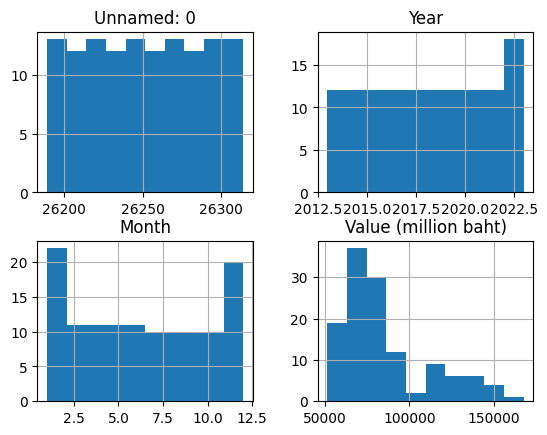

In [ ]:
us = pd.read_csv('united states.csv')
us.hist()

<Axes: >

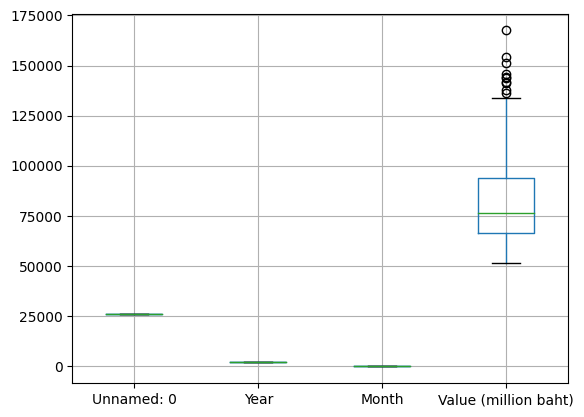

In [ ]:
us.boxplot()

In [ ]:
us.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 126 entries, 0 to 125
Data columns (total 5 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Unnamed: 0            126 non-null    int64  
 1   Country               126 non-null    object 
 2   Year                  126 non-null    int64  
 3   Month                 126 non-null    int64  
 4   Value (million baht)  126 non-null    float64
dtypes: float64(1), int64(3), object(1)
memory usage: 5.0+ KB


In [ ]:
def find_outlier(data):
  Q1 = np.percentile(data, 25)
  Q3 = np.percentile(data, 75)
  IQR = Q3 - Q1
  lower = Q1 - 1.5 * IQR
  upper = Q3 + 1.5 * IQR
  outlier = data[(data < lower) | (data > upper) ]
  return outlier

outlier_us = find_outlier(us['Value (million baht)'])
print("Outlier in Value:")
print(outlier_us)
# print("Lower:",lower, "Upper: ",upper)
# จำนวน rows ที่มี outlier
outlier_count = len(outlier_us)

# จำนวน rows ทั้งหมด
total_rows = len(us)

# คำนวณเปอร์เซ็นต์ของ rows ที่มี outlier
percentage_outlier = (outlier_count / total_rows) * 100

print(f"เปอร์เซ็นต์ของ rows ที่มี outlier: {percentage_outlier:.2f}%")

Outlier in Value:
110    142000.860144
112    136302.453829
113    151213.740444
115    145894.770244
116    167494.484431
118    137928.325686
119    141462.250385
122    154131.730225
124    144550.636818
125    144031.651159
Name: Value (million baht), dtype: float64
เปอร์เซ็นต์ของ rows ที่มี outlier: 7.94%


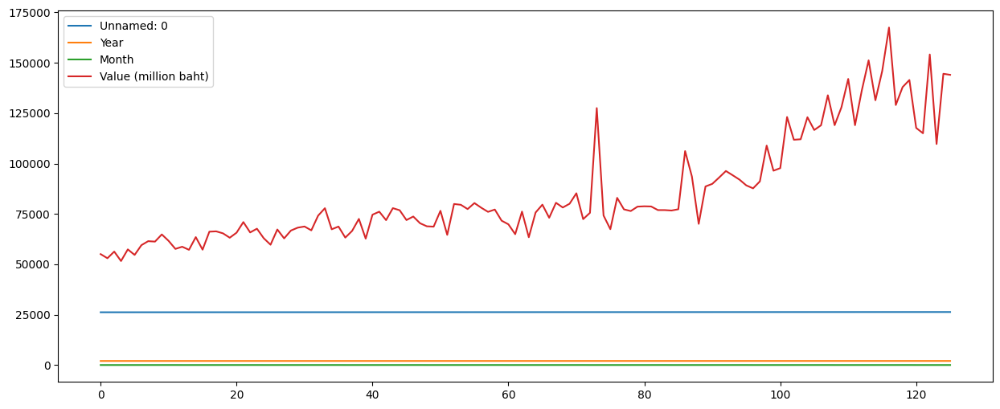

In [ ]:
us.plot(figsize=(15, 6))
plt.show()

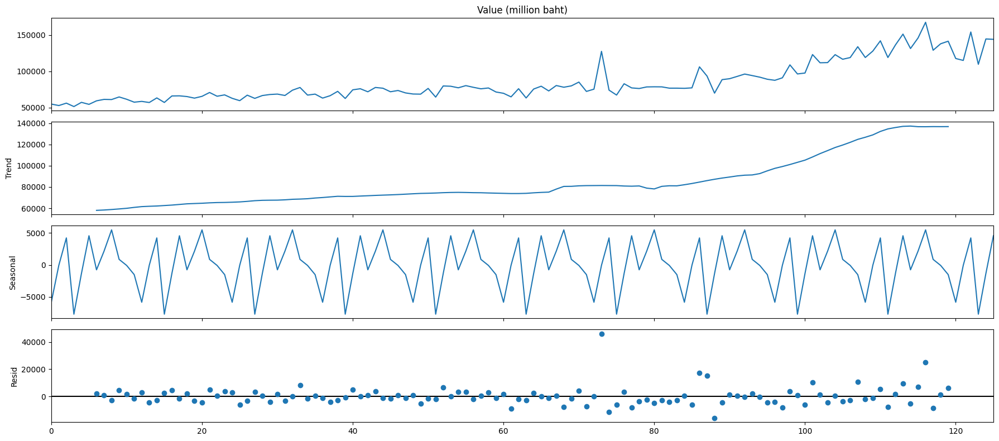

In [ ]:
# แปลงคอลัมน์ 'Month' เป็นข้อความ
us['Month'] = us['Month'].astype(str)

# แปลงคอลัมน์ 'Year' เป็นข้อความ
us['Year'] = us['Year'].astype(str)

# แปลงคอลัมน์ 'Month Year' เป็นรูปแบบ '01-2020'
us['Month Year'] = us['Month'].str.zfill(2) + '-' + us['Year']

# แปลงคอลัมน์ 'Month Year' เป็น DatetimeIndex และระบุความถี่เป็นรายเดือน ('M')
us_datetime= us.set_index(pd.to_datetime(us['Month Year'], format='%m-%Y', errors='coerce'))

rcParams['figure.figsize'] = (18, 8)  # กำหนดขนาดกราฟใหญ่ขึ้น
decomposition = sm.tsa.seasonal_decompose(us['Value (million baht)'], model='additive', period=12)
fig = decomposition.plot()
plt.show()

## Check stationary test

In [ ]:
#Integrated (d)
from statsmodels.tsa.stattools import adfuller
def adf_test(timeseries):
    print ('Results of Dickey-Fuller Test:')
    dftest = adfuller(timeseries, autolag='AIC')
    dfoutput = pd.Series(dftest[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
    for key,value in dftest[4].items():
        dfoutput['Critical Value (%s)'%key] = value
    print (dfoutput)
# Call the function and run the test

adf_test(us['Value (million baht)'])

Results of Dickey-Fuller Test:
Test Statistic                  -0.093928
p-value                          0.950040
#Lags Used                       2.000000
Number of Observations Used    123.000000
Critical Value (1%)             -3.484667
Critical Value (5%)             -2.885340
Critical Value (10%)            -2.579463
dtype: float64


In [ ]:
us_new = us_datetime.copy()
us_new

,Unnamed: 0,Country,Year,Month,Value (million baht),Month Year
Month Year,,,,,,
2013-01-01,26189,UNITED STATES,2013,1,55047.929916,01-2013
2013-02-01,26190,UNITED STATES,2013,2,53002.821919,02-2013
2013-03-01,26191,UNITED STATES,2013,3,56302.374739,03-2013
2013-04-01,26192,UNITED STATES,2013,4,51619.420458,04-2013
2013-05-01,26193,UNITED STATES,2013,5,57396.672862,05-2013
...,...,...,...,...,...,...
2023-02-01,26310,UNITED STATES,2023,2,115024.148330,02-2023
2023-03-01,26311,UNITED STATES,2023,3,154131.730225,03-2023
2023-04-01,26312,UNITED STATES,2023,4,109708.663921,04-2023


## Differencing

p-Values:2.192366298759838e-30


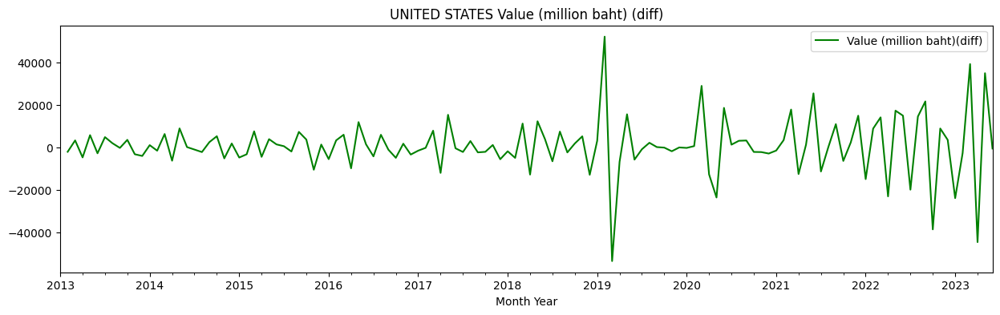

In [ ]:
#First difference
us_new['Value (million baht)_diff'] = us_new['Value (million baht)'].diff(1)
us_new['Value (million baht)_diff'].plot(color = 'green', figsize = (15,4))
plt.legend(['Value (million baht)(diff)'])
plt.title('UNITED STATES Value (million baht) (diff)')

us_new_adf = adfuller(us_new['Value (million baht)_diff'].dropna(), autolag = 'AIC')
print('p-Values:' + str(us_new_adf[1]))

## Model 1 & LOOCV

In [ ]:
column = ['Value (million baht)_diff','Value (million baht)']
us_newcolumn = us_new[column]
us_newcolumn

,Value (million baht)_diff,Value (million baht)
Month Year,,
2013-01-01,NaN,55047.929916
2013-02-01,-2045.107997,53002.821919
2013-03-01,3299.552820,56302.374739
2013-04-01,-4682.954281,51619.420458
2013-05-01,5777.252404,57396.672862
...,...,...
2023-02-01,-2656.261766,115024.148330
2023-03-01,39107.581895,154131.730225
2023-04-01,-44423.066304,109708.663921


In [ ]:
# แบ่งข้อมูลออกเป็น 125 rows สำหรับ training และ 1 rows สำหรับ testing
us_newcolumn_train = us_newcolumn.iloc[:125]
us_newcolumn_test = us_newcolumn.iloc[125:]

# กำหนดช่วงของลำดับ
p_range = range(0, 2)
d_range = range(0, 2)
q_range = range(0, 2)

# กำหนดช่วงของลำดับฤดูกาล
P_range = range(0, 2)
D_range = range(0, 2)
Q_range = range(0, 2)

# สร้างพจนานุกรมสำหรับเก็บค่าพารามิเตอร์
param_grid = dict(
    p=p_range,
    d=d_range,
    q=q_range,
    P=P_range,
    D=D_range,
    Q=Q_range,
)

# เลือกโมเดลที่ดีที่สุดโดยใช้ AIC
best_model = None
best_aic = float("inf")

for p in param_grid['p']:
    for d in param_grid['d']:
        for q in param_grid['q']:
            for P in param_grid['P']:
                for D in param_grid['D']:
                    for Q in param_grid['Q']:
                        order = (p, d, q)
                        seasonal_order = (P, D, Q, 12)

                        # สร้างโมเดล SARIMA
                        sarima_model_us_newcolumn = SARIMAX(us_newcolumn_train['Value (million baht)_diff'], order=order, seasonal_order=seasonal_order, enforce_stationarity=False)

                        # ฝึกโมเดล
                        sarima_fit_us_newcolumn = sarima_model_us_newcolumn.fit()

                        # คำนวณ AIC
                        aic = sarima_fit_us_newcolumn.aic

                        # บันทึกโมเดลที่มี AIC ต่ำสุด
                        if aic < best_aic:
                            best_model = sarima_fit_us_newcolumn
                            best_aic = aic
                            best_param = (p, d, q, P, D, Q)

# แสดงค่าพารามิเตอร์ที่ดีที่สุด
print("Best Parameters:", best_param)
print("Best AIC:", best_aic)

Best Parameters: (0, 0, 1, 0, 1, 1)
Best AIC: 2128.135568005826


In [ ]:
p = d = q = range(0, 2)
pdq = list(itertools.product(p, d, q))
seasonal_pdq = [(x[0], x[1], x[2], 12) for x in list(itertools.product(p, d, q))]
print('Examples of parameter combinations for Seasonal ARIMA...')
print('SARIMAX: {} x {}'.format(pdq[1], seasonal_pdq[1]))
print('SARIMAX: {} x {}'.format(pdq[1], seasonal_pdq[2]))
print('SARIMAX: {} x {}'.format(pdq[2], seasonal_pdq[3]))
print('SARIMAX: {} x {}'.format(pdq[2], seasonal_pdq[4]))

Examples of parameter combinations for Seasonal ARIMA...
SARIMAX: (0, 0, 1) x (0, 0, 1, 12)
SARIMAX: (0, 0, 1) x (0, 1, 0, 12)
SARIMAX: (0, 1, 0) x (0, 1, 1, 12)
SARIMAX: (0, 1, 0) x (1, 0, 0, 12)


In [ ]:
for param in pdq:
    for param_seasonal in seasonal_pdq:
        try:
            mod = sm.tsa.statespace.SARIMAX(us_newcolumn_train['Value (million baht)_diff'],
                                            order=param,
                                            seasonal_order=param_seasonal,
                                            enforce_stationarity=False,
                                            enforce_invertibility=False)
            results = mod.fit()
            print('ARIMA{}x{}12 - AIC:{}'.format(param, param_seasonal, results.aic))
        except Exception as e:
            print(e)
            continue

ARIMA(0, 0, 0)x(0, 0, 0, 12)12 - AIC:2705.158702792087
ARIMA(0, 0, 0)x(0, 0, 1, 12)12 - AIC:2453.880284181346
ARIMA(0, 0, 0)x(0, 1, 0, 12)12 - AIC:2476.9045103579824
ARIMA(0, 0, 0)x(0, 1, 1, 12)12 - AIC:2200.250949952975
ARIMA(0, 0, 0)x(1, 0, 0, 12)12 - AIC:2469.4044001721827
ARIMA(0, 0, 0)x(1, 0, 1, 12)12 - AIC:2440.107950822792
ARIMA(0, 0, 0)x(1, 1, 0, 12)12 - AIC:2223.693394028714
ARIMA(0, 0, 0)x(1, 1, 1, 12)12 - AIC:2198.8322949487338
ARIMA(0, 0, 1)x(0, 0, 0, 12)12 - AIC:2628.084181421903
ARIMA(0, 0, 1)x(0, 0, 1, 12)12 - AIC:2377.1179662975496
ARIMA(0, 0, 1)x(0, 1, 0, 12)12 - AIC:2404.165373602676
ARIMA(0, 0, 1)x(0, 1, 1, 12)12 - AIC:2128.1355734032463
ARIMA(0, 0, 1)x(1, 0, 0, 12)12 - AIC:2416.5986525461635
ARIMA(0, 0, 1)x(1, 0, 1, 12)12 - AIC:2367.3751140712748
ARIMA(0, 0, 1)x(1, 1, 0, 12)12 - AIC:2180.3435395122647
ARIMA(0, 0, 1)x(1, 1, 1, 12)12 - AIC:2130.015822512559
ARIMA(0, 1, 0)x(0, 0, 0, 12)12 - AIC:2815.213330528792
ARIMA(0, 1, 0)x(0, 0, 1, 12)12 - AIC:2551.6394624784793
A

In [ ]:
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error

# ทำนายค่าสำหรับชุดข้อมูลทดสอบ
y_pred_us = results.predict(start=us_newcolumn_test.index[0], end=us_newcolumn_test.index[-1])

# คำนวณ MAE และ RMSE และ MSE
mae_us = mean_absolute_error(us_newcolumn_test['Value (million baht)_diff'], y_pred_us)
rmse_us = mean_squared_error(us_newcolumn_test['Value (million baht)_diff'], y_pred_us) ** 0.5
mse_us = rmse_us ** 2

# แสดงค่า MAE และ RMSE
print("MAE:", mae_us)
print("RMSE:", rmse_us)
print("MSE:", mse_us)

MAE: 2648.5451343477835
RMSE: 2648.5451343477835
MSE: 7014791.328677318


In [ ]:
mod_us = sm.tsa.statespace.SARIMAX(us_newcolumn['Value (million baht)'],
                                order=(0, 1, 1),
                                seasonal_order=(0, 1, 1, 12),
                                enforce_invertibility=False)
results_us = mod_us.fit()
print(results_us.summary().tables[1])

                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.5867      0.063     -9.265      0.000      -0.711      -0.463
ma.S.L12      -0.6485      0.090     -7.181      0.000      -0.826      -0.472
sigma2      1.573e+08   3.05e-10   5.15e+17      0.000    1.57e+08    1.57e+08


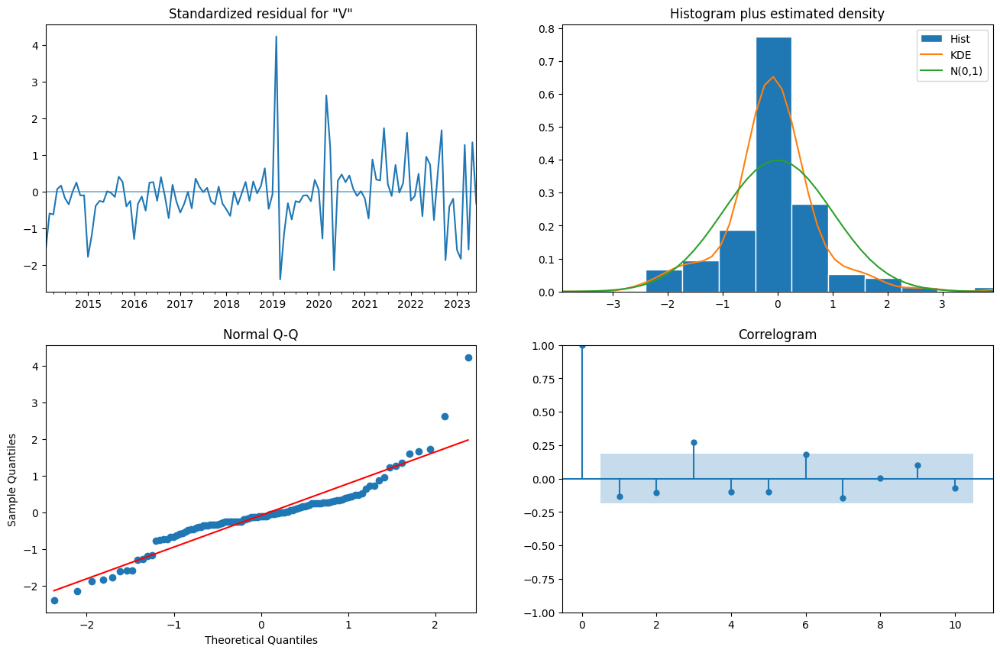

In [ ]:
results_us.plot_diagnostics(figsize=(16, 10))
plt.show()

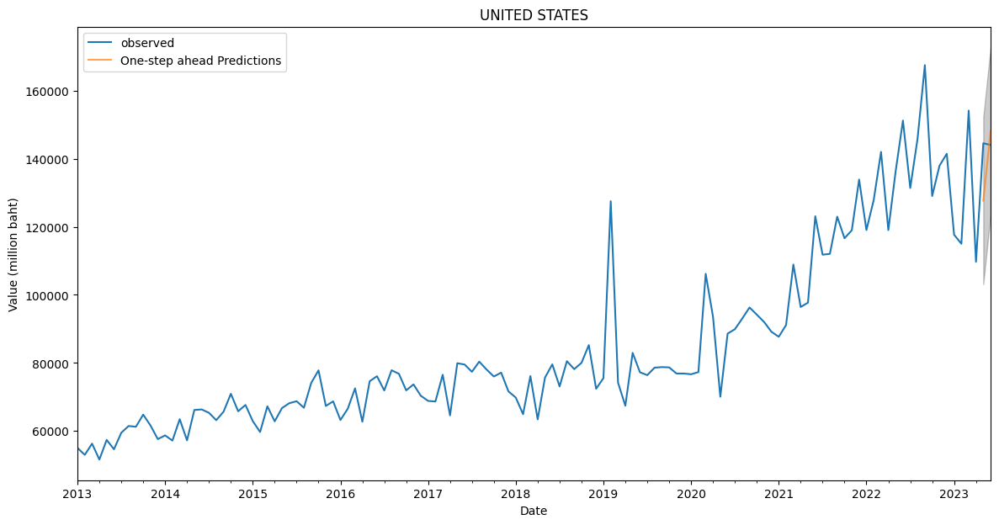

In [ ]:
pred_us = results_us.get_prediction(start=pd.to_datetime('2023-05-01'), dynamic=False)
pred_ci_us = pred_us.conf_int()
ax = us_newcolumn['Value (million baht)']['2013':].plot(label='observed')
pred_us.predicted_mean.plot(ax=ax, label='One-step ahead Predictions', alpha=.7, figsize=(14, 7))
ax.fill_between(pred_ci_us.index,
                pred_ci_us.iloc[:, 0],
                pred_ci_us.iloc[:, 1], color='k', alpha=.2)
ax.set_xlabel('Date')
ax.set_ylabel('Value (million baht)')
ax.set_title('UNITED STATES')
plt.legend()
plt.show()

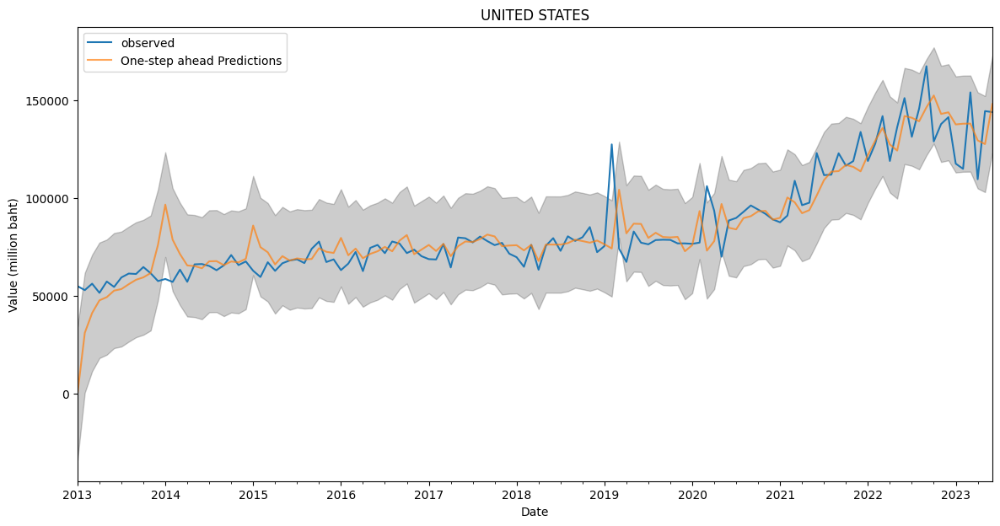

In [ ]:
pred_us = results_us.get_prediction(start=pd.to_datetime('2013-01-01'), dynamic=False)
pred_ci_us = pred_us.conf_int()
ax = us_newcolumn['Value (million baht)']['2013':].plot(label='observed')
pred_us.predicted_mean.plot(ax=ax, label='One-step ahead Predictions', alpha=.7, figsize=(14, 7))
ax.fill_between(pred_ci_us.index,
                pred_ci_us.iloc[:, 0],
                pred_ci_us.iloc[:, 1], color='k', alpha=.2)
ax.set_xlabel('Date')
ax.set_ylabel('Value (million baht)')
ax.set_title('UNITED STATES')
plt.legend()
plt.show()

In [ ]:
forecasted_us = pred_us.predicted_mean
mse2 = ((forecasted_us - us_newcolumn_test['Value (million baht)']) ** 2).mean()
forecasted_g3 = forecasted_us**(1/2)
mape_g = (np.abs(us_newcolumn_test['Value (million baht)'] - forecasted_us) / np.abs(us_newcolumn_test['Value (million baht)'])).mean() * 100
print('The Mean Squared Error of forecasts is {}'.format(round(mse2, 2)))
print('The Root Mean Squared Error of forecasts is {}'.format(round(np.sqrt(mse2), 2)))
print('Mean Absolute Percentage Error (MAPE): {:.2f}%'.format(mape_g))

The Mean Squared Error of forecasts is 16956318.93
The Root Mean Squared Error of forecasts is 4117.81
Mean Absolute Percentage Error (MAPE): 2.86%


### Forecast

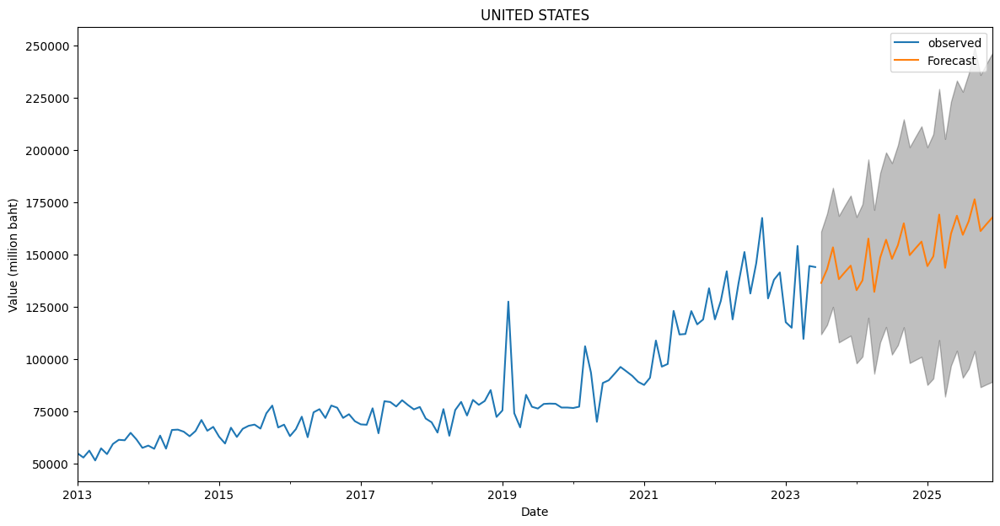

In [ ]:
pred_uc_us = results_us.get_forecast(steps=30)
pred_ci_us = pred_uc_us.conf_int()
ax = us_newcolumn['Value (million baht)'].plot(label='observed', figsize=(14, 7))
pred_uc_us.predicted_mean.plot(ax=ax, label='Forecast')
ax.fill_between(pred_ci_us.index,
                pred_ci_us.iloc[:, 0],
                pred_ci_us.iloc[:, 1], color='k', alpha=.25)
ax.set_xlabel('Date')
ax.set_ylabel('Value (million baht)')
ax.set_title('UNITED STATES')
plt.legend()
plt.show()

In [ ]:
old_us = ['Value (million baht)']
old_us_data = us_newcolumn[old_us]
old_us_data

,Value (million baht)
Month Year,
2013-01-01,55047.929916
2013-02-01,53002.821919
2013-03-01,56302.374739
2013-04-01,51619.420458
2013-05-01,57396.672862
...,...
2023-02-01,115024.148330
2023-03-01,154131.730225
2023-04-01,109708.663921


In [ ]:
forecast_us = pred_uc_us.predicted_mean
print(forecast_us)

2023-07-01    136460.277191
2023-08-01    142981.912668
2023-09-01    153456.134268
2023-10-01    138236.908608
2023-11-01    141542.520403
2023-12-01    144705.778307
2024-01-01    132986.023974
2024-02-01    137667.556065
2024-03-01    157633.983277
2024-04-01    132179.213764
2024-05-01    148521.656037
2024-06-01    157089.930815
2024-07-01    147951.749287
2024-08-01    154473.384765
2024-09-01    164947.606365
2024-10-01    149728.380705
2024-11-01    153033.992499
2024-12-01    156197.250404
2025-01-01    144477.496071
2025-02-01    149159.028162
2025-03-01    169125.455374
2025-04-01    143670.685861
2025-05-01    160013.128134
2025-06-01    168581.402912
2025-07-01    159443.221384
2025-08-01    165964.856862
2025-09-01    176439.078462
2025-10-01    161219.852802
2025-11-01    164525.464596
2025-12-01    167688.722501
Freq: MS, Name: predicted_mean, dtype: float64


In [ ]:
forecast_us_df = pd.DataFrame(forecast_us)  # แปลงเป็น DataFrame
# เปลี่ยนชื่อหัวตาราง (column names)
new_column_names = {
    'predicted_mean': 'Value (million baht)'}

forecast_us_df = forecast_us_df.rename(columns=new_column_names)
forecast_us_df

,Value (million baht)
2023-07-01,136460.277191
2023-08-01,142981.912668
2023-09-01,153456.134268
2023-10-01,138236.908608
2023-11-01,141542.520403
2023-12-01,144705.778307
2024-01-01,132986.023974
2024-02-01,137667.556065
2024-03-01,157633.983277
2024-04-01,132179.213764


In [ ]:
import pandas as pd

# แปลง old_us_data และ forecast_us_df เป็น DataFrame
old_us_data_df = pd.DataFrame(old_us_data)
forecast_us_df = pd.DataFrame(forecast_us_df)

# รวมข้อมูลด้วย concat
new_us = pd.concat([old_us_data_df, forecast_us_df])

# แสดงผลลัพธ์
print(new_us)


            Value (million baht)
2013-01-01          55047.929916
2013-02-01          53002.821919
2013-03-01          56302.374739
2013-04-01          51619.420458
2013-05-01          57396.672862
...                          ...
2025-08-01         165964.856862
2025-09-01         176439.078462
2025-10-01         161219.852802
2025-11-01         164525.464596
2025-12-01         167688.722501

[156 rows x 1 columns]


In [ ]:
new_us

,Value (million baht)
2013-01-01,55047.929916
2013-02-01,53002.821919
2013-03-01,56302.374739
2013-04-01,51619.420458
2013-05-01,57396.672862
...,...
2025-08-01,165964.856862
2025-09-01,176439.078462
2025-10-01,161219.852802
2025-11-01,164525.464596


In [ ]:
new_us.to_csv('new_us.csv')

## Model2

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score


# Load the dataset
data = pd.read_csv('/content/united states.csv')

# Display the first few rows of the dataset
data.head()

,Unnamed: 0,Country,Year,Month,Value (million baht)
0,26189,UNITED STATES,2013,1,55047.929916
1,26190,UNITED STATES,2013,2,53002.821919
2,26191,UNITED STATES,2013,3,56302.374739
3,26192,UNITED STATES,2013,4,51619.420458
4,26193,UNITED STATES,2013,5,57396.672862


<Axes: >

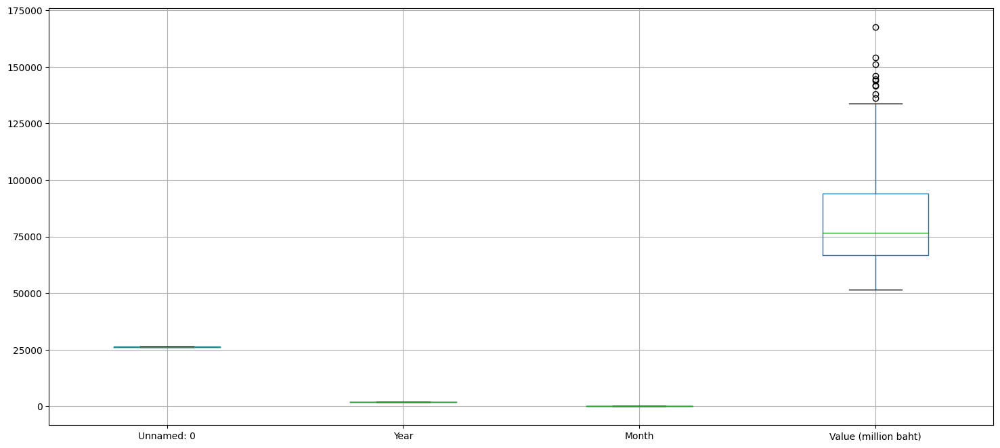

In [ ]:
data.boxplot()

In [ ]:
def find_outlier(data):
  Q1 = np.percentile(data, 25)
  Q3 = np.percentile(data, 75)
  IQR = Q3 - Q1
  lower = Q1 - 1.5 * IQR
  upper = Q3 + 1.5 * IQR
  outlier = data[(data < lower) | (data > upper) ]
  return outlier

outlier_data = find_outlier(data['Value (million baht)'])
print("Outlier in Value:")
print(outlier_data)
# print("Lower:", lower , "Upper: ", upper)

# จำนวน rows ที่มี outlier
outlier_count_data = len(outlier_data)

# จำนวน rows ทั้งหมด
total_rows = len(data)

# คำนวณเปอร์เซ็นต์ของ rows ที่มี outlier
percentage_outlier = (outlier_count_data / total_rows) * 100

print(f"เปอร์เซ็นต์ของ rows ที่มี outlier: {percentage_outlier:.2f}%")

Outlier in Value:
110    142000.860144
112    136302.453829
113    151213.740444
115    145894.770244
116    167494.484431
118    137928.325686
119    141462.250385
122    154131.730225
124    144550.636818
125    144031.651159
Name: Value (million baht), dtype: float64
เปอร์เซ็นต์ของ rows ที่มี outlier: 7.94%


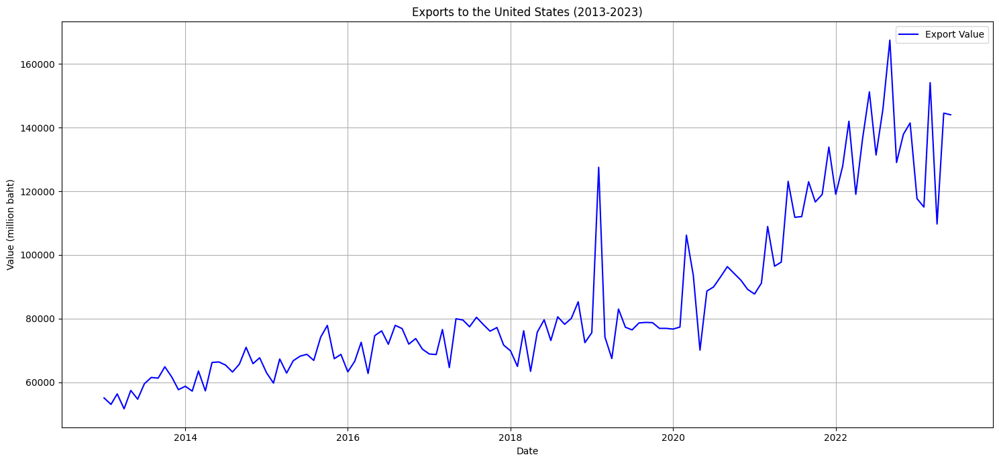

In [ ]:
import matplotlib.pyplot as plt

# Convert Year and Month columns to a datetime format for easier plotting
data['Date'] = pd.to_datetime(data[['Year', 'Month']].assign(DAY=1))

# Plotting the data
plt.figure(figsize=(15, 7))
plt.plot(data['Date'], data['Value (million baht)'], label='Export Value', color='blue')
plt.title('Exports to the United States (2013-2023)')
plt.xlabel('Date')
plt.ylabel('Value (million baht)')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

In [ ]:
#Integrated (d)
from statsmodels.tsa.stattools import adfuller
def adf_test(timeseries):
    print ('Results of Dickey-Fuller Test:')
    dftest = adfuller(timeseries, autolag='AIC')
    dfoutput = pd.Series(dftest[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
    for key,value in dftest[4].items():
        dfoutput['Critical Value (%s)'%key] = value
    print (dfoutput)
# Call the function and run the test

adf_test(data['Value (million baht)'])

Results of Dickey-Fuller Test:
Test Statistic                  -0.093928
p-value                          0.950040
#Lags Used                       2.000000
Number of Observations Used    123.000000
Critical Value (1%)             -3.484667
Critical Value (5%)             -2.885340
Critical Value (10%)            -2.579463
dtype: float64


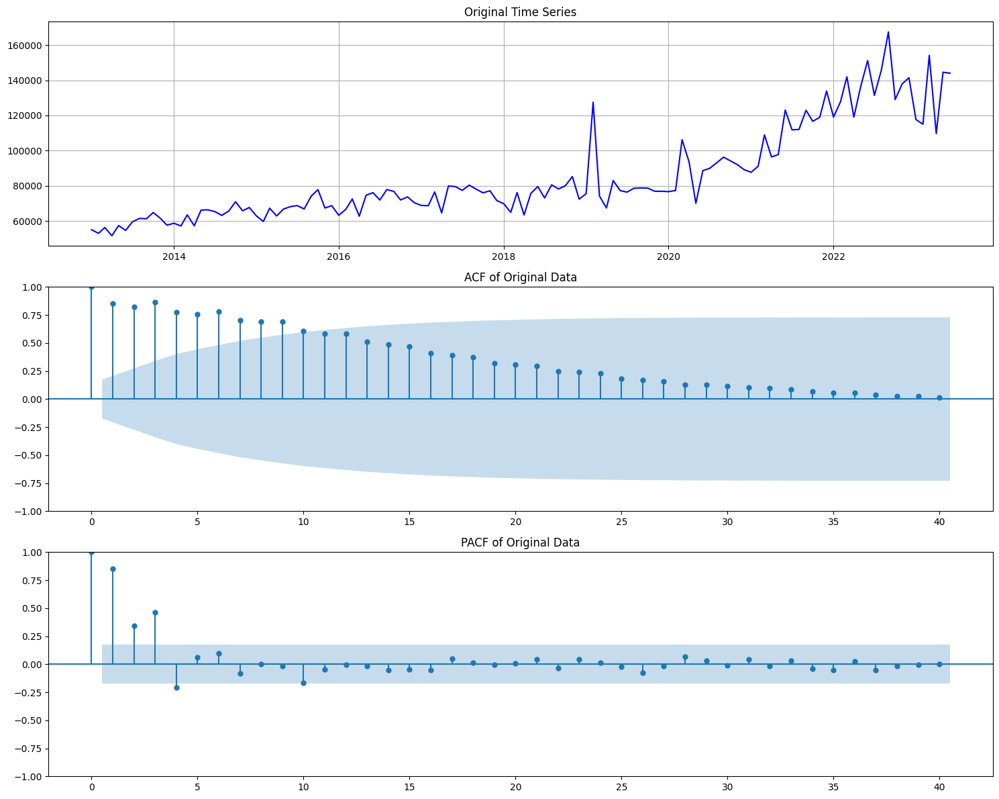

In [ ]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

# Prepare the data
X = data[['Year', 'Month']]
y = data['Value (million baht)']

# Split the data into training and testing sets (80% train, 20% test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, shuffle=False)

# Plotting the raw data
fig, ax = plt.subplots(3, figsize=(15, 12))

# Plotting the actual values
ax[0].plot(data['Date'], y, label='Original Data', color='blue')
ax[0].set_title('Original Time Series')
ax[0].grid(True)

# Plotting the ACF of the original data
plot_acf(y, lags=40, ax=ax[1], title="ACF of Original Data")

# Plotting the PACF of the original data
plot_pacf(y, lags=40, ax=ax[2], title="PACF of Original Data")

plt.tight_layout()
plt.show()

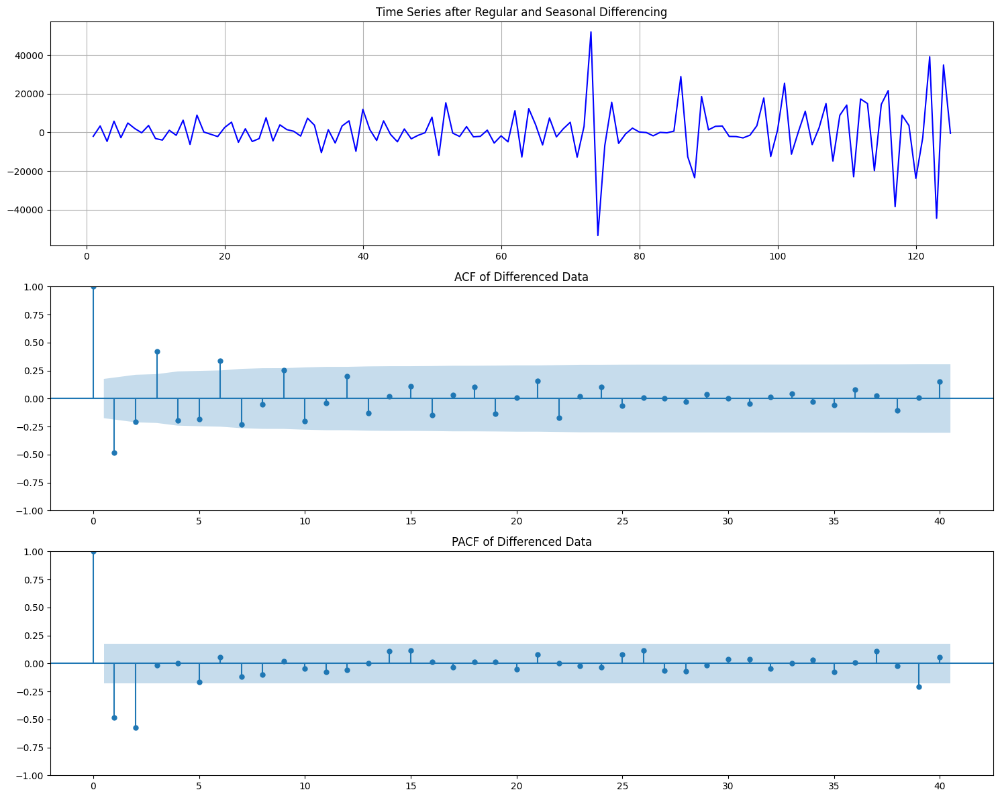

In [ ]:
# Differencing the data
diff_data = y.diff().dropna()  # Regular differencing
# seasonal_diff_data = diff_data.diff(12).dropna()  # Seasonal differencing

# Plotting the differenced data and its ACF and PACF
fig, ax = plt.subplots(3, figsize=(15, 12))

# Time series after differencing
ax[0].plot(diff_data.index, diff_data, label='Differenced Data', color='blue')
ax[0].set_title('Time Series after Regular and Seasonal Differencing')
ax[0].grid(True)

# ACF of differenced data
plot_acf(diff_data, lags=40, ax=ax[1], title="ACF of Differenced Data")

# PACF of differenced data
plot_pacf(diff_data, lags=40, ax=ax[2], title="PACF of Differenced Data")

plt.tight_layout()
plt.show()

In [ ]:
#Integrated (d)
from statsmodels.tsa.stattools import adfuller
def adf_test(timeseries):
    print ('Results of Dickey-Fuller Test:')
    dftest = adfuller(timeseries, autolag='AIC')
    dfoutput = pd.Series(dftest[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
    for key,value in dftest[4].items():
        dfoutput['Critical Value (%s)'%key] = value
    print (dfoutput)
# Call the function and run the test

adf_test(diff_data)

Results of Dickey-Fuller Test:
Test Statistic                -1.840103e+01
p-value                        2.192366e-30
#Lags Used                     1.000000e+00
Number of Observations Used    1.230000e+02
Critical Value (1%)           -3.484667e+00
Critical Value (5%)           -2.885340e+00
Critical Value (10%)          -2.579463e+00
dtype: float64


In [ ]:
# Find the best SARIMA parameters for the differenced data (assuming d=0 and D=0 since we manually differenced the data)

best_aic_diff = float("inf")
best_pdq_diff = None
best_seasonal_pdq_diff = None

# Adjust the pdq and seasonal_pdq values for the grid search
p = q = d = range(0, 2)
# d = [0]  # No additional differencing
pdq_diff = [(x[0], x[1], x[2]) for x in list(itertools.product(p, d, q))]
seasonal_pdq_diff = [(x[0], x[1], x[2], 12) for x in list(itertools.product(p, d, q))]

# Grid search for the best parameters for differenced data
for param in pdq_diff:
    for param_seasonal in seasonal_pdq_diff:
        try:
            mod_diff = SARIMAX(diff_data, order=param, seasonal_order=param_seasonal, enforce_stationarity=False, enforce_invertibility=False)
            results_diff = mod_diff.fit(disp=0)
            if results_diff.aic < best_aic_diff:
                best_aic_diff = results_diff.aic
                best_pdq_diff = param
                best_seasonal_pdq_diff = param_seasonal
        except:
            continue

best_aic_diff, best_pdq_diff, best_seasonal_pdq_diff

(2127.9040557091125, (0, 0, 1), (0, 1, 1, 12))

### LOOCV

In [ ]:
# กำหนดจุดเริ่มต้นสำหรับ LOOCV
start_index = 15

mse_scores_loocv_ori = []
predictions_loocv_ori = []  # เพิ่มรายการเพื่อเก็บค่าทำนาย

# Iterate through the differenced dataset starting from the 25th data point for LOOCV
for i in range(start_index, len(y) - 1):
    y_train_loocv_ori, y_test_loocv_ori = y[:i], y[i:i+1]

    # Fit the SARIMA model with the best parameters for differenced data
    model_loocv_ori = SARIMAX(y_train_loocv_ori, order=(0, 1, 1), seasonal_order=(0, 1, 1, 12), enforce_stationarity=False, enforce_invertibility=False)
    results_loocv_ori = model_loocv_ori.fit(disp=0)

    # Predict on the test set
    pred_loocv_ori = results_loocv_ori.predict(start=len( y_train_loocv_ori), end=len( y_train_loocv_ori), dynamic=False)

    # Calculate and store the MSE for this iteration
    mse_scores_loocv_ori.append(mean_squared_error(y_test_loocv_ori, pred_loocv_ori))

    # Store the predictions
    predictions_loocv_ori.append(pred_loocv_ori.values[0])  # เพิ่มค่าทำนายลงในรายการ

# Calculate the average MSE over all LOOCV iterations for differenced data
avg_mse_loocv_ori = sum(mse_scores_loocv_ori) / len(mse_scores_loocv_ori)

# Print the predictions
print("Predictions:", predictions_loocv_ori)

# Print the average MSE
print("Average MSE:", avg_mse_loocv_ori)

Predictions: [58806.519175, 63036.690216999996, 63438.854529, 70731.57136485161, 68595.06446032877, 62295.160277592804, 69914.47794082988, 67923.4156323202, 61487.87847518486, 68434.33338268998, 62980.203737523545, 66996.97114158142, 60960.06576554227, 73010.42360661556, 64428.65398182445, 68994.05482951501, 69058.4494039673, 69391.46224352015, 74606.49329434536, 72962.59090134133, 70496.75201649162, 70566.65537992261, 61004.27824262758, 71354.48485676193, 67118.98999305618, 70229.25964721758, 72825.35016326657, 74320.27131351506, 71722.17818719213, 79922.1436301728, 82804.15643666292, 70470.91179934453, 72655.02969009693, 67389.80463460901, 69681.51308373462, 75623.64522993627, 66189.70570171221, 77461.80072214104, 79890.69884875174, 75561.23195980354, 82179.36768545631, 80484.45621558503, 74704.79253729757, 76956.86992387152, 73696.77509850138, 71421.93385449967, 70649.15167011166, 79123.80615974581, 65534.84480612857, 79249.20330045294, 77983.96388164732, 76165.57176499961, 78486.23

In [ ]:
results_loocv_ori = model_loocv_ori.fit()
print( results_loocv_ori.summary().tables[1])

                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.6714      0.075     -8.996      0.000      -0.818      -0.525
ma.S.L12      -0.6019      0.079     -7.661      0.000      -0.756      -0.448
sigma2      1.627e+08   2.24e-10   7.25e+17      0.000    1.63e+08    1.63e+08


In [ ]:
import numpy as np

# Calculate MAPE
def mean_absolute_percentage_error(y_true, y_pred):
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

# Calculate MAE, RMSE, and MAPE
mae_loocv_ori = np.mean(np.abs(np.array(y_test_loocv_ori) - np.array(predictions_loocv_ori)))
rmse_loocv_ori = np.sqrt(np.mean(np.square(np.array(y_test_loocv_ori) - np.array(predictions_loocv_ori))))
mape_loocv_ori = mean_absolute_percentage_error(np.array(y_test_loocv_ori), np.array(predictions_loocv_ori))

# Print the results
print("MAE (Mean Absolute Error):", mae_loocv_ori)
print("RMSE (Root Mean Square Error):", rmse_loocv_ori)
print("MAPE (Mean Absolute Percentage Error):", mape_loocv_ori)

MAE (Mean Absolute Error): 56690.78268105183
RMSE (Root Mean Square Error): 61560.32250240184
MAPE (Mean Absolute Percentage Error): 39.218632258555694


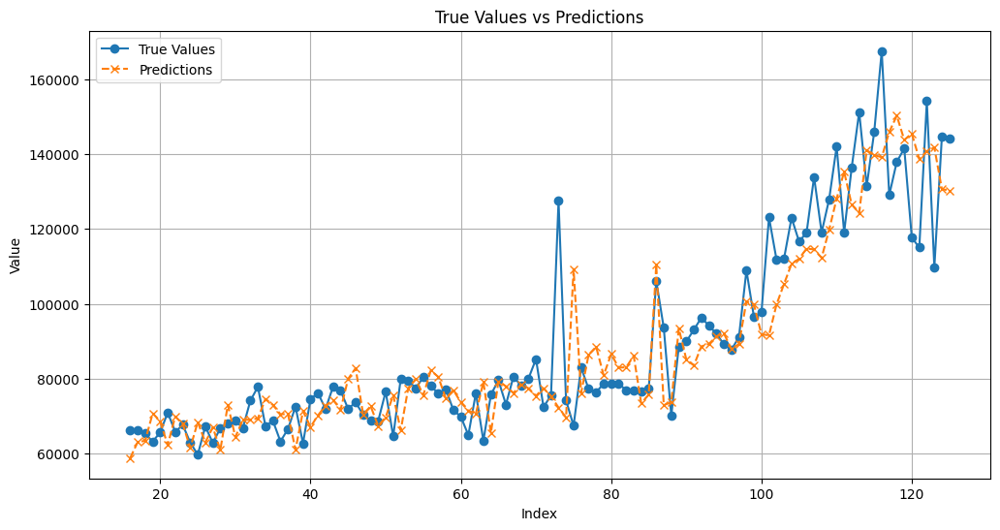

In [ ]:
import matplotlib.pyplot as plt

# ค่าจริง
true_values_y = y[start_index+1:]  # นี่คือค่าจริงที่เราทดสอบด้วย LOOCV

# พล็อตกราฟค่าจริงและค่าทำนาย
plt.figure(figsize=(12, 6))
plt.plot(true_values_y.index, true_values_y, label='True Values', marker='o')
plt.plot(true_values_y.index, predictions_loocv_ori, label='Predictions', marker='x', linestyle='dashed')
plt.xlabel('Index')
plt.ylabel('Value')
plt.title('True Values vs Predictions')
plt.legend()
plt.grid(True)
plt.show()

### Forecast

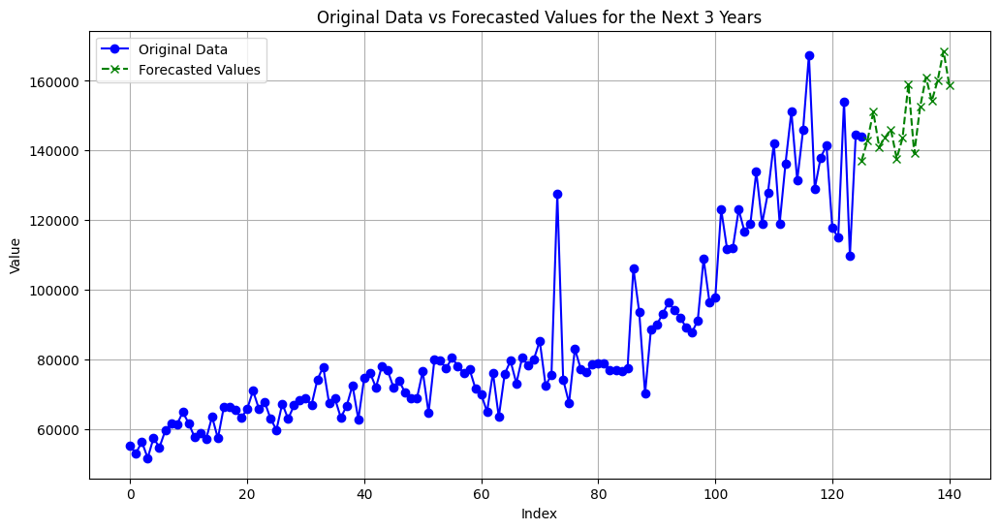

In [ ]:
def forecast_sarima_with_differenced_data(y, start_index, order, seasonal_order):
  """Forecasts the next `start_index` years using the SARIMA model with differenced data.

  Args:
    y: A Pandas Series containing the time series data.
    start_index: The index of the first data point to forecast.
    order: The order of the SARIMA model (p, d, q).
    seasonal_order: The seasonal order of the SARIMA model (P, D, Q, s).

  Returns:
    A Pandas Series containing the forecasted values.
  """

  # Difference the data.
  diff_data = y.diff().dropna()

  # Fit the SARIMA model to the differenced data.
  model_loocv_ori = SARIMAX(diff_data, order=order, seasonal_order=seasonal_order, enforce_stationarity=False, enforce_invertibility=False)
  results_loocv_ori = model_loocv_ori.fit(disp=0)

  # Check if the forecast is empty.
  if not diff_data.empty:
    # Make predictions for the next `start_index` years.
    forecast_loocv_ori = results_loocv_ori.predict(start=len(diff_data), end=len(diff_data) + start_index, dynamic=False)

    # Convert the forecasted differenced values back to the original scale.
    forecasted_values_y = forecast_loocv_ori.cumsum() + y.iloc[-1]  # Use iloc to access the last value in the original data.
    return forecasted_values_y
  else:
    # Raise an error if the forecast is empty.
    raise ValueError("The SARIMA model failed to fit the data or the forecast is beyond the end of the dataset.")

# Forecast the next 3 years using the SARIMA model with differenced data.
try:
    forecasted_values_y = forecast_sarima_with_differenced_data(y, start_index=15, order=(0, 1, 1), seasonal_order=(0, 1, 1, 12))

    # Plot the forecasted values.
    import matplotlib.pyplot as plt

    # Plot both original data and forecasted data
    plt.figure(figsize=(12, 6))
    plt.plot(y.index, y, label='Original Data', marker='o', color='blue')
    plt.plot(forecasted_values_y.index, forecasted_values_y, label='Forecasted Values', marker='x', linestyle='dashed', color='green')
    plt.xlabel('Index')
    plt.ylabel('Value')
    plt.title('Original Data vs Forecasted Values for the Next 3 Years')
    plt.legend()
    plt.grid(True)
    plt.show()
except ValueError as e:
    print(e)

In [ ]:
# Forecast the next 3 years.
start_index = 15
order = (0, 1, 1)
seasonal_order = (0, 1, 1, 12)
forecasted_values_y = forecast_sarima_with_differenced_data(y, start_index, order, seasonal_order)

# Print the forecasted values.
print(forecasted_values_y)

125    137086.321608
126    142853.442430
127    151091.620563
128    141047.259406
129    143737.451005
130    146030.699661
131    137702.738003
132    143601.647249
133    159112.970614
134    139144.392086
135    152511.336289
136    161017.044099
137    154234.783910
138    160164.974094
139    168566.221590
140    158684.929795
Name: predicted_mean, dtype: float64


# CHINA

array([[<Axes: title={'center': 'Unnamed: 0'}>,
        <Axes: title={'center': 'Year'}>],
       [<Axes: title={'center': 'Month'}>,
        <Axes: title={'center': 'Value (million baht)'}>]], dtype=object)

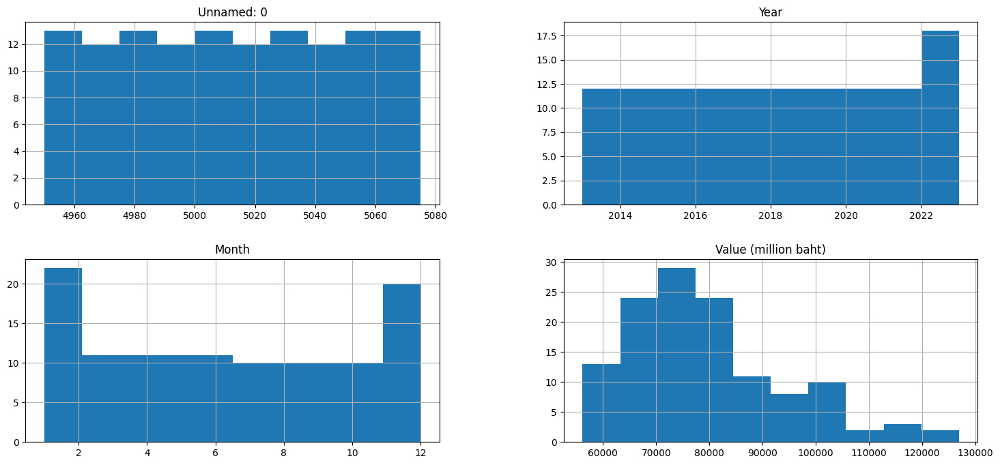

In [ ]:
cn = pd.read_csv('/content/china(new).csv')
cn.hist()

<Axes: >

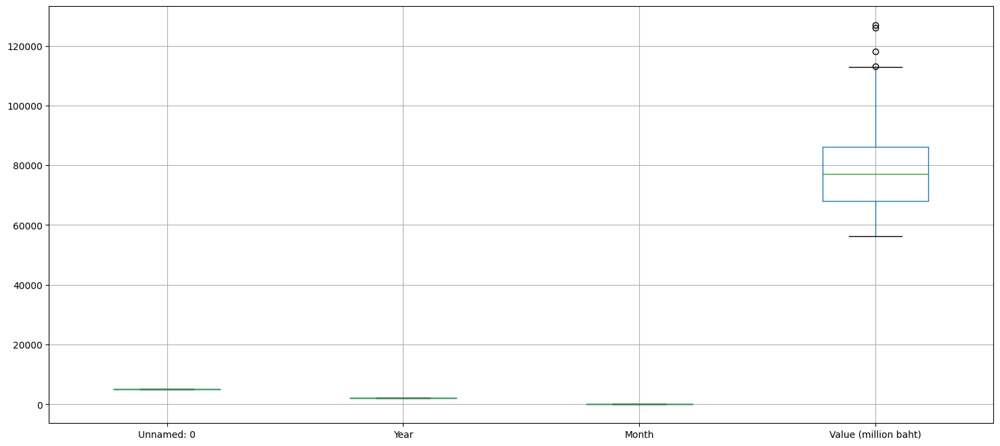

In [ ]:
cn.boxplot()

In [ ]:
cn.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 126 entries, 0 to 125
Data columns (total 5 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Unnamed: 0            126 non-null    int64  
 1   Country               126 non-null    object 
 2   Year                  126 non-null    int64  
 3   Month                 126 non-null    int64  
 4   Value (million baht)  126 non-null    float64
dtypes: float64(1), int64(3), object(1)
memory usage: 5.0+ KB


In [ ]:
def find_outlier(data):
  Q1 = np.percentile(data, 25)
  Q3 = np.percentile(data, 75)
  IQR = Q3 - Q1
  lower = Q1 - 1.5 * IQR
  upper = Q3 + 1.5 * IQR
  outlier = data[(data < lower) | (data > upper) ]
  return outlier

outlier_cn = find_outlier(cn['Value (million baht)'])
print("Outlier in Value:")
print(outlier_cn)
# print("Lower:",lower, "Upper: ",upper)
# จำนวน rows ที่มี outlier
outlier_count_cn = len(outlier_cn)

# จำนวน rows ทั้งหมด
total_rows_cn = len(cn)

# คำนวณเปอร์เซ็นต์ของ rows ที่มี outlier
percentage_outlier_cn = (outlier_count_cn / total_rows_cn) * 100

print(f"เปอร์เซ็นต์ของ rows ที่มี outlier: {percentage_outlier_cn:.2f}%")

Outlier in Value:
100    113208.534410
112    126878.844847
123    126029.931183
125    118027.852132
Name: Value (million baht), dtype: float64
เปอร์เซ็นต์ของ rows ที่มี outlier: 3.17%


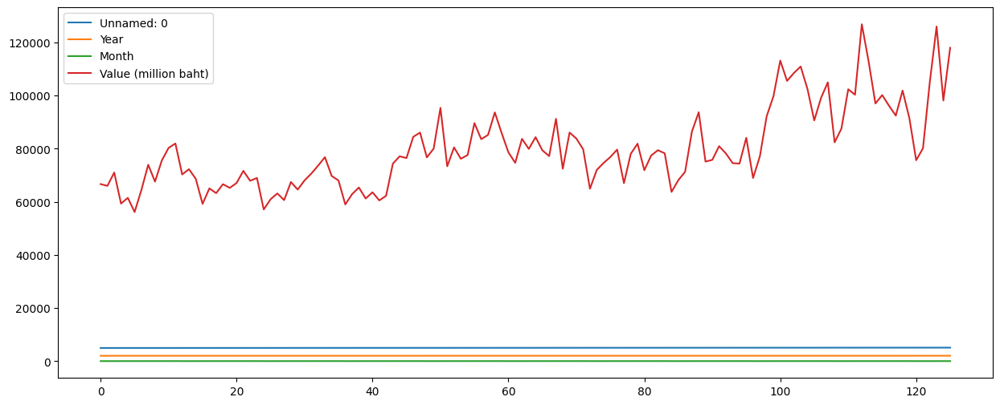

In [ ]:
cn.plot(figsize=(15, 6))
plt.show()

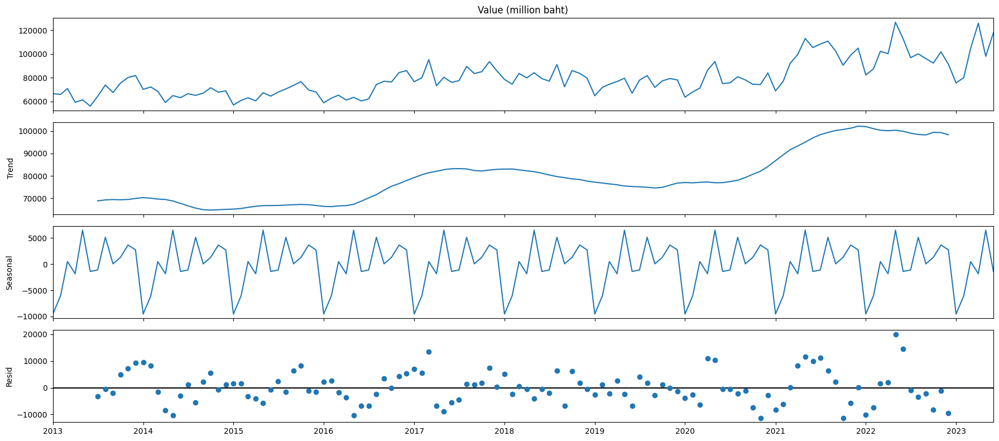

In [ ]:
# แปลงคอลัมน์ 'Month' เป็นข้อความ
cn['Month'] = cn['Month'].astype(str)

# แปลงคอลัมน์ 'Year' เป็นข้อความ
cn['Year'] = cn['Year'].astype(str)

# แปลงคอลัมน์ 'Month Year' เป็นรูปแบบ '01-2020'
cn['Month Year'] = cn['Month'].str.zfill(2) + '-' + cn['Year']

# แปลงคอลัมน์ 'Month Year' เป็น DatetimeIndex และระบุความถี่เป็นรายเดือน ('M')
cn_datetime= cn.set_index(pd.to_datetime(cn['Month Year'], format='%m-%Y', errors='coerce'))

rcParams['figure.figsize'] = (18, 8)  # กำหนดขนาดกราฟใหญ่ขึ้น
decomposition = sm.tsa.seasonal_decompose(cn_datetime['Value (million baht)'], model='additive', period=12)
fig = decomposition.plot()
plt.show()

## Check stationary test

In [ ]:
#Integrated (d)
from statsmodels.tsa.stattools import adfuller
def adf_test(timeseries):
    print ('Results of Dickey-Fuller Test:')
    dftest = adfuller(timeseries, autolag='AIC')
    dfoutput = pd.Series(dftest[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
    for key,value in dftest[4].items():
        dfoutput['Critical Value (%s)'%key] = value
    print (dfoutput)
# Call the function and run the test

adf_test(cn['Value (million baht)'])

Results of Dickey-Fuller Test:
Test Statistic                  -1.058336
p-value                          0.731398
#Lags Used                      13.000000
Number of Observations Used    112.000000
Critical Value (1%)             -3.490131
Critical Value (5%)             -2.887712
Critical Value (10%)            -2.580730
dtype: float64


In [ ]:
cn_new = cn_datetime.copy()
cn_new

,Unnamed: 0,Country,Year,Month,Value (million baht),Month Year
Month Year,,,,,,
2013-01-01,4950,CHINA,2013,1,66680.371682,01-2013
2013-02-01,4951,CHINA,2013,2,66007.388712,02-2013
2013-03-01,4952,CHINA,2013,3,71035.399590,03-2013
2013-04-01,4953,CHINA,2013,4,59357.664227,04-2013
2013-05-01,4954,CHINA,2013,5,61498.077507,05-2013
...,...,...,...,...,...,...
2023-02-01,5071,CHINA,2023,2,80168.335397,02-2023
2023-03-01,5072,CHINA,2023,3,105030.204780,03-2023
2023-04-01,5073,CHINA,2023,4,126029.931183,04-2023


## Differencing

p-Values:0.10399932890220615


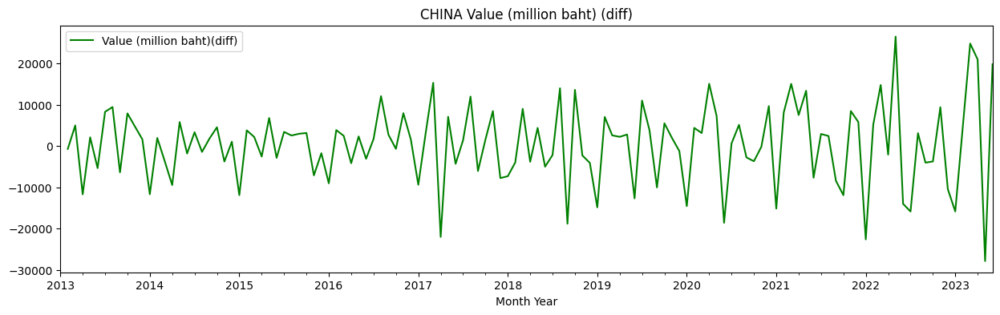

In [ ]:
#First difference
cn_new['Value (million baht)_diff'] = cn_new['Value (million baht)'].diff()
cn_new['Value (million baht)_diff'].plot(color = 'green', figsize = (15,4))
plt.legend(['Value (million baht)(diff)'])
plt.title('CHINA Value (million baht) (diff)')

cn_new_adf = adfuller(cn_new['Value (million baht)_diff'].dropna(), autolag = 'AIC')
print('p-Values:' + str(cn_new_adf[1]))

p-Values:2.2539954384281957e-17


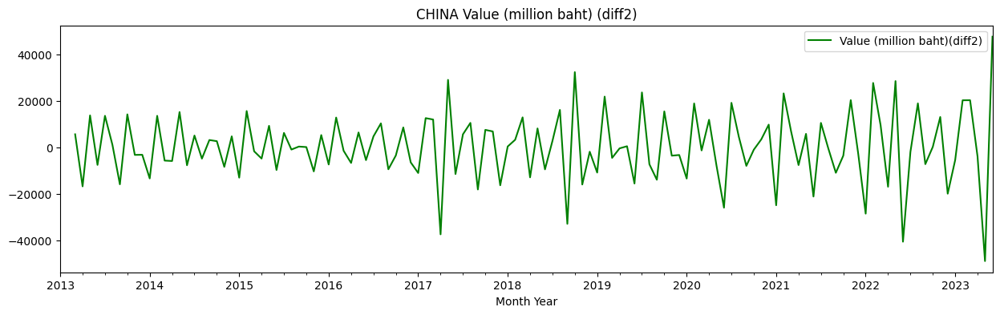

In [ ]:
#Second difference
cn_new['Value (million baht)_diff2'] = cn_new['Value (million baht)_diff'].diff()
cn_new['Value (million baht)_diff2'].plot(color = 'green', figsize = (15,4))
plt.legend(['Value (million baht)(diff2)'])
plt.title('CHINA Value (million baht) (diff2)')

cn_new_adf2 = adfuller(cn_new['Value (million baht)_diff2'].dropna(), autolag = 'AIC')
print('p-Values:' + str(cn_new_adf2[1]))

In [ ]:
cn_new

,Unnamed: 0,Country,Year,Month,Value (million baht),Month Year,Value (million baht)_diff,Value (million baht)_diff2
Month Year,,,,,,,,
2013-01-01,4950,CHINA,2013,1,66680.371682,01-2013,NaN,NaN
2013-02-01,4951,CHINA,2013,2,66007.388712,02-2013,-672.982970,NaN
2013-03-01,4952,CHINA,2013,3,71035.399590,03-2013,5028.010878,5700.993848
2013-04-01,4953,CHINA,2013,4,59357.664227,04-2013,-11677.735363,-16705.746241
2013-05-01,4954,CHINA,2013,5,61498.077507,05-2013,2140.413280,13818.148643
...,...,...,...,...,...,...,...,...
2023-02-01,5071,CHINA,2023,2,80168.335397,02-2023,4505.808186,20333.949282
2023-03-01,5072,CHINA,2023,3,105030.204780,03-2023,24861.869383,20356.061197
2023-04-01,5073,CHINA,2023,4,126029.931183,04-2023,20999.726403,-3862.142980


## Model 1 & LOOCV

In [ ]:
column = ['Value (million baht)_diff2','Value (million baht)']
cn_newcolumn = cn_new[column]
cn_newcolumn

,Value (million baht)_diff2,Value (million baht)
Month Year,,
2013-01-01,NaN,66680.371682
2013-02-01,NaN,66007.388712
2013-03-01,5700.993848,71035.399590
2013-04-01,-16705.746241,59357.664227
2013-05-01,13818.148643,61498.077507
...,...,...
2023-02-01,20333.949282,80168.335397
2023-03-01,20356.061197,105030.204780
2023-04-01,-3862.142980,126029.931183


In [ ]:
# แบ่งข้อมูลออกเป็น 125 rows สำหรับ training และ 1 rows สำหรับ testing
cn_newcolumn_train = cn_newcolumn.iloc[:125]
cn_newcolumn_test = cn_newcolumn.iloc[125:]

# กำหนดช่วงของลำดับ
p_range = range(0, 2)
d_range = range(0, 2)
q_range = range(0, 2)

# กำหนดช่วงของลำดับฤดูกาล
P_range = range(0, 2)
D_range = range(0, 2)
Q_range = range(0, 2)

# สร้างพจนานุกรมสำหรับเก็บค่าพารามิเตอร์
param_grid = dict(
    p=p_range,
    d=d_range,
    q=q_range,
    P=P_range,
    D=D_range,
    Q=Q_range,
)

# เลือกโมเดลที่ดีที่สุดโดยใช้ AIC
best_model_cn = None
best_aic_cn = float("inf")

for p in param_grid['p']:
    for d in param_grid['d']:
        for q in param_grid['q']:
            for P in param_grid['P']:
                for D in param_grid['D']:
                    for Q in param_grid['Q']:
                        order = (p, d, q)
                        seasonal_order = (P, D, Q, 12)

                        # สร้างโมเดล SARIMA
                        sarima_model_cn_newcolumn = SARIMAX(cn_newcolumn_train['Value (million baht)_diff2'], order=order, seasonal_order=seasonal_order, enforce_stationarity=False)

                        # ฝึกโมเดล
                        sarima_fit_cn_newcolumn = sarima_model_cn_newcolumn.fit()

                        # คำนวณ AIC
                        aic = sarima_fit_cn_newcolumn.aic

                        # บันทึกโมเดลที่มี AIC ต่ำสุด
                        if aic < best_aic_cn:
                            best_model_cn = sarima_fit_cn_newcolumn
                            best_aic_cn = aic
                            best_param_cn = (p, d, q, P, D, Q)

# แสดงค่าพารามิเตอร์ที่ดีที่สุด
print("Best Parameters:", best_param_cn)
print("Best AIC:", best_aic_cn)

Best Parameters: (1, 0, 1, 0, 1, 1)
Best AIC: 2074.3222232457188


In [ ]:
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error

# ทำนายค่าสำหรับชุดข้อมูลทดสอบ
y_pred_cn = best_model_cn.predict(start=cn_newcolumn_test.index[0], end=cn_newcolumn_test.index[-1])

# คำนวณ MAE และ RMSE และ MSE
mae_cn = mean_absolute_error(cn_newcolumn_test['Value (million baht)_diff2'], y_pred_cn)
rmse_cn = mean_squared_error(cn_newcolumn_test['Value (million baht)_diff2'], y_pred_cn) ** 0.5
mse_cn = rmse_cn ** 2

# แสดงค่า MAE และ RMSE
print("MAE:", mae_cn)
print("RMSE:", rmse_cn)
print("MSE:", mse_cn)

MAE: 15409.47302487673
RMSE: 15409.47302487673
MSE: 237451858.9044036


In [ ]:
p = d = q = range(0, 2)
pdq = list(itertools.product(p, d, q))
seasonal_pdq = [(x[0], x[1], x[2], 12) for x in list(itertools.product(p, d, q))]
print('Examples of parameter combinations for Seasonal ARIMA...')
print('SARIMAX: {} x {}'.format(pdq[1], seasonal_pdq[1]))
print('SARIMAX: {} x {}'.format(pdq[1], seasonal_pdq[2]))
print('SARIMAX: {} x {}'.format(pdq[2], seasonal_pdq[3]))
print('SARIMAX: {} x {}'.format(pdq[2], seasonal_pdq[4]))

Examples of parameter combinations for Seasonal ARIMA...
SARIMAX: (0, 0, 1) x (0, 0, 1, 12)
SARIMAX: (0, 0, 1) x (0, 1, 0, 12)
SARIMAX: (0, 1, 0) x (0, 1, 1, 12)
SARIMAX: (0, 1, 0) x (1, 0, 0, 12)


In [ ]:
for param in pdq:
    for param_seasonal in seasonal_pdq:
        try:
            mod = sm.tsa.statespace.SARIMAX(cn_newcolumn_train['Value (million baht)_diff2'],
                                            order=param,
                                            seasonal_order=param_seasonal,
                                            enforce_stationarity=False,
                                            enforce_invertibility=False)
            results = mod.fit()
            print('ARIMA{}x{}12 - AIC:{}'.format(param, param_seasonal, results.aic))
        except Exception as e:
            print(e)
            continue

ARIMA(0, 0, 0)x(0, 0, 0, 12)12 - AIC:2705.734597213986
ARIMA(0, 0, 0)x(0, 0, 1, 12)12 - AIC:2451.488465125356
ARIMA(0, 0, 0)x(0, 1, 0, 12)12 - AIC:2453.744490998682
ARIMA(0, 0, 0)x(0, 1, 1, 12)12 - AIC:2184.3601837332612
ARIMA(0, 0, 0)x(1, 0, 0, 12)12 - AIC:2456.3502390290905
ARIMA(0, 0, 0)x(1, 0, 1, 12)12 - AIC:2434.8374780240156
ARIMA(0, 0, 0)x(1, 1, 0, 12)12 - AIC:2213.974496599366
ARIMA(0, 0, 0)x(1, 1, 1, 12)12 - AIC:2184.3343110636106
ARIMA(0, 0, 1)x(0, 0, 0, 12)12 - AIC:2613.505968249761
ARIMA(0, 0, 1)x(0, 0, 1, 12)12 - AIC:2345.961348704033
ARIMA(0, 0, 1)x(0, 1, 0, 12)12 - AIC:2347.3326189793333
ARIMA(0, 0, 1)x(0, 1, 1, 12)12 - AIC:2087.6364092684876
ARIMA(0, 0, 1)x(1, 0, 0, 12)12 - AIC:2383.5288802190707
ARIMA(0, 0, 1)x(1, 0, 1, 12)12 - AIC:2342.529812939121
ARIMA(0, 0, 1)x(1, 1, 0, 12)12 - AIC:2136.666270615314
ARIMA(0, 0, 1)x(1, 1, 1, 12)12 - AIC:2089.3056563817095
ARIMA(0, 1, 0)x(0, 0, 0, 12)12 - AIC:2833.992192756517
ARIMA(0, 1, 0)x(0, 0, 1, 12)12 - AIC:2539.8376416227306
A

In [ ]:
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error

# ทำนายค่าสำหรับชุดข้อมูลทดสอบ
y_pred_cn = results.predict(start=cn_newcolumn_test.index[0], end=cn_newcolumn_test.index[-1])

# คำนวณ MAE และ RMSE และ MSE
mae_cn = mean_absolute_error(cn_newcolumn_test['Value (million baht)_diff2'], y_pred_cn)
rmse_cn = mean_squared_error(cn_newcolumn_test['Value (million baht)_diff2'], y_pred_cn) ** 0.5
mse_cn = rmse_cn ** 2

# แสดงค่า MAE และ RMSE
print("MAE:", mae_cn)
print("RMSE:", rmse_cn)
print("MSE:", mse_cn)

MAE: 38029.77491450026
RMSE: 38029.77491450026
MSE: 1446263780.0475533


In [ ]:
mod_cn = sm.tsa.statespace.SARIMAX(cn_newcolumn['Value (million baht)'],
                                order=(1, 0, 1),
                                seasonal_order=(0, 1, 1, 12),
                                enforce_invertibility=False)
results_cn = mod_cn.fit()
print(results_cn.summary().tables[1])

                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.8018      0.044     18.029      0.000       0.715       0.889
ma.L1         -0.4674      0.085     -5.486      0.000      -0.634      -0.300
ma.S.L12      -0.3189      0.070     -4.586      0.000      -0.455      -0.183
sigma2      6.572e+07   5.38e-10   1.22e+17      0.000    6.57e+07    6.57e+07


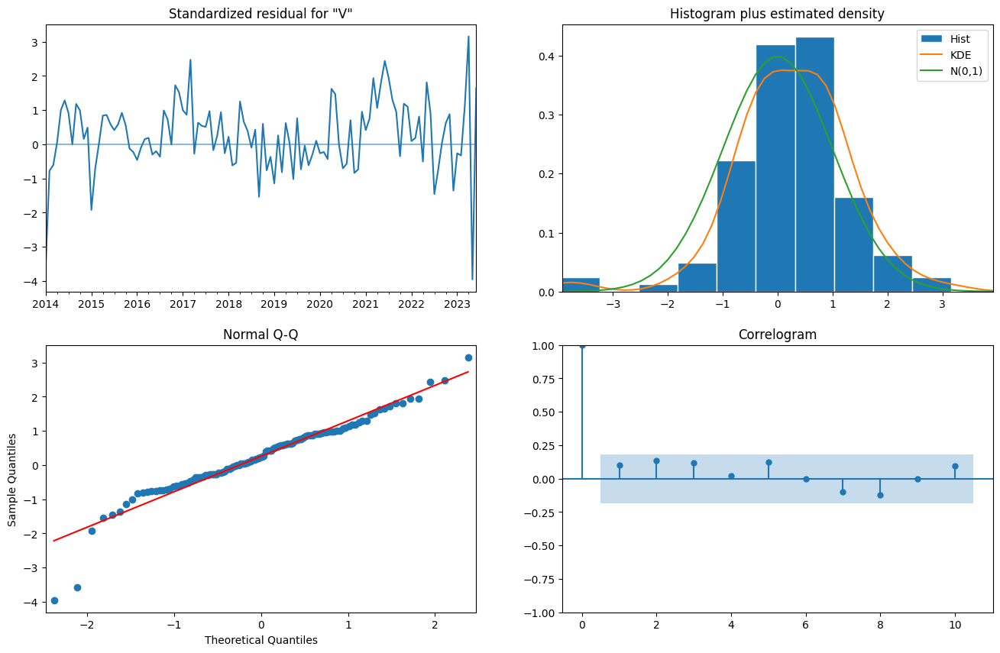

In [ ]:
results_cn.plot_diagnostics(figsize=(16, 10))
plt.show()

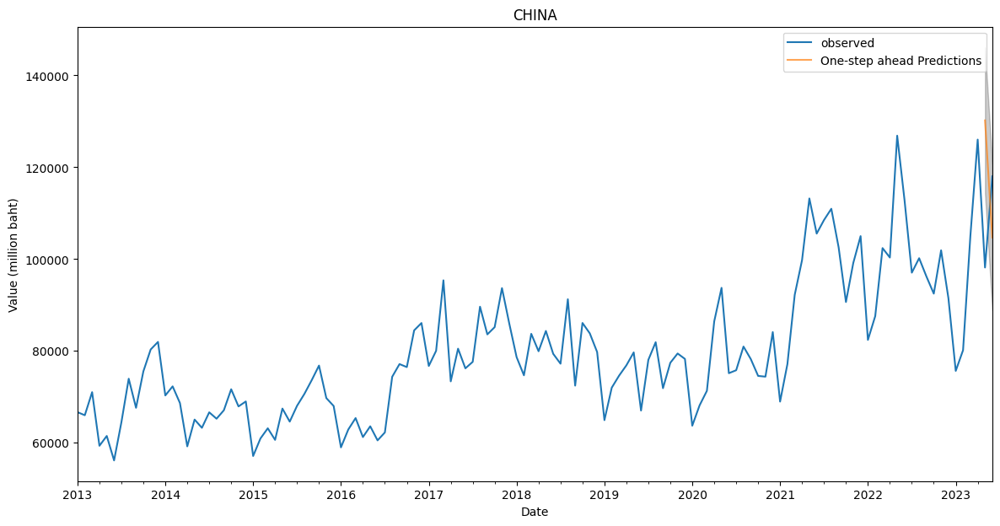

In [ ]:
pred_cn = results_cn.get_prediction(start=pd.to_datetime('2023-05-01'), dynamic=False)
pred_ci_cn = pred_cn.conf_int()
ax = cn_newcolumn['Value (million baht)']['2013':].plot(label='observed')
pred_cn.predicted_mean.plot(ax=ax, label='One-step ahead Predictions', alpha=.7, figsize=(14, 7))
ax.fill_between(pred_ci_cn.index,
                pred_ci_cn.iloc[:, 0],
                pred_ci_cn.iloc[:, 1], color='k', alpha=.2)
ax.set_xlabel('Date')
ax.set_ylabel('Value (million baht)')
ax.set_title('CHINA')
plt.legend()
plt.show()

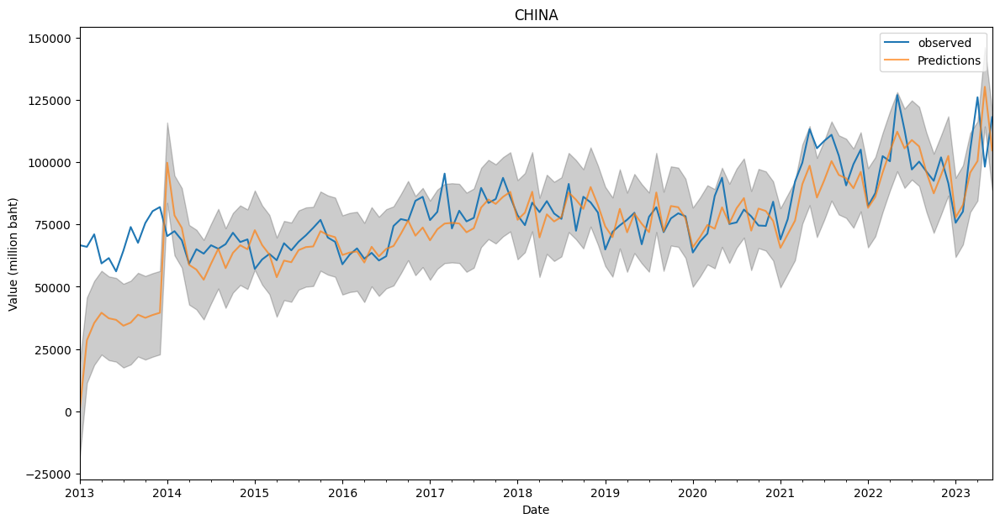

In [ ]:
pred_cn_total = results_cn.get_prediction(start=pd.to_datetime('2013-01-01'), dynamic=False)
pred_ci_cn = pred_cn_total.conf_int()
ax = cn_newcolumn['Value (million baht)']['2013':].plot(label='observed')
pred_cn_total.predicted_mean.plot(ax=ax, label='Predictions', alpha=.7, figsize=(14, 7))
ax.fill_between(pred_ci_cn.index,
                pred_ci_cn.iloc[:, 0],
                pred_ci_cn.iloc[:, 1], color='k', alpha=.2)
ax.set_xlabel('Date')
ax.set_ylabel('Value (million baht)')
ax.set_title('CHINA')
plt.legend()
plt.show()

In [ ]:
forecasted_cn = pred_cn.predicted_mean
mse_cn = ((forecasted_cn - cn_newcolumn_test['Value (million baht)']) ** 2).mean()
# forecasted_g3 = forecasted_us**(1/2)
mape_cn = (np.abs(cn_newcolumn_test['Value (million baht)'] - forecasted_cn) / np.abs(cn_newcolumn_test['Value (million baht)'])).mean() * 100
print('The Mean Squared Error of forecasts is {}'.format(round(mse_cn, 2)))
print('The Root Mean Squared Error of forecasts is {}'.format(round(np.sqrt(mse_cn), 2)))
print('Mean Absolute Percentage Error (MAPE): {:.2f}%'.format(mape_cn))

The Mean Squared Error of forecasts is 177673822.45
The Root Mean Squared Error of forecasts is 13329.43
Mean Absolute Percentage Error (MAPE): 11.29%


### Forecast

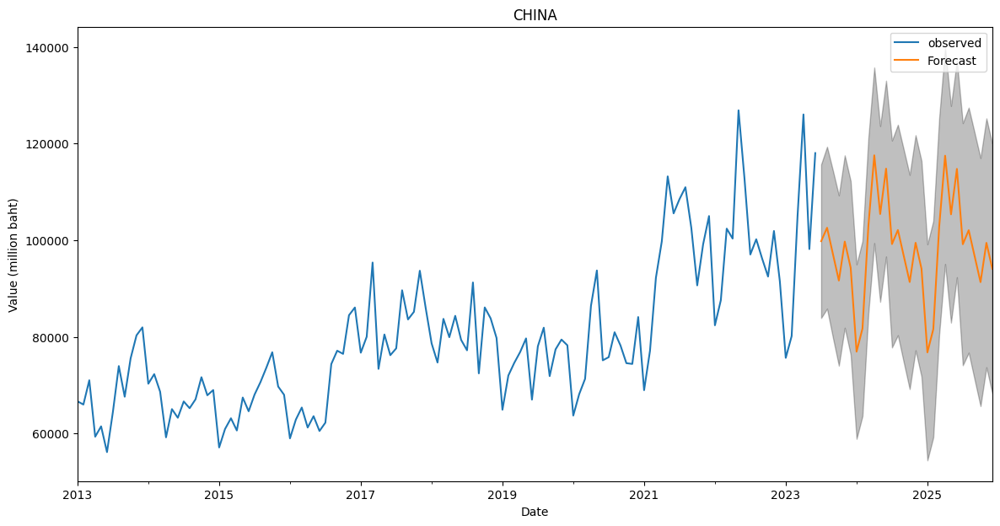

In [ ]:
pred_uc_cn = results_cn.get_forecast(steps=30)
pred_ci_cn = pred_uc_cn.conf_int()
ax = cn_newcolumn['Value (million baht)'].plot(label='observed', figsize=(14, 7))
pred_uc_cn.predicted_mean.plot(ax=ax, label='Forecast')
ax.fill_between(pred_ci_cn.index,
                pred_ci_cn.iloc[:, 0],
                pred_ci_cn.iloc[:, 1], color='k', alpha=.25)
ax.set_xlabel('Date')
ax.set_ylabel('Value (million baht)')
ax.set_title('CHINA')
plt.legend()
plt.show()

In [ ]:
forecast_cn = pred_uc_cn.predicted_mean
print(forecast_cn)

2023-07-01     99799.671307
2023-08-01    102586.396711
2023-09-01     97105.370837
2023-10-01     91657.751406
2023-11-01     99723.496707
2023-12-01     94300.551649
2024-01-01     76956.385223
2024-02-01     81734.249246
2024-03-01    102950.157088
2024-04-01    117571.656870
2024-05-01    105426.727967
2024-06-01    114815.906082
2024-07-01     99211.523546
2024-08-01    102114.834390
2024-09-01     96727.283837
2024-10-01     91354.610605
2024-11-01     99480.445914
2024-12-01     94105.679538
2025-01-01     76800.141586
2025-02-01     81608.976964
2025-03-01    102849.716872
2025-04-01    117491.126390
2025-05-01    105362.160621
2025-06-01    114764.137582
2025-07-01     99170.016844
2025-08-01    102081.555343
2025-09-01     96700.601521
2025-10-01     91333.217384
2025-11-01     99463.293359
2025-12-01     94091.927043
Freq: MS, Name: predicted_mean, dtype: float64


In [ ]:
import pandas as pd

old_cn = ['Value (million baht)']
old_cn_data = cn_newcolumn[old_cn]

forecast_cn_df = pd.DataFrame(forecast_cn)
new_column_names = {
    'predicted_mean': 'Value (million baht)'}

forecast_cn_df = forecast_cn_df.rename(columns=new_column_names)

# แปลง old_us_data และ forecast_us_df เป็น DataFrame
old_cn_data_df = pd.DataFrame(old_cn_data)
forecast_cn_df = pd.DataFrame(forecast_cn_df)

# รวมข้อมูลด้วย concat
new_cn = pd.concat([old_cn_data_df, forecast_cn_df])

# แสดงผลลัพธ์
print(new_cn)

            Value (million baht)
2013-01-01          66680.371682
2013-02-01          66007.388712
2013-03-01          71035.399590
2013-04-01          59357.664227
2013-05-01          61498.077507
...                          ...
2025-08-01         102081.555343
2025-09-01          96700.601521
2025-10-01          91333.217384
2025-11-01          99463.293359
2025-12-01          94091.927043

[156 rows x 1 columns]


In [ ]:
new_cn

,Value (million baht)
2013-01-01,66680.371682
2013-02-01,66007.388712
2013-03-01,71035.399590
2013-04-01,59357.664227
2013-05-01,61498.077507
...,...
2025-08-01,102081.555343
2025-09-01,96700.601521
2025-10-01,91333.217384
2025-11-01,99463.293359


In [ ]:
new_cn.to_csv('new_cn.csv')

## Model2

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score


# Load the dataset
data_cn = pd.read_csv('/content/china(new).csv')

# Display the first few rows of the dataset
data_cn.head()

,Unnamed: 0,Country,Year,Month,Value (million baht)
0,4950,CHINA,2013,1,66680.371682
1,4951,CHINA,2013,2,66007.388712
2,4952,CHINA,2013,3,71035.399590
3,4953,CHINA,2013,4,59357.664227
4,4954,CHINA,2013,5,61498.077507


<Axes: >

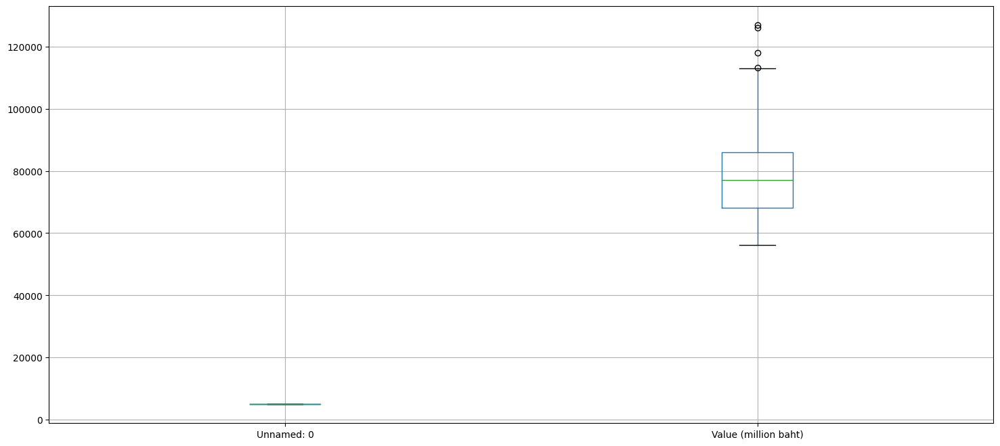

In [ ]:
cn.boxplot()

In [ ]:
def find_outlier(data):
  Q1 = np.percentile(data, 25)
  Q3 = np.percentile(data, 75)
  IQR = Q3 - Q1
  lower = Q1 - 1.5 * IQR
  upper = Q3 + 1.5 * IQR
  outlier = data[(data < lower) | (data > upper) ]
  return outlier

outlier_data_cn = find_outlier(data_cn['Value (million baht)'])
print("Outlier in Value:")
print(outlier_data_cn)
# print("Lower:", lower , "Upper: ", upper)

# จำนวน rows ที่มี outlier
outlier_count_data_cn = len(outlier_data_cn)

# จำนวน rows ทั้งหมด
total_rows_cn = len(data_cn)

# คำนวณเปอร์เซ็นต์ของ rows ที่มี outlier
percentage_outlier_cn = (outlier_count_data_cn / total_rows_cn) * 100

print(f"เปอร์เซ็นต์ของ rows ที่มี outlier: {percentage_outlier_cn:.2f}%")

Outlier in Value:
100    113208.534410
112    126878.844847
123    126029.931183
125    118027.852132
Name: Value (million baht), dtype: float64
เปอร์เซ็นต์ของ rows ที่มี outlier: 3.17%


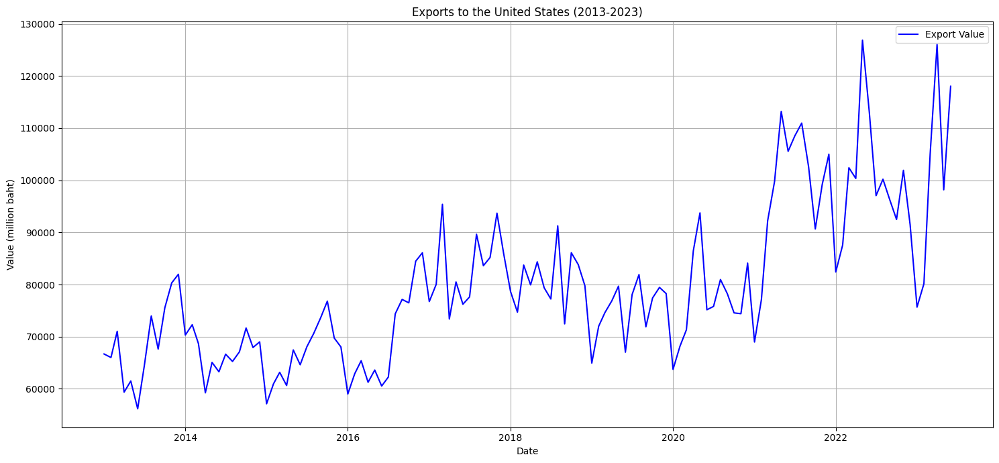

In [ ]:
import matplotlib.pyplot as plt

# Convert Year and Month columns to a datetime format for easier plotting
data_cn['Date'] = pd.to_datetime(data_cn[['Year', 'Month']].assign(DAY=1))

# Plotting the data
plt.figure(figsize=(15, 7))
plt.plot(data_cn['Date'], data_cn['Value (million baht)'], label='Export Value', color='blue')
plt.title('Exports to the United States (2013-2023)')
plt.xlabel('Date')
plt.ylabel('Value (million baht)')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

In [ ]:
#Integrated (d)
from statsmodels.tsa.stattools import adfuller
def adf_test(timeseries):
    print ('Results of Dickey-Fuller Test:')
    dftest = adfuller(timeseries, autolag='AIC')
    dfoutput = pd.Series(dftest[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
    for key,value in dftest[4].items():
        dfoutput['Critical Value (%s)'%key] = value
    print (dfoutput)
# Call the function and run the test

adf_test(data_cn['Value (million baht)'])

Results of Dickey-Fuller Test:
Test Statistic                  -1.058336
p-value                          0.731398
#Lags Used                      13.000000
Number of Observations Used    112.000000
Critical Value (1%)             -3.490131
Critical Value (5%)             -2.887712
Critical Value (10%)            -2.580730
dtype: float64


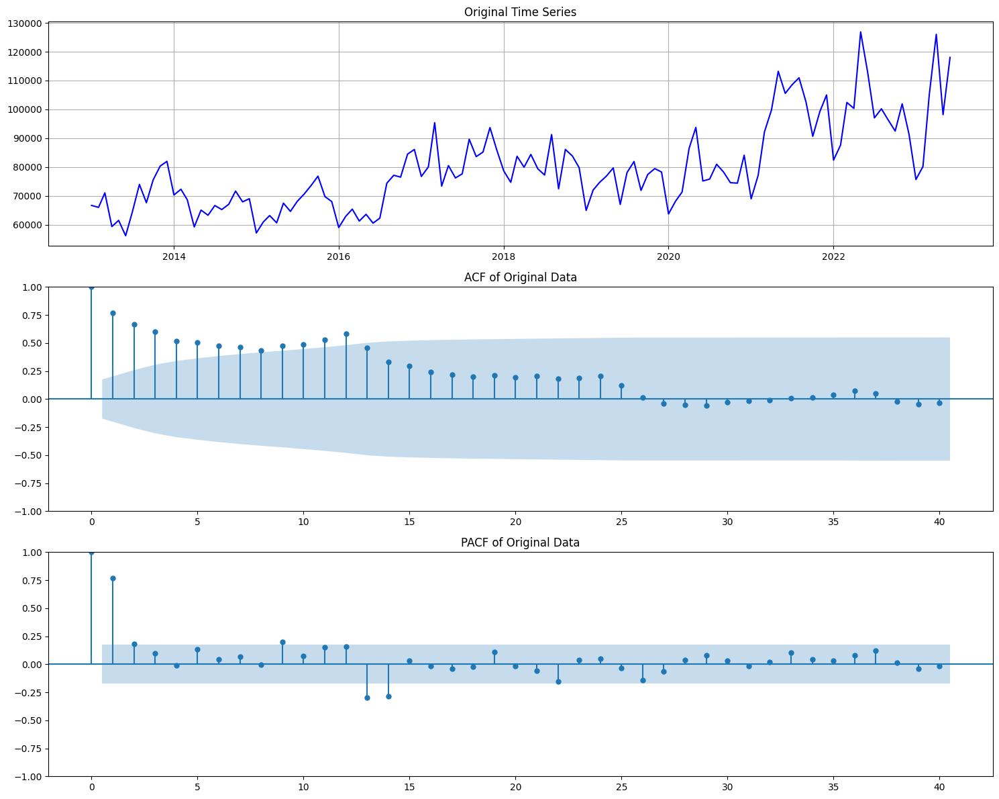

In [ ]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

# Prepare the data
X = data_cn[['Year', 'Month']]
y_cn = data_cn['Value (million baht)']

# Split the data into training and testing sets (80% train, 20% test)
X_train, X_test, y_train, y_test = train_test_split(X, y_cn, test_size=0.2, random_state=42, shuffle=False)

# Plotting the raw data
fig, ax = plt.subplots(3, figsize=(15, 12))

# Plotting the actual values
ax[0].plot(data_cn['Date'], y_cn, label='Original Data', color='blue')
ax[0].set_title('Original Time Series')
ax[0].grid(True)

# Plotting the ACF of the original data
plot_acf(y_cn, lags=40, ax=ax[1], title="ACF of Original Data")

# Plotting the PACF of the original data
plot_pacf(y_cn, lags=40, ax=ax[2], title="PACF of Original Data")

plt.tight_layout()
plt.show()

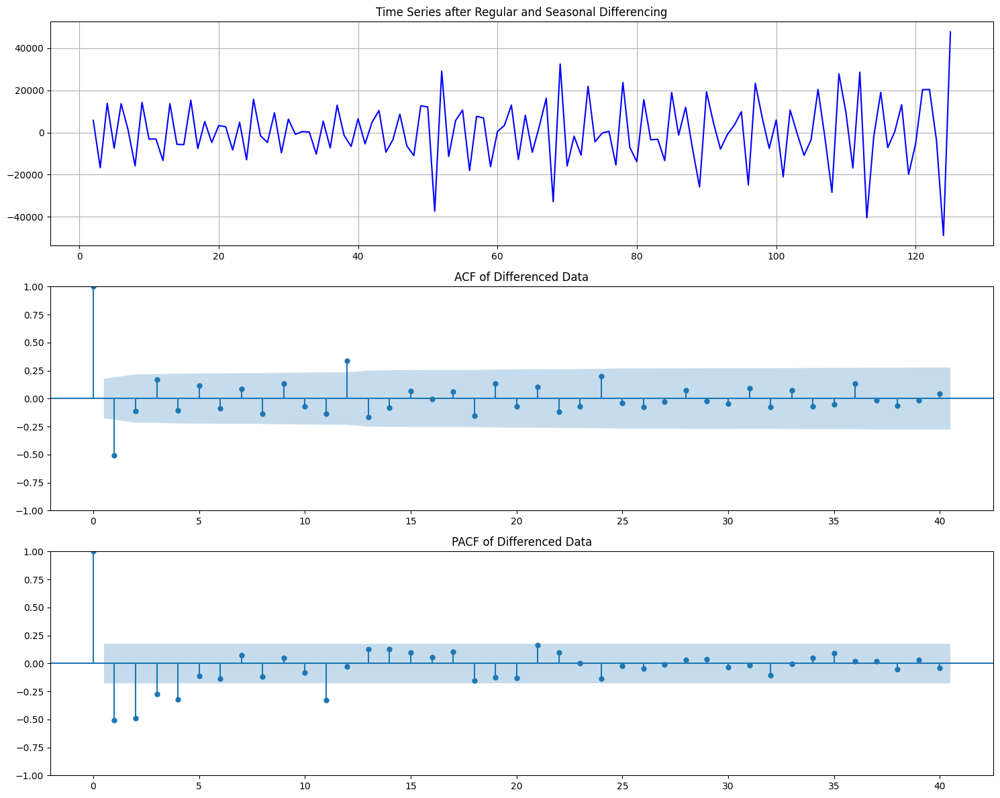

In [ ]:
# Differencing the data
diff_data_cn = y_cn.diff().diff().dropna()  # Regular differencing
# seasonal_diff_data = diff_data.diff(12).dropna()  # Seasonal differencing

# Plotting the differenced data and its ACF and PACF
fig, ax = plt.subplots(3, figsize=(15, 12))

# Time series after differencing
ax[0].plot(diff_data_cn.index, diff_data_cn, label='Differenced Data', color='blue')
ax[0].set_title('Time Series after Regular and Seasonal Differencing')
ax[0].grid(True)

# ACF of differenced data
plot_acf(diff_data_cn, lags=40, ax=ax[1], title="ACF of Differenced Data")

# PACF of differenced data
plot_pacf(diff_data_cn, lags=40, ax=ax[2], title="PACF of Differenced Data")

plt.tight_layout()
plt.show()

In [ ]:
#Integrated (d)
from statsmodels.tsa.stattools import adfuller
def adf_test(timeseries):
    print ('Results of Dickey-Fuller Test:')
    dftest = adfuller(timeseries, autolag='AIC')
    dfoutput = pd.Series(dftest[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
    for key,value in dftest[4].items():
        dfoutput['Critical Value (%s)'%key] = value
    print (dfoutput)
# Call the function and run the test

adf_test(diff_data_cn)

Results of Dickey-Fuller Test:
Test Statistic                -9.969968e+00
p-value                        2.253995e-17
#Lags Used                     1.100000e+01
Number of Observations Used    1.120000e+02
Critical Value (1%)           -3.490131e+00
Critical Value (5%)           -2.887712e+00
Critical Value (10%)          -2.580730e+00
dtype: float64


In [ ]:
# Find the best SARIMA parameters for the differenced data (assuming d=0 and D=0 since we manually differenced the data)

best_aic_diff_cn = float("inf")
best_pdq_diff_cn = None
best_seasonal_pdq_diff_cn = None

# Adjust the pdq and seasonal_pdq values for the grid search
p = q = d = range(0, 2)
# d = [0]  # No additional differencing
pdq_diff = [(x[0], x[1], x[2]) for x in list(itertools.product(p, d, q))]
seasonal_pdq_diff = [(x[0], x[1], x[2], 12) for x in list(itertools.product(p, d, q))]

# Grid search for the best parameters for differenced data
for param in pdq_diff:
    for param_seasonal in seasonal_pdq_diff:
        try:
            mod_diff_cn = SARIMAX(diff_data_cn, order=param, seasonal_order=param_seasonal, enforce_stationarity=False, enforce_invertibility=False)
            results_diff_cn = mod_diff_cn.fit(disp=0)
            if results_diff_cn.aic < best_aic_diff_cn:
                best_aic_diff_cn = results_diff_cn.aic
                best_pdq_diff_cn = param
                best_seasonal_pdq_diff_cn = param_seasonal
        except:
            continue

best_aic_diff_cn, best_pdq_diff_cn, best_seasonal_pdq_diff_cn

(2061.8745571513264, (1, 0, 1), (0, 1, 1, 12))

### LOOCV

In [ ]:
# กำหนดจุดเริ่มต้นสำหรับ LOOCV
start_index = 15

mse_scores_loocv_ori_cn = []
predictions_loocv_ori_cn = []  # เพิ่มรายการเพื่อเก็บค่าทำนาย

# Iterate through the differenced dataset starting from the 25th data point for LOOCV
for i in range(start_index, len(y_cn) - 1):
    y_train_loocv_ori, y_test_loocv_ori = y_cn[:i], y_cn[i:i+1]

    # Fit the SARIMA model with the best parameters for differenced data
    model_loocv_ori_cn = SARIMAX(y_train_loocv_ori, order=(1, 0, 1), seasonal_order=(0, 1, 1, 12), enforce_stationarity=False, enforce_invertibility=False)
    results_loocv_ori_cn = model_loocv_ori_cn.fit(disp=0)

    # Predict on the test set
    pred_loocv_ori_cn = results_loocv_ori_cn.predict(start=len( y_train_loocv_ori), end=len( y_train_loocv_ori), dynamic=False)

    # Calculate and store the MSE for this iteration
    mse_scores_loocv_ori_cn.append(mean_squared_error(y_test_loocv_ori, pred_loocv_ori_cn))

    # Store the predictions
    predictions_loocv_ori_cn.append(pred_loocv_ori_cn.values[0])  # เพิ่มค่าทำนายลงในรายการ

# Calculate the average MSE over all LOOCV iterations for differenced data
avg_mse_loocv_ori_cn = sum(mse_scores_loocv_ori_cn) / len(mse_scores_loocv_ori_cn)

# Print the predictions
print("Predictions:", predictions_loocv_ori_cn)

# Print the average MSE
print("Average MSE:", avg_mse_loocv_ori_cn)

Predictions: [59357.664227, 61490.861875411756, 59255.23236089646, 78225.42868404204, 68309.06851060099, 64348.70242398594, 75452.03911799748, 79594.06096868574, 77978.89016419777, 63208.081293751275, 61219.744055330826, 58917.14125334319, 56102.39590101312, 65710.37308430289, 64584.30107259292, 66692.66898587256, 65554.43747579654, 72004.03478343833, 74567.14334800652, 71310.53169918119, 68784.67308559136, 56291.94239926388, 63618.99124097022, 63295.39895446273, 63041.93221759504, 66771.56562161712, 61141.660018126946, 66219.02777281117, 65212.213373077044, 77815.08274814945, 77782.62459742499, 69203.01955401806, 79843.04103728943, 67273.97804237457, 76684.1785003408, 79349.02678380314, 90615.03273950271, 75172.4893471522, 75378.22486114845, 76539.03195092807, 88410.58033818762, 91115.75893149339, 83768.86006743734, 92122.55401605184, 94146.92116859293, 78361.75282035525, 81603.1294224635, 88988.41855498431, 68038.36825131654, 81390.4284959043, 79024.52152144704, 80530.26254938239, 90

In [ ]:
results_loocv_ori_cn = model_loocv_ori_cn.fit()
print( results_loocv_ori_cn.summary().tables[1])

                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.9171      0.058     15.934      0.000       0.804       1.030
ma.L1         -0.2930      0.129     -2.266      0.023      -0.546      -0.040
ma.S.L12      -0.2974      0.105     -2.827      0.005      -0.504      -0.091
sigma2      4.969e+07   5.23e-10   9.51e+16      0.000    4.97e+07    4.97e+07


In [ ]:
import numpy as np

# Calculate MAPE
def mean_absolute_percentage_error(y_true, y_pred):
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

# Calculate MAE, RMSE, and MAPE
mae_loocv_ori_cn = np.mean(np.abs(np.array(y_test_loocv_ori) - np.array(predictions_loocv_ori_cn)))
rmse_loocv_ori_cn = np.sqrt(np.mean(np.square(np.array(y_test_loocv_ori) - np.array(predictions_loocv_ori_cn))))
mape_loocv_ori_cn = mean_absolute_percentage_error(np.array(y_test_loocv_ori), np.array(predictions_loocv_ori_cn))

# Print the results
print("MAE (Mean Absolute Error):", mae_loocv_ori_cn)
print("RMSE (Root Mean Square Error):", rmse_loocv_ori_cn)
print("MAPE (Mean Absolute Percentage Error):", mape_loocv_ori_cn)

MAE (Mean Absolute Error): 20453.54653578921
RMSE (Root Mean Square Error): 23141.7675710753
MAPE (Mean Absolute Percentage Error): 20.834153859898


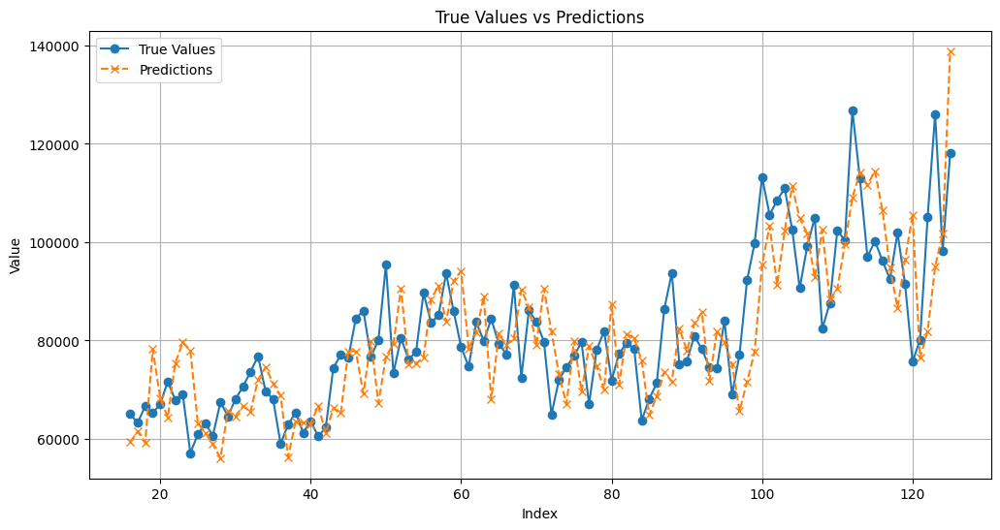

In [ ]:
import matplotlib.pyplot as plt

# ค่าจริง
true_values_y_cn = y_cn[start_index+1:]  # นี่คือค่าจริงที่เราทดสอบด้วย LOOCV

# พล็อตกราฟค่าจริงและค่าทำนาย
plt.figure(figsize=(12, 6))
plt.plot(true_values_y_cn.index, true_values_y_cn, label='True Values', marker='o')
plt.plot(true_values_y_cn.index, predictions_loocv_ori_cn, label='Predictions', marker='x', linestyle='dashed')
plt.xlabel('Index')
plt.ylabel('Value')
plt.title('True Values vs Predictions')
plt.legend()
plt.grid(True)
plt.show()

### Forecast

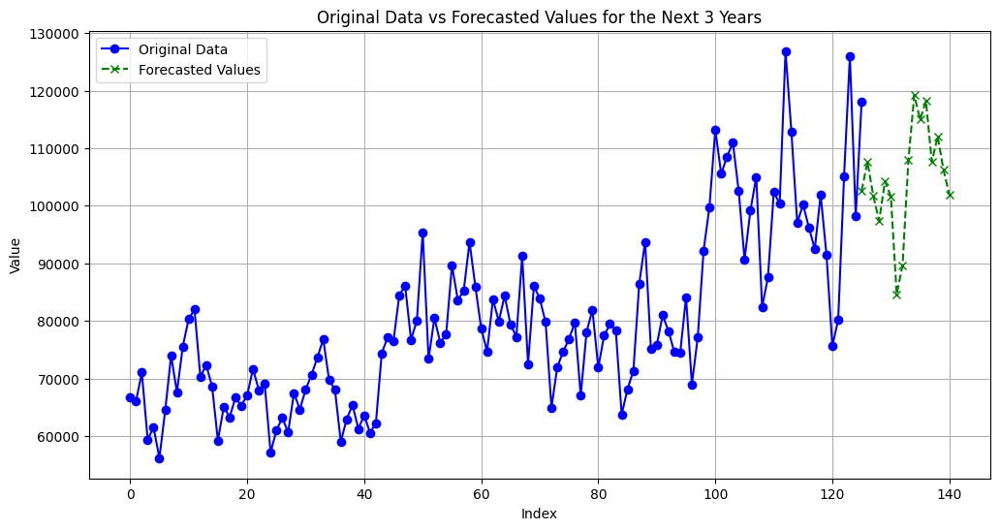

In [ ]:
def forecast_sarima_with_differenced_data(y, start_index, order, seasonal_order):
  """Forecasts the next `start_index` years using the SARIMA model with differenced data.

  Args:
    y: A Pandas Series containing the time series data.
    start_index: The index of the first data point to forecast.
    order: The order of the SARIMA model (p, d, q).
    seasonal_order: The seasonal order of the SARIMA model (P, D, Q, s).

  Returns:
    A Pandas Series containing the forecasted values.
  """

  # Difference the data.
  diff_data_cn = y_cn.diff().dropna()

  # Fit the SARIMA model to the differenced data.
  model_loocv_ori_cn = SARIMAX(diff_data_cn, order=order, seasonal_order=seasonal_order, enforce_stationarity=False, enforce_invertibility=False)
  results_loocv_ori_cn = model_loocv_ori_cn.fit(disp=0)

  # Check if the forecast is empty.
  if not diff_data_cn.empty:
    # Make predictions for the next `start_index` years.
    forecast_loocv_ori = results_loocv_ori_cn.predict(start=len(diff_data_cn), end=len(diff_data_cn) + start_index, dynamic=False)

    # Convert the forecasted differenced values back to the original scale.
    forecasted_values_y_cn = forecast_loocv_ori.cumsum() + y.iloc[-1]  # Use iloc to access the last value in the original data.
    return forecasted_values_y_cn
  else:
    # Raise an error if the forecast is empty.
    raise ValueError("The SARIMA model failed to fit the data or the forecast is beyond the end of the dataset.")

# Forecast the next 3 years using the SARIMA model with differenced data.
try:
    forecasted_values_y_cn = forecast_sarima_with_differenced_data(y_cn, start_index=15, order=(1, 0, 1), seasonal_order=(0, 1, 1, 12))

    # Plot the forecasted values.
    import matplotlib.pyplot as plt

    # Plot both original data and forecasted data
    plt.figure(figsize=(12, 6))
    plt.plot(y_cn.index, y_cn, label='Original Data', marker='o', color='blue')
    plt.plot(forecasted_values_y_cn.index, forecasted_values_y_cn, label='Forecasted Values', marker='x', linestyle='dashed', color='green')
    plt.xlabel('Index')
    plt.ylabel('Value')
    plt.title('Original Data vs Forecasted Values for the Next 3 Years')
    plt.legend()
    plt.grid(True)
    plt.show()
except ValueError as e:
    print(e)

In [ ]:
# Forecast the next 3 years.
start_index = 15
order = (0, 0, 1)
seasonal_order = (0, 1, 1, 12)
forecasted_values_y_cn = forecast_sarima_with_differenced_data(y_cn, start_index, order, seasonal_order)

# Print the forecasted values.
print(forecasted_values_y_cn)

125    104333.233532
126    108316.438613
127    102486.728300
128     98312.470977
129    105048.371039
130    102580.468139
131     85630.922509
132     90677.614643
133    108596.184857
134    119606.876848
135    115941.813440
136    118638.844912
137    109225.594633
138    113208.799714
139    107379.089401
140    103204.832078
Name: predicted_mean, dtype: float64


# JAPAN

array([[<Axes: title={'center': 'Unnamed: 0'}>,
        <Axes: title={'center': 'Year'}>],
       [<Axes: title={'center': 'Month'}>,
        <Axes: title={'center': 'Value (million baht)'}>]], dtype=object)

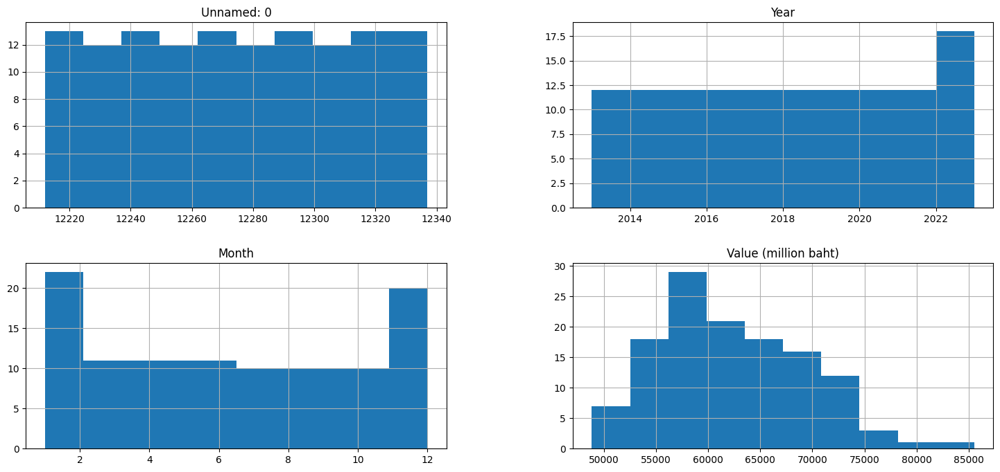

In [ ]:
jp = pd.read_csv('/content/japan(new).csv')
jp.hist()

<Axes: >

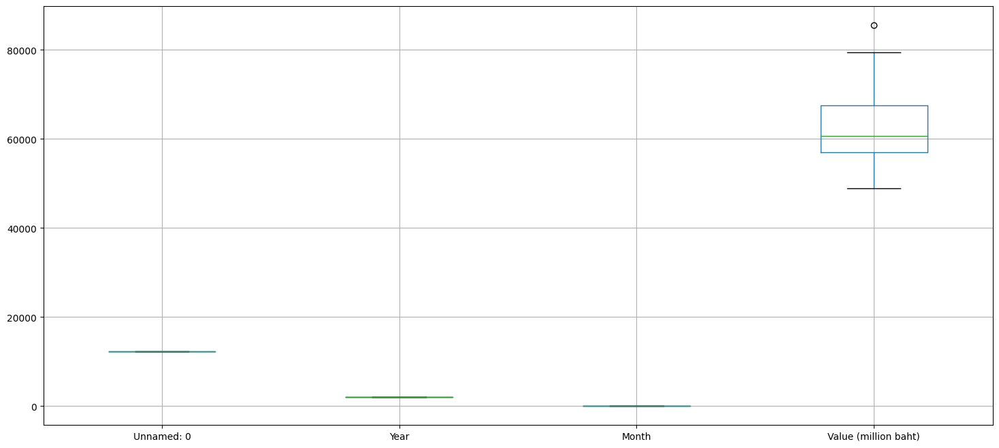

In [ ]:
jp.boxplot()

In [ ]:
jp.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 126 entries, 0 to 125
Data columns (total 5 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Unnamed: 0            126 non-null    int64  
 1   Country               126 non-null    object 
 2   Year                  126 non-null    int64  
 3   Month                 126 non-null    int64  
 4   Value (million baht)  126 non-null    float64
dtypes: float64(1), int64(3), object(1)
memory usage: 5.0+ KB


In [ ]:
def find_outlier(data):
  Q1 = np.percentile(data, 25)
  Q3 = np.percentile(data, 75)
  IQR = Q3 - Q1
  lower = Q1 - 1.5 * IQR
  upper = Q3 + 1.5 * IQR
  outlier = data[(data < lower) | (data > upper) ]
  return outlier

outlier_jp = find_outlier(jp['Value (million baht)'])
print("Outlier in Value:")
print(outlier_jp)
# print("Lower:",lower, "Upper: ",upper)
# จำนวน rows ที่มี outlier
outlier_count_jp = len(outlier_jp)

# จำนวน rows ทั้งหมด
total_rows_jp = len(jp)

# คำนวณเปอร์เซ็นต์ของ rows ที่มี outlier
percentage_outlier_jp = (outlier_count_jp / total_rows_jp) * 100

print(f"เปอร์เซ็นต์ของ rows ที่มี outlier: {percentage_outlier_jp:.2f}%")

Outlier in Value:
122    85521.854086
Name: Value (million baht), dtype: float64
เปอร์เซ็นต์ของ rows ที่มี outlier: 0.79%


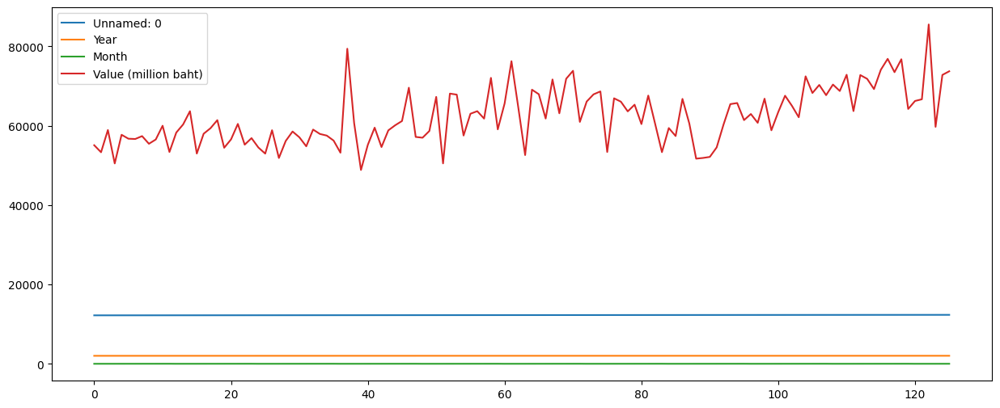

In [ ]:
jp.plot(figsize=(15, 6))
plt.show()

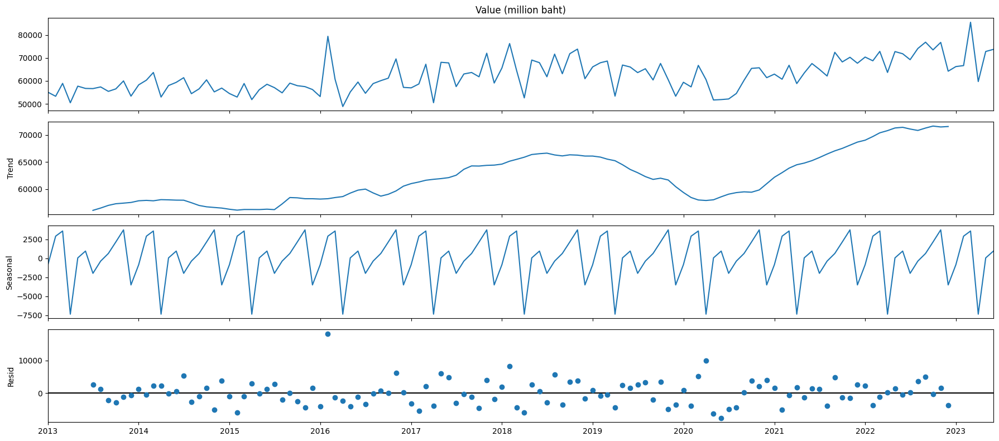

In [ ]:
# แปลงคอลัมน์ 'Month' เป็นข้อความ
jp['Month'] = jp['Month'].astype(str)

# แปลงคอลัมน์ 'Year' เป็นข้อความ
jp['Year'] = jp['Year'].astype(str)

# แปลงคอลัมน์ 'Month Year' เป็นรูปแบบ '01-2020'
jp['Month Year'] = jp['Month'].str.zfill(2) + '-' + jp['Year']

# แปลงคอลัมน์ 'Month Year' เป็น DatetimeIndex และระบุความถี่เป็นรายเดือน ('M')
jp_datetime= jp.set_index(pd.to_datetime(jp['Month Year'], format='%m-%Y', errors='coerce'))

rcParams['figure.figsize'] = (18, 8)  # กำหนดขนาดกราฟใหญ่ขึ้น
decomposition = sm.tsa.seasonal_decompose(jp_datetime['Value (million baht)'], model='additive', period=12)
fig = decomposition.plot()
plt.show()

## Check stationary test

In [ ]:
#Integrated (d)
from statsmodels.tsa.stattools import adfuller
def adf_test(timeseries):
    print ('Results of Dickey-Fuller Test:')
    dftest = adfuller(timeseries, autolag='AIC')
    dfoutput = pd.Series(dftest[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
    for key,value in dftest[4].items():
        dfoutput['Critical Value (%s)'%key] = value
    print (dfoutput)
# Call the function and run the test

adf_test(jp['Value (million baht)'])

Results of Dickey-Fuller Test:
Test Statistic                  -1.298462
p-value                          0.629876
#Lags Used                      12.000000
Number of Observations Used    113.000000
Critical Value (1%)             -3.489590
Critical Value (5%)             -2.887477
Critical Value (10%)            -2.580604
dtype: float64


In [ ]:
jp_new = jp_datetime.copy()
jp_new

,Unnamed: 0,Country,Year,Month,Value (million baht),Month Year
Month Year,,,,,,
2013-01-01,12212,JAPAN,2013,1,55084.689775,01-2013
2013-02-01,12213,JAPAN,2013,2,53316.152482,02-2013
2013-03-01,12214,JAPAN,2013,3,58921.514311,03-2013
2013-04-01,12215,JAPAN,2013,4,50493.093699,04-2013
2013-05-01,12216,JAPAN,2013,5,57722.759299,05-2013
...,...,...,...,...,...,...
2023-02-01,12333,JAPAN,2023,2,66667.951175,02-2023
2023-03-01,12334,JAPAN,2023,3,85521.854086,03-2023
2023-04-01,12335,JAPAN,2023,4,59723.531536,04-2023


## Differencing

p-Values:0.022818224031640733


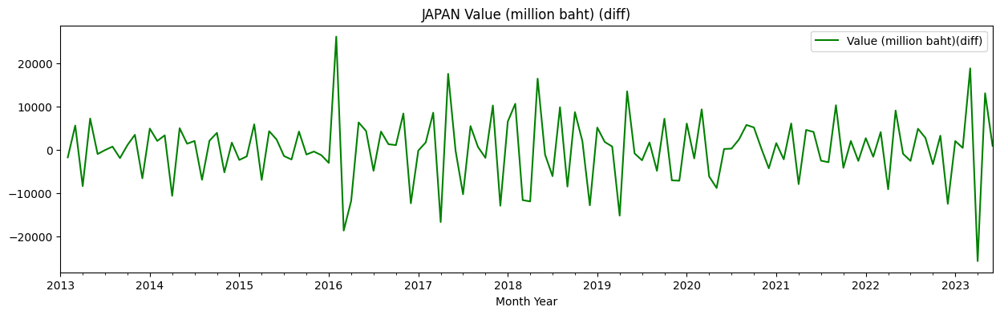

In [ ]:
#First difference
jp_new['Value (million baht)_diff'] = jp_new['Value (million baht)'].diff(1)
jp_new['Value (million baht)_diff'].plot(color = 'green', figsize = (15,4))
plt.legend(['Value (million baht)(diff)'])
plt.title('JAPAN Value (million baht) (diff)')

jp_new_adf = adfuller(jp_new['Value (million baht)_diff'].dropna(), autolag = 'AIC')
print('p-Values:' + str(jp_new_adf[1]))

## Model 1 & LOOCV

In [ ]:
column = ['Value (million baht)_diff','Value (million baht)']
jp_newcolumn = jp_new[column]
jp_newcolumn

,Value (million baht)_diff,Value (million baht)
Month Year,,
2013-01-01,NaN,55084.689775
2013-02-01,-1768.537293,53316.152482
2013-03-01,5605.361829,58921.514311
2013-04-01,-8428.420612,50493.093699
2013-05-01,7229.665600,57722.759299
...,...,...
2023-02-01,427.090641,66667.951175
2023-03-01,18853.902911,85521.854086
2023-04-01,-25798.322550,59723.531536


In [ ]:
# แบ่งข้อมูลออกเป็น 125 rows สำหรับ training และ 1 rows สำหรับ testing
jp_newcolumn_train = jp_newcolumn.iloc[:125]
jp_newcolumn_test = jp_newcolumn.iloc[125:]

# กำหนดช่วงของลำดับ
p_range = range(0, 2)
d_range = range(0, 2)
q_range = range(0, 2)

# กำหนดช่วงของลำดับฤดูกาล
P_range = range(0, 2)
D_range = range(0, 2)
Q_range = range(0, 2)

# สร้างพจนานุกรมสำหรับเก็บค่าพารามิเตอร์
param_grid = dict(
    p=p_range,
    d=d_range,
    q=q_range,
    P=P_range,
    D=D_range,
    Q=Q_range,
)

# เลือกโมเดลที่ดีที่สุดโดยใช้ AIC
best_model_jp = None
best_aic_jp = float("inf")

for p in param_grid['p']:
    for d in param_grid['d']:
        for q in param_grid['q']:
            for P in param_grid['P']:
                for D in param_grid['D']:
                    for Q in param_grid['Q']:
                        order = (p, d, q)
                        seasonal_order = (P, D, Q, 12)

                        # สร้างโมเดล SARIMA
                        sarima_model_jp_newcolumn = SARIMAX(jp_newcolumn_train['Value (million baht)_diff'], order=order, seasonal_order=seasonal_order, enforce_stationarity=False)

                        # ฝึกโมเดล
                        sarima_fit_jp_newcolumn = sarima_model_jp_newcolumn.fit()

                        # คำนวณ AIC
                        aic = sarima_fit_jp_newcolumn.aic

                        # บันทึกโมเดลที่มี AIC ต่ำสุด
                        if aic < best_aic_jp:
                            best_model_jp = sarima_fit_jp_newcolumn
                            best_aic_jp = aic
                            best_param_jp = (p, d, q, P, D, Q)

# แสดงค่าพารามิเตอร์ที่ดีที่สุด
print("Best Parameters:", best_param_jp)
print("Best AIC:", best_aic_jp)

Best Parameters: (0, 0, 1, 0, 1, 1)
Best AIC: 1988.4839384260968


In [ ]:
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error

# ทำนายค่าสำหรับชุดข้อมูลทดสอบ
y_pred_jp = best_model_jp.predict(start=jp_newcolumn_test.index[0], end=jp_newcolumn_test.index[-1])

# คำนวณ MAE และ RMSE และ MSE
mae = mean_absolute_error(jp_newcolumn_test['Value (million baht)_diff'], y_pred_jp)
rmse = mean_squared_error(jp_newcolumn_test['Value (million baht)_diff'], y_pred_jp) ** 0.5
mse = rmse ** 2

# แสดงค่า MAE และ RMSE
print("MAE:", mae)
print("RMSE:", rmse)
print("MSE:", mse)

MAE: 1296.868251077926
RMSE: 1296.868251077926
MSE: 1681867.2606539186


In [ ]:
p = d = q = range(0, 2)
pdq = list(itertools.product(p, d, q))
seasonal_pdq = [(x[0], x[1], x[2], 12) for x in list(itertools.product(p, d, q))]
print('Examples of parameter combinations for Seasonal ARIMA...')
print('SARIMAX: {} x {}'.format(pdq[1], seasonal_pdq[1]))
print('SARIMAX: {} x {}'.format(pdq[1], seasonal_pdq[2]))
print('SARIMAX: {} x {}'.format(pdq[2], seasonal_pdq[3]))
print('SARIMAX: {} x {}'.format(pdq[2], seasonal_pdq[4]))

Examples of parameter combinations for Seasonal ARIMA...
SARIMAX: (0, 0, 1) x (0, 0, 1, 12)
SARIMAX: (0, 0, 1) x (0, 1, 0, 12)
SARIMAX: (0, 1, 0) x (0, 1, 1, 12)
SARIMAX: (0, 1, 0) x (1, 0, 0, 12)


In [ ]:
for param in pdq:
    for param_seasonal in seasonal_pdq:
        try:
            mod = sm.tsa.statespace.SARIMAX(jp_newcolumn_train['Value (million baht)_diff'],
                                            order=param,
                                            seasonal_order=param_seasonal,
                                            enforce_stationarity=False,
                                            enforce_invertibility=False)
            results = mod.fit()
            print('ARIMA{}x{}12 - AIC:{}'.format(param, param_seasonal, results.aic))
        except Exception as e:
            print(e)
            continue

ARIMA(0, 0, 0)x(0, 0, 0, 12)12 - AIC:2571.8315591317914
ARIMA(0, 0, 0)x(0, 0, 1, 12)12 - AIC:2319.225212058024
ARIMA(0, 0, 0)x(0, 1, 0, 12)12 - AIC:2331.1771926320284
ARIMA(0, 0, 0)x(0, 1, 1, 12)12 - AIC:2058.0782271554276
ARIMA(0, 0, 0)x(1, 0, 0, 12)12 - AIC:2326.877831145132
ARIMA(0, 0, 0)x(1, 0, 1, 12)12 - AIC:2299.673390557354
ARIMA(0, 0, 0)x(1, 1, 0, 12)12 - AIC:2089.664115163846
ARIMA(0, 0, 0)x(1, 1, 1, 12)12 - AIC:2058.4569105862956
ARIMA(0, 0, 1)x(0, 0, 0, 12)12 - AIC:2479.699111638686
ARIMA(0, 0, 1)x(0, 0, 1, 12)12 - AIC:2239.1434202418363
ARIMA(0, 0, 1)x(0, 1, 0, 12)12 - AIC:2267.3516082618103
ARIMA(0, 0, 1)x(0, 1, 1, 12)12 - AIC:1998.5036966274972
ARIMA(0, 0, 1)x(1, 0, 0, 12)12 - AIC:2273.2628192423695
ARIMA(0, 0, 1)x(1, 0, 1, 12)12 - AIC:2226.365772702135
ARIMA(0, 0, 1)x(1, 1, 0, 12)12 - AIC:2044.053244448788
ARIMA(0, 0, 1)x(1, 1, 1, 12)12 - AIC:2000.4906548691952
ARIMA(0, 1, 0)x(0, 0, 0, 12)12 - AIC:2685.357523171103
ARIMA(0, 1, 0)x(0, 0, 1, 12)12 - AIC:2418.434905023061
A

In [ ]:
mod_jp = sm.tsa.statespace.SARIMAX(jp_newcolumn['Value (million baht)'],
                                order=(0, 1, 1),
                                seasonal_order=(0, 1, 1, 12),
                                enforce_invertibility=False)
results_jp = mod_jp.fit()
print(results_jp.summary().tables[1])

                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.4476      0.066     -6.811      0.000      -0.576      -0.319
ma.S.L12      -0.5751      0.085     -6.797      0.000      -0.741      -0.409
sigma2      4.654e+07   1.93e-10   2.41e+17      0.000    4.65e+07    4.65e+07


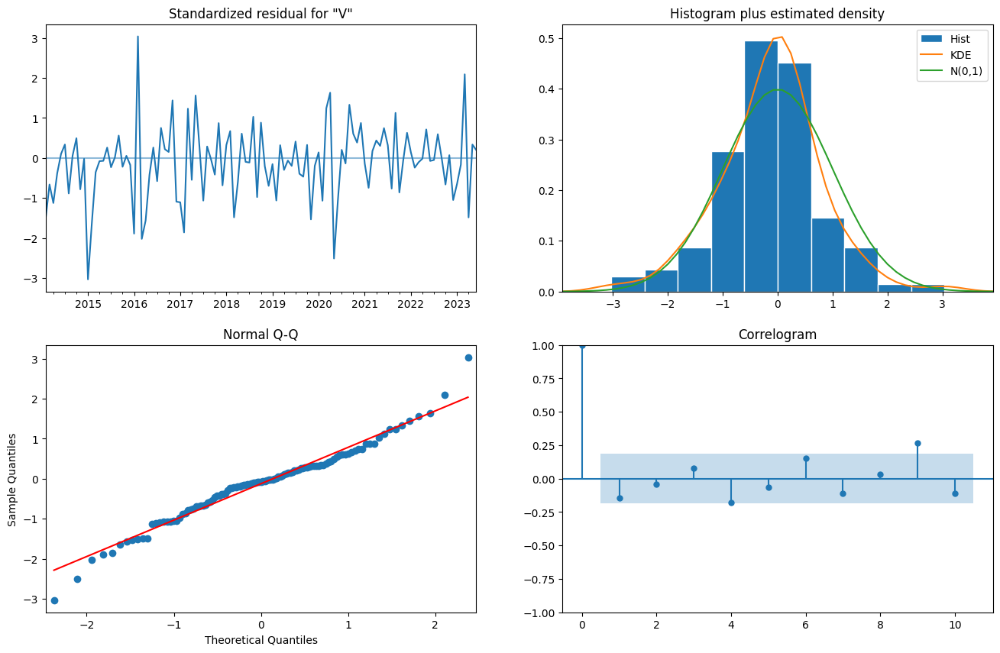

In [ ]:
results_jp.plot_diagnostics(figsize=(16, 10))
plt.show()

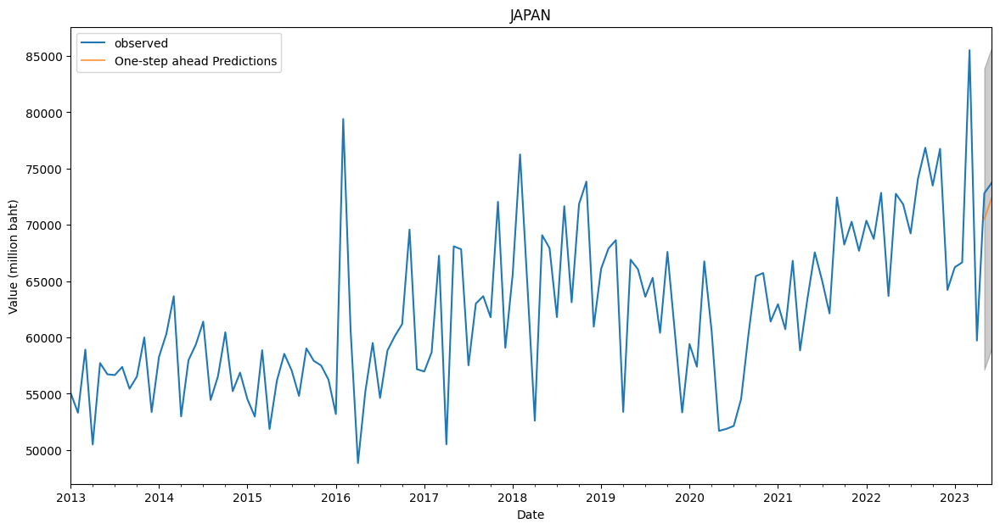

In [ ]:
pred_jp = results_jp.get_prediction(start=pd.to_datetime('2023-05-01'), dynamic=False)
pred_ci_jp = pred_jp.conf_int()
ax = jp_newcolumn['Value (million baht)']['2013':].plot(label='observed')
pred_jp.predicted_mean.plot(ax=ax, label='One-step ahead Predictions', alpha=.7, figsize=(14, 7))
ax.fill_between(pred_ci_jp.index,
                pred_ci_jp.iloc[:, 0],
                pred_ci_jp.iloc[:, 1], color='k', alpha=.2)
ax.set_xlabel('Date')
ax.set_ylabel('Value (million baht)')
ax.set_title('JAPAN')
plt.legend()
plt.show()

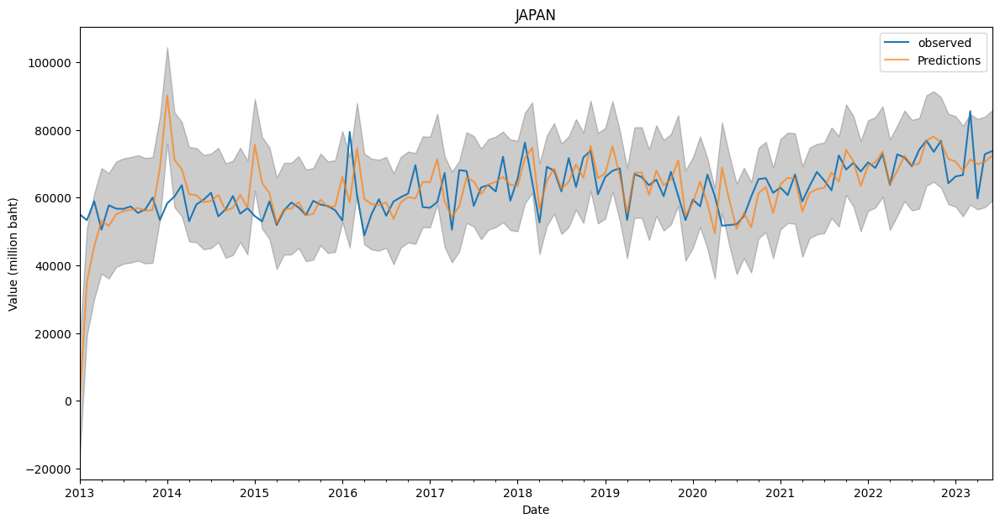

In [ ]:
pred_jp_total = results_jp.get_prediction(start=pd.to_datetime('2013-01-01'), dynamic=False)
pred_ci_jp = pred_jp_total.conf_int()
ax = jp_newcolumn['Value (million baht)']['2013':].plot(label='observed')
pred_jp_total.predicted_mean.plot(ax=ax, label='Predictions', alpha=.7, figsize=(14, 7))
ax.fill_between(pred_ci_jp.index,
                pred_ci_jp.iloc[:, 0],
                pred_ci_jp.iloc[:, 1], color='k', alpha=.2)
ax.set_xlabel('Date')
ax.set_ylabel('Value (million baht)')
ax.set_title('JAPAN')
plt.legend()
plt.show()

In [ ]:
forecasted_jp = pred_jp.predicted_mean
mse_jp = ((forecasted_jp - jp_newcolumn_test['Value (million baht)']) ** 2).mean()
# forecasted_g3 = forecasted_jp**(1/2)
mape_jp = (np.abs(jp_newcolumn_test['Value (million baht)'] - forecasted_jp) / np.abs(jp_newcolumn_test['Value (million baht)'])).mean() * 100
print('The Mean Squared Error of forecasts is {}'.format(round(mse_jp, 2)))
print('The Root Mean Squared Error of forecasts is {}'.format(round(np.sqrt(mse_jp), 2)))
print('Mean Absolute Percentage Error (MAPE): {:.2f}%'.format(mape_jp))

The Mean Squared Error of forecasts is 1823732.97
The Root Mean Squared Error of forecasts is 1350.46
Mean Absolute Percentage Error (MAPE): 1.83%


### Forecast

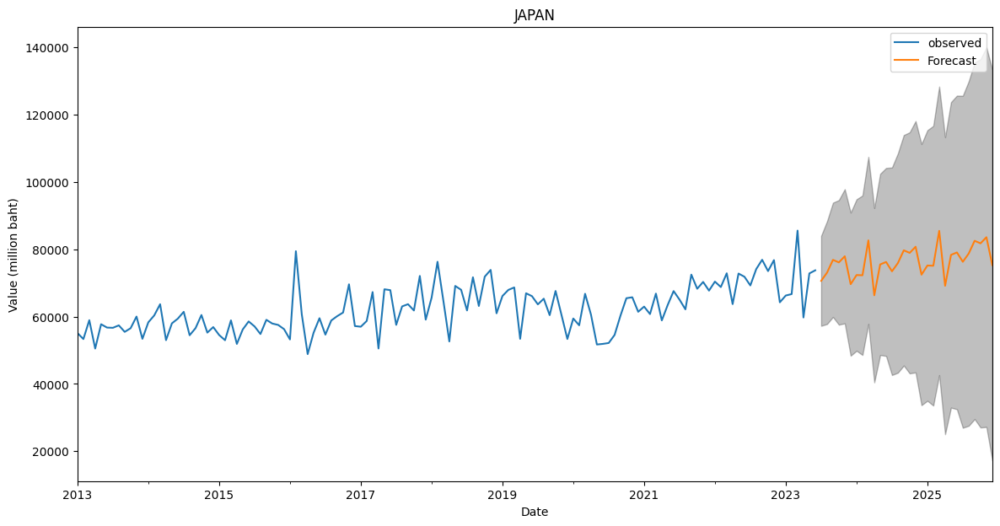

In [ ]:
pred_uc_jp = results_jp.get_forecast(steps=30)
pred_ci_jp = pred_uc_jp.conf_int()
ax = jp_newcolumn['Value (million baht)'].plot(label='observed', figsize=(14, 7))
pred_uc_jp.predicted_mean.plot(ax=ax, label='Forecast')
ax.fill_between(pred_ci_jp.index,
                pred_ci_jp.iloc[:, 0],
                pred_ci_jp.iloc[:, 1], color='k', alpha=.25)
ax.set_xlabel('Date')
ax.set_ylabel('Value (million baht)')
ax.set_title('JAPAN')
plt.legend()
plt.show()

In [ ]:
forecast_jp = pred_uc_jp.predicted_mean
print(forecast_jp)

2023-07-01    70604.065067
2023-08-01    73051.670339
2023-09-01    76836.038928
2023-10-01    76076.398437
2023-11-01    77900.886769
2023-12-01    69610.364179
2024-01-01    72322.433083
2024-02-01    72256.289817
2024-03-01    82618.690527
2024-04-01    66317.687997
2024-05-01    75472.875388
2024-06-01    76205.620957
2024-07-01    73432.889090
2024-08-01    75880.494362
2024-09-01    79664.862951
2024-10-01    78905.222460
2024-11-01    80729.710793
2024-12-01    72439.188202
2025-01-01    75151.257107
2025-02-01    75085.113841
2025-03-01    85447.514551
2025-04-01    69146.512020
2025-05-01    78301.699411
2025-06-01    79034.444981
2025-07-01    76261.713114
2025-08-01    78709.318385
2025-09-01    82493.686974
2025-10-01    81734.046484
2025-11-01    83558.534816
2025-12-01    75268.012226
Freq: MS, Name: predicted_mean, dtype: float64


In [ ]:
import pandas as pd

old_jp = ['Value (million baht)']
old_jp_data = jp_newcolumn[old_jp]

forecast_jp_df = pd.DataFrame(forecast_jp)
new_column_names = {
    'predicted_mean': 'Value (million baht)'}

forecast_jp_df = forecast_jp_df.rename(columns=new_column_names)

# แปลง old_us_data และ forecast_us_df เป็น DataFrame
old_jp_data_df = pd.DataFrame(old_jp_data)
forecast_jp_df = pd.DataFrame(forecast_jp_df)

# รวมข้อมูลด้วย concat
new_jp = pd.concat([old_jp_data_df, forecast_jp_df])

# แสดงผลลัพธ์
print(new_jp)

            Value (million baht)
2013-01-01          55084.689775
2013-02-01          53316.152482
2013-03-01          58921.514311
2013-04-01          50493.093699
2013-05-01          57722.759299
...                          ...
2025-08-01          78709.318385
2025-09-01          82493.686974
2025-10-01          81734.046484
2025-11-01          83558.534816
2025-12-01          75268.012226

[156 rows x 1 columns]


In [ ]:
new_jp

,Value (million baht)
2013-01-01,55084.689775
2013-02-01,53316.152482
2013-03-01,58921.514311
2013-04-01,50493.093699
2013-05-01,57722.759299
...,...
2025-08-01,78709.318385
2025-09-01,82493.686974
2025-10-01,81734.046484
2025-11-01,83558.534816


In [ ]:
new_jp.to_csv('new_jp.csv')

## Model2

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score


# Load the dataset
data_jp = pd.read_csv('/content/japan(new).csv')

# Display the first few rows of the dataset
data_jp.head()

,Unnamed: 0,Country,Year,Month,Value (million baht)
0,12212,JAPAN,2013,1,55084.689775
1,12213,JAPAN,2013,2,53316.152482
2,12214,JAPAN,2013,3,58921.514311
3,12215,JAPAN,2013,4,50493.093699
4,12216,JAPAN,2013,5,57722.759299


<Axes: >

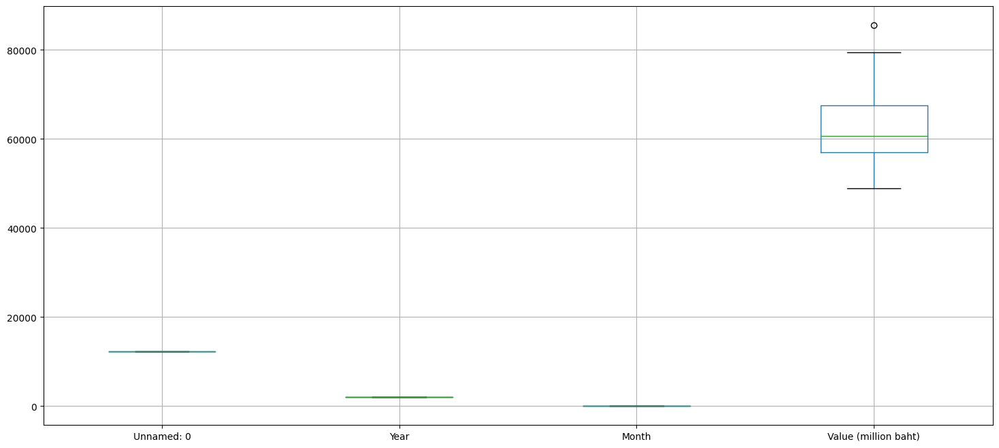

In [ ]:
data_jp.boxplot()

In [ ]:
def find_outlier(data):
  Q1 = np.percentile(data, 25)
  Q3 = np.percentile(data, 75)
  IQR = Q3 - Q1
  lower = Q1 - 1.5 * IQR
  upper = Q3 + 1.5 * IQR
  outlier = data[(data < lower) | (data > upper) ]
  return outlier

outlier_data_jp = find_outlier(data_jp['Value (million baht)'])
print("Outlier in Value:")
print(outlier_data_jp)
# print("Lower:", lower , "Upper: ", upper)

# จำนวน rows ที่มี outlier
outlier_count_data_jp = len(outlier_data_jp)

# จำนวน rows ทั้งหมด
total_rows_jp = len(data_jp)

# คำนวณเปอร์เซ็นต์ของ rows ที่มี outlier
percentage_outlier_jp = (outlier_count_data_jp / total_rows_jp) * 100

print(f"เปอร์เซ็นต์ของ rows ที่มี outlier: {percentage_outlier_jp:.2f}%")

Outlier in Value:
122    85521.854086
Name: Value (million baht), dtype: float64
เปอร์เซ็นต์ของ rows ที่มี outlier: 0.79%


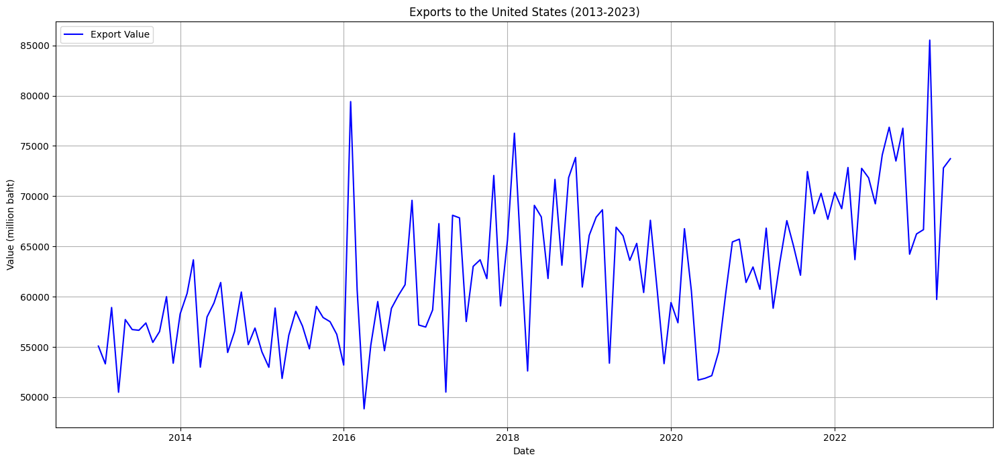

In [ ]:
import matplotlib.pyplot as plt

# Convert Year and Month columns to a datetime format for easier plotting
data_jp['Date'] = pd.to_datetime(data_jp[['Year', 'Month']].assign(DAY=1))

# Plotting the data
plt.figure(figsize=(15, 7))
plt.plot(data_jp['Date'], data_jp['Value (million baht)'], label='Export Value', color='blue')
plt.title('Exports to the United States (2013-2023)')
plt.xlabel('Date')
plt.ylabel('Value (million baht)')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

In [ ]:
#Integrated (d)
from statsmodels.tsa.stattools import adfuller
def adf_test(timeseries):
    print ('Results of Dickey-Fuller Test:')
    dftest = adfuller(timeseries, autolag='AIC')
    dfoutput = pd.Series(dftest[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
    for key,value in dftest[4].items():
        dfoutput['Critical Value (%s)'%key] = value
    print (dfoutput)
# Call the function and run the test

adf_test(data_jp['Value (million baht)'])

Results of Dickey-Fuller Test:
Test Statistic                  -1.298462
p-value                          0.629876
#Lags Used                      12.000000
Number of Observations Used    113.000000
Critical Value (1%)             -3.489590
Critical Value (5%)             -2.887477
Critical Value (10%)            -2.580604
dtype: float64


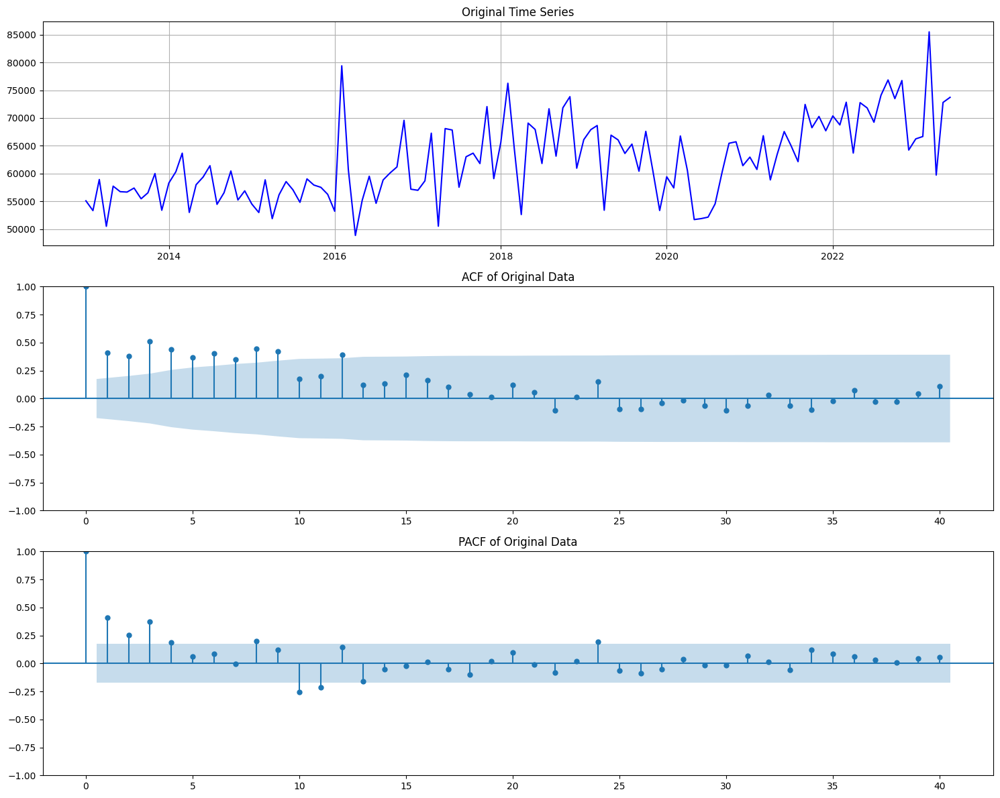

In [ ]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

# Prepare the data
X = data_jp[['Year', 'Month']]
y_jp = data_jp['Value (million baht)']

# Split the data into training and testing sets (80% train, 20% test)
X_train, X_test, y_train, y_test = train_test_split(X, y_jp, test_size=0.2, random_state=42, shuffle=False)

# Plotting the raw data
fig, ax = plt.subplots(3, figsize=(15, 12))

# Plotting the actual values
ax[0].plot(data_jp['Date'], y_jp, label='Original Data', color='blue')
ax[0].set_title('Original Time Series')
ax[0].grid(True)

# Plotting the ACF of the original data
plot_acf(y_jp, lags=40, ax=ax[1], title="ACF of Original Data")

# Plotting the PACF of the original data
plot_pacf(y_jp, lags=40, ax=ax[2], title="PACF of Original Data")

plt.tight_layout()
plt.show()

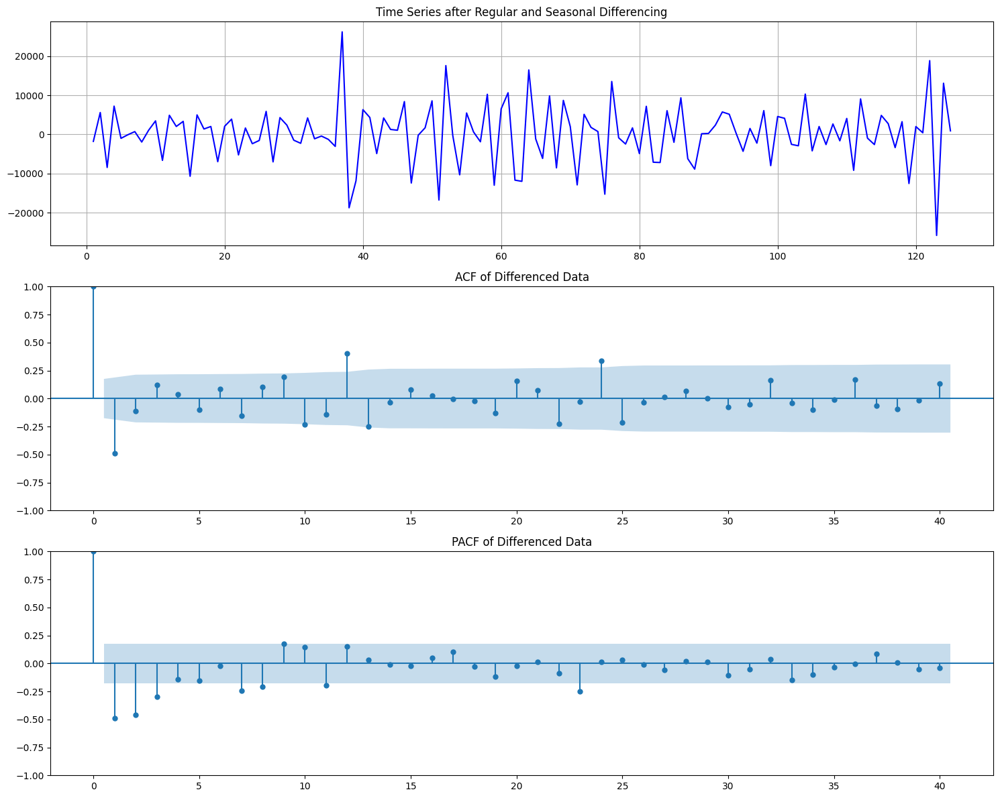

In [ ]:
# Differencing the data
diff_data_jp = y_jp.diff().dropna()  # Regular differencing
# seasonal_diff_data = diff_data.diff(12).dropna()  # Seasonal differencing

# Plotting the differenced data and its ACF and PACF
fig, ax = plt.subplots(3, figsize=(15, 12))

# Time series after differencing
ax[0].plot(diff_data_jp.index, diff_data_jp, label='Differenced Data', color='blue')
ax[0].set_title('Time Series after Regular and Seasonal Differencing')
ax[0].grid(True)

# ACF of differenced data
plot_acf(diff_data_jp, lags=40, ax=ax[1], title="ACF of Differenced Data")

# PACF of differenced data
plot_pacf(diff_data_jp, lags=40, ax=ax[2], title="PACF of Differenced Data")

plt.tight_layout()
plt.show()

In [ ]:
#Integrated (d)
from statsmodels.tsa.stattools import adfuller
def adf_test(timeseries):
    print ('Results of Dickey-Fuller Test:')
    dftest = adfuller(timeseries, autolag='AIC')
    dfoutput = pd.Series(dftest[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
    for key,value in dftest[4].items():
        dfoutput['Critical Value (%s)'%key] = value
    print (dfoutput)
# Call the function and run the test

adf_test(diff_data_jp)

Results of Dickey-Fuller Test:
Test Statistic                  -3.153821
p-value                          0.022818
#Lags Used                      11.000000
Number of Observations Used    113.000000
Critical Value (1%)             -3.489590
Critical Value (5%)             -2.887477
Critical Value (10%)            -2.580604
dtype: float64


In [ ]:
# Find the best SARIMA parameters for the differenced data (assuming d=0 and D=0 since we manually differenced the data)

best_aic_diff_jp = float("inf")
best_pdq_diff_jp = None
best_seasonal_pdq_diff_jp = None

# Adjust the pdq and seasonal_pdq values for the grid search
p = q = d = range(0, 2)
# d = [0]  # No additional differencing
pdq_diff = [(x[0], x[1], x[2]) for x in list(itertools.product(p, d, q))]
seasonal_pdq_diff = [(x[0], x[1], x[2], 12) for x in list(itertools.product(p, d, q))]

# Grid search for the best parameters for differenced data
for param in pdq_diff:
    for param_seasonal in seasonal_pdq_diff:
        try:
            mod_diff_jp = SARIMAX(diff_data_jp, order=param, seasonal_order=param_seasonal, enforce_stationarity=False, enforce_invertibility=False)
            results_diff_jp = mod_diff_jp.fit(disp=0)
            if results_diff_jp.aic < best_aic_diff_jp:
                best_aic_diff_jp = results_diff_jp.aic
                best_pdq_diff_jp = param
                best_seasonal_pdq_diff_jp = param_seasonal
        except:
            continue

best_aic_diff_jp, best_pdq_diff_jp, best_seasonal_pdq_diff_jp

(1998.5661862806442, (0, 0, 1), (0, 1, 1, 12))

### LOOCV

In [ ]:
# กำหนดจุดเริ่มต้นสำหรับ LOOCV
start_index = 15

mse_scores_loocv_ori_jp = []
predictions_loocv_ori_jp = []  # เพิ่มรายการเพื่อเก็บค่าทำนาย

# Iterate through the differenced dataset starting from the 25th data point for LOOCV
for i in range(start_index, len(y_jp) - 1):
    y_train_loocv_ori, y_test_loocv_ori = y_jp[:i], y_jp[i:i+1]

    # Fit the SARIMA model with the best parameters for differenced data
    model_loocv_ori_jp = SARIMAX(y_train_loocv_ori, order=(0, 0, 1), seasonal_order=(0, 1, 1, 12), enforce_stationarity=False, enforce_invertibility=False)
    results_loocv_ori = model_loocv_ori_jp.fit(disp=0)

    # Predict on the test set
    pred_loocv_ori = results_loocv_ori.predict(start=len( y_train_loocv_ori), end=len( y_train_loocv_ori), dynamic=False)

    # Calculate and store the MSE for this iteration
    mse_scores_loocv_ori_jp.append(mean_squared_error(y_test_loocv_ori, pred_loocv_ori))

    # Store the predictions
    predictions_loocv_ori_jp.append(pred_loocv_ori.values[0])  # เพิ่มค่าทำนายลงในรายการ

# Calculate the average MSE over all LOOCV iterations for differenced data
avg_mse_loocv_ori_jp = sum(mse_scores_loocv_ori_jp) / len(mse_scores_loocv_ori_jp)

# Print the predictions
print("Predictions:", predictions_loocv_ori_jp)

# Print the average MSE
print("Average MSE:", avg_mse_loocv_ori_jp)

Predictions: [50493.09369899999, 57722.759299000005, 55293.14728300359, 50063.870837327304, 56603.71681969373, 54835.81329006571, 56452.75822808502, 60477.144102484424, 54139.342798083926, 57382.98496629596, 61609.128966277414, 65144.39112037521, 50509.59035301343, 56248.411353412346, 55041.541500753236, 59425.416373165004, 53154.35209356878, 54457.89768790744, 59593.9045044339, 54364.388065772175, 55511.51773414429, 55066.27365406506, 53557.583133342225, 53730.551160223906, 51797.484251194925, 56266.77887751447, 58408.495914956395, 57421.663179475574, 54652.93432308525, 58300.22323476039, 57997.61102858071, 57046.40624810734, 56697.42262709861, 53465.359562396276, 79667.64072228032, 60534.70234173708, 48452.22546704556, 55030.40673145044, 58899.36718983202, 54738.85179329688, 58908.46382286748, 60244.1075596592, 61315.64397324805, 69601.8488153447, 57272.65466636722, 57049.671366500756, 62086.25860129683, 67410.75167176976, 50019.245194115436, 65779.70014706331, 66458.78098560011, 572

In [ ]:
results_loocv_ori = model_loocv_ori_jp.fit()
print( results_loocv_ori.summary().tables[1])

                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1          0.3020      0.106      2.860      0.004       0.095       0.509
ma.S.L12      -0.2357      0.081     -2.921      0.003      -0.394      -0.078
sigma2      4.772e+07   4.86e-10   9.81e+16      0.000    4.77e+07    4.77e+07


In [ ]:
import numpy as np

# Calculate MAPE
def mean_absolute_percentage_error(y_true, y_pred):
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

# Calculate MAE, RMSE, and MAPE
mae_loocv_ori_jp = np.mean(np.abs(np.array(y_test_loocv_ori) - np.array(predictions_loocv_ori_jp)))
rmse_loocv_ori_jp = np.sqrt(np.mean(np.square(np.array(y_test_loocv_ori) - np.array(predictions_loocv_ori_jp))))
mape_loocv_ori_jp = mean_absolute_percentage_error(np.array(y_test_loocv_ori), np.array(predictions_loocv_ori_jp))

# Print the results
print("MAE (Mean Absolute Error):", mae_loocv_ori_jp)
print("RMSE (Root Mean Square Error):", rmse_loocv_ori_jp)
print("MAPE (Mean Absolute Percentage Error):", mape_loocv_ori_jp)

MAE (Mean Absolute Error): 11867.259157384386
RMSE (Root Mean Square Error): 13236.122331699451
MAPE (Mean Absolute Percentage Error): 16.299906826626685


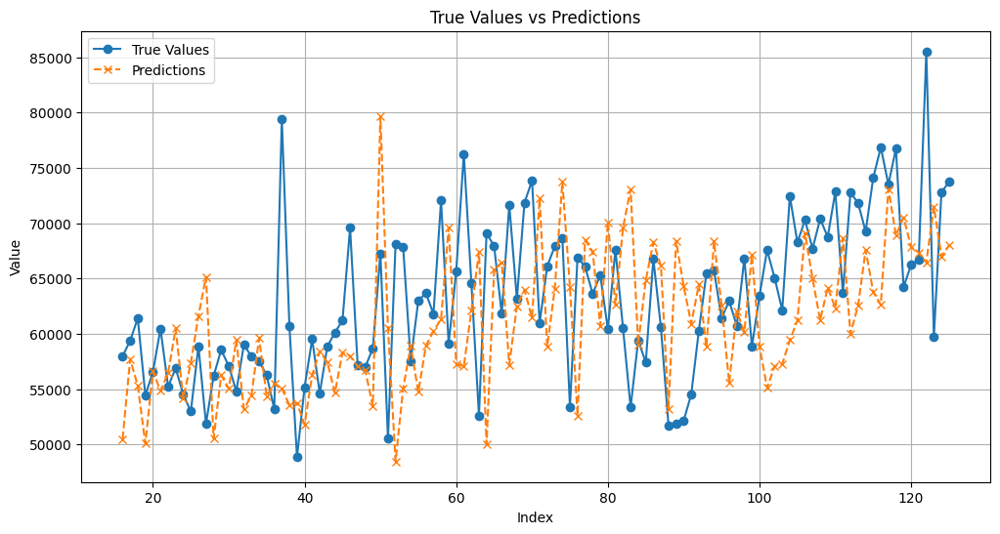

In [ ]:
import matplotlib.pyplot as plt

# ค่าจริง
true_values_y_jp = y_jp[start_index+1:]  # นี่คือค่าจริงที่เราทดสอบด้วย LOOCV

# พล็อตกราฟค่าจริงและค่าทำนาย
plt.figure(figsize=(12, 6))
plt.plot(true_values_y_jp.index, true_values_y_jp, label='True Values', marker='o')
plt.plot(true_values_y_jp.index, predictions_loocv_ori_jp, label='Predictions', marker='x', linestyle='dashed')
plt.xlabel('Index')
plt.ylabel('Value')
plt.title('True Values vs Predictions')
plt.legend()
plt.grid(True)
plt.show()

### Forecast

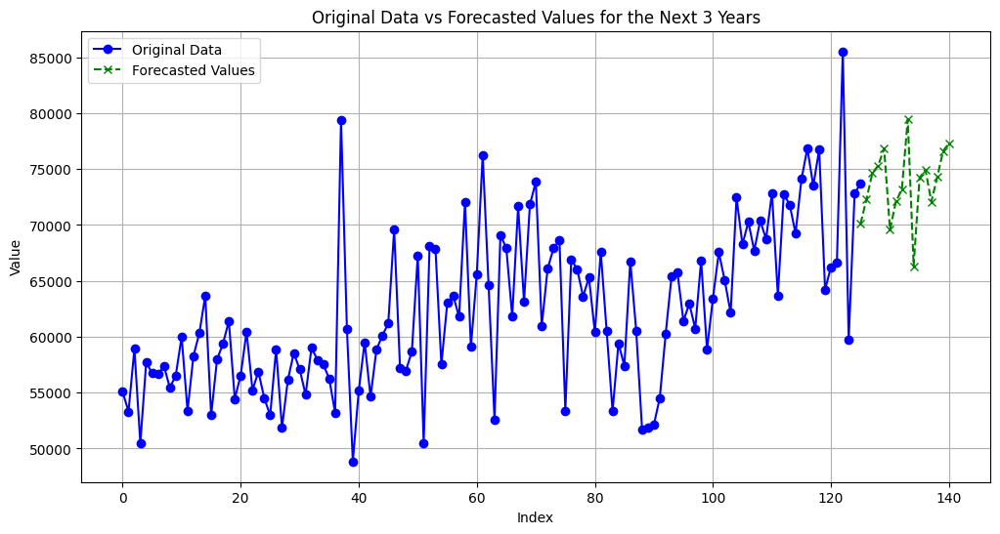

In [ ]:
def forecast_sarima_with_differenced_data(y, start_index, order, seasonal_order):
  """Forecasts the next `start_index` years using the SARIMA model with differenced data.

  Args:
    y: A Pandas Series containing the time series data.
    start_index: The index of the first data point to forecast.
    order: The order of the SARIMA model (p, d, q).
    seasonal_order: The seasonal order of the SARIMA model (P, D, Q, s).

  Returns:
    A Pandas Series containing the forecasted values.
  """

  # Difference the data.
  diff_data_jp = y_jp.diff().dropna()

  # Fit the SARIMA model to the differenced data.
  model_loocv_ori_jp = SARIMAX(diff_data_jp, order=order, seasonal_order=seasonal_order, enforce_stationarity=False, enforce_invertibility=False)
  results_loocv_ori_jp = model_loocv_ori_jp.fit(disp=0)

  # Check if the forecast is empty.
  if not diff_data_jp.empty:
    # Make predictions for the next `start_index` years.
    forecast_loocv_ori = results_loocv_ori_jp.predict(start=len(diff_data_jp), end=len(diff_data_jp) + start_index, dynamic=False)

    # Convert the forecasted differenced values back to the original scale.
    forecasted_values_y_jp = forecast_loocv_ori.cumsum() + y.iloc[-1]  # Use iloc to access the last value in the original data.
    return forecasted_values_y_jp
  else:
    # Raise an error if the forecast is empty.
    raise ValueError("The SARIMA model failed to fit the data or the forecast is beyond the end of the dataset.")

# Forecast the next 3 years using the SARIMA model with differenced data.
try:
    forecasted_values_y_jp = forecast_sarima_with_differenced_data(y_jp, start_index=15, order=(0, 0, 1), seasonal_order=(0, 1, 1, 12))

    # Plot the forecasted values.
    import matplotlib.pyplot as plt

    # Plot both original data and forecasted data
    plt.figure(figsize=(12, 6))
    plt.plot(y_jp.index, y_jp, label='Original Data', marker='o', color='blue')
    plt.plot(forecasted_values_y_jp.index, forecasted_values_y_jp, label='Forecasted Values', marker='x', linestyle='dashed', color='green')
    plt.xlabel('Index')
    plt.ylabel('Value')
    plt.title('Original Data vs Forecasted Values for the Next 3 Years')
    plt.legend()
    plt.grid(True)
    plt.show()
except ValueError as e:
    print(e)

In [ ]:
# Forecast the next 3 years.
start_index = 15
order = (0, 0, 1)
seasonal_order = (0, 1, 1, 12)
forecasted_values_y_jp = forecast_sarima_with_differenced_data(y_jp, start_index, order, seasonal_order)

# Print the forecasted values.
print(forecasted_values_y_jp)

125    70088.840117
126    72288.899902
127    74627.312204
128    75321.450484
129    76850.845590
130    69564.394055
131    72110.970784
132    73152.991440
133    79440.962805
134    66322.133047
135    74213.549445
136    74944.181749
137    72085.343466
138    74285.403251
139    76623.815552
140    77317.953832
Name: predicted_mean, dtype: float64


# US85

array([[<Axes: title={'center': 'Unnamed: 0'}>,
        <Axes: title={'center': 'HS 2dg'}>],
       [<Axes: title={'center': 'Year'}>,
        <Axes: title={'center': 'Month'}>],
       [<Axes: title={'center': 'Value (million baht)'}>, <Axes: >]],
      dtype=object)

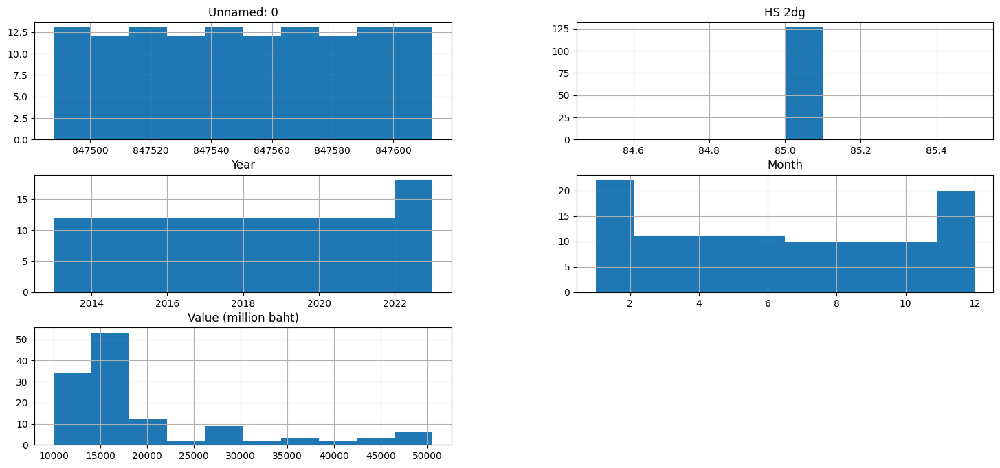

In [ ]:
us85 = pd.read_csv('/content/newus85.csv')
us85.hist()

<Axes: >

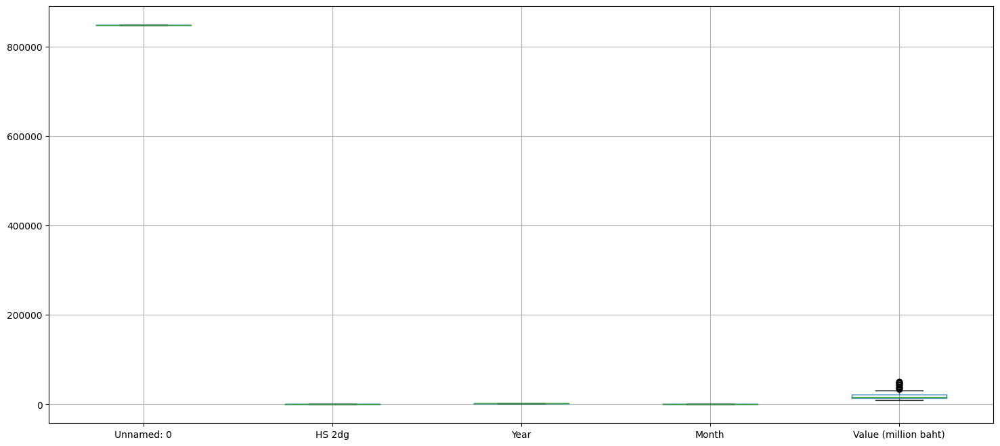

In [ ]:
us85.boxplot()

In [ ]:
us85.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 126 entries, 0 to 125
Data columns (total 6 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Unnamed: 0            126 non-null    int64  
 1   Country               126 non-null    object 
 2   HS 2dg                126 non-null    int64  
 3   Year                  126 non-null    int64  
 4   Month                 126 non-null    int64  
 5   Value (million baht)  126 non-null    float64
dtypes: float64(1), int64(4), object(1)
memory usage: 6.0+ KB


In [ ]:
def find_outlier(data):
  Q1 = np.percentile(data, 25)
  Q3 = np.percentile(data, 75)
  IQR = Q3 - Q1
  lower = Q1 - 1.5 * IQR
  upper = Q3 + 1.5 * IQR
  outlier = data[(data < lower) | (data > upper) ]
  return outlier

outlier_us85 = find_outlier(us85['Value (million baht)'])
print("Outlier in Value:")
print(outlier_us85)
# print("Lower:",lower, "Upper: ",upper)
# จำนวน rows ที่มี outlier
outlier_count_us85 = len(outlier_us85)

# จำนวน rows ทั้งหมด
total_rows_us85 = len(us85)

# คำนวณเปอร์เซ็นต์ของ rows ที่มี outlier
percentage_outlier_us85 = (outlier_count_us85 / total_rows_us85) * 100

print(f"เปอร์เซ็นต์ของ rows ที่มี outlier: {percentage_outlier_us85:.2f}%")

Outlier in Value:
110    33516.595153
112    35351.751604
113    36996.295099
114    38613.790356
115    42897.868620
116    50406.402734
117    44366.302734
118    47851.880350
119    48707.316617
120    39087.856443
121    36606.894376
122    47297.341029
123    42785.757627
124    46762.627003
125    50541.969382
Name: Value (million baht), dtype: float64
เปอร์เซ็นต์ของ rows ที่มี outlier: 11.90%


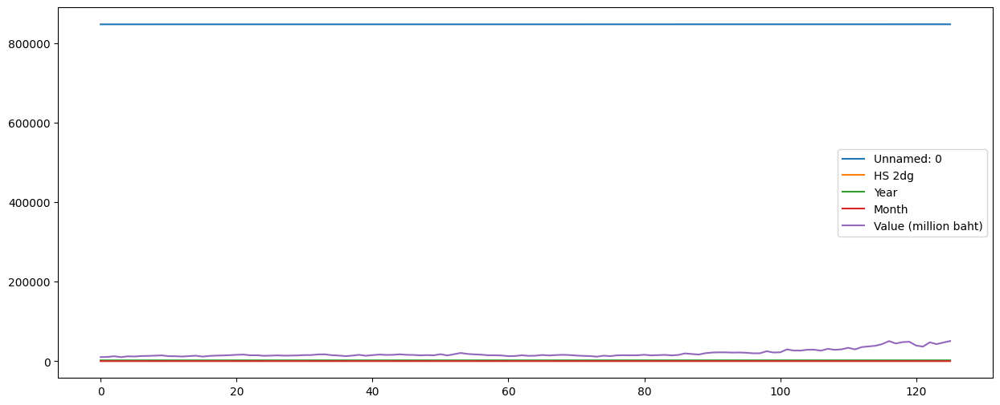

In [ ]:
us85.plot(figsize=(15, 6))
plt.show()

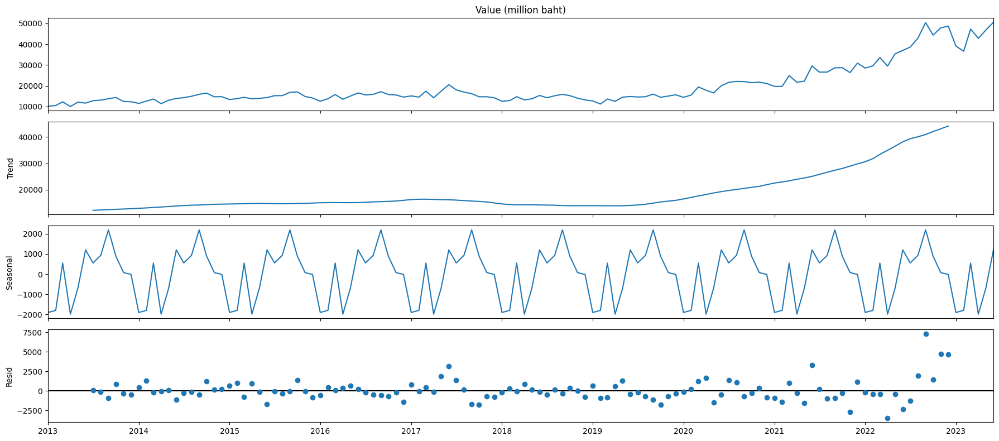

In [ ]:
# แปลงคอลัมน์ 'Month' เป็นข้อความ
us85['Month'] = us85['Month'].astype(str)

# แปลงคอลัมน์ 'Year' เป็นข้อความ
us85['Year'] = us85['Year'].astype(str)

# แปลงคอลัมน์ 'Month Year' เป็นรูปแบบ '01-2020'
us85['Month Year'] = us85['Month'].str.zfill(2) + '-' + us85['Year']

# แปลงคอลัมน์ 'Month Year' เป็น DatetimeIndex และระบุความถี่เป็นรายเดือน ('M')
us85_datetime= us85.set_index(pd.to_datetime(us85['Month Year'], format='%m-%Y', errors='coerce'))

rcParams['figure.figsize'] = (18, 8)  # กำหนดขนาดกราฟใหญ่ขึ้น
decomposition = sm.tsa.seasonal_decompose(us85_datetime['Value (million baht)'], model='additive', period=12)
fig = decomposition.plot()
plt.show()

## Check stationary test

In [ ]:
#Integrated (d)
from statsmodels.tsa.stattools import adfuller
def adf_test(timeseries):
    print ('Results of Dickey-Fuller Test:')
    dftest = adfuller(timeseries, autolag='AIC')
    dfoutput = pd.Series(dftest[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
    for key,value in dftest[4].items():
        dfoutput['Critical Value (%s)'%key] = value
    print (dfoutput)
# Call the function and run the test

adf_test(us85['Value (million baht)'])

Results of Dickey-Fuller Test:
Test Statistic                   1.796074
p-value                          0.998341
#Lags Used                      12.000000
Number of Observations Used    113.000000
Critical Value (1%)             -3.489590
Critical Value (5%)             -2.887477
Critical Value (10%)            -2.580604
dtype: float64


In [ ]:
us85_new = us85_datetime.copy()
us85_new

,Unnamed: 0,Country,HS 2dg,Year,Month,Value (million baht),Month Year
Month Year,,,,,,,
2013-01-01,847488,UNITED STATES,85,2013,1,10116.839448,01-2013
2013-02-01,847489,UNITED STATES,85,2013,2,10521.671956,02-2013
2013-03-01,847490,UNITED STATES,85,2013,3,12282.185198,03-2013
2013-04-01,847491,UNITED STATES,85,2013,4,10010.587687,04-2013
2013-05-01,847492,UNITED STATES,85,2013,5,12124.524680,05-2013
...,...,...,...,...,...,...,...
2023-02-01,847609,UNITED STATES,85,2023,2,36606.894376,02-2023
2023-03-01,847610,UNITED STATES,85,2023,3,47297.341029,03-2023
2023-04-01,847611,UNITED STATES,85,2023,4,42785.757627,04-2023


## Differencing

p-Values:0.46115158781229415


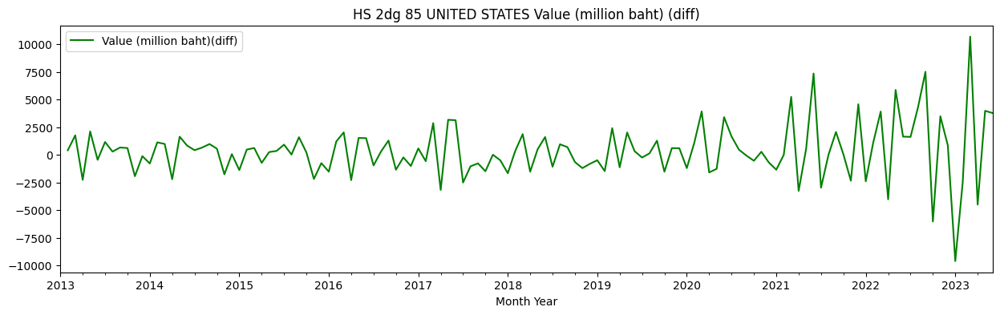

In [ ]:
#First difference
us85_new['Value (million baht)_diff'] = us85_new['Value (million baht)'].diff()
us85_new['Value (million baht)_diff'].plot(color = 'green', figsize = (15,4))
plt.legend(['Value (million baht)(diff)'])
plt.title('HS 2dg 85 UNITED STATES Value (million baht) (diff)')

us85_new_adf = adfuller(us85_new['Value (million baht)_diff'].dropna(), autolag = 'AIC')
print('p-Values:' + str(us85_new_adf[1]))

p-Values:9.222605140286533e-11


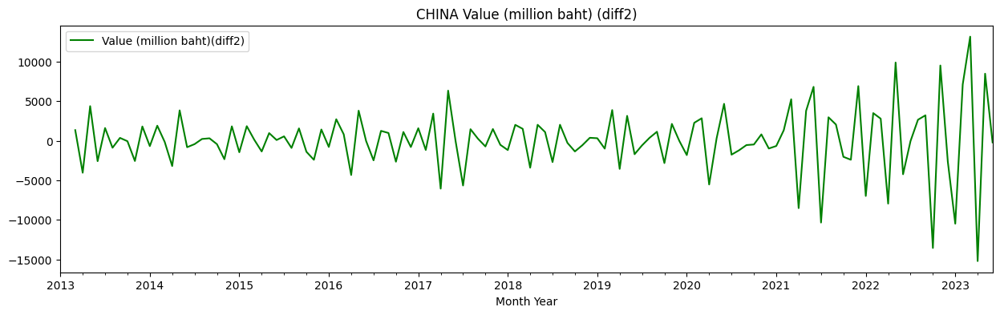

In [ ]:
#Second difference
us85_new['Value (million baht)_diff2'] = us85_new['Value (million baht)_diff'].diff()
us85_new['Value (million baht)_diff2'].plot(color = 'green', figsize = (15,4))
plt.legend(['Value (million baht)(diff2)'])
plt.title('CHINA Value (million baht) (diff2)')

us85_new_adf2 = adfuller(us85_new['Value (million baht)_diff2'].dropna(), autolag = 'AIC')
print('p-Values:' + str(us85_new_adf2[1]))

In [ ]:
us85_new

,Unnamed: 0,Country,HS 2dg,Year,Month,Value (million baht),Month Year,Value (million baht)_diff,Value (million baht)_diff2
Month Year,,,,,,,,,
2013-01-01,847488,UNITED STATES,85,2013,1,10116.839448,01-2013,NaN,NaN
2013-02-01,847489,UNITED STATES,85,2013,2,10521.671956,02-2013,404.832508,NaN
2013-03-01,847490,UNITED STATES,85,2013,3,12282.185198,03-2013,1760.513242,1355.680734
2013-04-01,847491,UNITED STATES,85,2013,4,10010.587687,04-2013,-2271.597511,-4032.110753
2013-05-01,847492,UNITED STATES,85,2013,5,12124.524680,05-2013,2113.936993,4385.534504
...,...,...,...,...,...,...,...,...,...
2023-02-01,847609,UNITED STATES,85,2023,2,36606.894376,02-2023,-2480.962067,7138.498107
2023-03-01,847610,UNITED STATES,85,2023,3,47297.341029,03-2023,10690.446653,13171.408720
2023-04-01,847611,UNITED STATES,85,2023,4,42785.757627,04-2023,-4511.583402,-15202.030055


## Model 1 & LOOCV

In [ ]:
column = ['Value (million baht)_diff2','Value (million baht)']
us85_newcolumn = us85_new[column]
us85_newcolumn

,Value (million baht)_diff2,Value (million baht)
Month Year,,
2013-01-01,NaN,10116.839448
2013-02-01,NaN,10521.671956
2013-03-01,1355.680734,12282.185198
2013-04-01,-4032.110753,10010.587687
2013-05-01,4385.534504,12124.524680
...,...,...
2023-02-01,7138.498107,36606.894376
2023-03-01,13171.408720,47297.341029
2023-04-01,-15202.030055,42785.757627


In [ ]:
# แบ่งข้อมูลออกเป็น 125 rows สำหรับ training และ 1 rows สำหรับ testing
us85_newcolumn_train = us85_newcolumn.iloc[:125]
us85_newcolumn_test = us85_newcolumn.iloc[125:]

# กำหนดช่วงของลำดับ
p_range = range(0, 2)
d_range = range(0, 2)
q_range = range(0, 2)

# กำหนดช่วงของลำดับฤดูกาล
P_range = range(0, 2)
D_range = range(0, 2)
Q_range = range(0, 2)

# สร้างพจนานุกรมสำหรับเก็บค่าพารามิเตอร์
param_grid = dict(
    p=p_range,
    d=d_range,
    q=q_range,
    P=P_range,
    D=D_range,
    Q=Q_range,
)

# เลือกโมเดลที่ดีที่สุดโดยใช้ AIC
best_model_us85 = None
best_aic_us85 = float("inf")

for p in param_grid['p']:
    for d in param_grid['d']:
        for q in param_grid['q']:
            for P in param_grid['P']:
                for D in param_grid['D']:
                    for Q in param_grid['Q']:
                        order = (p, d, q)
                        seasonal_order = (P, D, Q, 12)

                        # สร้างโมเดล SARIMA
                        sarima_model_us85_newcolumn = SARIMAX(us85_newcolumn_train['Value (million baht)_diff2'], order=order, seasonal_order=seasonal_order, enforce_stationarity=False)

                        # ฝึกโมเดล
                        sarima_fit_us85_newcolumn = sarima_model_us85_newcolumn.fit()

                        # คำนวณ AIC
                        aic = sarima_fit_us85_newcolumn.aic

                        # บันทึกโมเดลที่มี AIC ต่ำสุด
                        if aic < best_aic_us85:
                            best_model_us85 = sarima_fit_us85_newcolumn
                            best_aic_us85 = aic
                            best_param_us85 = (p, d, q, P, D, Q)

# แสดงค่าพารามิเตอร์ที่ดีที่สุด
print("Best Parameters:", best_param_us85)
print("Best AIC:", best_aic_us85)

Best Parameters: (1, 0, 1, 0, 1, 1)
Best AIC: 1804.590632336753


In [ ]:
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error

# ทำนายค่าสำหรับชุดข้อมูลทดสอบ
y_pred_us85 = best_model_us85.predict(start=us85_newcolumn_test.index[0], end=us85_newcolumn_test.index[-1])

# คำนวณ MAE และ RMSE และ MSE
mae_us85 = mean_absolute_error(us85_newcolumn_test['Value (million baht)_diff2'], y_pred_us85)
rmse_us85 = mean_squared_error(us85_newcolumn_test['Value (million baht)_diff2'], y_pred_us85) ** 0.5
mse_us85 = rmse_us85 ** 2

# แสดงค่า MAE และ RMSE
print("MAE:", mae_us85)
print("RMSE:", rmse_us85)
print("MSE:", mse_us85)

MAE: 646.6056293928759
RMSE: 646.6056293928759
MSE: 418098.8399625572


In [ ]:
p = d = q = range(0, 2)
pdq = list(itertools.product(p, d, q))
seasonal_pdq = [(x[0], x[1], x[2], 12) for x in list(itertools.product(p, d, q))]
print('Examples of parameter combinations for Seasonal ARIMA...')
print('SARIMAX: {} x {}'.format(pdq[1], seasonal_pdq[1]))
print('SARIMAX: {} x {}'.format(pdq[1], seasonal_pdq[2]))
print('SARIMAX: {} x {}'.format(pdq[2], seasonal_pdq[3]))
print('SARIMAX: {} x {}'.format(pdq[2], seasonal_pdq[4]))

Examples of parameter combinations for Seasonal ARIMA...
SARIMAX: (0, 0, 1) x (0, 0, 1, 12)
SARIMAX: (0, 0, 1) x (0, 1, 0, 12)
SARIMAX: (0, 1, 0) x (0, 1, 1, 12)
SARIMAX: (0, 1, 0) x (1, 0, 0, 12)


In [ ]:
for param in pdq:
    for param_seasonal in seasonal_pdq:
        try:
            mod = sm.tsa.statespace.SARIMAX(us85_newcolumn['Value (million baht)'],
                                            order=param,
                                            seasonal_order=param_seasonal,
                                            enforce_stationarity=False,
                                            enforce_invertibility=False)
            results = mod.fit()
            print('ARIMA{}x{}12 - AIC:{}'.format(param, param_seasonal, results.aic))
        except Exception as e:
            print(e)
            continue

ARIMA(0, 0, 0)x(0, 0, 0, 12)12 - AIC:2856.5366783778322
ARIMA(0, 0, 0)x(0, 0, 1, 12)12 - AIC:2532.4993079326728
ARIMA(0, 0, 0)x(0, 1, 0, 12)12 - AIC:2296.0339631682737
ARIMA(0, 0, 0)x(0, 1, 1, 12)12 - AIC:2048.947334641337
ARIMA(0, 0, 0)x(1, 0, 0, 12)12 - AIC:2234.9353933712478
ARIMA(0, 0, 0)x(1, 0, 1, 12)12 - AIC:2214.9436305209038
ARIMA(0, 0, 0)x(1, 1, 0, 12)12 - AIC:1999.2139330777604
ARIMA(0, 0, 0)x(1, 1, 1, 12)12 - AIC:1983.6450374296678
ARIMA(0, 0, 1)x(0, 0, 0, 12)12 - AIC:2748.967120257068
ARIMA(0, 0, 1)x(0, 0, 1, 12)12 - AIC:2468.2258118713326
ARIMA(0, 0, 1)x(0, 1, 0, 12)12 - AIC:2214.0968334789845
ARIMA(0, 0, 1)x(0, 1, 1, 12)12 - AIC:1978.0070571306321
ARIMA(0, 0, 1)x(1, 0, 0, 12)12 - AIC:2172.0414356446113
ARIMA(0, 0, 1)x(1, 0, 1, 12)12 - AIC:2457.930915752202
ARIMA(0, 0, 1)x(1, 1, 0, 12)12 - AIC:2008.0545370493599
ARIMA(0, 0, 1)x(1, 1, 1, 12)12 - AIC:1927.6402249975606
ARIMA(0, 1, 0)x(0, 0, 0, 12)12 - AIC:2296.965681959041
ARIMA(0, 1, 0)x(0, 0, 1, 12)12 - AIC:2063.3179108493

In [ ]:
mod_us85 = sm.tsa.statespace.SARIMAX(us85_newcolumn['Value (million baht)'],
                                order=(1, 0, 1),
                                seasonal_order=(0, 1, 1, 12),
                                enforce_invertibility=False)
results_us85 = mod_us85.fit()
print(results_us85.summary().tables[1])

                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.9798      0.011     89.195      0.000       0.958       1.001
ma.L1         -0.2274      0.061     -3.751      0.000      -0.346      -0.109
ma.S.L12      -0.5281      0.100     -5.258      0.000      -0.725      -0.331
sigma2      4.601e+06   4.36e-09   1.06e+15      0.000     4.6e+06     4.6e+06


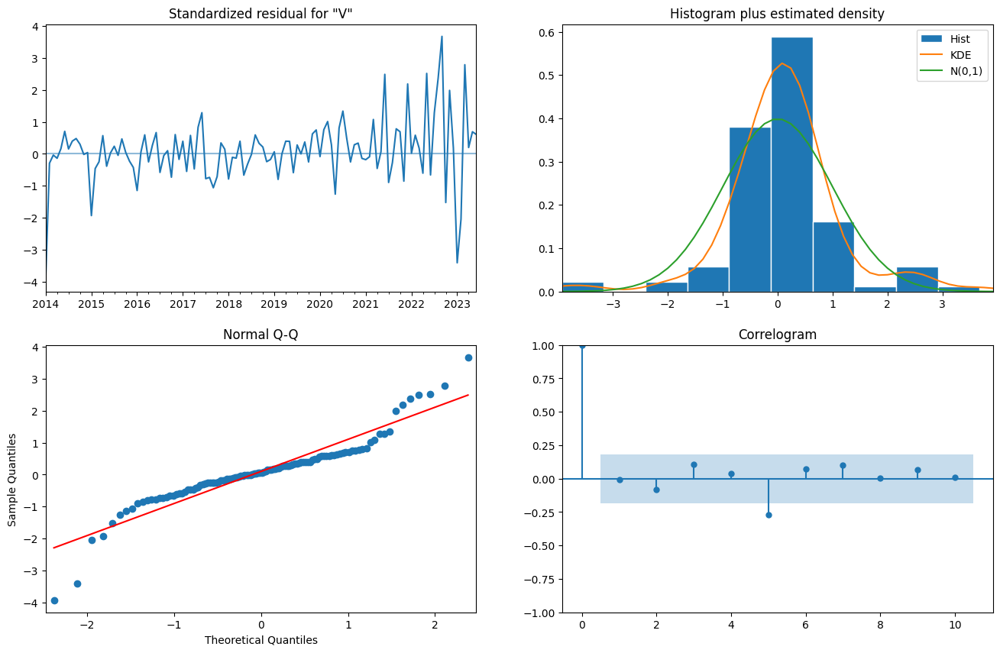

In [ ]:
results_us85.plot_diagnostics(figsize=(16, 10))
plt.show()

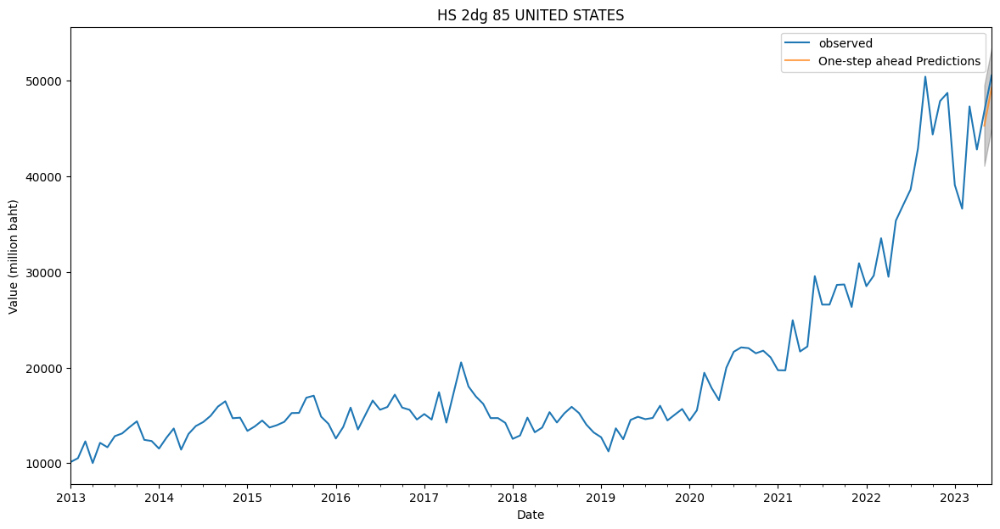

In [ ]:
pred_us85 = results_us85.get_prediction(start=pd.to_datetime('2023-05-01'), dynamic=False)
pred_ci_us85 = pred_us85.conf_int()
ax = us85_newcolumn['Value (million baht)']['2013':].plot(label='observed')
pred_us85.predicted_mean.plot(ax=ax, label='One-step ahead Predictions', alpha=.7, figsize=(14, 7))
ax.fill_between(pred_ci_us85.index,
                pred_ci_us85.iloc[:, 0],
                pred_ci_us85.iloc[:, 1], color='k', alpha=.2)
ax.set_xlabel('Date')
ax.set_ylabel('Value (million baht)')
ax.set_title('HS 2dg 85 UNITED STATES')
plt.legend()
plt.show()

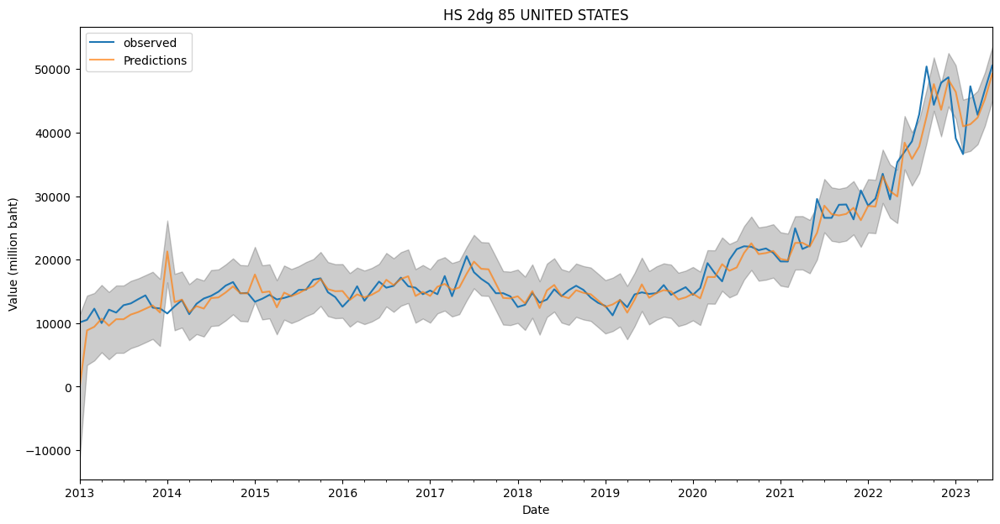

In [ ]:
pred_us85_total = results_us85.get_prediction(start=pd.to_datetime('2013-01-01'), dynamic=False)
pred_ci_us85 = pred_us85_total.conf_int()
ax = us85_newcolumn['Value (million baht)']['2013':].plot(label='observed')
pred_us85_total.predicted_mean.plot(ax=ax, label='Predictions', alpha=.7, figsize=(14, 7))
ax.fill_between(pred_ci_us85.index,
                pred_ci_us85.iloc[:, 0],
                pred_ci_us85.iloc[:, 1], color='k', alpha=.2)
ax.set_xlabel('Date')
ax.set_ylabel('Value (million baht)')
ax.set_title('HS 2dg 85 UNITED STATES')
plt.legend()
plt.show()

In [ ]:
forecasted_us85 = pred_us85.predicted_mean
mse_us85 = ((forecasted_us85 - us85_newcolumn_test['Value (million baht)']) ** 2).mean()
# forecasted_g3 = forecasted_us**(1/2)
mape_us85 = (np.abs(us85_newcolumn_test['Value (million baht)'] - forecasted_us85) / np.abs(us85_newcolumn_test['Value (million baht)'])).mean() * 100
print('The Mean Squared Error of forecasts is {}'.format(round(mse_us85, 2)))
print('The Root Mean Squared Error of forecasts is {}'.format(round(np.sqrt(mse_us85), 2)))
print('Mean Absolute Percentage Error (MAPE): {:.2f}%'.format(mape_us85))

The Mean Squared Error of forecasts is 1708377.91
The Root Mean Squared Error of forecasts is 1307.05
Mean Absolute Percentage Error (MAPE): 2.59%


### Forecast

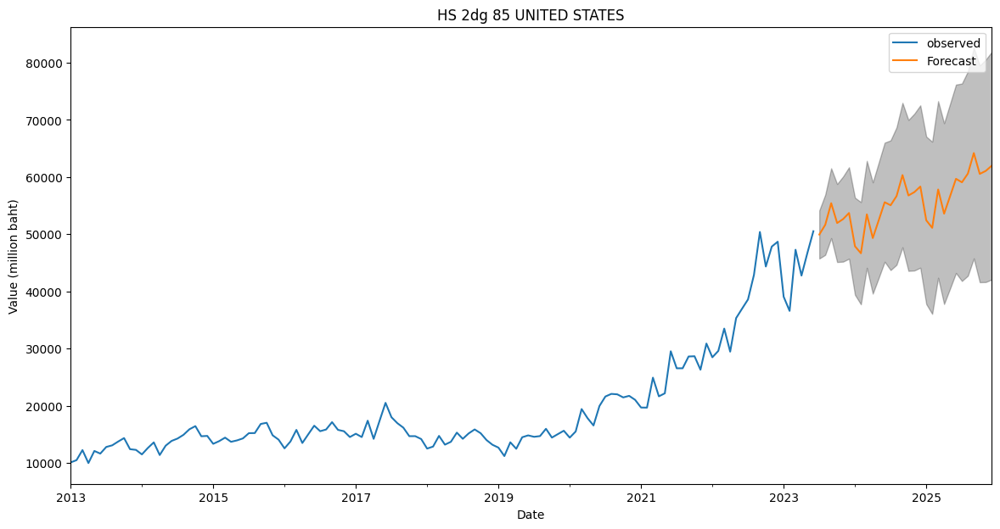

In [ ]:
pred_uc_us85 = results_us85.get_forecast(steps=30)
pred_ci_us85 = pred_uc_us85.conf_int()
ax = us85_newcolumn['Value (million baht)'].plot(label='observed', figsize=(14, 7))
pred_uc_us85.predicted_mean.plot(ax=ax, label='Forecast')
ax.fill_between(pred_ci_us85.index,
                pred_ci_us85.iloc[:, 0],
                pred_ci_us85.iloc[:, 1], color='k', alpha=.25)
ax.set_xlabel('Date')
ax.set_ylabel('Value (million baht)')
ax.set_title('HS 2dg 85 UNITED STATES')
plt.legend()
plt.show()

# US84

array([[<Axes: title={'center': 'Unnamed: 0'}>,
        <Axes: title={'center': 'HS 2dg'}>],
       [<Axes: title={'center': 'Year'}>,
        <Axes: title={'center': 'Month'}>],
       [<Axes: title={'center': 'Value (million baht)'}>, <Axes: >]],
      dtype=object)

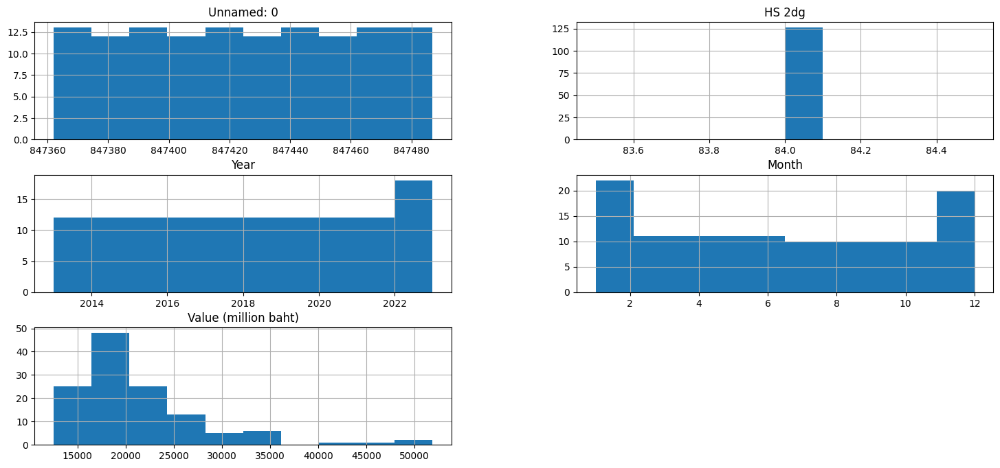

In [ ]:
us84 = pd.read_csv('/content/newus84.csv')
us84.hist()

<Axes: >

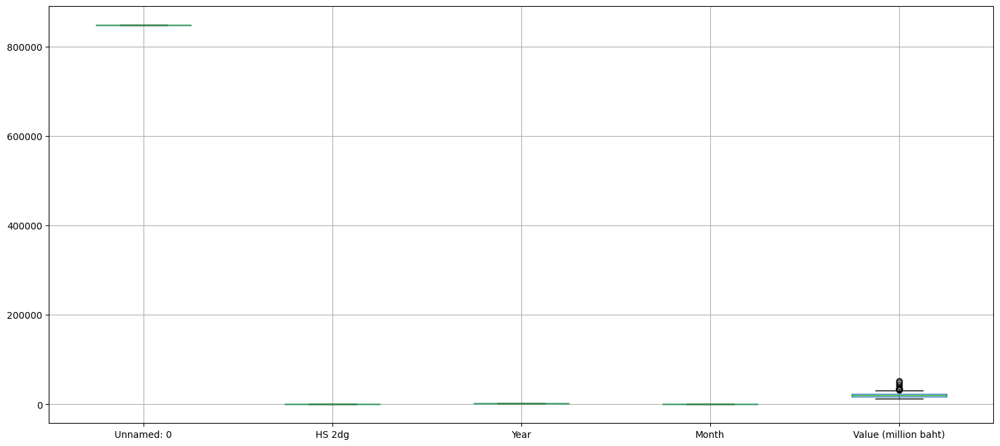

In [ ]:
us84.boxplot()

In [ ]:
us84.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 126 entries, 0 to 125
Data columns (total 6 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Unnamed: 0            126 non-null    int64  
 1   Country               126 non-null    object 
 2   HS 2dg                126 non-null    int64  
 3   Year                  126 non-null    int64  
 4   Month                 126 non-null    int64  
 5   Value (million baht)  126 non-null    float64
dtypes: float64(1), int64(4), object(1)
memory usage: 6.0+ KB


In [ ]:
def find_outlier(data):
  Q1 = np.percentile(data, 25)
  Q3 = np.percentile(data, 75)
  IQR = Q3 - Q1
  lower = Q1 - 1.5 * IQR
  upper = Q3 + 1.5 * IQR
  outlier = data[(data < lower) | (data > upper) ]
  return outlier

outlier_us84 = find_outlier(us84['Value (million baht)'])
print("Outlier in Value:")
print(outlier_us84)
# print("Lower:",lower, "Upper: ",upper)
# จำนวน rows ที่มี outlier
outlier_count_us84 = len(outlier_us84)

# จำนวน rows ทั้งหมด
total_rows_us84 = len(us84)

# คำนวณเปอร์เซ็นต์ของ rows ที่มี outlier
percentage_outlier_us84 = (outlier_count_us84 / total_rows_us84) * 100

print(f"เปอร์เซ็นต์ของ rows ที่มี outlier: {percentage_outlier_us84:.2f}%")

Outlier in Value:
104    33071.669720
107    35806.141530
109    32583.907444
110    40448.373711
113    44426.809033
115    32273.971791
116    51875.100002
119    35569.319318
122    48282.438645
125    33613.158011
Name: Value (million baht), dtype: float64
เปอร์เซ็นต์ของ rows ที่มี outlier: 7.94%


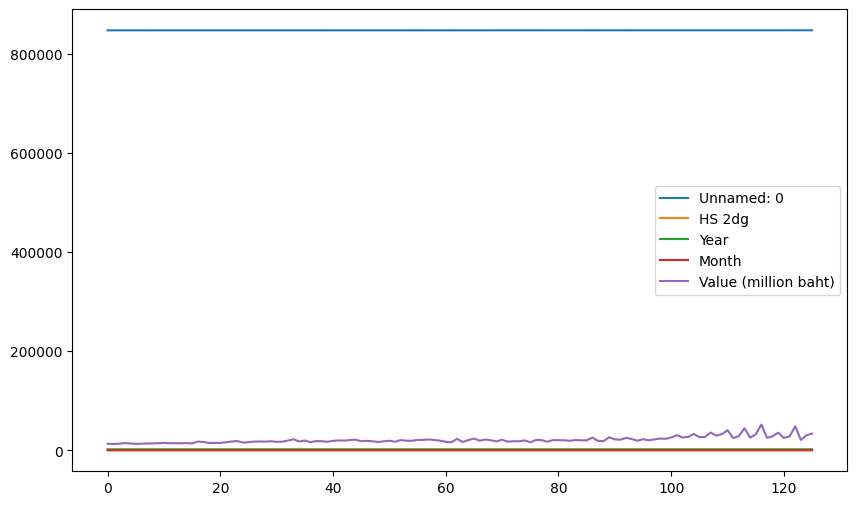

In [ ]:
us84.plot(figsize=(10, 6))
plt.show()

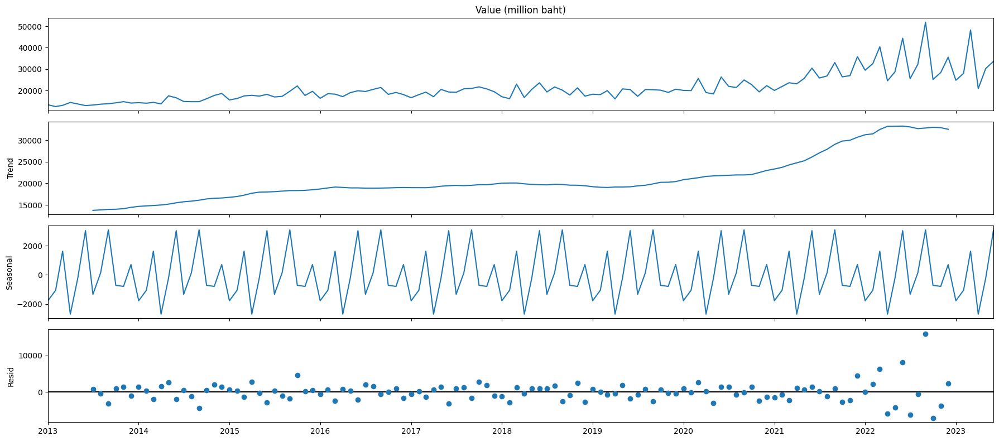

In [ ]:
# แปลงคอลัมน์ 'Month' เป็นข้อความ
us84['Month'] = us84['Month'].astype(str)

# แปลงคอลัมน์ 'Year' เป็นข้อความ
us84['Year'] = us84['Year'].astype(str)

# แปลงคอลัมน์ 'Month Year' เป็นรูปแบบ '01-2020'
us84['Month Year'] = us84['Month'].str.zfill(2) + '-' + us84['Year']

# แปลงคอลัมน์ 'Month Year' เป็น DatetimeIndex และระบุความถี่เป็นรายเดือน ('M')
us84_datetime= us84.set_index(pd.to_datetime(us84['Month Year'], format='%m-%Y', errors='coerce'))

rcParams['figure.figsize'] = (18, 8)  # กำหนดขนาดกราฟใหญ่ขึ้น
decomposition = sm.tsa.seasonal_decompose(us84_datetime['Value (million baht)'], model='additive', period=12)
fig = decomposition.plot()
plt.show()

## Check stationary test

In [ ]:
#Integrated (d)
from statsmodels.tsa.stattools import adfuller
def adf_test(timeseries):
    print ('Results of Dickey-Fuller Test:')
    dftest = adfuller(timeseries, autolag='AIC')
    dfoutput = pd.Series(dftest[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
    for key,value in dftest[4].items():
        dfoutput['Critical Value (%s)'%key] = value
    print (dfoutput)
# Call the function and run the test

adf_test(us84['Value (million baht)'])

Results of Dickey-Fuller Test:
Test Statistic                  -0.514389
p-value                          0.889178
#Lags Used                       5.000000
Number of Observations Used    120.000000
Critical Value (1%)             -3.486056
Critical Value (5%)             -2.885943
Critical Value (10%)            -2.579785
dtype: float64


In [ ]:
us84_new = us84_datetime.copy()
us84_new

,Unnamed: 0,Country,HS 2dg,Year,Month,Value (million baht),Month Year
Month Year,,,,,,,
2013-01-01,847362,UNITED STATES,84,2013,1,13361.175058,01-2013
2013-02-01,847363,UNITED STATES,84,2013,2,12539.705528,02-2013
2013-03-01,847364,UNITED STATES,84,2013,3,13104.681182,03-2013
2013-04-01,847365,UNITED STATES,84,2013,4,14456.771995,04-2013
2013-05-01,847366,UNITED STATES,84,2013,5,13751.186813,05-2013
...,...,...,...,...,...,...,...
2023-02-01,847483,UNITED STATES,84,2023,2,28043.709257,02-2023
2023-03-01,847484,UNITED STATES,84,2023,3,48282.438645,03-2023
2023-04-01,847485,UNITED STATES,84,2023,4,20919.426996,04-2023


## Differencing

p-Values:1.331445547858974e-16


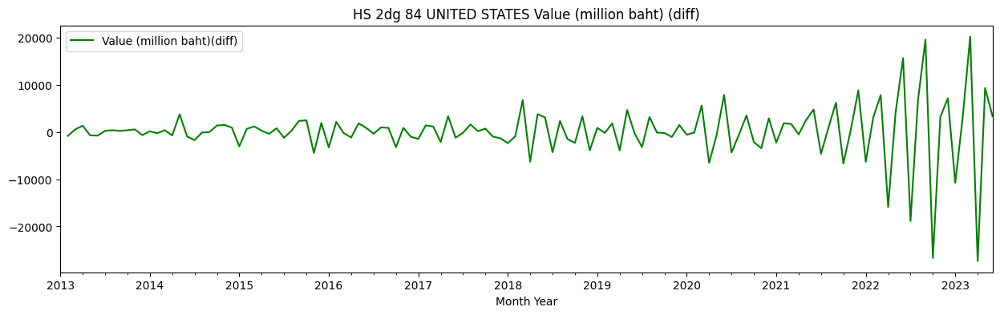

In [ ]:
#First difference
us84_new['Value (million baht)_diff'] = us84_new['Value (million baht)'].diff()
us84_new['Value (million baht)_diff'].plot(color = 'green', figsize = (15,4))
plt.legend(['Value (million baht)(diff)'])
plt.title('HS 2dg 84 UNITED STATES Value (million baht) (diff)')

us84_new_adf = adfuller(us84_new['Value (million baht)_diff'].dropna(), autolag = 'AIC')
print('p-Values:' + str(us84_new_adf[1]))

## Model 1 & LOOCV

In [ ]:
column = ['Value (million baht)_diff','Value (million baht)']
us84_newcolumn = us84_new[column]
us84_newcolumn

,Value (million baht)_diff,Value (million baht)
Month Year,,
2013-01-01,NaN,13361.175058
2013-02-01,-821.469530,12539.705528
2013-03-01,564.975654,13104.681182
2013-04-01,1352.090813,14456.771995
2013-05-01,-705.585182,13751.186813
...,...,...
2023-02-01,3237.145971,28043.709257
2023-03-01,20238.729388,48282.438645
2023-04-01,-27363.011649,20919.426996


In [ ]:
# แบ่งข้อมูลออกเป็น 125 rows สำหรับ training และ 1 rows สำหรับ testing
us84_newcolumn_train = us84_newcolumn.iloc[:125]
us84_newcolumn_test = us84_newcolumn.iloc[125:]

# กำหนดช่วงของลำดับ
p_range = range(0, 2)
d_range = range(0, 2)
q_range = range(0, 2)

# กำหนดช่วงของลำดับฤดูกาล
P_range = range(0, 2)
D_range = range(0, 2)
Q_range = range(0, 2)

# สร้างพจนานุกรมสำหรับเก็บค่าพารามิเตอร์
param_grid = dict(
    p=p_range,
    d=d_range,
    q=q_range,
    P=P_range,
    D=D_range,
    Q=Q_range,
)

# เลือกโมเดลที่ดีที่สุดโดยใช้ AIC
best_model_us84 = None
best_aic_us84 = float("inf")

for p in param_grid['p']:
    for d in param_grid['d']:
        for q in param_grid['q']:
            for P in param_grid['P']:
                for D in param_grid['D']:
                    for Q in param_grid['Q']:
                        order = (p, d, q)
                        seasonal_order = (P, D, Q, 12)

                        # สร้างโมเดล SARIMA
                        sarima_model_us84_newcolumn = SARIMAX(us84_newcolumn_train['Value (million baht)_diff'], order=order, seasonal_order=seasonal_order, enforce_stationarity=False)

                        # ฝึกโมเดล
                        sarima_fit_us84_newcolumn = sarima_model_us84_newcolumn.fit()

                        # คำนวณ AIC
                        aic = sarima_fit_us84_newcolumn.aic

                        # บันทึกโมเดลที่มี AIC ต่ำสุด
                        if aic < best_aic_us84:
                            best_model_us84 = sarima_fit_us84_newcolumn
                            best_aic_us84 = aic
                            best_param_us84 = (p, d, q, P, D, Q)

# แสดงค่าพารามิเตอร์ที่ดีที่สุด
print("Best Parameters:", best_param_us84)
print("Best AIC:", best_aic_us84)

Best Parameters: (0, 0, 1, 1, 1, 1)
Best AIC: 1908.533060034105


In [ ]:
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error

# ทำนายค่าสำหรับชุดข้อมูลทดสอบ
y_pred_us84 = best_model_us84.predict(start=us84_newcolumn_test.index[0], end=us84_newcolumn_test.index[-1])

# คำนวณ MAE และ RMSE และ MSE
mae_us84 = mean_absolute_error(us84_newcolumn_test['Value (million baht)_diff'], y_pred_us84)
rmse_us84 = mean_squared_error(us84_newcolumn_test['Value (million baht)_diff'], y_pred_us84) ** 0.5
mse_us84 = rmse_us84 ** 2

# แสดงค่า MAE และ RMSE
print("MAE:", mae_us84)
print("RMSE:", rmse_us84)
print("MSE:", mse_us84)

MAE: 9892.35160697582
RMSE: 9892.35160697582
MSE: 97858620.3160371


In [ ]:
p = d = q = range(0, 2)
pdq = list(itertools.product(p, d, q))
seasonal_pdq = [(x[0], x[1], x[2], 12) for x in list(itertools.product(p, d, q))]
print('Examples of parameter combinations for Seasonal ARIMA...')
print('SARIMAX: {} x {}'.format(pdq[1], seasonal_pdq[1]))
print('SARIMAX: {} x {}'.format(pdq[1], seasonal_pdq[2]))
print('SARIMAX: {} x {}'.format(pdq[2], seasonal_pdq[3]))
print('SARIMAX: {} x {}'.format(pdq[2], seasonal_pdq[4]))

Examples of parameter combinations for Seasonal ARIMA...
SARIMAX: (0, 0, 1) x (0, 0, 1, 12)
SARIMAX: (0, 0, 1) x (0, 1, 0, 12)
SARIMAX: (0, 1, 0) x (0, 1, 1, 12)
SARIMAX: (0, 1, 0) x (1, 0, 0, 12)


In [ ]:
for param in pdq:
    for param_seasonal in seasonal_pdq:
        try:
            mod = sm.tsa.statespace.SARIMAX(us84_newcolumn_train['Value (million baht)_diff'],
                                            order=param,
                                            seasonal_order=param_seasonal,
                                            enforce_stationarity=False,
                                            enforce_invertibility=False)
            results = mod.fit()
            print('ARIMA{}x{}12 - AIC:{}'.format(param, param_seasonal, results.aic))
        except Exception as e:
            print(e)
            continue

ARIMA(0, 0, 0)x(0, 0, 0, 12)12 - AIC:2508.4018267202177
ARIMA(0, 0, 0)x(0, 0, 1, 12)12 - AIC:2249.711334500217
ARIMA(0, 0, 0)x(0, 1, 0, 12)12 - AIC:2208.3229991376265
ARIMA(0, 0, 0)x(0, 1, 1, 12)12 - AIC:1985.4571767300802
ARIMA(0, 0, 0)x(1, 0, 0, 12)12 - AIC:2222.1030351006248
ARIMA(0, 0, 0)x(1, 0, 1, 12)12 - AIC:2190.9139456919856
ARIMA(0, 0, 0)x(1, 1, 0, 12)12 - AIC:2002.545562178731
ARIMA(0, 0, 0)x(1, 1, 1, 12)12 - AIC:1985.5506788969635
ARIMA(0, 0, 1)x(0, 0, 0, 12)12 - AIC:2418.3938335726552
ARIMA(0, 0, 1)x(0, 0, 1, 12)12 - AIC:2178.730205096761
ARIMA(0, 0, 1)x(0, 1, 0, 12)12 - AIC:2136.438479798495
ARIMA(0, 0, 1)x(0, 1, 1, 12)12 - AIC:1910.0843514667904
ARIMA(0, 0, 1)x(1, 0, 0, 12)12 - AIC:2171.4445118189014
ARIMA(0, 0, 1)x(1, 0, 1, 12)12 - AIC:2119.090166130303
ARIMA(0, 0, 1)x(1, 1, 0, 12)12 - AIC:1945.3230821560867
ARIMA(0, 0, 1)x(1, 1, 1, 12)12 - AIC:1911.2885497474858
ARIMA(0, 1, 0)x(0, 0, 0, 12)12 - AIC:2624.7419455573026
ARIMA(0, 1, 0)x(0, 0, 1, 12)12 - AIC:2351.59694193391

In [ ]:
mod_us84 = sm.tsa.statespace.SARIMAX(us84_newcolumn['Value (million baht)'],
                                order=(0, 1, 1),
                                seasonal_order=(0, 1, 1, 12),
                                enforce_invertibility=False)
results_us84 = mod_us84.fit()
print(results_us84.summary().tables[1])

                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.7113      0.059    -12.116      0.000      -0.826      -0.596
ma.S.L12      -0.2912      0.106     -2.740      0.006      -0.500      -0.083
sigma2       1.59e+07   1.09e-09   1.46e+16      0.000    1.59e+07    1.59e+07


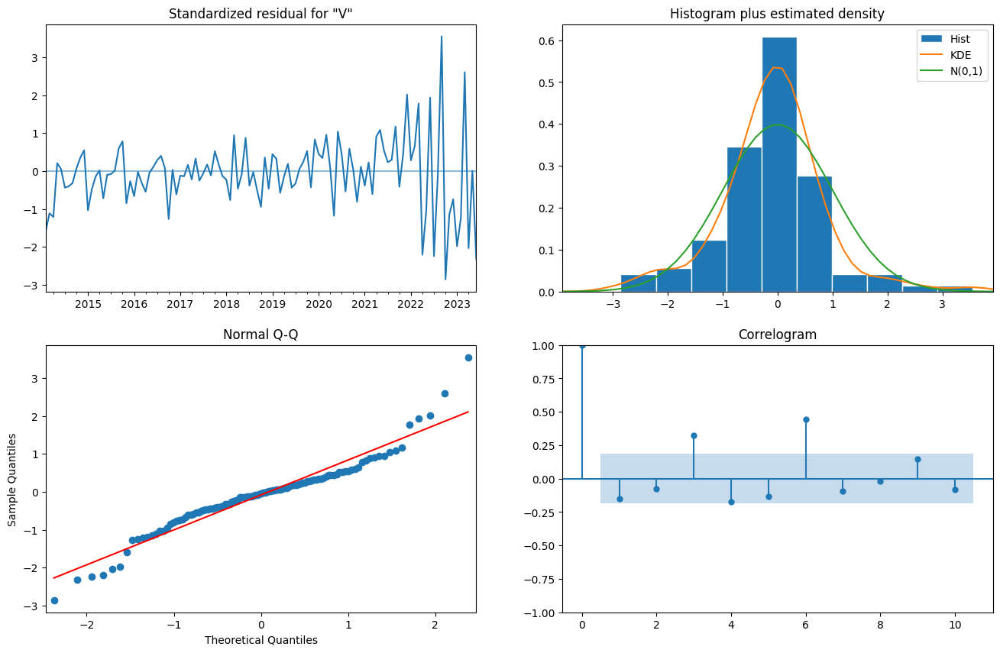

In [ ]:
results_us84.plot_diagnostics(figsize=(16, 10))
plt.show()

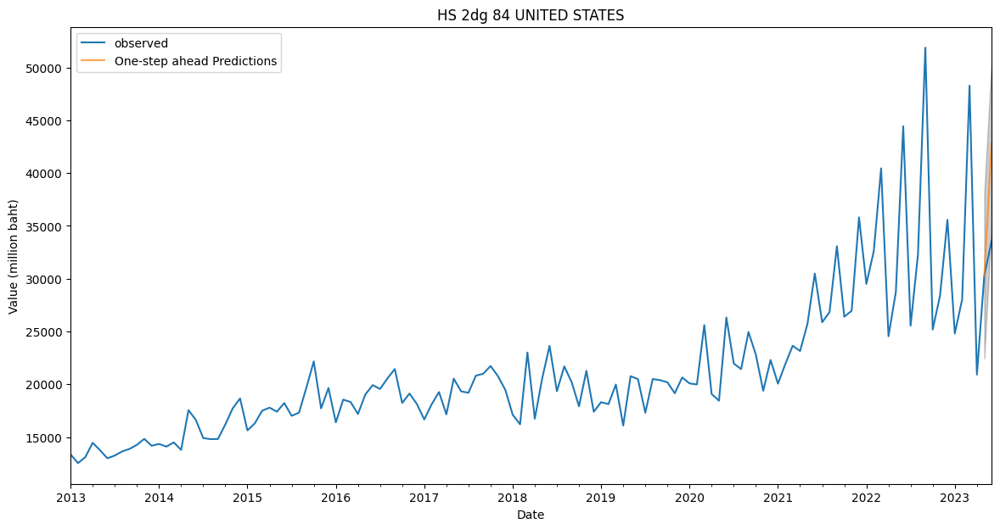

In [ ]:
pred_us84 = results_us84.get_prediction(start=pd.to_datetime('2023-05-01'), dynamic=False)
pred_ci_us84 = pred_us84.conf_int()
ax = us84_newcolumn['Value (million baht)']['2013':].plot(label='observed')
pred_us84.predicted_mean.plot(ax=ax, label='One-step ahead Predictions', alpha=.7, figsize=(14, 7))
ax.fill_between(pred_ci_us84.index,
                pred_ci_us84.iloc[:, 0],
                pred_ci_us84.iloc[:, 1], color='k', alpha=.2)
ax.set_xlabel('Date')
ax.set_ylabel('Value (million baht)')
ax.set_title('HS 2dg 84 UNITED STATES')
plt.legend()
plt.show()

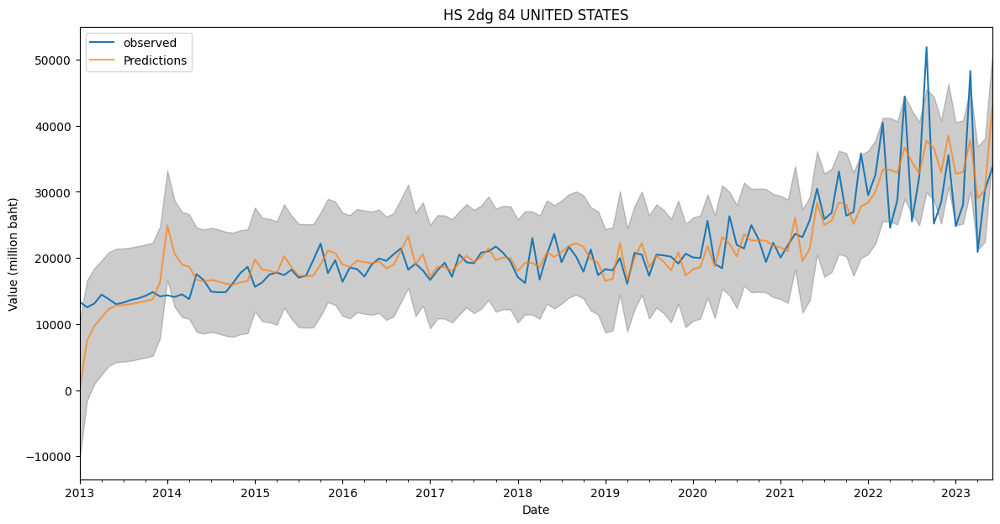

In [ ]:
pred_us84_total = results_us84.get_prediction(start=pd.to_datetime('2013-01-01'), dynamic=False)
pred_ci_us84 = pred_us84_total.conf_int()
ax = us84_newcolumn['Value (million baht)']['2013':].plot(label='observed')
pred_us84_total.predicted_mean.plot(ax=ax, label='Predictions', alpha=.7, figsize=(14, 7))
ax.fill_between(pred_ci_us84.index,
                pred_ci_us84.iloc[:, 0],
                pred_ci_us84.iloc[:, 1], color='k', alpha=.2)
ax.set_xlabel('Date')
ax.set_ylabel('Value (million baht)')
ax.set_title('HS 2dg 84 UNITED STATES')
plt.legend()
plt.show()

In [ ]:
forecasted_us84 = pred_us84.predicted_mean
mse_us84 = ((forecasted_us84 - us84_newcolumn_test['Value (million baht)']) ** 2).mean()
# forecasted_g3 = forecasted_us**(1/2)
mape_us84 = (np.abs(us84_newcolumn_test['Value (million baht)'] - forecasted_us84) / np.abs(us84_newcolumn_test['Value (million baht)'])).mean() * 100
print('The Mean Squared Error of forecasts is {}'.format(round(mse_us84, 2)))
print('The Root Mean Squared Error of forecasts is {}'.format(round(np.sqrt(mse_us84), 2)))
print('Mean Absolute Percentage Error (MAPE): {:.2f}%'.format(mape_us84))

The Mean Squared Error of forecasts is 85267482.1
The Root Mean Squared Error of forecasts is 9234.04
Mean Absolute Percentage Error (MAPE): 27.47%


### Forecast

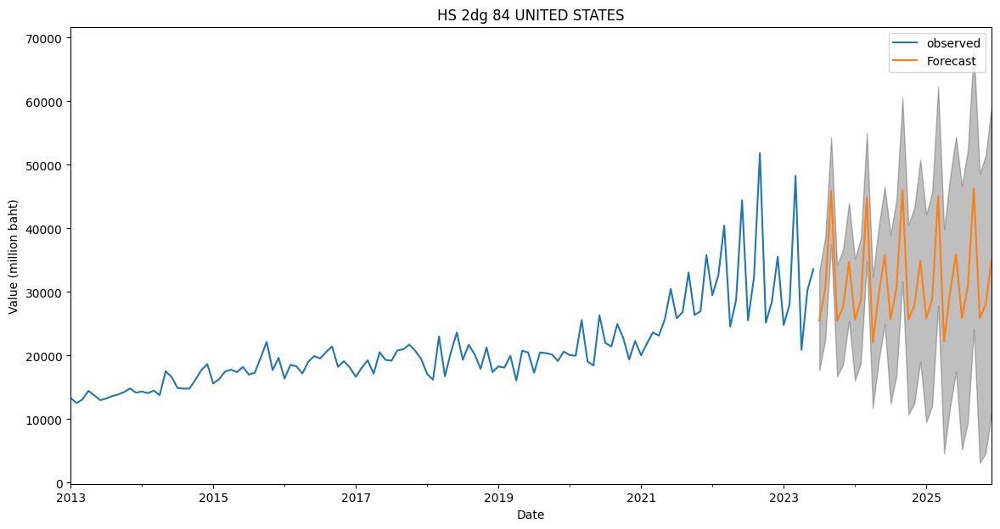

In [ ]:
pred_uc_us84 = results_us84.get_forecast(steps=30)
pred_ci_us84 = pred_uc_us84.conf_int()
ax = us84_newcolumn['Value (million baht)'].plot(label='observed', figsize=(14, 7))
pred_uc_us84.predicted_mean.plot(ax=ax, label='Forecast')
ax.fill_between(pred_ci_us84.index,
                pred_ci_us84.iloc[:, 0],
                pred_ci_us84.iloc[:, 1], color='k', alpha=.25)
ax.set_xlabel('Date')
ax.set_ylabel('Value (million baht)')
ax.set_title('HS 2dg 84 UNITED STATES')
plt.legend()
plt.show()

# US40

array([[<Axes: title={'center': 'Unnamed: 0'}>,
        <Axes: title={'center': 'HS 2dg'}>],
       [<Axes: title={'center': 'Year'}>,
        <Axes: title={'center': 'Month'}>],
       [<Axes: title={'center': 'Value (million baht)'}>, <Axes: >]],
      dtype=object)

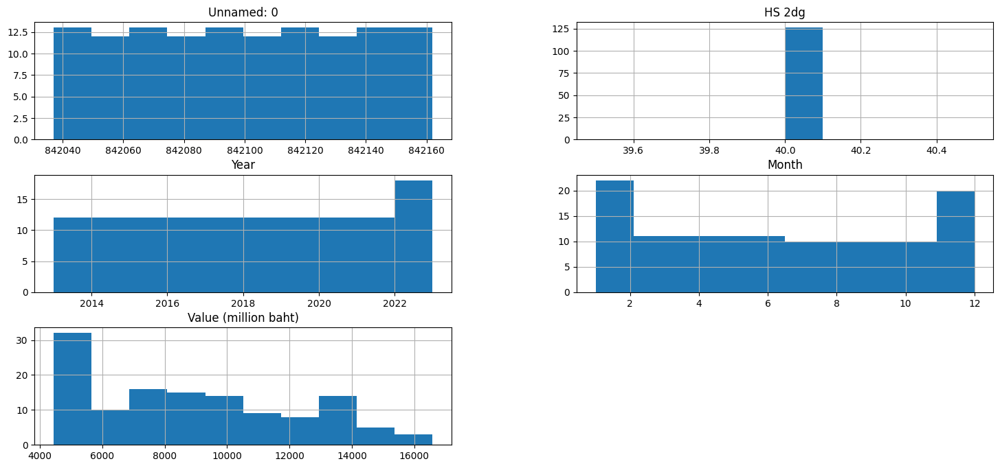

In [ ]:
us40 = pd.read_csv('/content/newus40.csv')
us40.hist()

<Axes: >

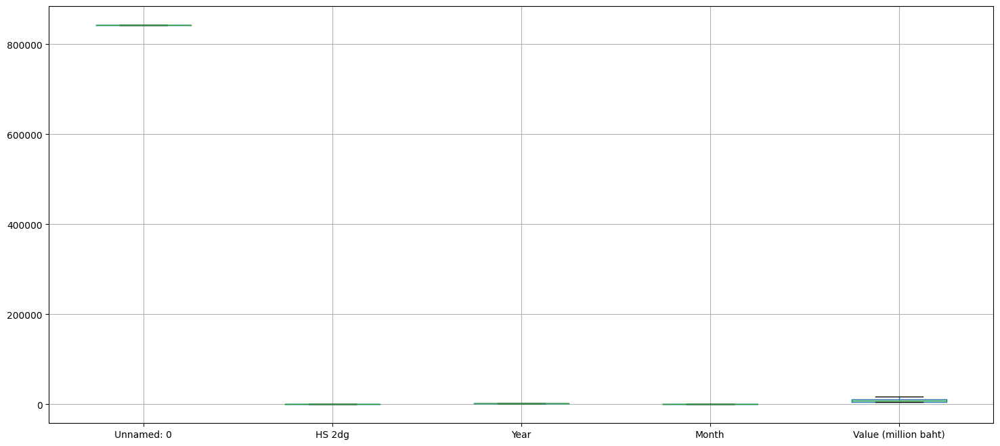

In [ ]:
us40.boxplot()

In [ ]:
us40.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 126 entries, 0 to 125
Data columns (total 6 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Unnamed: 0            126 non-null    int64  
 1   Country               126 non-null    object 
 2   HS 2dg                126 non-null    int64  
 3   Year                  126 non-null    int64  
 4   Month                 126 non-null    int64  
 5   Value (million baht)  126 non-null    float64
dtypes: float64(1), int64(4), object(1)
memory usage: 6.0+ KB


In [ ]:
def find_outlier(data):
  Q1 = np.percentile(data, 25)
  Q3 = np.percentile(data, 75)
  IQR = Q3 - Q1
  lower = Q1 - 1.5 * IQR
  upper = Q3 + 1.5 * IQR
  outlier = data[(data < lower) | (data > upper) ]
  return outlier

outlier_us40 = find_outlier(us40['Value (million baht)'])
print("Outlier in Value:")
print(outlier_us40)
# print("Lower:",lower, "Upper: ",upper)
# จำนวน rows ที่มี outlier
outlier_count_us40 = len(outlier_us40)

# จำนวน rows ทั้งหมด
total_rows_us40 = len(us40)

# คำนวณเปอร์เซ็นต์ของ rows ที่มี outlier
percentage_outlier_us40 = (outlier_count_us40 / total_rows_us40) * 100

print(f"เปอร์เซ็นต์ของ rows ที่มี outlier: {percentage_outlier_us40:.2f}%")

Outlier in Value:
Series([], Name: Value (million baht), dtype: float64)
เปอร์เซ็นต์ของ rows ที่มี outlier: 0.00%


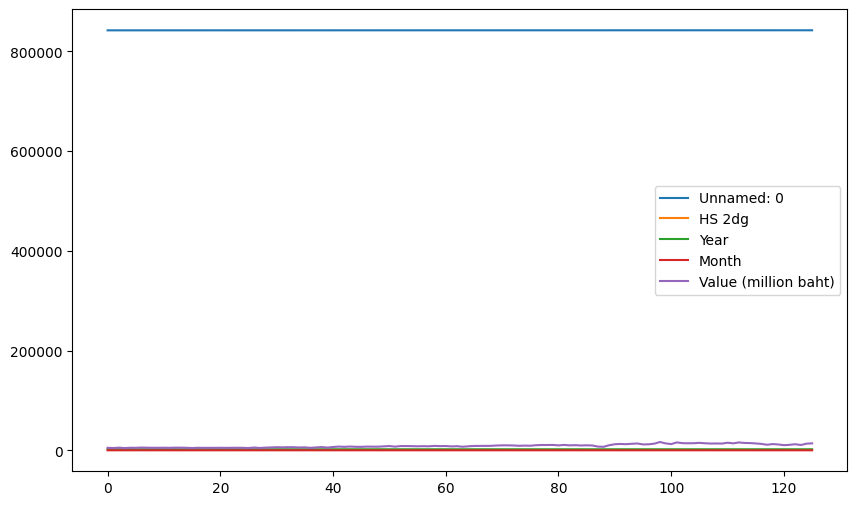

In [ ]:
us40.plot(figsize=(10, 6))
plt.show()

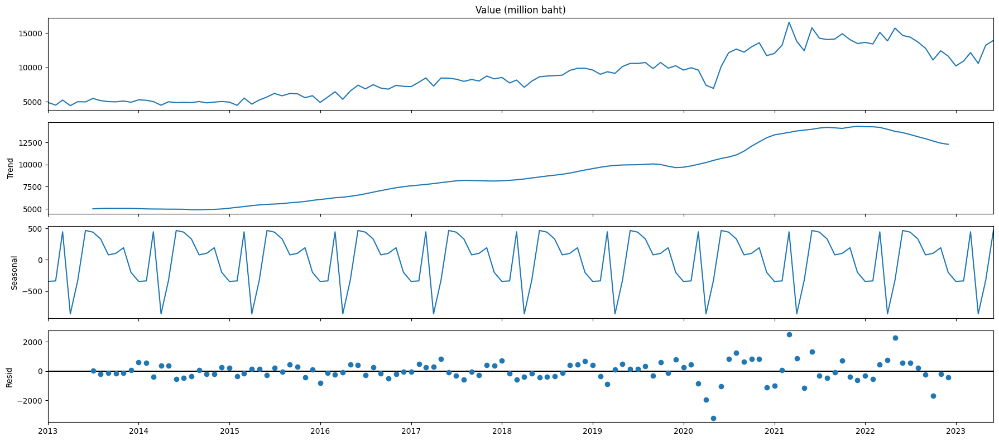

In [ ]:
# แปลงคอลัมน์ 'Month' เป็นข้อความ
us40['Month'] = us40['Month'].astype(str)

# แปลงคอลัมน์ 'Year' เป็นข้อความ
us40['Year'] = us40['Year'].astype(str)

# แปลงคอลัมน์ 'Month Year' เป็นรูปแบบ '01-2020'
us40['Month Year'] = us40['Month'].str.zfill(2) + '-' + us40['Year']

# แปลงคอลัมน์ 'Month Year' เป็น DatetimeIndex และระบุความถี่เป็นรายเดือน ('M')
us40_datetime= us40.set_index(pd.to_datetime(us40['Month Year'], format='%m-%Y', errors='coerce'))

rcParams['figure.figsize'] = (18, 8)  # กำหนดขนาดกราฟใหญ่ขึ้น
decomposition = sm.tsa.seasonal_decompose(us40_datetime['Value (million baht)'], model='additive', period=12)
fig = decomposition.plot()
plt.show()

## Check stationary test

In [ ]:
#Integrated (d)
from statsmodels.tsa.stattools import adfuller
def adf_test(timeseries):
    print ('Results of Dickey-Fuller Test:')
    dftest = adfuller(timeseries, autolag='AIC')
    dfoutput = pd.Series(dftest[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
    for key,value in dftest[4].items():
        dfoutput['Critical Value (%s)'%key] = value
    print (dfoutput)
# Call the function and run the test

adf_test(us40['Value (million baht)'])

Results of Dickey-Fuller Test:
Test Statistic                  -0.637747
p-value                          0.862223
#Lags Used                      12.000000
Number of Observations Used    113.000000
Critical Value (1%)             -3.489590
Critical Value (5%)             -2.887477
Critical Value (10%)            -2.580604
dtype: float64


In [ ]:
us40_new = us40_datetime.copy()
us40_new

,Unnamed: 0,Country,HS 2dg,Year,Month,Value (million baht),Month Year
Month Year,,,,,,,
2013-01-01,842037,UNITED STATES,40,2013,1,4906.997899,01-2013
2013-02-01,842038,UNITED STATES,40,2013,2,4510.390064,02-2013
2013-03-01,842039,UNITED STATES,40,2013,3,5250.979702,03-2013
2013-04-01,842040,UNITED STATES,40,2013,4,4437.336312,04-2013
2013-05-01,842041,UNITED STATES,40,2013,5,5013.411697,05-2013
...,...,...,...,...,...,...,...
2023-02-01,842158,UNITED STATES,40,2023,2,10932.807251,02-2023
2023-03-01,842159,UNITED STATES,40,2023,3,12163.490841,03-2023
2023-04-01,842160,UNITED STATES,40,2023,4,10587.440904,04-2023


## Differencing

p-Values:0.0890332964907154


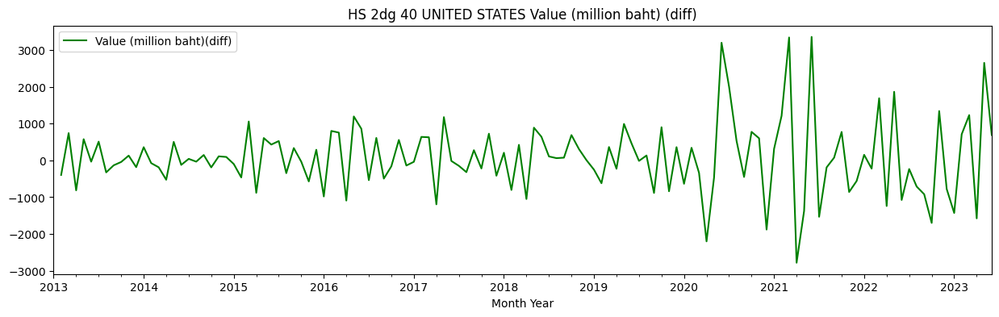

In [ ]:
#First difference
us40_new['Value (million baht)_diff'] = us40_new['Value (million baht)'].diff()
us40_new['Value (million baht)_diff'].plot(color = 'green', figsize = (15,4))
plt.legend(['Value (million baht)(diff)'])
plt.title('HS 2dg 40 UNITED STATES Value (million baht) (diff)')

us40_new_adf = adfuller(us40_new['Value (million baht)_diff'].dropna(), autolag = 'AIC')
print('p-Values:' + str(us40_new_adf[1]))

p-Values:8.198148814618609e-08


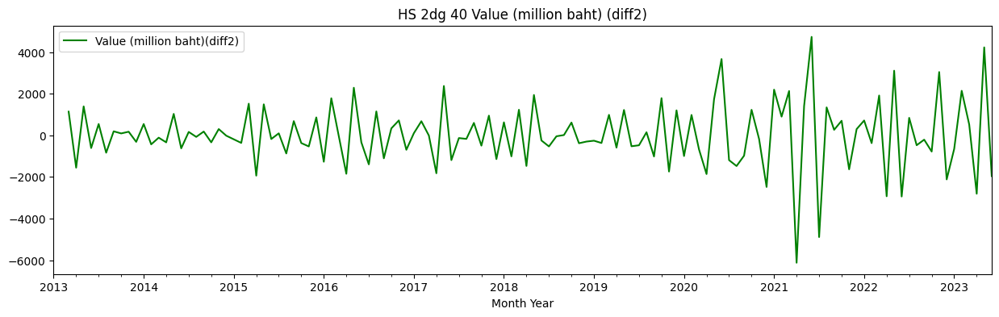

In [ ]:
#Second difference
us40_new['Value (million baht)_diff2'] = us40_new['Value (million baht)_diff'].diff()
us40_new['Value (million baht)_diff2'].plot(color = 'green', figsize = (15,4))
plt.legend(['Value (million baht)(diff2)'])
plt.title('HS 2dg 40 Value (million baht) (diff2)')

us40_new_adf2 = adfuller(us40_new['Value (million baht)_diff2'].dropna(), autolag = 'AIC')
print('p-Values:' + str(us40_new_adf2[1]))

## Model 1 & LOOCV

In [ ]:
column = ['Value (million baht)_diff2','Value (million baht)']
us40_newcolumn = us40_new[column]
us40_newcolumn

,Value (million baht)_diff2,Value (million baht)
Month Year,,
2013-01-01,NaN,4906.997899
2013-02-01,NaN,4510.390064
2013-03-01,1137.197473,5250.979702
2013-04-01,-1554.233028,4437.336312
2013-05-01,1389.718775,5013.411697
...,...,...
2023-02-01,2139.782475,10932.807251
2023-03-01,520.749554,12163.490841
2023-04-01,-2806.733527,10587.440904


In [ ]:
# แบ่งข้อมูลออกเป็น 125 rows สำหรับ training และ 1 rows สำหรับ testing
us40_newcolumn_train = us40_newcolumn.iloc[:125]
us40_newcolumn_test = us40_newcolumn.iloc[125:]

# กำหนดช่วงของลำดับ
p_range = range(0, 2)
d_range = range(0, 2)
q_range = range(0, 2)

# กำหนดช่วงของลำดับฤดูกาล
P_range = range(0, 2)
D_range = range(0, 2)
Q_range = range(0, 2)

# สร้างพจนานุกรมสำหรับเก็บค่าพารามิเตอร์
param_grid = dict(
    p=p_range,
    d=d_range,
    q=q_range,
    P=P_range,
    D=D_range,
    Q=Q_range,
)

# เลือกโมเดลที่ดีที่สุดโดยใช้ AIC
best_model_us40 = None
best_aic_us40 = float("inf")

for p in param_grid['p']:
    for d in param_grid['d']:
        for q in param_grid['q']:
            for P in param_grid['P']:
                for D in param_grid['D']:
                    for Q in param_grid['Q']:
                        order = (p, d, q)
                        seasonal_order = (P, D, Q, 12)

                        # สร้างโมเดล SARIMA
                        sarima_model_us40_newcolumn = SARIMAX(us40_newcolumn_train['Value (million baht)_diff2'], order=order, seasonal_order=seasonal_order, enforce_stationarity=False)

                        # ฝึกโมเดล
                        sarima_fit_us40_newcolumn = sarima_model_us40_newcolumn.fit()

                        # คำนวณ AIC
                        aic = sarima_fit_us40_newcolumn.aic

                        # บันทึกโมเดลที่มี AIC ต่ำสุด
                        if aic < best_aic_us40:
                            best_model_us40 = sarima_fit_us40_newcolumn
                            best_aic_us40 = aic
                            best_param_us40 = (p, d, q, P, D, Q)

# แสดงค่าพารามิเตอร์ที่ดีที่สุด
print("Best Parameters:", best_param_us40)
print("Best AIC:", best_aic_us40)

Best Parameters: (1, 0, 1, 0, 1, 1)
Best AIC: 1652.4222388018231


In [ ]:
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error

# ทำนายค่าสำหรับชุดข้อมูลทดสอบ
y_pred_us40 = best_model_us40.predict(start=us40_newcolumn_test.index[0], end=us40_newcolumn_test.index[-1])

# คำนวณ MAE และ RMSE และ MSE
mae_us40 = mean_absolute_error(us40_newcolumn_test['Value (million baht)_diff2'], y_pred_us40)
rmse_us40 = mean_squared_error(us40_newcolumn_test['Value (million baht)_diff2'], y_pred_us40) ** 0.5
mse_us40 = rmse_us40 ** 2

# แสดงค่า MAE และ RMSE
print("MAE:", mae_us40)
print("RMSE:", rmse_us40)
print("MSE:", mse_us40)

MAE: 212.2671153590577
RMSE: 212.2671153590577
MSE: 45057.32826285551


In [ ]:
p = d = q = range(0, 2)
pdq = list(itertools.product(p, d, q))
seasonal_pdq = [(x[0], x[1], x[2], 12) for x in list(itertools.product(p, d, q))]
print('Examples of parameter combinations for Seasonal ARIMA...')
print('SARIMAX: {} x {}'.format(pdq[1], seasonal_pdq[1]))
print('SARIMAX: {} x {}'.format(pdq[1], seasonal_pdq[2]))
print('SARIMAX: {} x {}'.format(pdq[2], seasonal_pdq[3]))
print('SARIMAX: {} x {}'.format(pdq[2], seasonal_pdq[4]))

Examples of parameter combinations for Seasonal ARIMA...
SARIMAX: (0, 0, 1) x (0, 0, 1, 12)
SARIMAX: (0, 0, 1) x (0, 1, 0, 12)
SARIMAX: (0, 1, 0) x (0, 1, 1, 12)
SARIMAX: (0, 1, 0) x (1, 0, 0, 12)


In [ ]:
for param in pdq:
    for param_seasonal in seasonal_pdq:
        try:
            mod = sm.tsa.statespace.SARIMAX(us40_newcolumn_train['Value (million baht)_diff2'],
                                            order=param,
                                            seasonal_order=param_seasonal,
                                            enforce_stationarity=False,
                                            enforce_invertibility=False)
            results = mod.fit()
            print('ARIMA{}x{}12 - AIC:{}'.format(param, param_seasonal, results.aic))
        except Exception as e:
            print(e)
            continue

ARIMA(0, 0, 0)x(0, 0, 0, 12)12 - AIC:2155.1297881734495
ARIMA(0, 0, 0)x(0, 0, 1, 12)12 - AIC:1960.6973126229411
ARIMA(0, 0, 0)x(0, 1, 0, 12)12 - AIC:1990.4431154846927
ARIMA(0, 0, 0)x(0, 1, 1, 12)12 - AIC:1744.979573381874
ARIMA(0, 0, 0)x(1, 0, 0, 12)12 - AIC:1974.1760218890188
ARIMA(0, 0, 0)x(1, 0, 1, 12)12 - AIC:1942.837619867487
ARIMA(0, 0, 0)x(1, 1, 0, 12)12 - AIC:1786.5380829839405
ARIMA(0, 0, 0)x(1, 1, 1, 12)12 - AIC:1746.8604393245366
ARIMA(0, 0, 1)x(0, 0, 0, 12)12 - AIC:2052.782387485275
ARIMA(0, 0, 1)x(0, 0, 1, 12)12 - AIC:1852.2429365631288
ARIMA(0, 0, 1)x(0, 1, 0, 12)12 - AIC:1883.839477698535
ARIMA(0, 0, 1)x(0, 1, 1, 12)12 - AIC:1653.5587855879737
ARIMA(0, 0, 1)x(1, 0, 0, 12)12 - AIC:1883.1114314825093
ARIMA(0, 0, 1)x(1, 0, 1, 12)12 - AIC:1846.4295729449743
ARIMA(0, 0, 1)x(1, 1, 0, 12)12 - AIC:1712.0514180764094
ARIMA(0, 0, 1)x(1, 1, 1, 12)12 - AIC:1655.6866835995263
ARIMA(0, 1, 0)x(0, 0, 0, 12)12 - AIC:2289.6475170495683
ARIMA(0, 1, 0)x(0, 0, 1, 12)12 - AIC:2066.1128346996

In [ ]:
mod_us40 = sm.tsa.statespace.SARIMAX(us40_newcolumn['Value (million baht)'],
                                order=(1, 0, 1),
                                seasonal_order=(0, 1, 1, 12),
                                enforce_invertibility=False)
results_us40 = mod_us40.fit()
print(results_us40.summary().tables[1])

                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.9736      0.018     55.378      0.000       0.939       1.008
ma.L1         -0.2116      0.072     -2.948      0.003      -0.352      -0.071
ma.S.L12      -0.7582      0.070    -10.905      0.000      -0.894      -0.622
sigma2      8.436e+05   8.45e+04      9.979      0.000    6.78e+05    1.01e+06


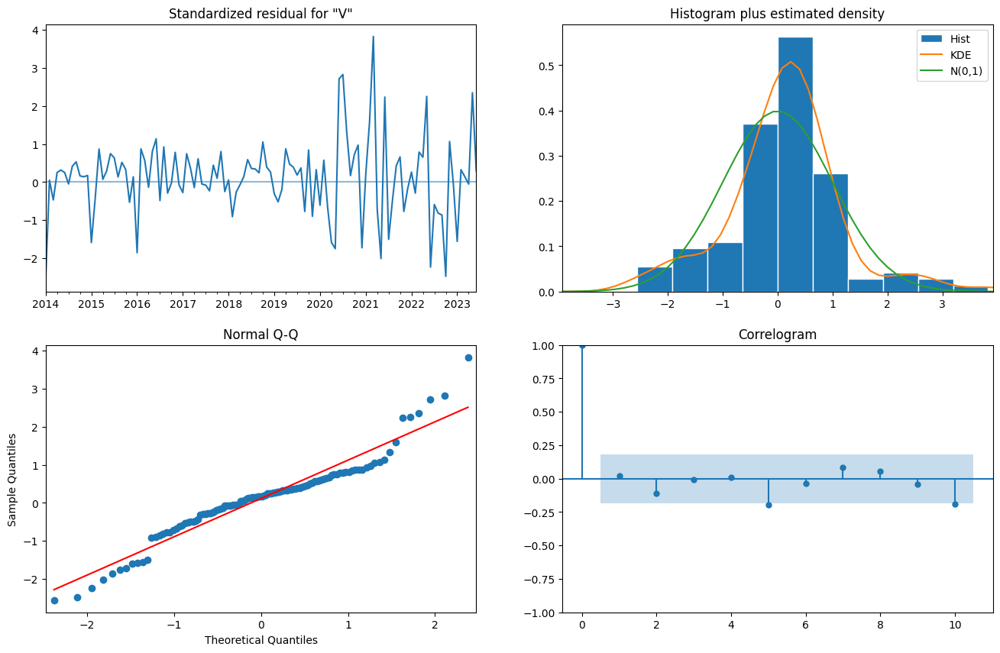

In [ ]:
results_us40.plot_diagnostics(figsize=(16, 10))
plt.show()

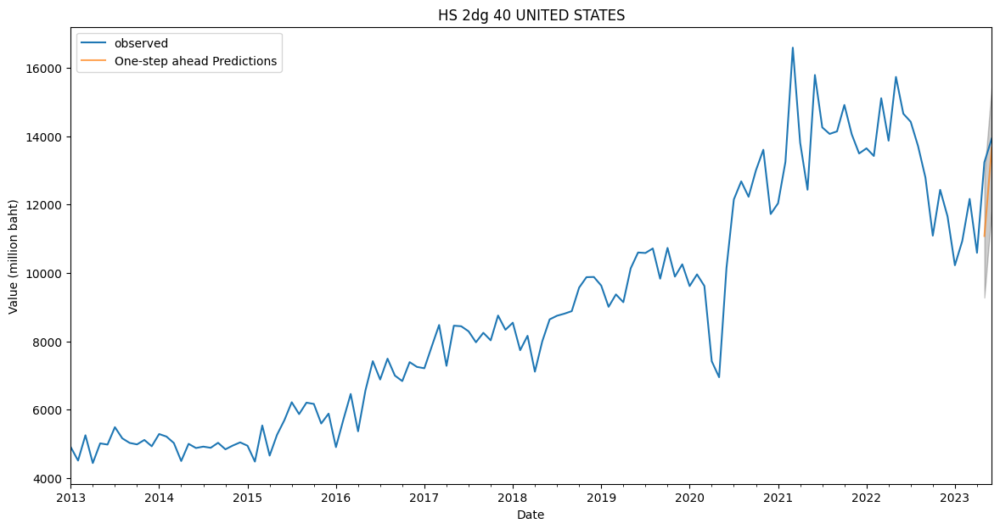

In [ ]:
pred_us40 = results_us40.get_prediction(start=pd.to_datetime('2023-05-01'), dynamic=False)
pred_ci_us40 = pred_us40.conf_int()
ax = us40_newcolumn['Value (million baht)']['2013':].plot(label='observed')
pred_us40.predicted_mean.plot(ax=ax, label='One-step ahead Predictions', alpha=.7, figsize=(14, 7))
ax.fill_between(pred_ci_us40.index,
                pred_ci_us40.iloc[:, 0],
                pred_ci_us40.iloc[:, 1], color='k', alpha=.2)
ax.set_xlabel('Date')
ax.set_ylabel('Value (million baht)')
ax.set_title('HS 2dg 40 UNITED STATES')
plt.legend()
plt.show()

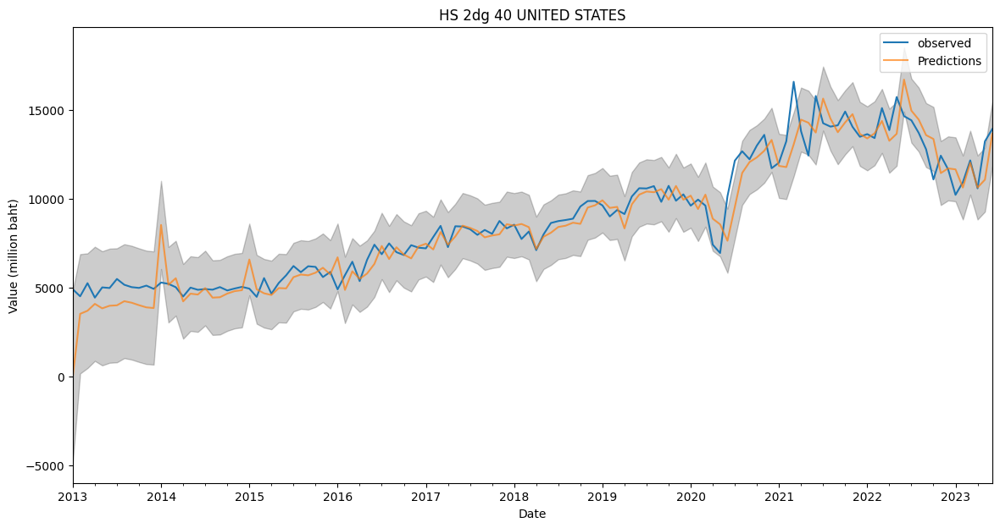

In [ ]:
pred_us40_total = results_us40.get_prediction(start=pd.to_datetime('2013-01-01'), dynamic=False)
pred_ci_us40 = pred_us40_total.conf_int()
ax = us40_newcolumn['Value (million baht)']['2013':].plot(label='observed')
pred_us40_total.predicted_mean.plot(ax=ax, label='Predictions', alpha=.7, figsize=(14, 7))
ax.fill_between(pred_ci_us40.index,
                pred_ci_us40.iloc[:, 0],
                pred_ci_us40.iloc[:, 1], color='k', alpha=.2)
ax.set_xlabel('Date')
ax.set_ylabel('Value (million baht)')
ax.set_title('HS 2dg 40 UNITED STATES')
plt.legend()
plt.show()

In [ ]:
forecasted_us40 = pred_us40.predicted_mean
mse_us40 = ((forecasted_us40 - us40_newcolumn_test['Value (million baht)']) ** 2).mean()
# forecasted_g3 = forecasted_us**(1/2)
mape_us40 = (np.abs(us40_newcolumn_test['Value (million baht)'] - forecasted_us40) / np.abs(us40_newcolumn_test['Value (million baht)'])).mean() * 100
print('The Mean Squared Error of forecasts is {}'.format(round(mse_us40, 2)))
print('The Root Mean Squared Error of forecasts is {}'.format(round(np.sqrt(mse_us40), 2)))
print('Mean Absolute Percentage Error (MAPE): {:.2f}%'.format(mape_us40))

The Mean Squared Error of forecasts is 73250.91
The Root Mean Squared Error of forecasts is 270.65
Mean Absolute Percentage Error (MAPE): 1.94%


### Forecast

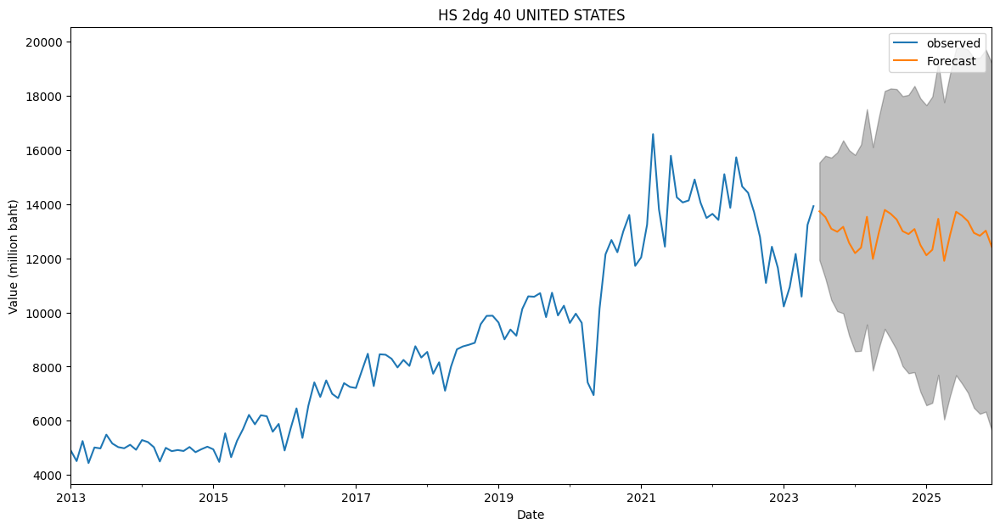

In [ ]:
pred_uc_us40 = results_us40.get_forecast(steps=30)
pred_ci_us40 = pred_uc_us40.conf_int()
ax = us40_newcolumn['Value (million baht)'].plot(label='observed', figsize=(14, 7))
pred_uc_us40.predicted_mean.plot(ax=ax, label='Forecast')
ax.fill_between(pred_ci_us40.index,
                pred_ci_us40.iloc[:, 0],
                pred_ci_us40.iloc[:, 1], color='k', alpha=.25)
ax.set_xlabel('Date')
ax.set_ylabel('Value (million baht)')
ax.set_title('HS 2dg 40 UNITED STATES')
plt.legend()
plt.show()

# China40

array([[<Axes: title={'center': 'Unnamed: 0'}>,
        <Axes: title={'center': 'HS 2dg'}>],
       [<Axes: title={'center': 'Year'}>,
        <Axes: title={'center': 'Month'}>],
       [<Axes: title={'center': 'Value (million baht)'}>, <Axes: >]],
      dtype=object)

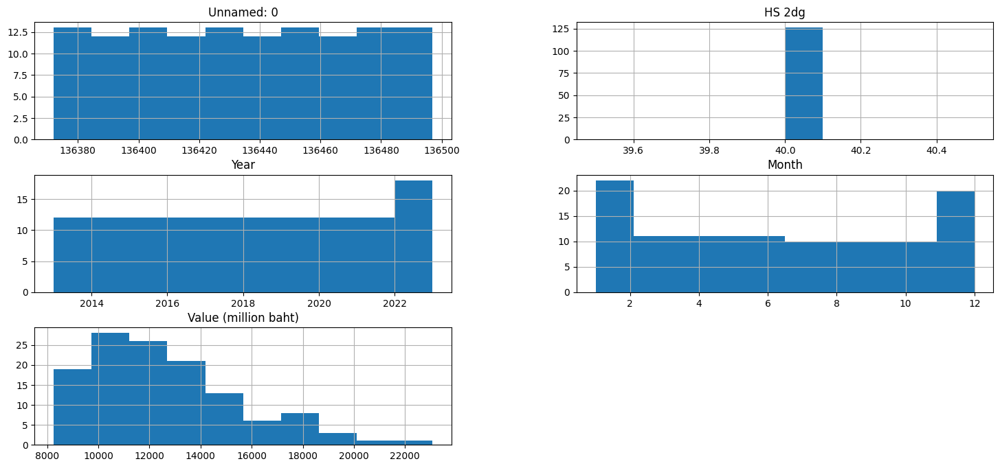

In [ ]:
cn40 = pd.read_csv('/content/resultchina40.csv')
cn40.hist()

<Axes: >

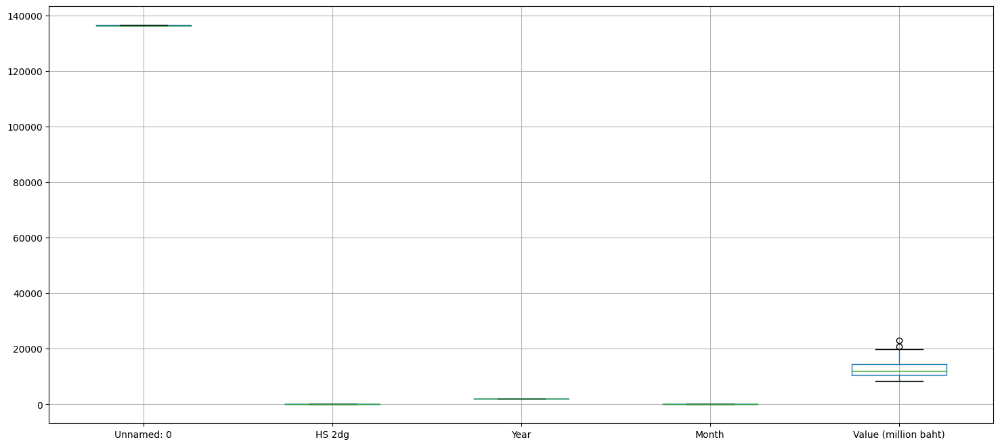

In [ ]:
cn40.boxplot()

In [ ]:
cn40.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 126 entries, 0 to 125
Data columns (total 6 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Unnamed: 0            126 non-null    int64  
 1   Country               126 non-null    object 
 2   HS 2dg                126 non-null    int64  
 3   Year                  126 non-null    int64  
 4   Month                 126 non-null    int64  
 5   Value (million baht)  126 non-null    float64
dtypes: float64(1), int64(4), object(1)
memory usage: 6.0+ KB


In [ ]:
def find_outlier(data):
  Q1 = np.percentile(data, 25)
  Q3 = np.percentile(data, 75)
  IQR = Q3 - Q1
  lower = Q1 - 1.5 * IQR
  upper = Q3 + 1.5 * IQR
  outlier = data[(data < lower) | (data > upper) ]
  return outlier

outlier_cn40 = find_outlier(cn40['Value (million baht)'])
print("Outlier in Value:")
print(outlier_cn40)
# print("Lower:",lower, "Upper: ",upper)
# จำนวน rows ที่มี outlier
outlier_count_cn40 = len(outlier_cn40)

# จำนวน rows ทั้งหมด
total_rows_cn40 = len(cn40)

# คำนวณเปอร์เซ็นต์ของ rows ที่มี outlier
percentage_outlier_cn40 = (outlier_count_cn40 / total_rows_cn40) * 100

print(f"เปอร์เซ็นต์ของ rows ที่มี outlier: {percentage_outlier_cn40:.2f}%")

Outlier in Value:
11    20872.703093
50    23077.991320
Name: Value (million baht), dtype: float64
เปอร์เซ็นต์ของ rows ที่มี outlier: 1.59%


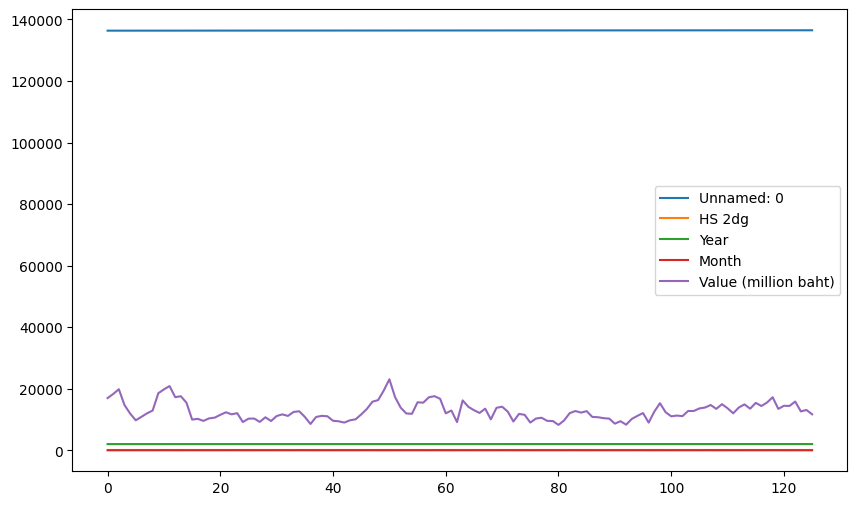

In [ ]:
cn40.plot(figsize=(10, 6))
plt.show()

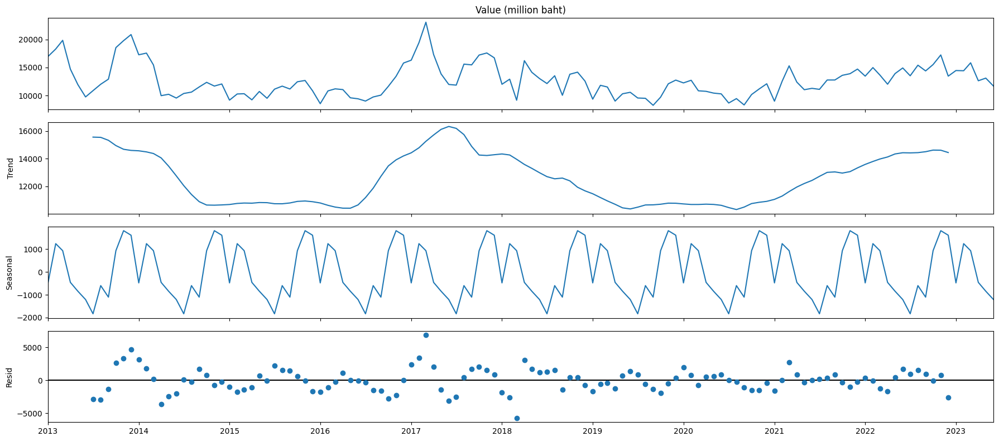

In [ ]:
# แปลงคอลัมน์ 'Month' เป็นข้อความ
cn40['Month'] = cn40['Month'].astype(str)

# แปลงคอลัมน์ 'Year' เป็นข้อความ
cn40['Year'] = cn40['Year'].astype(str)

# แปลงคอลัมน์ 'Month Year' เป็นรูปแบบ '01-2020'
cn40['Month Year'] = cn40['Month'].str.zfill(2) + '-' + cn40['Year']

# แปลงคอลัมน์ 'Month Year' เป็น DatetimeIndex และระบุความถี่เป็นรายเดือน ('M')
cn40_datetime= cn40.set_index(pd.to_datetime(cn40['Month Year'], format='%m-%Y', errors='coerce'))

rcParams['figure.figsize'] = (18, 8)  # กำหนดขนาดกราฟใหญ่ขึ้น
decomposition = sm.tsa.seasonal_decompose(cn40_datetime['Value (million baht)'], model='additive', period=12)
fig = decomposition.plot()
plt.show()

## Check stationary test

In [ ]:
#Integrated (d)
from statsmodels.tsa.stattools import adfuller
def adf_test(timeseries):
    print ('Results of Dickey-Fuller Test:')
    dftest = adfuller(timeseries, autolag='AIC')
    dfoutput = pd.Series(dftest[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
    for key,value in dftest[4].items():
        dfoutput['Critical Value (%s)'%key] = value
    print (dfoutput)
# Call the function and run the test

adf_test(cn40['Value (million baht)'])

Results of Dickey-Fuller Test:
Test Statistic                  -4.366283
p-value                          0.000340
#Lags Used                       0.000000
Number of Observations Used    125.000000
Critical Value (1%)             -3.483779
Critical Value (5%)             -2.884954
Critical Value (10%)            -2.579257
dtype: float64


In [ ]:
cn40_new = cn40_datetime.copy()
cn40_new

,Unnamed: 0,Country,HS 2dg,Year,Month,Value (million baht),Month Year
Month Year,,,,,,,
2013-01-01,136372,CHINA,40,2013,1,16963.612198,01-2013
2013-02-01,136373,CHINA,40,2013,2,18297.654111,02-2013
2013-03-01,136374,CHINA,40,2013,3,19843.137140,03-2013
2013-04-01,136375,CHINA,40,2013,4,14705.420656,04-2013
2013-05-01,136376,CHINA,40,2013,5,11950.894595,05-2013
...,...,...,...,...,...,...,...
2023-02-01,136493,CHINA,40,2023,2,14419.342243,02-2023
2023-03-01,136494,CHINA,40,2023,3,15836.722162,03-2023
2023-04-01,136495,CHINA,40,2023,4,12632.533879,04-2023


## No Differencing

In [ ]:
# #First difference
# cn40_new['Value (million baht)_diff'] = cn40_new['Value (million baht)'].diff()
# cn40_new['Value (million baht)_diff'].plot(color = 'green', figsize = (15,4))
# plt.legend(['Value (million baht)(diff)'])
# plt.title('HS 2dg 40 UNITED STATES Value (million baht) (diff)')

# cn40_new_adf = adfuller(cn40_new['Value (million baht)_diff'].dropna(), autolag = 'AIC')
# print('p-Values:' + str(cn40_new_adf[1]))

## Model 1 & LOOCV

In [ ]:
column = ['Value (million baht)']
cn40_newcolumn = cn40_new[column]
cn40_newcolumn

,Value (million baht)
Month Year,
2013-01-01,16963.612198
2013-02-01,18297.654111
2013-03-01,19843.137140
2013-04-01,14705.420656
2013-05-01,11950.894595
...,...
2023-02-01,14419.342243
2023-03-01,15836.722162
2023-04-01,12632.533879


In [ ]:
# แบ่งข้อมูลออกเป็น 125 rows สำหรับ training และ 1 rows สำหรับ testing
cn40_newcolumn_train = cn40_newcolumn.iloc[:125]
cn40_newcolumn_test = cn40_newcolumn.iloc[125:]

# กำหนดช่วงของลำดับ
p_range = range(0, 2)
d_range = range(0, 2)
q_range = range(0, 2)

# กำหนดช่วงของลำดับฤดูกาล
P_range = range(0, 2)
D_range = range(0, 2)
Q_range = range(0, 2)

# สร้างพจนานุกรมสำหรับเก็บค่าพารามิเตอร์
param_grid = dict(
    p=p_range,
    d=d_range,
    q=q_range,
    P=P_range,
    D=D_range,
    Q=Q_range,
)

# เลือกโมเดลที่ดีที่สุดโดยใช้ AIC
best_model_cn40 = None
best_aic_cn40 = float("inf")

for p in param_grid['p']:
    for d in param_grid['d']:
        for q in param_grid['q']:
            for P in param_grid['P']:
                for D in param_grid['D']:
                    for Q in param_grid['Q']:
                        order = (p, d, q)
                        seasonal_order = (P, D, Q, 12)

                        # สร้างโมเดล SARIMA
                        sarima_model_cn40_newcolumn = SARIMAX(cn40_newcolumn_train['Value (million baht)'], order=order, seasonal_order=seasonal_order, enforce_stationarity=False)

                        # ฝึกโมเดล
                        sarima_fit_cn40_newcolumn = sarima_model_cn40_newcolumn.fit()

                        # คำนวณ AIC
                        aic = sarima_fit_cn40_newcolumn.aic

                        # บันทึกโมเดลที่มี AIC ต่ำสุด
                        if aic < best_aic_cn40:
                            best_model_cn40 = sarima_fit_cn40_newcolumn
                            best_aic_cn40 = aic
                            best_param_cn40 = (p, d, q, P, D, Q)

# แสดงค่าพารามิเตอร์ที่ดีที่สุด
print("Best Parameters:", best_param_cn40)
print("Best AIC:", best_aic_cn40)

Best Parameters: (1, 1, 1, 1, 1, 1)
Best AIC: 1771.0287967822621


In [ ]:
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error

# ทำนายค่าสำหรับชุดข้อมูลทดสอบ
y_pred_cn40 = best_model_cn40.predict(start=cn40_newcolumn_test.index[0], end=cn40_newcolumn_test.index[-1])

# คำนวณ MAE และ RMSE และ MSE
mae_cn40 = mean_absolute_error(cn40_newcolumn_test['Value (million baht)'], y_pred_cn40)
rmse_cn40 = mean_squared_error(cn40_newcolumn_test['Value (million baht)'], y_pred_cn40) ** 0.5
mse_cn40 = rmse_cn40 ** 2

# แสดงค่า MAE และ RMSE
print("MAE:", mae_cn40)
print("RMSE:", rmse_cn40)
print("MSE:", mse_cn40)

MAE: 572.6310774432859
RMSE: 572.6310774432859
MSE: 327906.3508538585


In [ ]:
p = d = q = range(0, 2)
pdq = list(itertools.product(p, d, q))
seasonal_pdq = [(x[0], x[1], x[2], 12) for x in list(itertools.product(p, d, q))]
print('Examples of parameter combinations for Seasonal ARIMA...')
print('SARIMAX: {} x {}'.format(pdq[1], seasonal_pdq[1]))
print('SARIMAX: {} x {}'.format(pdq[1], seasonal_pdq[2]))
print('SARIMAX: {} x {}'.format(pdq[2], seasonal_pdq[3]))
print('SARIMAX: {} x {}'.format(pdq[2], seasonal_pdq[4]))

Examples of parameter combinations for Seasonal ARIMA...
SARIMAX: (0, 0, 1) x (0, 0, 1, 12)
SARIMAX: (0, 0, 1) x (0, 1, 0, 12)
SARIMAX: (0, 1, 0) x (0, 1, 1, 12)
SARIMAX: (0, 1, 0) x (1, 0, 0, 12)


In [ ]:
for param in pdq:
    for param_seasonal in seasonal_pdq:
        try:
            mod = sm.tsa.statespace.SARIMAX(cn40_newcolumn_train['Value (million baht)'],
                                            order=param,
                                            seasonal_order=param_seasonal,
                                            enforce_stationarity=False,
                                            enforce_invertibility=False)
            results = mod.fit()
            print('ARIMA{}x{}12 - AIC:{}'.format(param, param_seasonal, results.aic))
        except Exception as e:
            print(e)
            continue

ARIMA(0, 0, 0)x(0, 0, 0, 12)12 - AIC:2703.3861499903182
ARIMA(0, 0, 0)x(0, 0, 1, 12)12 - AIC:2375.5607585690295
ARIMA(0, 0, 0)x(0, 1, 0, 12)12 - AIC:2161.408344449459
ARIMA(0, 0, 0)x(0, 1, 1, 12)12 - AIC:1897.1693716305501
ARIMA(0, 0, 0)x(1, 0, 0, 12)12 - AIC:2177.504466077293
ARIMA(0, 0, 0)x(1, 0, 1, 12)12 - AIC:2132.8428288998184
ARIMA(0, 0, 0)x(1, 1, 0, 12)12 - AIC:1940.1261850896337
ARIMA(0, 0, 0)x(1, 1, 1, 12)12 - AIC:1898.968873502638
ARIMA(0, 0, 1)x(0, 0, 0, 12)12 - AIC:2597.3298333776897
ARIMA(0, 0, 1)x(0, 0, 1, 12)12 - AIC:2327.15937341718
ARIMA(0, 0, 1)x(0, 1, 0, 12)12 - AIC:2092.818955558486
ARIMA(0, 0, 1)x(0, 1, 1, 12)12 - AIC:1843.7262165499442
ARIMA(0, 0, 1)x(1, 0, 0, 12)12 - AIC:2127.7117256684583
ARIMA(0, 0, 1)x(1, 0, 1, 12)12 - AIC:2056.2371307037683
ARIMA(0, 0, 1)x(1, 1, 0, 12)12 - AIC:1888.0521295970343
ARIMA(0, 0, 1)x(1, 1, 1, 12)12 - AIC:1845.2765427388347
ARIMA(0, 1, 0)x(0, 0, 0, 12)12 - AIC:2231.7397486576015
ARIMA(0, 1, 0)x(0, 0, 1, 12)12 - AIC:2005.337437682875

In [ ]:
mod_cn40 = sm.tsa.statespace.SARIMAX(cn40_newcolumn['Value (million baht)'],
                                order=(1, 1, 1),
                                seasonal_order=(1, 1, 1, 12),
                                enforce_invertibility=False)
results_cn40 = mod_cn40.fit()
print(results_cn40.summary().tables[1])

                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.8458      0.041     20.794      0.000       0.766       0.925
ma.L1         -1.0072      0.118     -8.538      0.000      -1.238      -0.776
ar.S.L12       0.0782      0.064      1.230      0.219      -0.046       0.203
ma.S.L12      -0.9077      0.161     -5.627      0.000      -1.224      -0.592
sigma2      3.264e+06   1.96e-08   1.66e+14      0.000    3.26e+06    3.26e+06


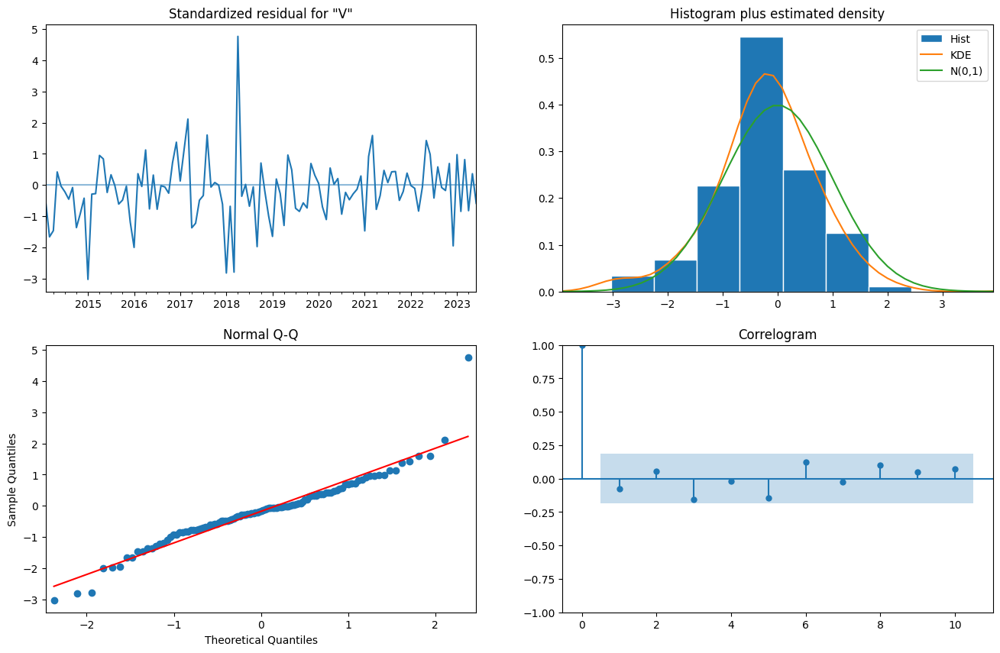

In [ ]:
results_cn40.plot_diagnostics(figsize=(16, 10))
plt.show()

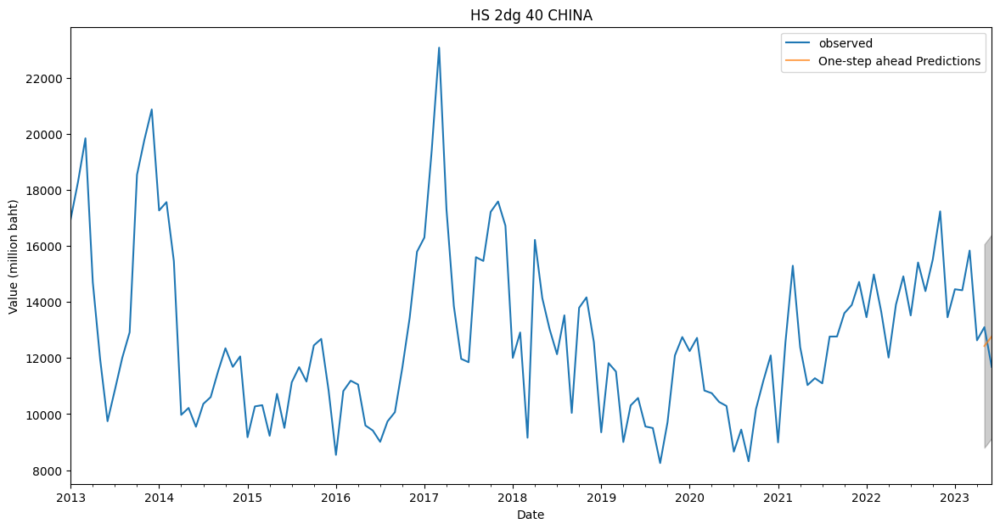

In [ ]:
pred_cn40 = results_cn40.get_prediction(start=pd.to_datetime('2023-05-01'), dynamic=False)
pred_ci_cn40 = pred_cn40.conf_int()
ax = cn40_newcolumn['Value (million baht)']['2013':].plot(label='observed')
pred_cn40.predicted_mean.plot(ax=ax, label='One-step ahead Predictions', alpha=.7, figsize=(14, 7))
ax.fill_between(pred_ci_cn40.index,
                pred_ci_cn40.iloc[:, 0],
                pred_ci_cn40.iloc[:, 1], color='k', alpha=.2)
ax.set_xlabel('Date')
ax.set_ylabel('Value (million baht)')
ax.set_title('HS 2dg 40 CHINA')
plt.legend()
plt.show()

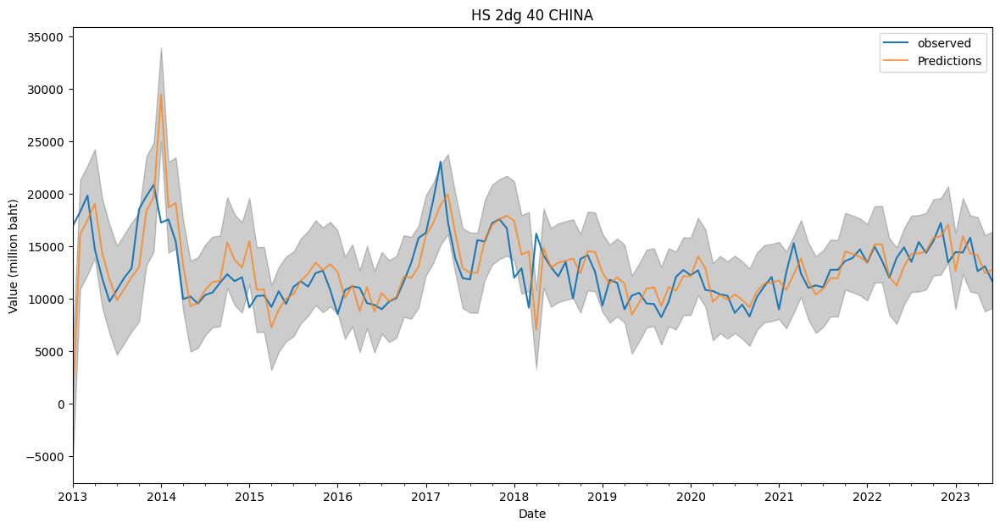

In [ ]:
pred_cn40_total = results_cn40.get_prediction(start=pd.to_datetime('2013-01-01'), dynamic=False)
pred_ci_cn40 = pred_cn40_total.conf_int()
ax = cn40_newcolumn['Value (million baht)']['2013':].plot(label='observed')
pred_cn40_total.predicted_mean.plot(ax=ax, label='Predictions', alpha=.7, figsize=(14, 7))
ax.fill_between(pred_ci_cn40.index,
                pred_ci_cn40.iloc[:, 0],
                pred_ci_cn40.iloc[:, 1], color='k', alpha=.2)
ax.set_xlabel('Date')
ax.set_ylabel('Value (million baht)')
ax.set_title('HS 2dg 40 CHINA')
plt.legend()
plt.show()

In [ ]:
forecasted_cn40 = pred_cn40.predicted_mean
mse_cn40 = ((forecasted_cn40 - cn40_newcolumn_test['Value (million baht)']) ** 2).mean()
# forecasted_g3 = forecasted_us**(1/2)
mape_cn40 = (np.abs(cn40_newcolumn_test['Value (million baht)'] - forecasted_cn40) / np.abs(cn40_newcolumn_test['Value (million baht)'])).mean() * 100
print('The Mean Squared Error of forecasts is {}'.format(round(mse_cn40, 2)))
print('The Root Mean Squared Error of forecasts is {}'.format(round(np.sqrt(mse_cn40), 2)))
print('Mean Absolute Percentage Error (MAPE): {:.2f}%'.format(mape_cn40))

The Mean Squared Error of forecasts is 1183334.72
The Root Mean Squared Error of forecasts is 1087.81
Mean Absolute Percentage Error (MAPE): 9.31%


### Forecast

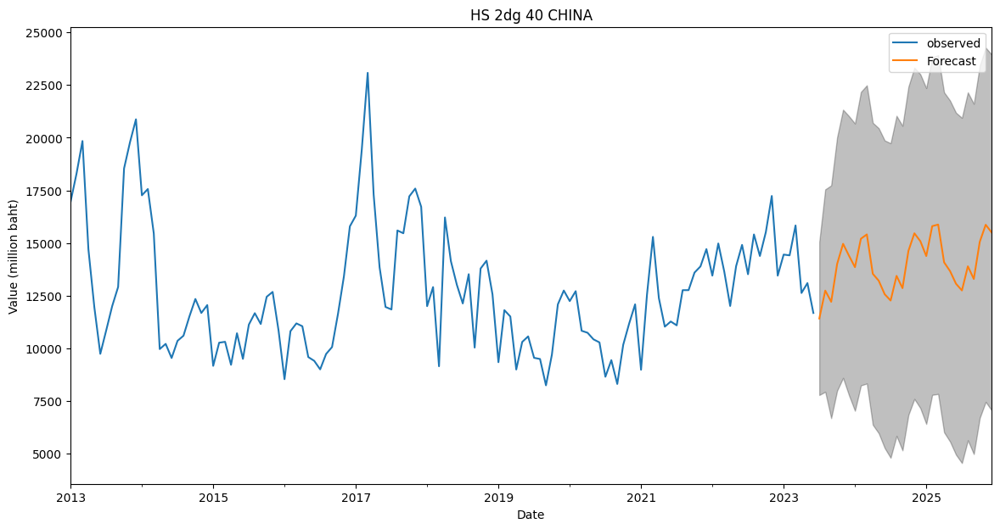

In [ ]:
pred_uc_cn40 = results_cn40.get_forecast(steps=30)
pred_ci_cn40 = pred_uc_cn40.conf_int()
ax = cn40_newcolumn['Value (million baht)'].plot(label='observed', figsize=(14, 7))
pred_uc_cn40.predicted_mean.plot(ax=ax, label='Forecast')
ax.fill_between(pred_ci_cn40.index,
                pred_ci_cn40.iloc[:, 0],
                pred_ci_cn40.iloc[:, 1], color='k', alpha=.25)
ax.set_xlabel('Date')
ax.set_ylabel('Value (million baht)')
ax.set_title('HS 2dg 40 CHINA')
plt.legend()
plt.show()

# China84

array([[<Axes: title={'center': 'Unnamed: 0'}>,
        <Axes: title={'center': 'HS 2dg'}>],
       [<Axes: title={'center': 'Year'}>,
        <Axes: title={'center': 'Month'}>],
       [<Axes: title={'center': 'Value (million baht)'}>, <Axes: >]],
      dtype=object)

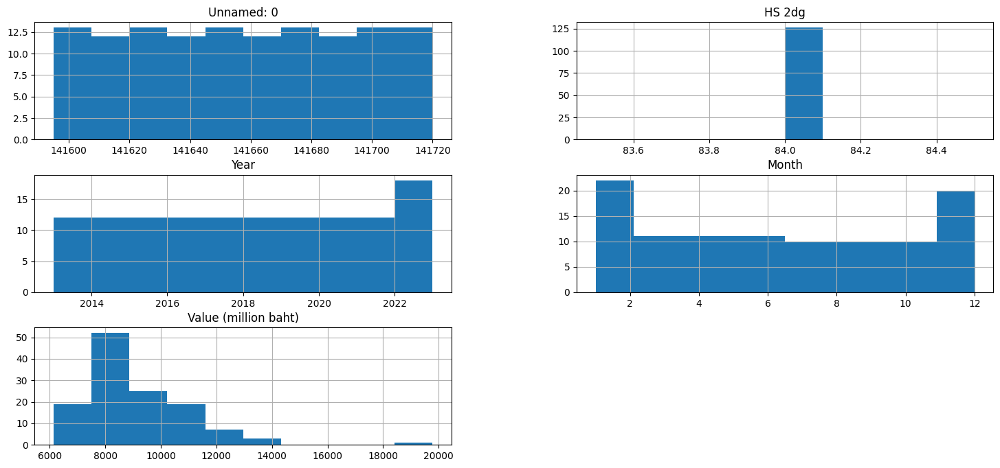

In [ ]:
cn84 = pd.read_csv('/content/resultchina84.csv')
cn84.hist()

<Axes: >

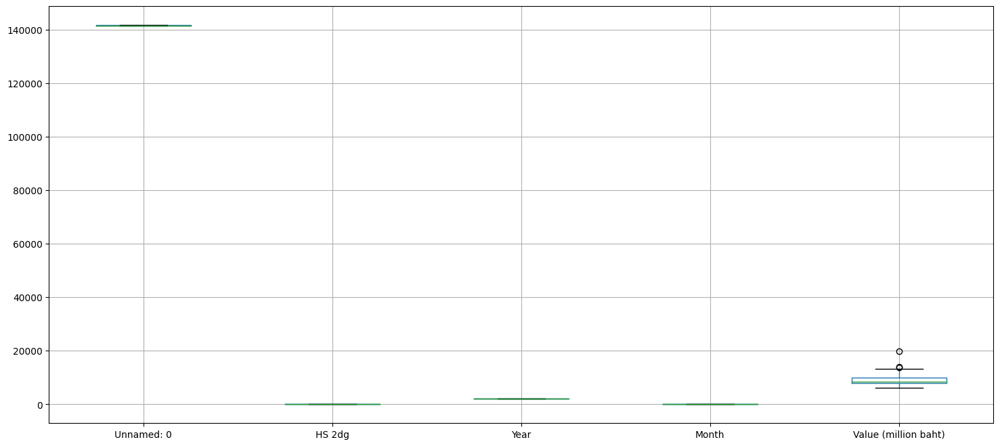

In [ ]:
cn84.boxplot()

In [ ]:
cn84.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 126 entries, 0 to 125
Data columns (total 6 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Unnamed: 0            126 non-null    int64  
 1   Country               126 non-null    object 
 2   HS 2dg                126 non-null    int64  
 3   Year                  126 non-null    int64  
 4   Month                 126 non-null    int64  
 5   Value (million baht)  126 non-null    float64
dtypes: float64(1), int64(4), object(1)
memory usage: 6.0+ KB


In [ ]:
def find_outlier(data):
  Q1 = np.percentile(data, 25)
  Q3 = np.percentile(data, 75)
  IQR = Q3 - Q1
  lower = Q1 - 1.5 * IQR
  upper = Q3 + 1.5 * IQR
  outlier = data[(data < lower) | (data > upper) ]
  return outlier

outlier_cn84 = find_outlier(cn84['Value (million baht)'])
print("Outlier in Value:")
print(outlier_cn84)
# print("Lower:",lower, "Upper: ",upper)
# จำนวน rows ที่มี outlier
outlier_count_cn84 = len(outlier_cn84)

# จำนวน rows ทั้งหมด
total_rows_cn84 = len(cn84)

# คำนวณเปอร์เซ็นต์ของ rows ที่มี outlier
percentage_outlier_cn84 = (outlier_count_cn84 / total_rows_cn84) * 100

print(f"เปอร์เซ็นต์ของ rows ที่มี outlier: {percentage_outlier_cn84:.2f}%")

Outlier in Value:
62     13766.150797
107    14031.902458
110    19782.283025
Name: Value (million baht), dtype: float64
เปอร์เซ็นต์ของ rows ที่มี outlier: 2.38%


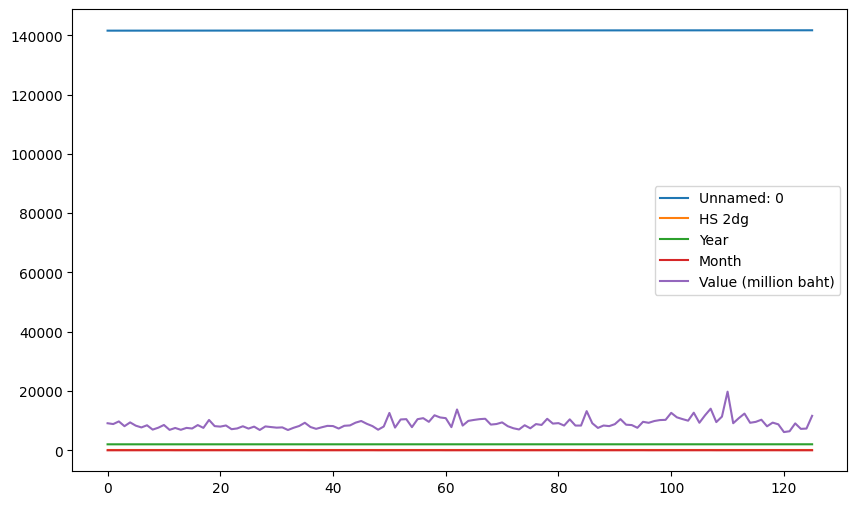

In [ ]:
cn84.plot(figsize=(10, 6))
plt.show()

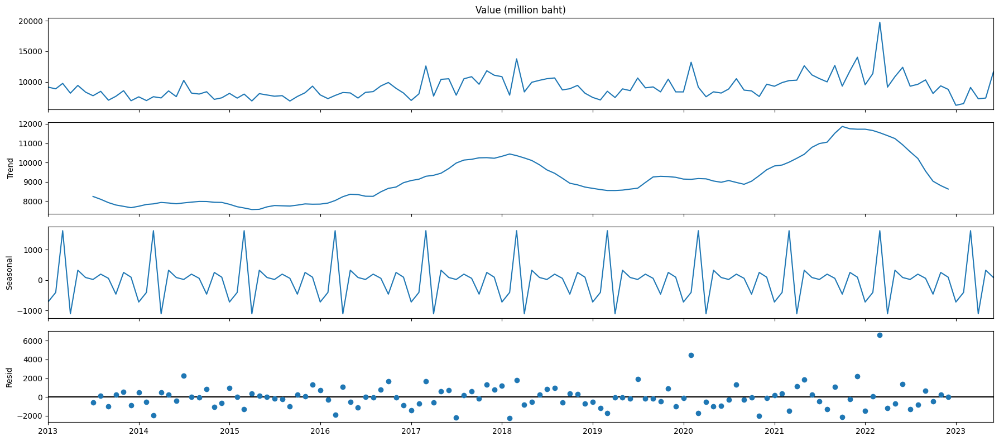

In [ ]:
# แปลงคอลัมน์ 'Month' เป็นข้อความ
cn84['Month'] = cn84['Month'].astype(str)

# แปลงคอลัมน์ 'Year' เป็นข้อความ
cn84['Year'] = cn84['Year'].astype(str)

# แปลงคอลัมน์ 'Month Year' เป็นรูปแบบ '01-2020'
cn84['Month Year'] = cn84['Month'].str.zfill(2) + '-' + cn84['Year']

# แปลงคอลัมน์ 'Month Year' เป็น DatetimeIndex และระบุความถี่เป็นรายเดือน ('M')
cn84_datetime= cn84.set_index(pd.to_datetime(cn84['Month Year'], format='%m-%Y', errors='coerce'))

rcParams['figure.figsize'] = (18, 8)  # กำหนดขนาดกราฟใหญ่ขึ้น
decomposition = sm.tsa.seasonal_decompose(cn84_datetime['Value (million baht)'], model='additive', period=12)
fig = decomposition.plot()
plt.show()

## Check stationary test

In [ ]:
#Integrated (d)
from statsmodels.tsa.stattools import adfuller
def adf_test(timeseries):
    print ('Results of Dickey-Fuller Test:')
    dftest = adfuller(timeseries, autolag='AIC')
    dfoutput = pd.Series(dftest[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
    for key,value in dftest[4].items():
        dfoutput['Critical Value (%s)'%key] = value
    print (dfoutput)
# Call the function and run the test

adf_test(cn84['Value (million baht)'])

Results of Dickey-Fuller Test:
Test Statistic                  -2.686794
p-value                          0.076351
#Lags Used                       2.000000
Number of Observations Used    123.000000
Critical Value (1%)             -3.484667
Critical Value (5%)             -2.885340
Critical Value (10%)            -2.579463
dtype: float64


In [ ]:
cn84_new = cn84_datetime.copy()
cn84_new

,Unnamed: 0,Country,HS 2dg,Year,Month,Value (million baht),Month Year
Month Year,,,,,,,
2013-01-01,141595,CHINA,84,2013,1,9121.964788,01-2013
2013-02-01,141596,CHINA,84,2013,2,8851.000895,02-2013
2013-03-01,141597,CHINA,84,2013,3,9736.092983,03-2013
2013-04-01,141598,CHINA,84,2013,4,8132.381011,04-2013
2013-05-01,141599,CHINA,84,2013,5,9407.999322,05-2013
...,...,...,...,...,...,...,...
2023-02-01,141716,CHINA,84,2023,2,6422.066645,02-2023
2023-03-01,141717,CHINA,84,2023,3,9072.942955,03-2023
2023-04-01,141718,CHINA,84,2023,4,7223.305326,04-2023


## Differencing

p-Values:4.644909753993919e-30


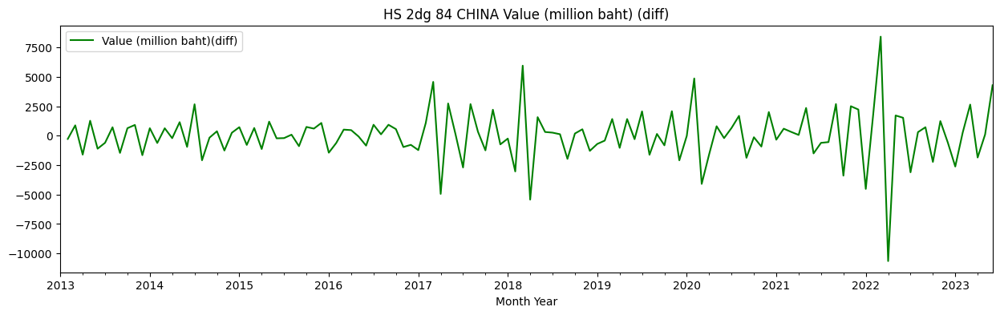

In [ ]:
#First difference
cn84_new['Value (million baht)_diff'] = cn84_new['Value (million baht)'].diff()
cn84_new['Value (million baht)_diff'].plot(color = 'green', figsize = (15,4))
plt.legend(['Value (million baht)(diff)'])
plt.title('HS 2dg 84 CHINA Value (million baht) (diff)')

cn84_new_adf = adfuller(cn84_new['Value (million baht)_diff'].dropna(), autolag = 'AIC')
print('p-Values:' + str(cn84_new_adf[1]))

## Model 1 & LOOCV

In [ ]:
column = ['Value (million baht)_diff','Value (million baht)']
cn84_newcolumn = cn84_new[column]
cn84_newcolumn

,Value (million baht)_diff,Value (million baht)
Month Year,,
2013-01-01,NaN,9121.964788
2013-02-01,-270.963893,8851.000895
2013-03-01,885.092088,9736.092983
2013-04-01,-1603.711972,8132.381011
2013-05-01,1275.618311,9407.999322
...,...,...
2023-02-01,279.439026,6422.066645
2023-03-01,2650.876310,9072.942955
2023-04-01,-1849.637629,7223.305326


In [ ]:
# แบ่งข้อมูลออกเป็น 125 rows สำหรับ training และ 1 rows สำหรับ testing
cn84_newcolumn_train = cn84_newcolumn.iloc[:125]
cn84_newcolumn_test = cn84_newcolumn.iloc[125:]

# กำหนดช่วงของลำดับ
p_range = range(0, 2)
d_range = range(0, 2)
q_range = range(0, 2)

# กำหนดช่วงของลำดับฤดูกาล
P_range = range(0, 2)
D_range = range(0, 2)
Q_range = range(0, 2)

# สร้างพจนานุกรมสำหรับเก็บค่าพารามิเตอร์
param_grid = dict(
    p=p_range,
    d=d_range,
    q=q_range,
    P=P_range,
    D=D_range,
    Q=Q_range,
)

# เลือกโมเดลที่ดีที่สุดโดยใช้ AIC
best_model_cn84 = None
best_aic_cn84 = float("inf")

for p in param_grid['p']:
    for d in param_grid['d']:
        for q in param_grid['q']:
            for P in param_grid['P']:
                for D in param_grid['D']:
                    for Q in param_grid['Q']:
                        order = (p, d, q)
                        seasonal_order = (P, D, Q, 12)

                        # สร้างโมเดล SARIMA
                        sarima_model_cn84_newcolumn = SARIMAX(cn84_newcolumn_train['Value (million baht)_diff'], order=order, seasonal_order=seasonal_order, enforce_stationarity=False)

                        # ฝึกโมเดล
                        sarima_fit_cn84_newcolumn = sarima_model_cn84_newcolumn.fit()

                        # คำนวณ AIC
                        aic = sarima_fit_cn84_newcolumn.aic

                        # บันทึกโมเดลที่มี AIC ต่ำสุด
                        if aic < best_aic_cn84:
                            best_model_cn84 = sarima_fit_cn84_newcolumn
                            best_aic_cn84 = aic
                            best_param_cn84 = (p, d, q, P, D, Q)

# แสดงค่าพารามิเตอร์ที่ดีที่สุด
print("Best Parameters:", best_param_cn84)
print("Best AIC:", best_aic_cn84)

Best Parameters: (0, 0, 1, 0, 1, 1)
Best AIC: 1764.1995991197098


In [ ]:
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error

# ทำนายค่าสำหรับชุดข้อมูลทดสอบ
y_pred_cn84 = best_model_cn84.predict(start=cn84_newcolumn_test.index[0], end=cn84_newcolumn_test.index[-1])

# คำนวณ MAE และ RMSE และ MSE
mae_cn84 = mean_absolute_error(cn84_newcolumn_test['Value (million baht)_diff'], y_pred_cn84)
rmse_cn84 = mean_squared_error(cn84_newcolumn_test['Value (million baht)_diff'], y_pred_cn84) ** 0.5
mse_cn84 = rmse_cn84 ** 2

# แสดงค่า MAE และ RMSE
print("MAE:", mae_cn84)
print("RMSE:", rmse_cn84)
print("MSE:", mse_cn84)

MAE: 3819.3332267724104
RMSE: 3819.3332267724104
MSE: 14587306.297127752


In [ ]:
p = d = q = range(0, 2)
pdq = list(itertools.product(p, d, q))
seasonal_pdq = [(x[0], x[1], x[2], 12) for x in list(itertools.product(p, d, q))]
print('Examples of parameter combinations for Seasonal ARIMA...')
print('SARIMAX: {} x {}'.format(pdq[1], seasonal_pdq[1]))
print('SARIMAX: {} x {}'.format(pdq[1], seasonal_pdq[2]))
print('SARIMAX: {} x {}'.format(pdq[2], seasonal_pdq[3]))
print('SARIMAX: {} x {}'.format(pdq[2], seasonal_pdq[4]))

Examples of parameter combinations for Seasonal ARIMA...
SARIMAX: (0, 0, 1) x (0, 0, 1, 12)
SARIMAX: (0, 0, 1) x (0, 1, 0, 12)
SARIMAX: (0, 1, 0) x (0, 1, 1, 12)
SARIMAX: (0, 1, 0) x (1, 0, 0, 12)


In [ ]:
for param in pdq:
    for param_seasonal in seasonal_pdq:
        try:
            mod = sm.tsa.statespace.SARIMAX(cn84_newcolumn_train['Value (million baht)_diff'],
                                            order=param,
                                            seasonal_order=param_seasonal,
                                            enforce_stationarity=False,
                                            enforce_invertibility=False)
            results = mod.fit()
            print('ARIMA{}x{}12 - AIC:{}'.format(param, param_seasonal, results.aic))
        except Exception as e:
            print(e)
            continue

ARIMA(0, 0, 0)x(0, 0, 0, 12)12 - AIC:2256.016791773544
ARIMA(0, 0, 0)x(0, 0, 1, 12)12 - AIC:2041.3531071296175
ARIMA(0, 0, 0)x(0, 1, 0, 12)12 - AIC:2089.935442142493
ARIMA(0, 0, 0)x(0, 1, 1, 12)12 - AIC:1825.5289612816407
ARIMA(0, 0, 0)x(1, 0, 0, 12)12 - AIC:2058.745362981818
ARIMA(0, 0, 0)x(1, 0, 1, 12)12 - AIC:2043.27075584887
ARIMA(0, 0, 0)x(1, 1, 0, 12)12 - AIC:1872.1808692084453
ARIMA(0, 0, 0)x(1, 1, 1, 12)12 - AIC:1827.389879781285
ARIMA(0, 0, 1)x(0, 0, 0, 12)12 - AIC:2173.375782079727
ARIMA(0, 0, 1)x(0, 0, 1, 12)12 - AIC:1970.3433363573183
ARIMA(0, 0, 1)x(0, 1, 0, 12)12 - AIC:2026.8763110373843
ARIMA(0, 0, 1)x(0, 1, 1, 12)12 - AIC:1764.6045027195528
ARIMA(0, 0, 1)x(1, 0, 0, 12)12 - AIC:2003.8858924990325
ARIMA(0, 0, 1)x(1, 0, 1, 12)12 - AIC:1972.323013452137
ARIMA(0, 0, 1)x(1, 1, 0, 12)12 - AIC:1827.8008738288888
ARIMA(0, 0, 1)x(1, 1, 1, 12)12 - AIC:1765.9903495019807
ARIMA(0, 1, 0)x(0, 0, 0, 12)12 - AIC:2375.48285069703
ARIMA(0, 1, 0)x(0, 0, 1, 12)12 - AIC:2145.034113768358
ARI

In [ ]:
mod_cn84 = sm.tsa.statespace.SARIMAX(cn84_newcolumn['Value (million baht)'],
                                order=(0, 0, 1),
                                seasonal_order=(0, 1, 1, 12),
                                enforce_invertibility=False)
results_cn84 = mod_cn84.fit()
print(results_cn84.summary().tables[1])

                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1          0.3431      0.088      3.904      0.000       0.171       0.515
ma.S.L12      -0.4429      0.067     -6.623      0.000      -0.574      -0.312
sigma2      4.266e+06   3.89e+05     10.953      0.000     3.5e+06    5.03e+06


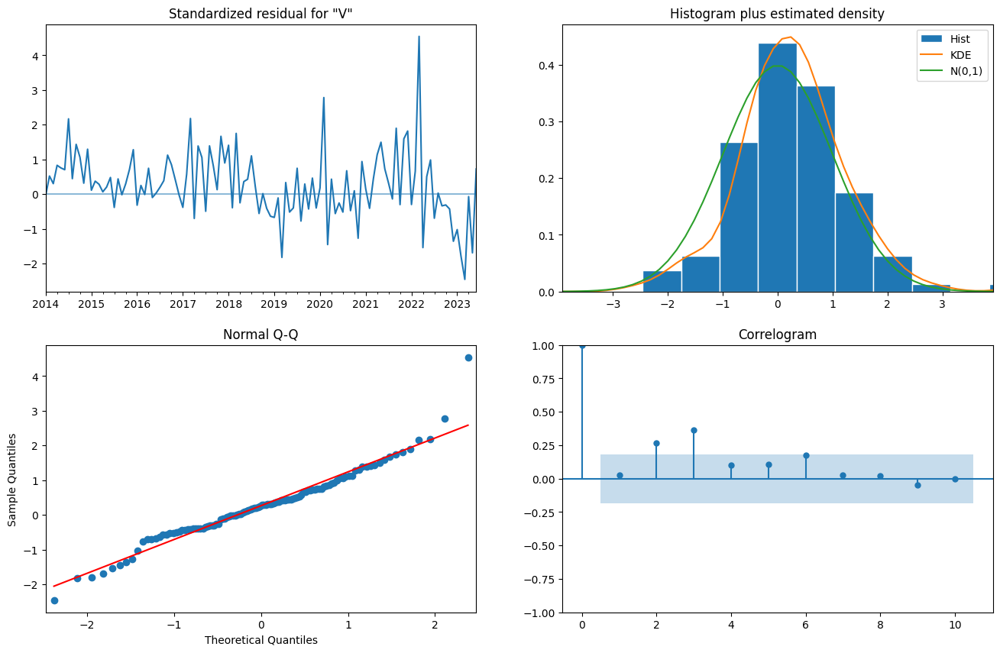

In [ ]:
results_cn84.plot_diagnostics(figsize=(16, 10))
plt.show()

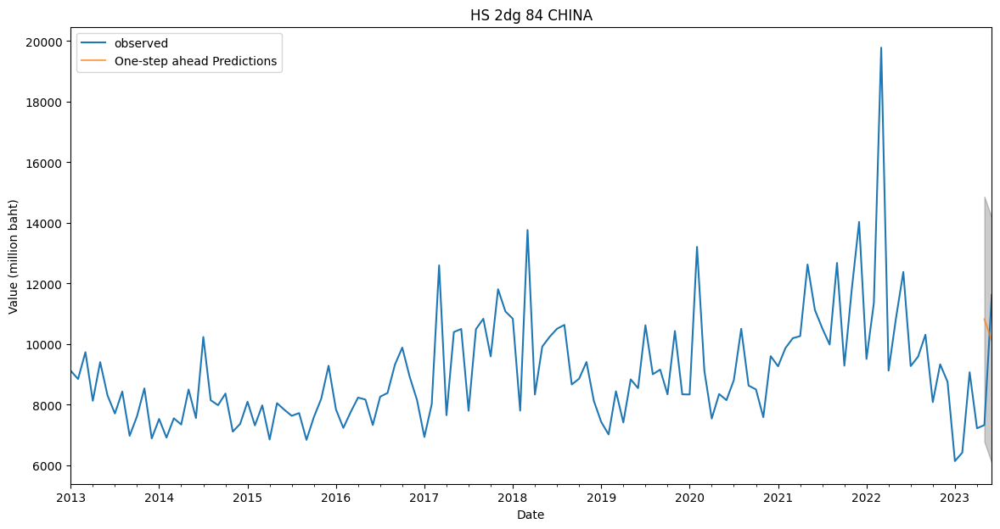

In [ ]:
pred_cn84 = results_cn84.get_prediction(start=pd.to_datetime('2023-05-01'), dynamic=False)
pred_ci_cn84 = pred_cn84.conf_int()
ax = cn84_newcolumn['Value (million baht)']['2013':].plot(label='observed')
pred_cn84.predicted_mean.plot(ax=ax, label='One-step ahead Predictions', alpha=.7, figsize=(14, 7))
ax.fill_between(pred_ci_cn84.index,
                pred_ci_cn84.iloc[:, 0],
                pred_ci_cn84.iloc[:, 1], color='k', alpha=.2)
ax.set_xlabel('Date')
ax.set_ylabel('Value (million baht)')
ax.set_title('HS 2dg 84 CHINA')
plt.legend()
plt.show()

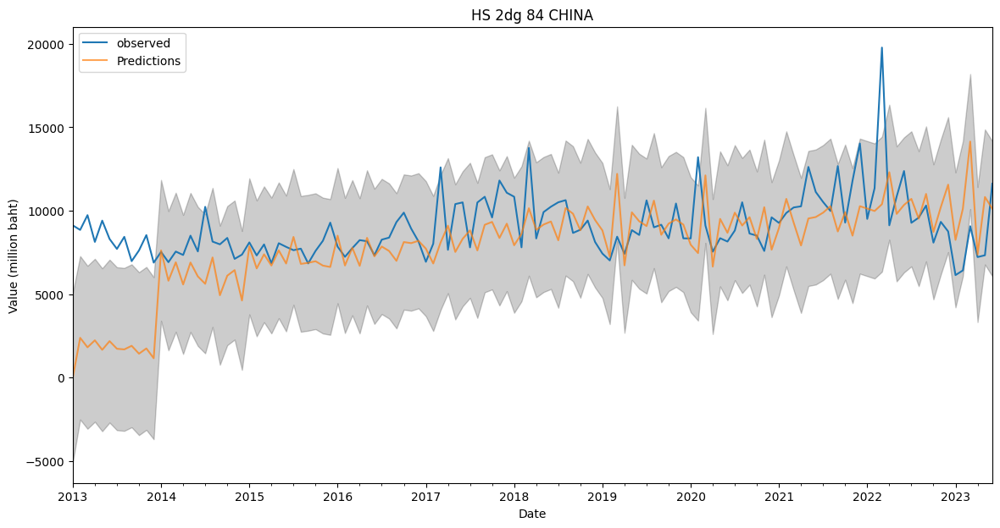

In [ ]:
pred_cn84_total = results_cn84.get_prediction(start=pd.to_datetime('2013-01-01'), dynamic=False)
pred_ci_cn84 = pred_cn84_total.conf_int()
ax = cn84_newcolumn['Value (million baht)']['2013':].plot(label='observed')
pred_cn84_total.predicted_mean.plot(ax=ax, label='Predictions', alpha=.7, figsize=(14, 7))
ax.fill_between(pred_ci_cn84.index,
                pred_ci_cn84.iloc[:, 0],
                pred_ci_cn84.iloc[:, 1], color='k', alpha=.2)
ax.set_xlabel('Date')
ax.set_ylabel('Value (million baht)')
ax.set_title('HS 2dg 84 CHINA')
plt.legend()
plt.show()

In [ ]:
forecasted_cn84 = pred_cn84.predicted_mean
mse_cn84 = ((forecasted_cn84 - cn84_newcolumn_test['Value (million baht)']) ** 2).mean()
# forecasted_g3 = forecasted_us**(1/2)
mape_cn84 = (np.abs(cn84_newcolumn_test['Value (million baht)'] - forecasted_cn84) / np.abs(cn84_newcolumn_test['Value (million baht)'])).mean() * 100
print('The Mean Squared Error of forecasts is {}'.format(round(mse_cn84, 2)))
print('The Root Mean Squared Error of forecasts is {}'.format(round(np.sqrt(mse_cn84), 2)))
print('Mean Absolute Percentage Error (MAPE): {:.2f}%'.format(mape_cn84))

The Mean Squared Error of forecasts is 2245517.0
The Root Mean Squared Error of forecasts is 1498.5
Mean Absolute Percentage Error (MAPE): 12.89%


### Forecast

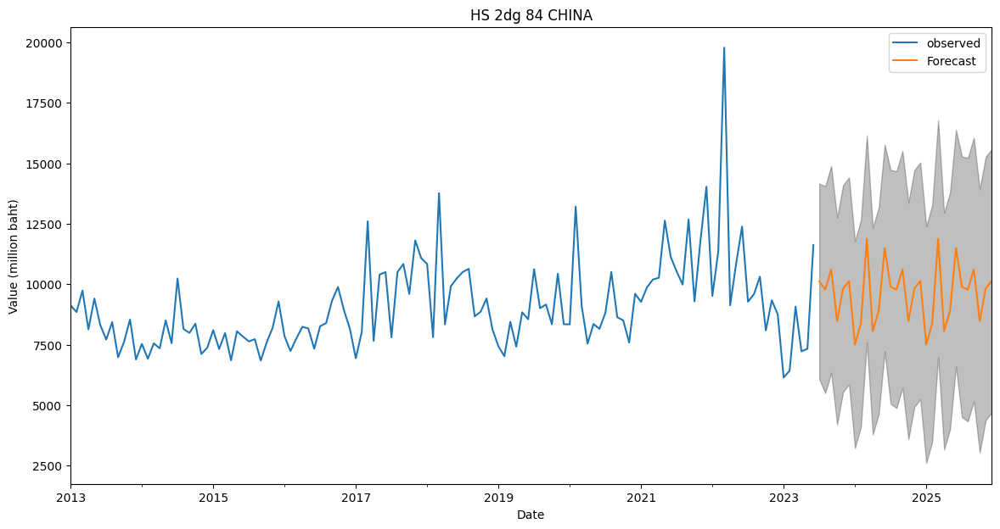

In [ ]:
pred_uc_cn84 = results_cn84.get_forecast(steps=30)
pred_ci_cn84 = pred_uc_cn84.conf_int()
ax = cn84_newcolumn['Value (million baht)'].plot(label='observed', figsize=(14, 7))
pred_uc_cn84.predicted_mean.plot(ax=ax, label='Forecast')
ax.fill_between(pred_ci_cn84.index,
                pred_ci_cn84.iloc[:, 0],
                pred_ci_cn84.iloc[:, 1], color='k', alpha=.25)
ax.set_xlabel('Date')
ax.set_ylabel('Value (million baht)')
ax.set_title('HS 2dg 84 CHINA')
plt.legend()
plt.show()

# China39

array([[<Axes: title={'center': 'Unnamed: 0'}>,
        <Axes: title={'center': 'HS 2dg'}>],
       [<Axes: title={'center': 'Year'}>,
        <Axes: title={'center': 'Month'}>],
       [<Axes: title={'center': 'Value (million baht)'}>, <Axes: >]],
      dtype=object)

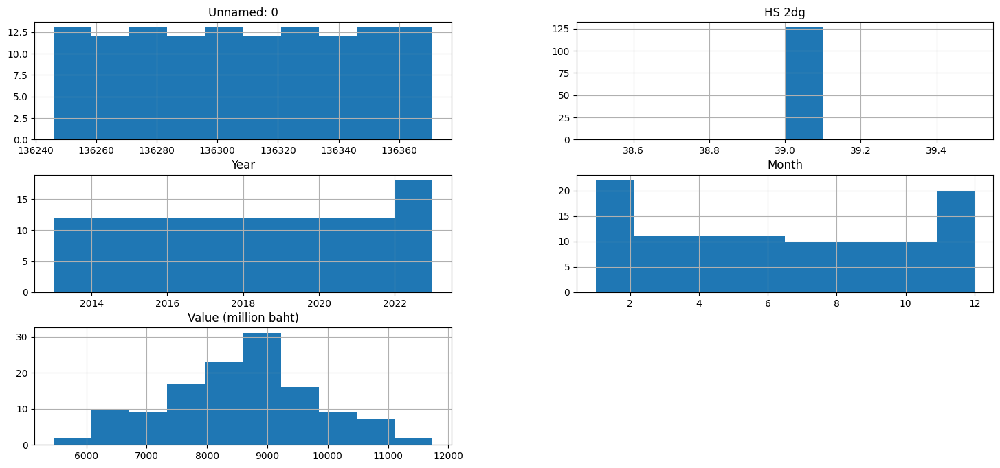

In [ ]:
cn39 = pd.read_csv('/content/resultchina39.csv')
cn39.hist()

<Axes: >

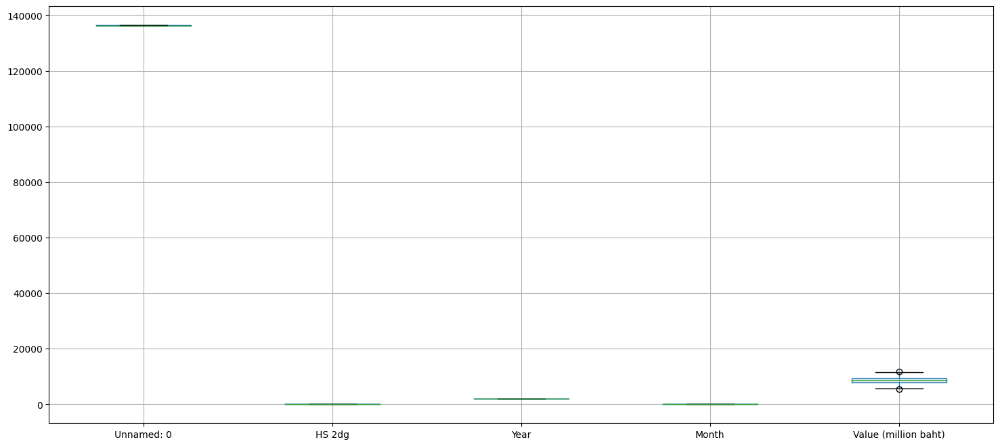

In [ ]:
cn39.boxplot()

In [ ]:
cn39.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 126 entries, 0 to 125
Data columns (total 6 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Unnamed: 0            126 non-null    int64  
 1   Country               126 non-null    object 
 2   HS 2dg                126 non-null    int64  
 3   Year                  126 non-null    int64  
 4   Month                 126 non-null    int64  
 5   Value (million baht)  126 non-null    float64
dtypes: float64(1), int64(4), object(1)
memory usage: 6.0+ KB


In [ ]:
def find_outlier(data):
  Q1 = np.percentile(data, 25)
  Q3 = np.percentile(data, 75)
  IQR = Q3 - Q1
  lower = Q1 - 1.5 * IQR
  upper = Q3 + 1.5 * IQR
  outlier = data[(data < lower) | (data > upper) ]
  return outlier

outlier_cn39 = find_outlier(cn39['Value (million baht)'])
print("Outlier in Value:")
print(outlier_cn39)
# print("Lower:",lower, "Upper: ",upper)
# จำนวน rows ที่มี outlier
outlier_count_cn39 = len(outlier_cn39)

# จำนวน rows ทั้งหมด
total_rows_cn39 = len(cn39)

# คำนวณเปอร์เซ็นต์ของ rows ที่มี outlier
percentage_outlier_cn39 = (outlier_count_cn39 / total_rows_cn39) * 100

print(f"เปอร์เซ็นต์ของ rows ที่มี outlier: {percentage_outlier_cn39:.2f}%")

Outlier in Value:
85      5459.539616
106    11737.491197
Name: Value (million baht), dtype: float64
เปอร์เซ็นต์ของ rows ที่มี outlier: 1.59%


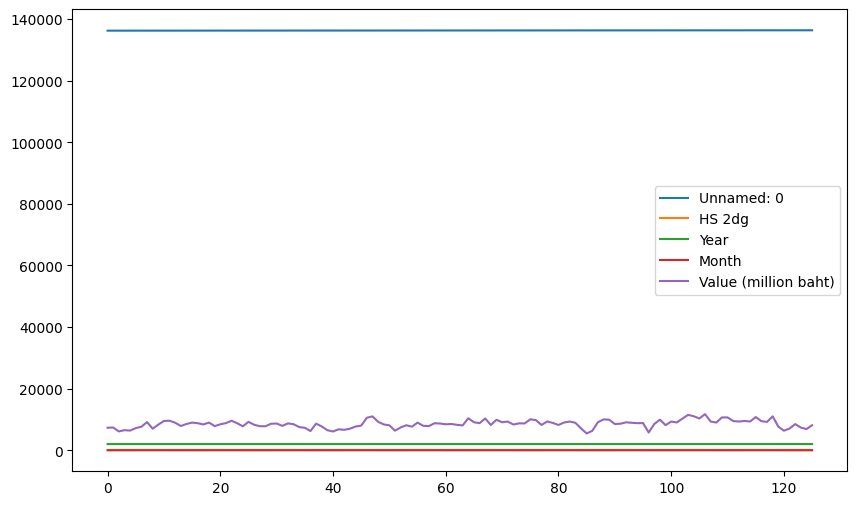

In [ ]:
cn39.plot(figsize=(10, 6))
plt.show()

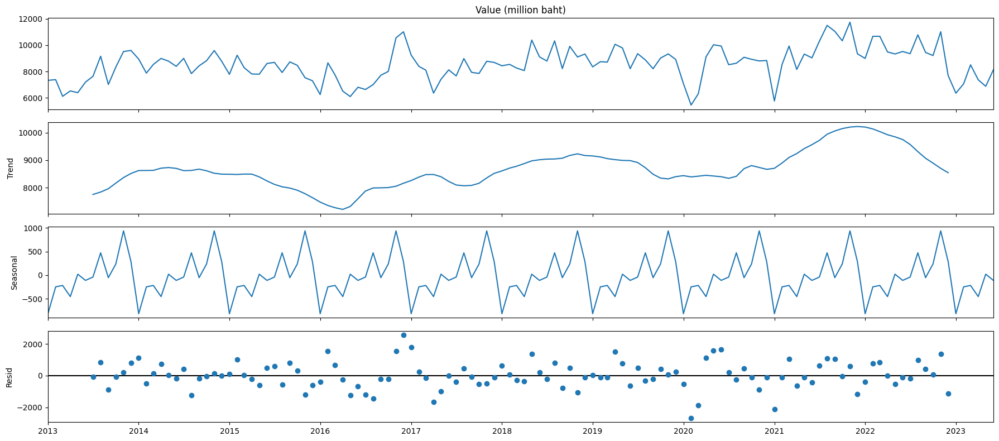

In [ ]:
# แปลงคอลัมน์ 'Month' เป็นข้อความ
cn39['Month'] = cn39['Month'].astype(str)

# แปลงคอลัมน์ 'Year' เป็นข้อความ
cn39['Year'] = cn39['Year'].astype(str)

# แปลงคอลัมน์ 'Month Year' เป็นรูปแบบ '01-2020'
cn39['Month Year'] = cn39['Month'].str.zfill(2) + '-' + cn39['Year']

# แปลงคอลัมน์ 'Month Year' เป็น DatetimeIndex และระบุความถี่เป็นรายเดือน ('M')
cn39_datetime= cn39.set_index(pd.to_datetime(cn39['Month Year'], format='%m-%Y', errors='coerce'))

rcParams['figure.figsize'] = (18, 8)  # กำหนดขนาดกราฟใหญ่ขึ้น
decomposition = sm.tsa.seasonal_decompose(cn39_datetime['Value (million baht)'], model='additive', period=12)
fig = decomposition.plot()
plt.show()

## Check stationary test

In [ ]:
#Integrated (d)
from statsmodels.tsa.stattools import adfuller
def adf_test(timeseries):
    print ('Results of Dickey-Fuller Test:')
    dftest = adfuller(timeseries, autolag='AIC')
    dfoutput = pd.Series(dftest[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
    for key,value in dftest[4].items():
        dfoutput['Critical Value (%s)'%key] = value
    print (dfoutput)
# Call the function and run the test

adf_test(cn39['Value (million baht)'])

Results of Dickey-Fuller Test:
Test Statistic                -5.791076e+00
p-value                        4.870784e-07
#Lags Used                     0.000000e+00
Number of Observations Used    1.250000e+02
Critical Value (1%)           -3.483779e+00
Critical Value (5%)           -2.884954e+00
Critical Value (10%)          -2.579257e+00
dtype: float64


In [ ]:
cn39_new = cn39_datetime.copy()
cn39_new

,Unnamed: 0,Country,HS 2dg,Year,Month,Value (million baht),Month Year
Month Year,,,,,,,
2013-01-01,136246,CHINA,39,2013,1,7332.312972,01-2013
2013-02-01,136247,CHINA,39,2013,2,7385.041673,02-2013
2013-03-01,136248,CHINA,39,2013,3,6122.119109,03-2013
2013-04-01,136249,CHINA,39,2013,4,6533.057650,04-2013
2013-05-01,136250,CHINA,39,2013,5,6397.346374,05-2013
...,...,...,...,...,...,...,...
2023-02-01,136367,CHINA,39,2023,2,7062.167134,02-2023
2023-03-01,136368,CHINA,39,2023,3,8508.988652,03-2023
2023-04-01,136369,CHINA,39,2023,4,7373.595869,04-2023


## No Differencing

In [ ]:
# #First difference
# cn39_new['Value (million baht)_diff'] = cn39_new['Value (million baht)'].diff()
# cn39_new['Value (million baht)_diff'].plot(color = 'green', figsize = (15,4))
# plt.legend(['Value (million baht)(diff)'])
# plt.title('HS 2dg 39 CHINA Value (million baht) (diff)')

# cn39_new_adf = adfuller(cn39_new['Value (million baht)_diff'].dropna(), autolag = 'AIC')
# print('p-Values:' + str(cn39_new_adf[1]))

## Model 1 & LOOCV

In [ ]:
column = ['Value (million baht)']
cn39_newcolumn = cn39_new[column]
cn39_newcolumn

,Value (million baht)
Month Year,
2013-01-01,7332.312972
2013-02-01,7385.041673
2013-03-01,6122.119109
2013-04-01,6533.057650
2013-05-01,6397.346374
...,...
2023-02-01,7062.167134
2023-03-01,8508.988652
2023-04-01,7373.595869


In [ ]:
# แบ่งข้อมูลออกเป็น 125 rows สำหรับ training และ 1 rows สำหรับ testing
cn39_newcolumn_train = cn39_newcolumn.iloc[:125]
cn39_newcolumn_test = cn39_newcolumn.iloc[125:]

# กำหนดช่วงของลำดับ
p_range = range(0, 2)
d_range = range(0, 2)
q_range = range(0, 2)

# กำหนดช่วงของลำดับฤดูกาล
P_range = range(0, 2)
D_range = range(0, 2)
Q_range = range(0, 2)

# สร้างพจนานุกรมสำหรับเก็บค่าพารามิเตอร์
param_grid = dict(
    p=p_range,
    d=d_range,
    q=q_range,
    P=P_range,
    D=D_range,
    Q=Q_range,
)

# เลือกโมเดลที่ดีที่สุดโดยใช้ AIC
best_model_cn39 = None
best_aic_cn39 = float("inf")

for p in param_grid['p']:
    for d in param_grid['d']:
        for q in param_grid['q']:
            for P in param_grid['P']:
                for D in param_grid['D']:
                    for Q in param_grid['Q']:
                        order = (p, d, q)
                        seasonal_order = (P, D, Q, 12)

                        # สร้างโมเดล SARIMA
                        sarima_model_cn39_newcolumn = SARIMAX(cn39_newcolumn_train['Value (million baht)'], order=order, seasonal_order=seasonal_order, enforce_stationarity=False)

                        # ฝึกโมเดล
                        sarima_fit_cn39_newcolumn = sarima_model_cn39_newcolumn.fit()

                        # คำนวณ AIC
                        aic = sarima_fit_cn39_newcolumn.aic

                        # บันทึกโมเดลที่มี AIC ต่ำสุด
                        if aic < best_aic_cn39:
                            best_model_cn39 = sarima_fit_cn39_newcolumn
                            best_aic_cn39 = aic
                            best_param_cn39 = (p, d, q, P, D, Q)

# แสดงค่าพารามิเตอร์ที่ดีที่สุด
print("Best Parameters:", best_param_cn39)
print("Best AIC:", best_aic_cn39)

Best Parameters: (1, 1, 1, 0, 1, 1)
Best AIC: 1656.5979175566908


In [ ]:
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error

# ทำนายค่าสำหรับชุดข้อมูลทดสอบ
y_pred_cn39 = best_model_cn39.predict(start=cn39_newcolumn_test.index[0], end=cn39_newcolumn_test.index[-1])

# คำนวณ MAE และ RMSE และ MSE
mae_cn39 = mean_absolute_error(cn39_newcolumn_test['Value (million baht)'], y_pred_cn39)
rmse_cn39 = mean_squared_error(cn39_newcolumn_test['Value (million baht)'], y_pred_cn39) ** 0.5
mse_cn39 = rmse_cn39 ** 2

# แสดงค่า MAE และ RMSE
print("MAE:", mae_cn39)
print("RMSE:", rmse_cn39)
print("MSE:", mse_cn39)

MAE: 330.3566580817014
RMSE: 330.3566580817014
MSE: 109135.52153891018


In [ ]:
p = d = q = range(0, 2)
pdq = list(itertools.product(p, d, q))
seasonal_pdq = [(x[0], x[1], x[2], 12) for x in list(itertools.product(p, d, q))]
print('Examples of parameter combinations for Seasonal ARIMA...')
print('SARIMAX: {} x {}'.format(pdq[1], seasonal_pdq[1]))
print('SARIMAX: {} x {}'.format(pdq[1], seasonal_pdq[2]))
print('SARIMAX: {} x {}'.format(pdq[2], seasonal_pdq[3]))
print('SARIMAX: {} x {}'.format(pdq[2], seasonal_pdq[4]))

In [ ]:
for param in pdq:
    for param_seasonal in seasonal_pdq:
        try:
            mod = sm.tsa.statespace.SARIMAX(cn84_newcolumn_train['Value (million baht)_diff'],
                                            order=param,
                                            seasonal_order=param_seasonal,
                                            enforce_stationarity=False,
                                            enforce_invertibility=False)
            results = mod.fit()
            print('ARIMA{}x{}12 - AIC:{}'.format(param, param_seasonal, results.aic))
        except Exception as e:
            print(e)
            continue

In [ ]:
mod_cn39 = sm.tsa.statespace.SARIMAX(cn39_newcolumn['Value (million baht)'],
                                order=(1, 1, 1),
                                seasonal_order=(0, 1, 1, 12),
                                enforce_invertibility=False)
results_cn39 = mod_cn39.fit()
print(results_cn39.summary().tables[1])

                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.3841      0.159      2.418      0.016       0.073       0.695
ma.L1         -0.7640      0.118     -6.473      0.000      -0.995      -0.533
ma.S.L12      -0.7477      0.086     -8.726      0.000      -0.916      -0.580
sigma2      1.142e+06   1.68e+05      6.813      0.000    8.13e+05    1.47e+06


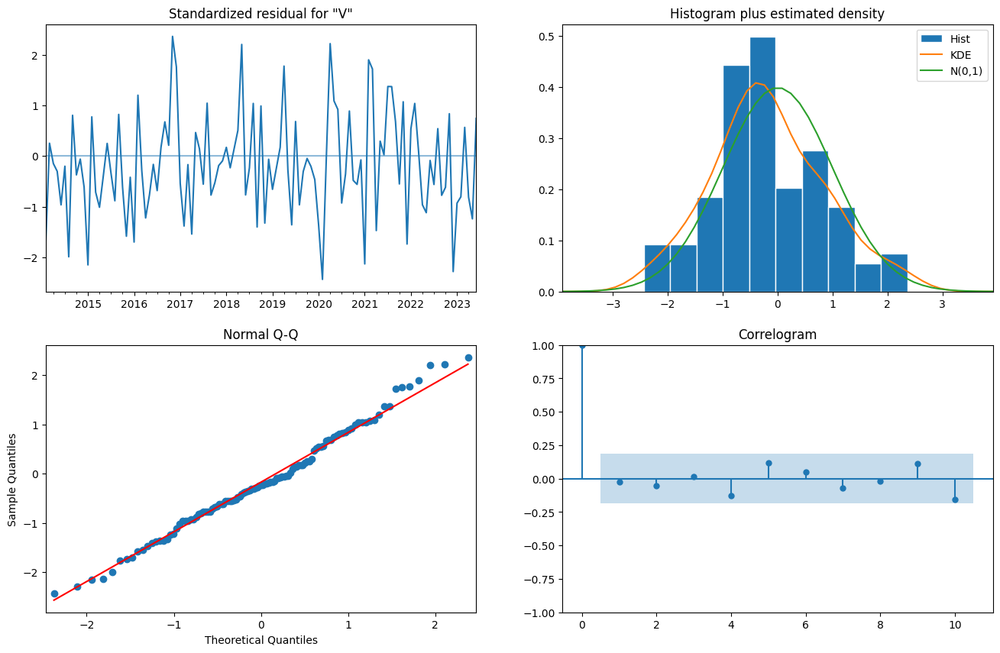

In [ ]:
results_cn39.plot_diagnostics(figsize=(16, 10))
plt.show()

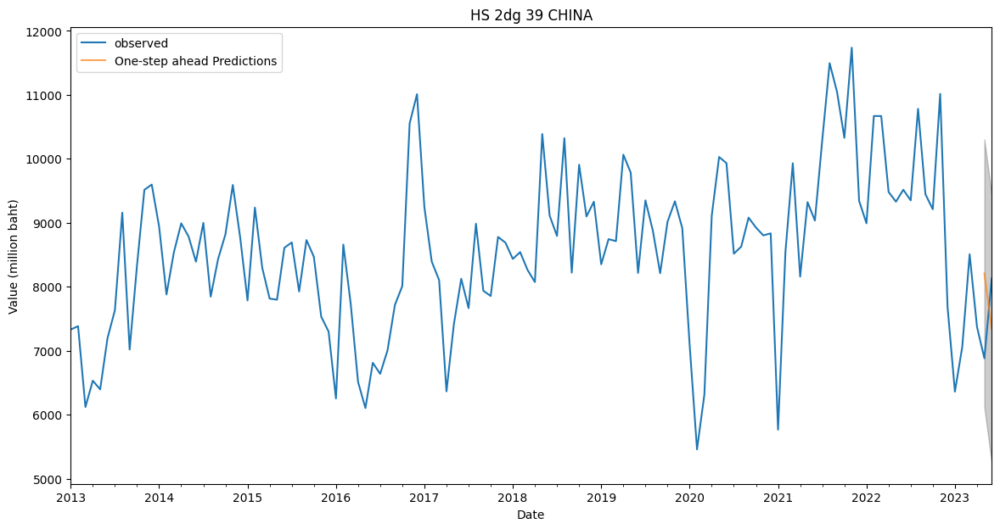

In [ ]:
pred_cn39 = results_cn39.get_prediction(start=pd.to_datetime('2023-05-01'), dynamic=False)
pred_ci_cn39 = pred_cn39.conf_int()
ax = cn39_newcolumn['Value (million baht)']['2013':].plot(label='observed')
pred_cn39.predicted_mean.plot(ax=ax, label='One-step ahead Predictions', alpha=.7, figsize=(14, 7))
ax.fill_between(pred_ci_cn39.index,
                pred_ci_cn39.iloc[:, 0],
                pred_ci_cn39.iloc[:, 1], color='k', alpha=.2)
ax.set_xlabel('Date')
ax.set_ylabel('Value (million baht)')
ax.set_title('HS 2dg 39 CHINA')
plt.legend()
plt.show()

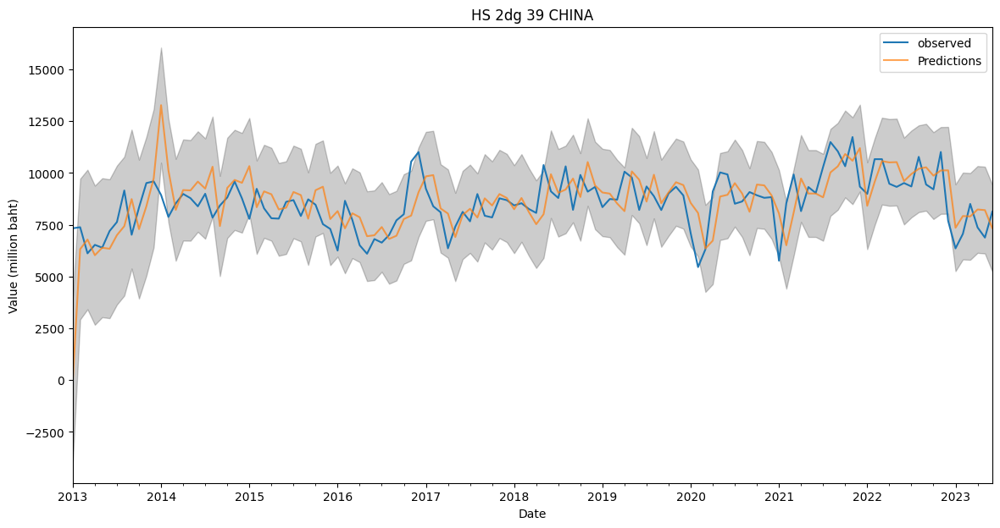

In [ ]:
pred_cn39_total = results_cn39.get_prediction(start=pd.to_datetime('2013-01-01'), dynamic=False)
pred_ci_cn39 = pred_cn39_total.conf_int()
ax = cn39_newcolumn['Value (million baht)']['2013':].plot(label='observed')
pred_cn39_total.predicted_mean.plot(ax=ax, label='Predictions', alpha=.7, figsize=(14, 7))
ax.fill_between(pred_ci_cn39.index,
                pred_ci_cn39.iloc[:, 0],
                pred_ci_cn39.iloc[:, 1], color='k', alpha=.2)
ax.set_xlabel('Date')
ax.set_ylabel('Value (million baht)')
ax.set_title('HS 2dg 39 CHINA')
plt.legend()
plt.show()

In [ ]:
forecasted_cn39 = pred_cn39.predicted_mean
mse_cn39 = ((forecasted_cn39 - cn39_newcolumn_test['Value (million baht)']) ** 2).mean()
# forecasted_g3 = forecasted_us**(1/2)
mape_cn39 = (np.abs(cn39_newcolumn_test['Value (million baht)'] - forecasted_cn39) / np.abs(cn39_newcolumn_test['Value (million baht)'])).mean() * 100
print('The Mean Squared Error of forecasts is {}'.format(round(mse_cn39, 2)))
print('The Root Mean Squared Error of forecasts is {}'.format(round(np.sqrt(mse_cn39), 2)))
print('Mean Absolute Percentage Error (MAPE): {:.2f}%'.format(mape_cn39))

The Mean Squared Error of forecasts is 627480.07
The Root Mean Squared Error of forecasts is 792.14
Mean Absolute Percentage Error (MAPE): 9.74%


### Forecast

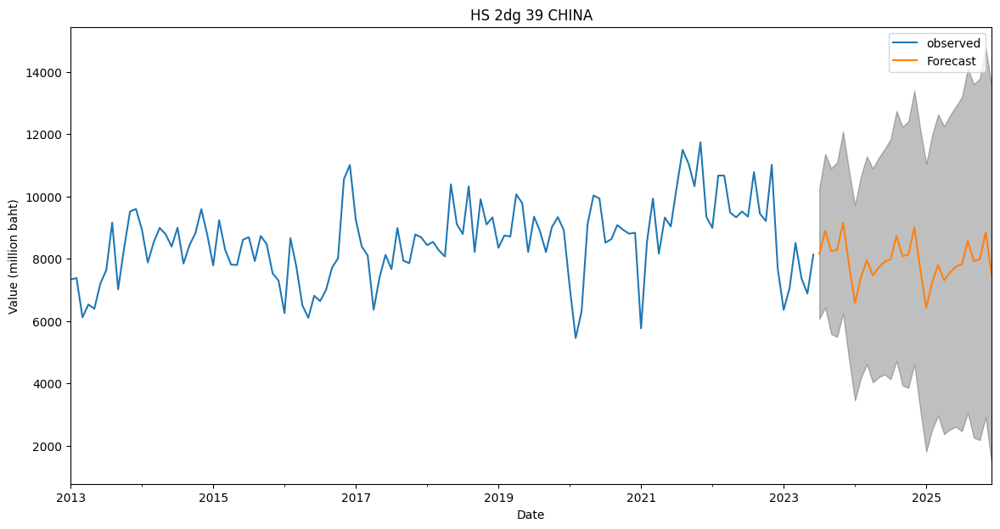

In [ ]:
pred_uc_cn39 = results_cn39.get_forecast(steps=30)
pred_ci_cn39 = pred_uc_cn39.conf_int()
ax = cn39_newcolumn['Value (million baht)'].plot(label='observed', figsize=(14, 7))
pred_uc_cn39.predicted_mean.plot(ax=ax, label='Forecast')
ax.fill_between(pred_ci_cn39.index,
                pred_ci_cn39.iloc[:, 0],
                pred_ci_cn39.iloc[:, 1], color='k', alpha=.25)
ax.set_xlabel('Date')
ax.set_ylabel('Value (million baht)')
ax.set_title('HS 2dg 39 CHINA')
plt.legend()
plt.show()

# Japan85

array([[<Axes: title={'center': 'Unnamed: 0'}>,
        <Axes: title={'center': 'HS 2dg'}>],
       [<Axes: title={'center': 'Year'}>,
        <Axes: title={'center': 'Month'}>],
       [<Axes: title={'center': 'Value (million baht)'}>, <Axes: >]],
      dtype=object)

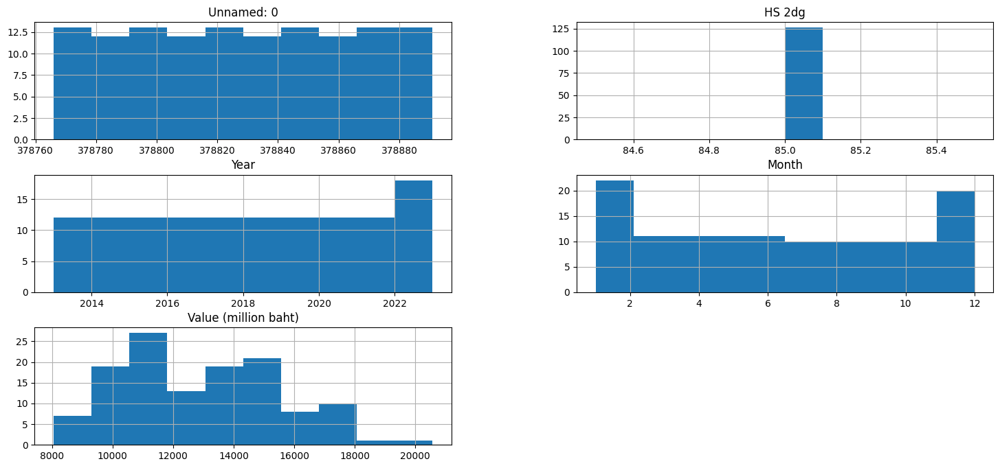

In [ ]:
jp85 = pd.read_csv('/content/resultjapan85.csv')
jp85.hist()

<Axes: >

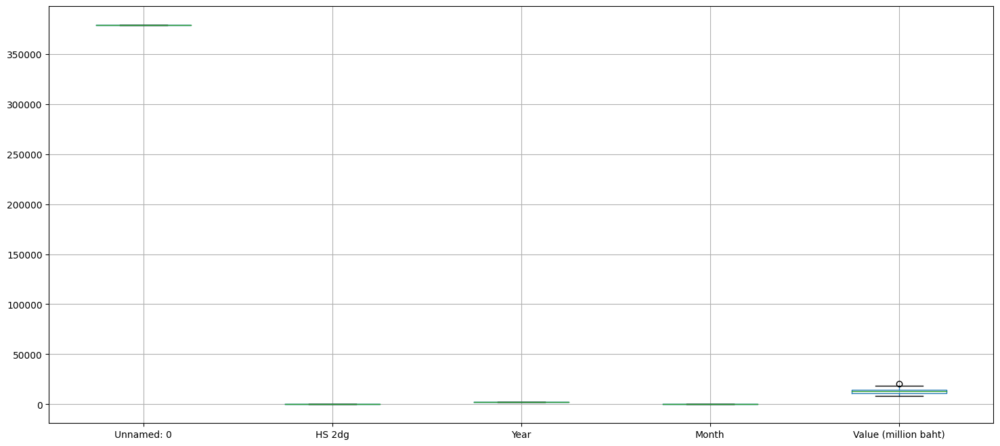

In [ ]:
jp85.boxplot()

In [ ]:
jp85.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 126 entries, 0 to 125
Data columns (total 6 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Unnamed: 0            126 non-null    int64  
 1   Country               126 non-null    object 
 2   HS 2dg                126 non-null    int64  
 3   Year                  126 non-null    int64  
 4   Month                 126 non-null    int64  
 5   Value (million baht)  126 non-null    float64
dtypes: float64(1), int64(4), object(1)
memory usage: 6.0+ KB


In [ ]:
def find_outlier(data):
  Q1 = np.percentile(data, 25)
  Q3 = np.percentile(data, 75)
  IQR = Q3 - Q1
  lower = Q1 - 1.5 * IQR
  upper = Q3 + 1.5 * IQR
  outlier = data[(data < lower) | (data > upper) ]
  return outlier

outlier_jp85 = find_outlier(jp85['Value (million baht)'])
print("Outlier in Value:")
print(outlier_jp85)
# print("Lower:",lower, "Upper: ",upper)
# จำนวน rows ที่มี outlier
outlier_count_jp85 = len(outlier_jp85)

# จำนวน rows ทั้งหมด
total_rows_jp85 = len(jp85)

# คำนวณเปอร์เซ็นต์ของ rows ที่มี outlier
percentage_outlier_jp85 = (outlier_count_jp85 / total_rows_jp85) * 100

print(f"เปอร์เซ็นต์ของ rows ที่มี outlier: {percentage_outlier_jp85:.2f}%")

Outlier in Value:
58    20573.794424
Name: Value (million baht), dtype: float64
เปอร์เซ็นต์ของ rows ที่มี outlier: 0.79%


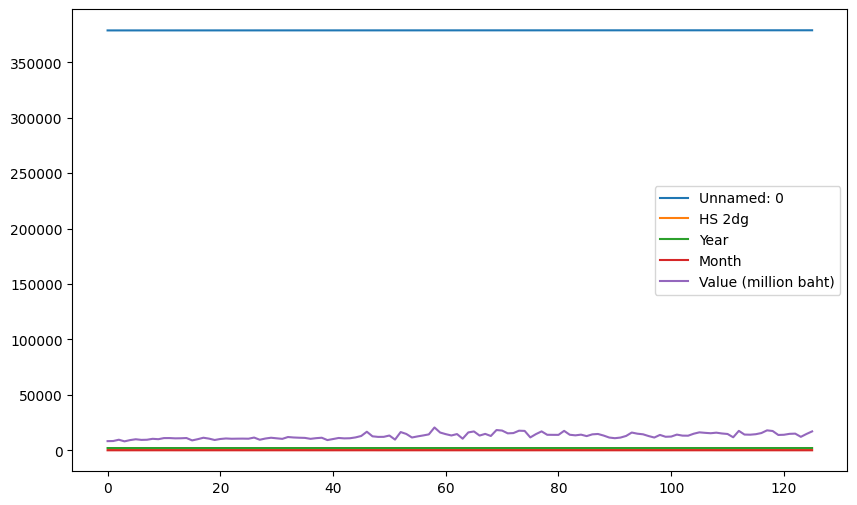

In [ ]:
jp85.plot(figsize=(10, 6))
plt.show()

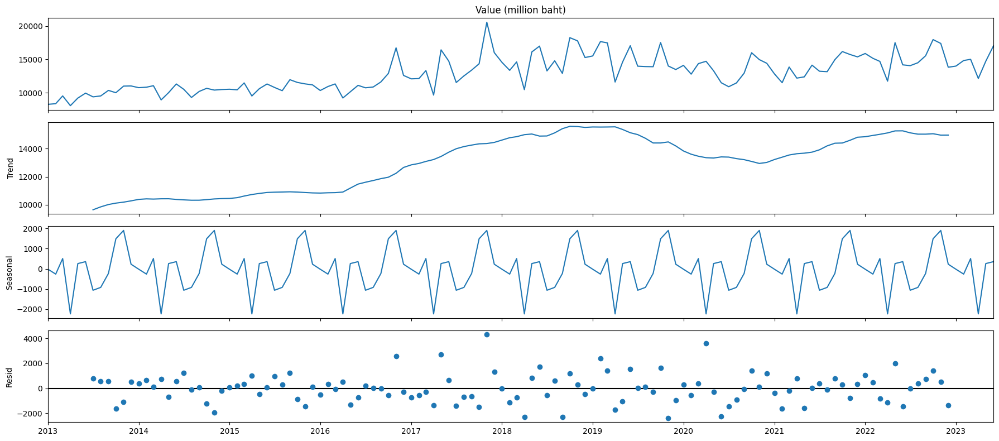

In [ ]:
# แปลงคอลัมน์ 'Month' เป็นข้อความ
jp85['Month'] = jp85['Month'].astype(str)

# แปลงคอลัมน์ 'Year' เป็นข้อความ
jp85['Year'] = jp85['Year'].astype(str)

# แปลงคอลัมน์ 'Month Year' เป็นรูปแบบ '01-2020'
jp85['Month Year'] = jp85['Month'].str.zfill(2) + '-' + jp85['Year']

# แปลงคอลัมน์ 'Month Year' เป็น DatetimeIndex และระบุความถี่เป็นรายเดือน ('M')
jp85_datetime= jp85.set_index(pd.to_datetime(jp85['Month Year'], format='%m-%Y', errors='coerce'))

rcParams['figure.figsize'] = (18, 8)  # กำหนดขนาดกราฟใหญ่ขึ้น
decomposition = sm.tsa.seasonal_decompose(jp85_datetime['Value (million baht)'], model='additive', period=12)
fig = decomposition.plot()
plt.show()

## Check stationary test

In [ ]:
#Integrated (d)
from statsmodels.tsa.stattools import adfuller
def adf_test(timeseries):
    print ('Results of Dickey-Fuller Test:')
    dftest = adfuller(timeseries, autolag='AIC')
    dfoutput = pd.Series(dftest[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
    for key,value in dftest[4].items():
        dfoutput['Critical Value (%s)'%key] = value
    print (dfoutput)
# Call the function and run the test

adf_test(jp85['Value (million baht)'])

Results of Dickey-Fuller Test:
Test Statistic                  -1.222230
p-value                          0.663961
#Lags Used                      12.000000
Number of Observations Used    113.000000
Critical Value (1%)             -3.489590
Critical Value (5%)             -2.887477
Critical Value (10%)            -2.580604
dtype: float64


In [ ]:
jp85_new = jp85_datetime.copy()
jp85_new

,Unnamed: 0,Country,HS 2dg,Year,Month,Value (million baht),Month Year
Month Year,,,,,,,
2013-01-01,378766,JAPAN,85,2013,1,8254.000374,01-2013
2013-02-01,378767,JAPAN,85,2013,2,8353.708309,02-2013
2013-03-01,378768,JAPAN,85,2013,3,9518.647931,03-2013
2013-04-01,378769,JAPAN,85,2013,4,8054.713148,04-2013
2013-05-01,378770,JAPAN,85,2013,5,9195.246393,05-2013
...,...,...,...,...,...,...,...
2023-02-01,378887,JAPAN,85,2023,2,14828.718614,02-2023
2023-03-01,378888,JAPAN,85,2023,3,15008.859833,03-2023
2023-04-01,378889,JAPAN,85,2023,4,12134.053695,04-2023


## Differencing

p-Values:0.014888252975754026


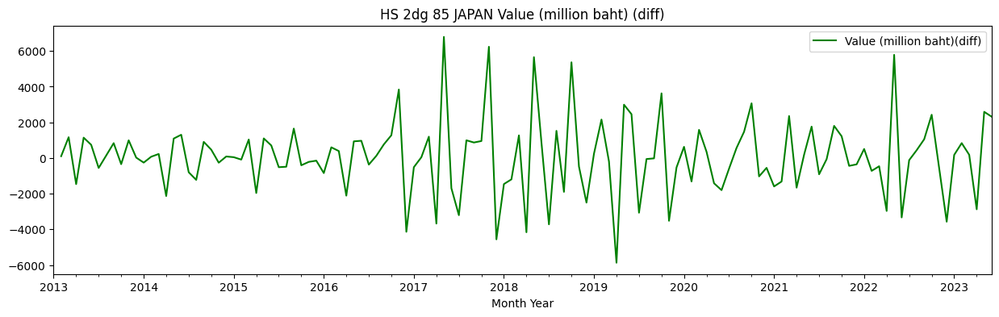

In [ ]:
#First difference
jp85_new['Value (million baht)_diff'] = jp85_new['Value (million baht)'].diff()
jp85_new['Value (million baht)_diff'].plot(color = 'green', figsize = (15,4))
plt.legend(['Value (million baht)(diff)'])
plt.title('HS 2dg 85 JAPAN Value (million baht) (diff)')

jp85_new_adf = adfuller(jp85_new['Value (million baht)_diff'].dropna(), autolag = 'AIC')
print('p-Values:' + str(jp85_new_adf[1]))

## Model 1 & LOOCV

In [ ]:
column = ['Value (million baht)_diff','Value (million baht)']
jp85_newcolumn = jp85_new[column]
jp85_newcolumn

,Value (million baht)_diff,Value (million baht)
Month Year,,
2013-01-01,NaN,8254.000374
2013-02-01,99.707935,8353.708309
2013-03-01,1164.939622,9518.647931
2013-04-01,-1463.934783,8054.713148
2013-05-01,1140.533245,9195.246393
...,...,...
2023-02-01,833.892873,14828.718614
2023-03-01,180.141219,15008.859833
2023-04-01,-2874.806138,12134.053695


In [ ]:
# แบ่งข้อมูลออกเป็น 125 rows สำหรับ training และ 1 rows สำหรับ testing
jp85_newcolumn_train = jp85_newcolumn.iloc[:125]
jp85_newcolumn_test = jp85_newcolumn.iloc[125:]

# กำหนดช่วงของลำดับ
p_range = range(0, 2)
d_range = range(0, 2)
q_range = range(0, 2)

# กำหนดช่วงของลำดับฤดูกาล
P_range = range(0, 2)
D_range = range(0, 2)
Q_range = range(0, 2)

# สร้างพจนานุกรมสำหรับเก็บค่าพารามิเตอร์
param_grid = dict(
    p=p_range,
    d=d_range,
    q=q_range,
    P=P_range,
    D=D_range,
    Q=Q_range,
)

# เลือกโมเดลที่ดีที่สุดโดยใช้ AIC
best_model_jp85 = None
best_aic_jp85 = float("inf")

for p in param_grid['p']:
    for d in param_grid['d']:
        for q in param_grid['q']:
            for P in param_grid['P']:
                for D in param_grid['D']:
                    for Q in param_grid['Q']:
                        order = (p, d, q)
                        seasonal_order = (P, D, Q, 12)

                        # สร้างโมเดล SARIMA
                        sarima_model_jp85_newcolumn = SARIMAX(jp85_newcolumn_train['Value (million baht)_diff'], order=order, seasonal_order=seasonal_order, enforce_stationarity=False)

                        # ฝึกโมเดล
                        sarima_fit_jp85_newcolumn = sarima_model_jp85_newcolumn.fit()

                        # คำนวณ AIC
                        aic = sarima_fit_jp85_newcolumn.aic

                        # บันทึกโมเดลที่มี AIC ต่ำสุด
                        if aic < best_aic_jp85:
                            best_model_jp85 = sarima_fit_jp85_newcolumn
                            best_aic_jp85 = aic
                            best_param_jp85 = (p, d, q, P, D, Q)

# แสดงค่าพารามิเตอร์ที่ดีที่สุด
print("Best Parameters:", best_param_jp85)
print("Best AIC:", best_aic_jp85)

Best Parameters: (0, 0, 1, 1, 1, 1)
Best AIC: 1745.2994178503704


In [ ]:
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error

# ทำนายค่าสำหรับชุดข้อมูลทดสอบ
y_pred_jp85 = best_model_jp85.predict(start=jp85_newcolumn_test.index[0], end=jp85_newcolumn_test.index[-1])

# คำนวณ MAE และ RMSE และ MSE
mae_jp85 = mean_absolute_error(jp85_newcolumn_test['Value (million baht)_diff'], y_pred_jp85)
rmse_jp85 = mean_squared_error(jp85_newcolumn_test['Value (million baht)_diff'], y_pred_jp85) ** 0.5
mse_jp85 = rmse_jp85 ** 2

# แสดงค่า MAE และ RMSE
print("MAE:", mae_jp85)
print("RMSE:", rmse_jp85)
print("MSE:", mse_jp85)

MAE: 2317.9876908744036
RMSE: 2317.9876908744036
MSE: 5373066.93504525


In [ ]:
p = d = q = range(0, 2)
pdq = list(itertools.product(p, d, q))
seasonal_pdq = [(x[0], x[1], x[2], 12) for x in list(itertools.product(p, d, q))]
print('Examples of parameter combinations for Seasonal ARIMA...')
print('SARIMAX: {} x {}'.format(pdq[1], seasonal_pdq[1]))
print('SARIMAX: {} x {}'.format(pdq[1], seasonal_pdq[2]))
print('SARIMAX: {} x {}'.format(pdq[2], seasonal_pdq[3]))
print('SARIMAX: {} x {}'.format(pdq[2], seasonal_pdq[4]))

Examples of parameter combinations for Seasonal ARIMA...
SARIMAX: (0, 0, 1) x (0, 0, 1, 12)
SARIMAX: (0, 0, 1) x (0, 1, 0, 12)
SARIMAX: (0, 1, 0) x (0, 1, 1, 12)
SARIMAX: (0, 1, 0) x (1, 0, 0, 12)


In [ ]:
for param in pdq:
    for param_seasonal in seasonal_pdq:
        try:
            mod = sm.tsa.statespace.SARIMAX(jp85_newcolumn_train['Value (million baht)_diff'],
                                            order=param,
                                            seasonal_order=param_seasonal,
                                            enforce_stationarity=False,
                                            enforce_invertibility=False)
            results = mod.fit()
            print('ARIMA{}x{}12 - AIC:{}'.format(param, param_seasonal, results.aic))
        except Exception as e:
            print(e)
            continue

ARIMA(0, 0, 0)x(0, 0, 0, 12)12 - AIC:2249.910650194408
ARIMA(0, 0, 0)x(0, 0, 1, 12)12 - AIC:2014.1044918218438
ARIMA(0, 0, 0)x(0, 1, 0, 12)12 - AIC:2030.1603362244557
ARIMA(0, 0, 0)x(0, 1, 1, 12)12 - AIC:1802.420423648527
ARIMA(0, 0, 0)x(1, 0, 0, 12)12 - AIC:2023.5634588114076
ARIMA(0, 0, 0)x(1, 0, 1, 12)12 - AIC:2008.574311436289
ARIMA(0, 0, 0)x(1, 1, 0, 12)12 - AIC:1836.5959801374643
ARIMA(0, 0, 0)x(1, 1, 1, 12)12 - AIC:1797.192297580675
ARIMA(0, 0, 1)x(0, 0, 0, 12)12 - AIC:2191.4346086295714
ARIMA(0, 0, 1)x(0, 0, 1, 12)12 - AIC:1964.3780688520685
ARIMA(0, 0, 1)x(0, 1, 0, 12)12 - AIC:1980.358293235954
ARIMA(0, 0, 1)x(0, 1, 1, 12)12 - AIC:1747.8212596298592
ARIMA(0, 0, 1)x(1, 0, 0, 12)12 - AIC:1987.864097955117
ARIMA(0, 0, 1)x(1, 0, 1, 12)12 - AIC:1961.2941115751137
ARIMA(0, 0, 1)x(1, 1, 0, 12)12 - AIC:1803.3692891216997
ARIMA(0, 0, 1)x(1, 1, 1, 12)12 - AIC:1745.2529291900225
ARIMA(0, 1, 0)x(0, 0, 0, 12)12 - AIC:2354.2810803497455
ARIMA(0, 1, 0)x(0, 0, 1, 12)12 - AIC:2113.771685655376

In [ ]:
mod_jp85 = sm.tsa.statespace.SARIMAX(jp85_newcolumn['Value (million baht)'],
                                order=(0, 1, 1),
                                seasonal_order=(1, 1, 1, 12),
                                enforce_invertibility=False)
results_jp85 = mod_jp85.fit()
print(results_jp85.summary().tables[1])

                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.6503      0.075     -8.676      0.000      -0.797      -0.503
ar.S.L12       0.2883      0.081      3.547      0.000       0.129       0.448
ma.S.L12      -1.0000      0.107     -9.310      0.000      -1.211      -0.790
sigma2      2.097e+06   5.12e-08   4.09e+13      0.000     2.1e+06     2.1e+06


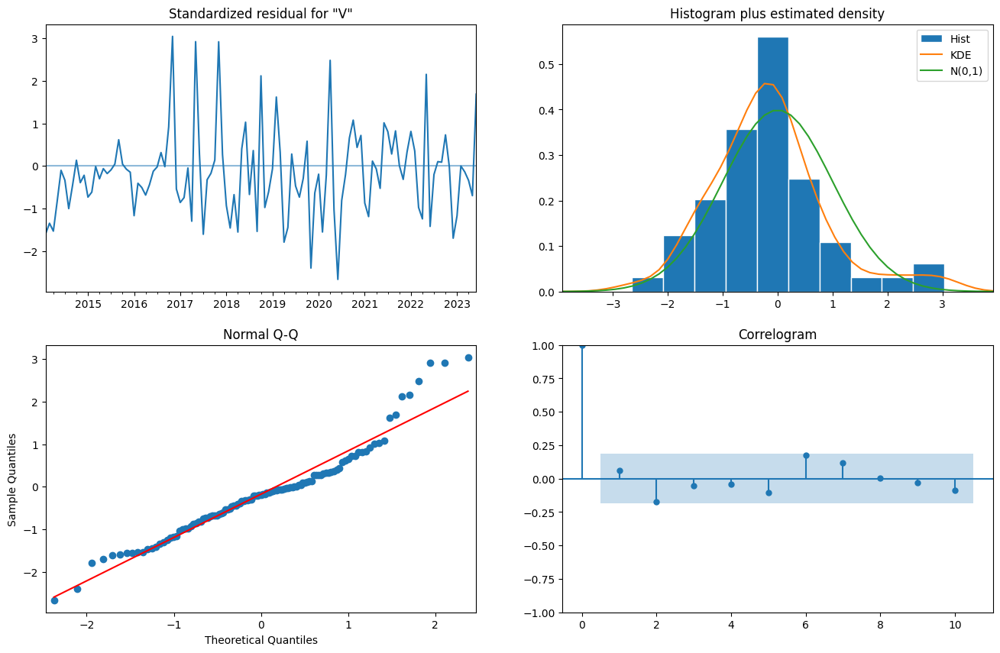

In [ ]:
results_jp85.plot_diagnostics(figsize=(16, 10))
plt.show()

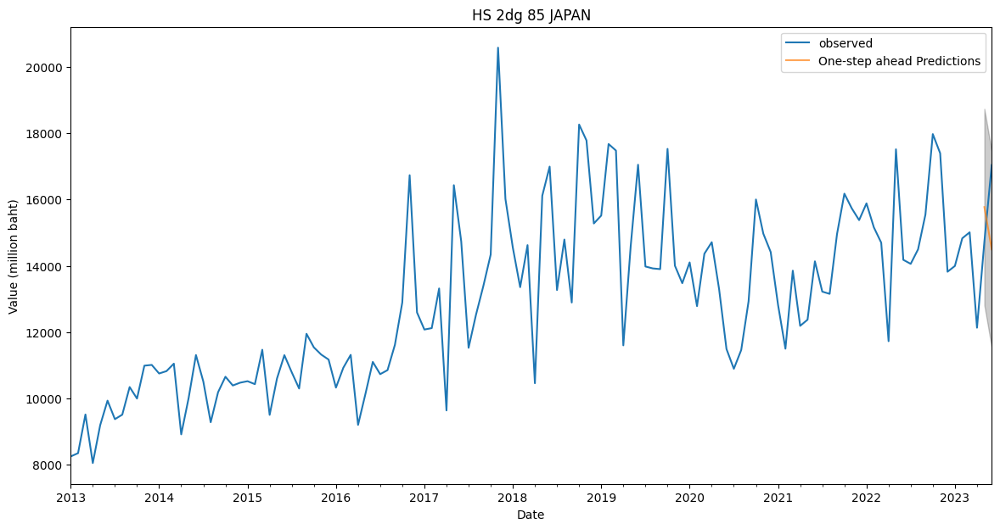

In [ ]:
pred_jp85 = results_jp85.get_prediction(start=pd.to_datetime('2023-05-01'), dynamic=False)
pred_ci_jp85 = pred_jp85.conf_int()
ax = jp85_newcolumn['Value (million baht)']['2013':].plot(label='observed')
pred_jp85.predicted_mean.plot(ax=ax, label='One-step ahead Predictions', alpha=.7, figsize=(14, 7))
ax.fill_between(pred_ci_jp85.index,
                pred_ci_jp85.iloc[:, 0],
                pred_ci_jp85.iloc[:, 1], color='k', alpha=.2)
ax.set_xlabel('Date')
ax.set_ylabel('Value (million baht)')
ax.set_title('HS 2dg 85 JAPAN')
plt.legend()
plt.show()

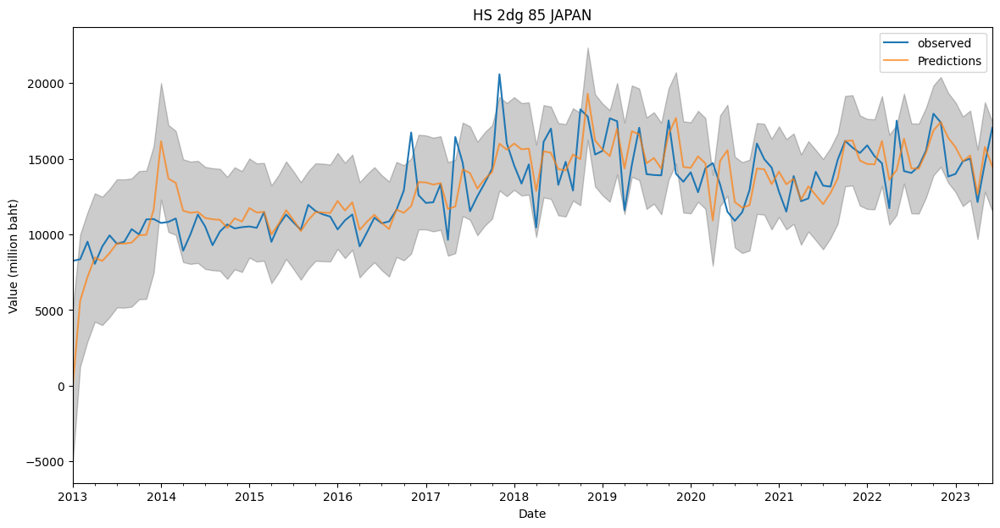

In [ ]:
pred_jp85_total = results_jp85.get_prediction(start=pd.to_datetime('2013-01-01'), dynamic=False)
pred_ci_jp85 = pred_jp85_total.conf_int()
ax = jp85_newcolumn['Value (million baht)']['2013':].plot(label='observed')
pred_jp85_total.predicted_mean.plot(ax=ax, label='Predictions', alpha=.7, figsize=(14, 7))
ax.fill_between(pred_ci_jp85.index,
                pred_ci_jp85.iloc[:, 0],
                pred_ci_jp85.iloc[:, 1], color='k', alpha=.2)
ax.set_xlabel('Date')
ax.set_ylabel('Value (million baht)')
ax.set_title('HS 2dg 85 JAPAN')
plt.legend()
plt.show()

In [ ]:
forecasted_jp85 = pred_jp85.predicted_mean
mse_jp85 = ((forecasted_jp85 - jp85_newcolumn_test['Value (million baht)']) ** 2).mean()
# forecasted_g3 = forecasted_us**(1/2)
mape_jp85 = (np.abs(jp85_newcolumn_test['Value (million baht)'] - forecasted_jp85) / np.abs(jp85_newcolumn_test['Value (million baht)'])).mean() * 100
print('The Mean Squared Error of forecasts is {}'.format(round(mse_jp85, 2)))
print('The Root Mean Squared Error of forecasts is {}'.format(round(np.sqrt(mse_jp85), 2)))
print('Mean Absolute Percentage Error (MAPE): {:.2f}%'.format(mape_jp85))

The Mean Squared Error of forecasts is 6459045.65
The Root Mean Squared Error of forecasts is 2541.47
Mean Absolute Percentage Error (MAPE): 14.92%


### Forecast

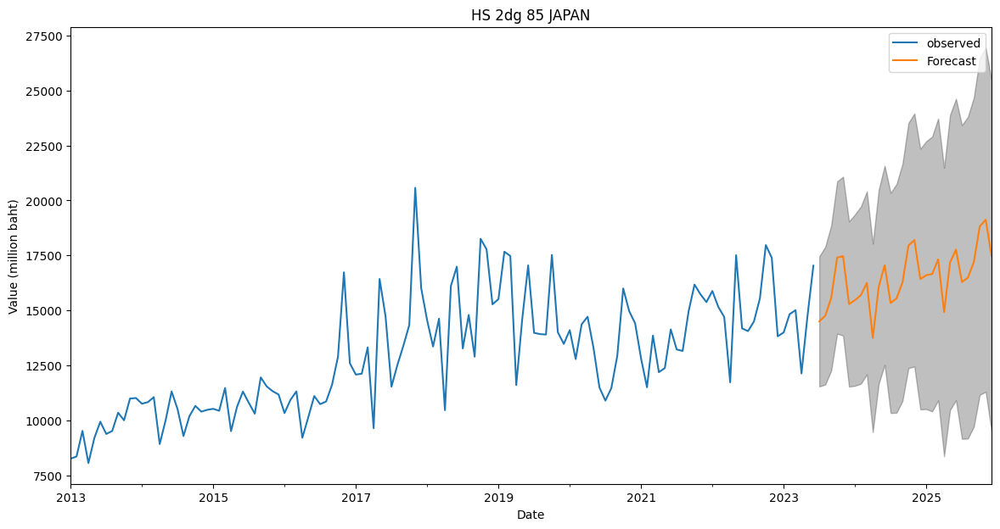

In [ ]:
pred_uc_jp85 = results_jp85.get_forecast(steps=30)
pred_ci_jp85 = pred_uc_jp85.conf_int()
ax = jp85_newcolumn['Value (million baht)'].plot(label='observed', figsize=(14, 7))
pred_uc_jp85.predicted_mean.plot(ax=ax, label='Forecast')
ax.fill_between(pred_ci_jp85.index,
                pred_ci_jp85.iloc[:, 0],
                pred_ci_jp85.iloc[:, 1], color='k', alpha=.25)
ax.set_xlabel('Date')
ax.set_ylabel('Value (million baht)')
ax.set_title('HS 2dg 85 JAPAN')
plt.legend()
plt.show()

# Japan84

array([[<Axes: title={'center': 'Unnamed: 0'}>,
        <Axes: title={'center': 'HS 2dg'}>],
       [<Axes: title={'center': 'Year'}>,
        <Axes: title={'center': 'Month'}>],
       [<Axes: title={'center': 'Value (million baht)'}>, <Axes: >]],
      dtype=object)

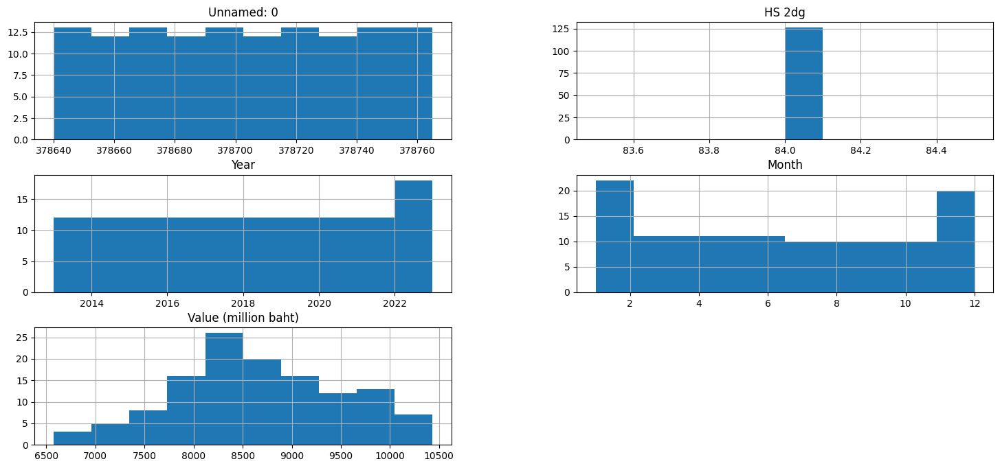

In [ ]:
jp84 = pd.read_csv('/content/resultjapan84.csv')
jp84.hist()

<Axes: >

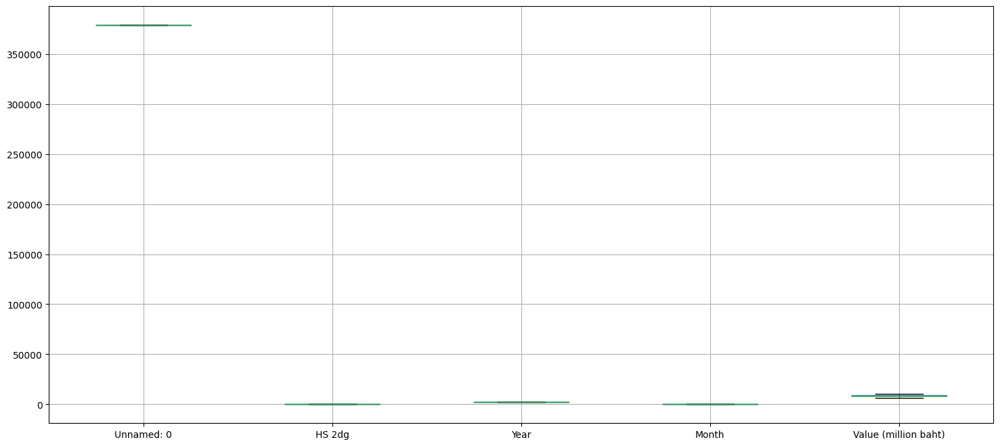

In [ ]:
jp84.boxplot()

In [ ]:
jp84.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 126 entries, 0 to 125
Data columns (total 6 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Unnamed: 0            126 non-null    int64  
 1   Country               126 non-null    object 
 2   HS 2dg                126 non-null    int64  
 3   Year                  126 non-null    int64  
 4   Month                 126 non-null    int64  
 5   Value (million baht)  126 non-null    float64
dtypes: float64(1), int64(4), object(1)
memory usage: 6.0+ KB


In [ ]:
def find_outlier(data):
  Q1 = np.percentile(data, 25)
  Q3 = np.percentile(data, 75)
  IQR = Q3 - Q1
  lower = Q1 - 1.5 * IQR
  upper = Q3 + 1.5 * IQR
  outlier = data[(data < lower) | (data > upper) ]
  return outlier

outlier_jp84 = find_outlier(jp84['Value (million baht)'])
print("Outlier in Value:")
print(outlier_jp84)
# print("Lower:",lower, "Upper: ",upper)
# จำนวน rows ที่มี outlier
outlier_count_jp84 = len(outlier_jp84)

# จำนวน rows ทั้งหมด
total_rows_jp84 = len(jp84)

# คำนวณเปอร์เซ็นต์ของ rows ที่มี outlier
percentage_outlier_jp84 = (outlier_count_jp84 / total_rows_jp84) * 100

print(f"เปอร์เซ็นต์ของ rows ที่มี outlier: {percentage_outlier_jp84:.2f}%")

Outlier in Value:
Series([], Name: Value (million baht), dtype: float64)
เปอร์เซ็นต์ของ rows ที่มี outlier: 0.00%


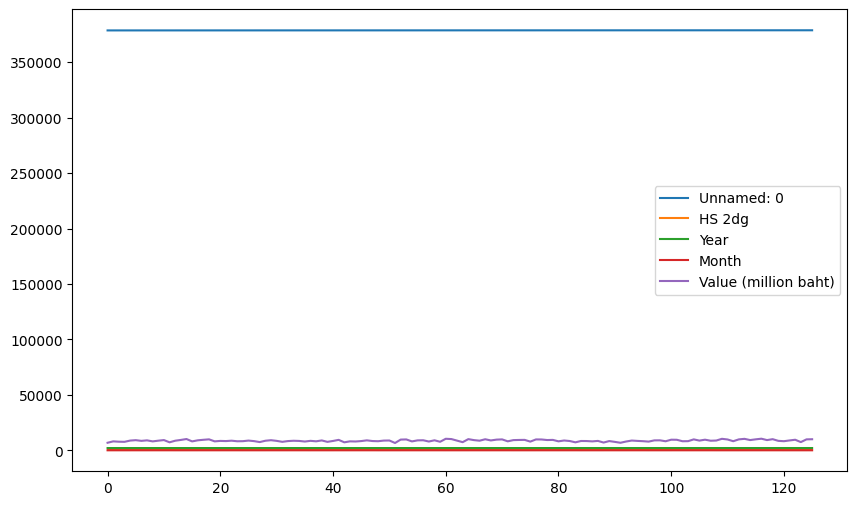

In [ ]:
jp84.plot(figsize=(10, 6))
plt.show()

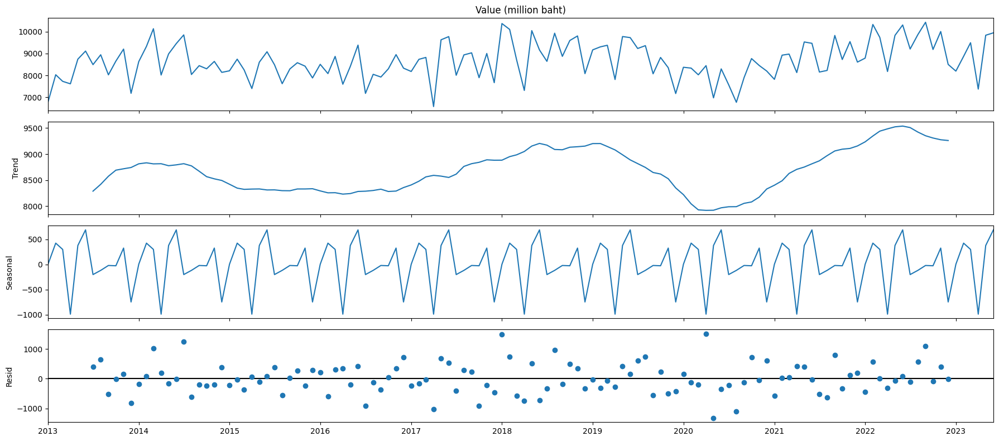

In [ ]:
# แปลงคอลัมน์ 'Month' เป็นข้อความ
jp84['Month'] = jp84['Month'].astype(str)

# แปลงคอลัมน์ 'Year' เป็นข้อความ
jp84['Year'] = jp84['Year'].astype(str)

# แปลงคอลัมน์ 'Month Year' เป็นรูปแบบ '01-2020'
jp84['Month Year'] = jp84['Month'].str.zfill(2) + '-' + jp84['Year']

# แปลงคอลัมน์ 'Month Year' เป็น DatetimeIndex และระบุความถี่เป็นรายเดือน ('M')
jp84_datetime= jp84.set_index(pd.to_datetime(jp84['Month Year'], format='%m-%Y', errors='coerce'))

rcParams['figure.figsize'] = (18, 8)  # กำหนดขนาดกราฟใหญ่ขึ้น
decomposition = sm.tsa.seasonal_decompose(jp84_datetime['Value (million baht)'], model='additive', period=12)
fig = decomposition.plot()
plt.show()

## Check stationary test

In [ ]:
#Integrated (d)
from statsmodels.tsa.stattools import adfuller
def adf_test(timeseries):
    print ('Results of Dickey-Fuller Test:')
    dftest = adfuller(timeseries, autolag='AIC')
    dfoutput = pd.Series(dftest[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
    for key,value in dftest[4].items():
        dfoutput['Critical Value (%s)'%key] = value
    print (dfoutput)
# Call the function and run the test

adf_test(jp84['Value (million baht)'])

Results of Dickey-Fuller Test:
Test Statistic                  -3.151345
p-value                          0.022980
#Lags Used                      13.000000
Number of Observations Used    112.000000
Critical Value (1%)             -3.490131
Critical Value (5%)             -2.887712
Critical Value (10%)            -2.580730
dtype: float64


In [ ]:
jp84_new = jp84_datetime.copy()
jp84_new

,Unnamed: 0,Country,HS 2dg,Year,Month,Value (million baht),Month Year
Month Year,,,,,,,
2013-01-01,378640,JAPAN,84,2013,1,6780.896154,01-2013
2013-02-01,378641,JAPAN,84,2013,2,8031.001790,02-2013
2013-03-01,378642,JAPAN,84,2013,3,7729.333981,03-2013
2013-04-01,378643,JAPAN,84,2013,4,7615.614284,04-2013
2013-05-01,378644,JAPAN,84,2013,5,8744.650438,05-2013
...,...,...,...,...,...,...,...
2023-02-01,378761,JAPAN,84,2023,2,8872.283349,02-2023
2023-03-01,378762,JAPAN,84,2023,3,9497.859650,03-2023
2023-04-01,378763,JAPAN,84,2023,4,7374.967856,04-2023


## No Differencing

In [ ]:
# #First difference
# jp85_new['Value (million baht)_diff'] = jp85_new['Value (million baht)'].diff()
# jp85_new['Value (million baht)_diff'].plot(color = 'green', figsize = (15,4))
# plt.legend(['Value (million baht)(diff)'])
# plt.title('HS 2dg 85 JAPAN Value (million baht) (diff)')

# jp85_new_adf = adfuller(jp85_new['Value (million baht)_diff'].dropna(), autolag = 'AIC')
# print('p-Values:' + str(jp85_new_adf[1]))

## Model 1 & LOOCV

In [ ]:
column = ['Value (million baht)']
jp84_newcolumn = jp84_new[column]
jp84_newcolumn

,Value (million baht)
Month Year,
2013-01-01,6780.896154
2013-02-01,8031.001790
2013-03-01,7729.333981
2013-04-01,7615.614284
2013-05-01,8744.650438
...,...
2023-02-01,8872.283349
2023-03-01,9497.859650
2023-04-01,7374.967856


In [ ]:
# แบ่งข้อมูลออกเป็น 125 rows สำหรับ training และ 1 rows สำหรับ testing
jp84_newcolumn_train = jp84_newcolumn.iloc[:125]
jp84_newcolumn_test = jp84_newcolumn.iloc[125:]

# กำหนดช่วงของลำดับ
p_range = range(0, 2)
d_range = range(0, 2)
q_range = range(0, 2)

# กำหนดช่วงของลำดับฤดูกาล
P_range = range(0, 2)
D_range = range(0, 2)
Q_range = range(0, 2)

# สร้างพจนานุกรมสำหรับเก็บค่าพารามิเตอร์
param_grid = dict(
    p=p_range,
    d=d_range,
    q=q_range,
    P=P_range,
    D=D_range,
    Q=Q_range,
)

# เลือกโมเดลที่ดีที่สุดโดยใช้ AIC
best_model_jp84 = None
best_aic_jp84 = float("inf")

for p in param_grid['p']:
    for d in param_grid['d']:
        for q in param_grid['q']:
            for P in param_grid['P']:
                for D in param_grid['D']:
                    for Q in param_grid['Q']:
                        order = (p, d, q)
                        seasonal_order = (P, D, Q, 12)

                        # สร้างโมเดล SARIMA
                        sarima_model_jp84_newcolumn = SARIMAX(jp84_newcolumn_train['Value (million baht)'], order=order, seasonal_order=seasonal_order, enforce_stationarity=False)

                        # ฝึกโมเดล
                        sarima_fit_jp84_newcolumn = sarima_model_jp84_newcolumn.fit()

                        # คำนวณ AIC
                        aic = sarima_fit_jp84_newcolumn.aic

                        # บันทึกโมเดลที่มี AIC ต่ำสุด
                        if aic < best_aic_jp84:
                            best_model_jp84 = sarima_fit_jp84_newcolumn
                            best_aic_jp84 = aic
                            best_param_jp84 = (p, d, q, P, D, Q)

# แสดงค่าพารามิเตอร์ที่ดีที่สุด
print("Best Parameters:", best_param_jp84)
print("Best AIC:", best_aic_jp84)

Best Parameters: (0, 1, 1, 1, 1, 1)
Best AIC: 1570.5737874479896


In [ ]:
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error

# ทำนายค่าสำหรับชุดข้อมูลทดสอบ
y_pred_jp84 = best_model_jp84.predict(start=jp84_newcolumn_test.index[0], end=jp84_newcolumn_test.index[-1])

# คำนวณ MAE และ RMSE และ MSE
mae_jp84 = mean_absolute_error(jp84_newcolumn_test['Value (million baht)'], y_pred_jp84)
rmse_jp84 = mean_squared_error(jp84_newcolumn_test['Value (million baht)'], y_pred_jp84) ** 0.5
mse_jp84 = rmse_jp84 ** 2

# แสดงค่า MAE และ RMSE
print("MAE:", mae_jp84)
print("RMSE:", rmse_jp84)
print("MSE:", mse_jp84)

MAE: 160.75667496532515
RMSE: 160.75667496532515
MSE: 25842.708545907197


In [ ]:
p = d = q = range(0, 2)
pdq = list(itertools.product(p, d, q))
seasonal_pdq = [(x[0], x[1], x[2], 12) for x in list(itertools.product(p, d, q))]
print('Examples of parameter combinations for Seasonal ARIMA...')
print('SARIMAX: {} x {}'.format(pdq[1], seasonal_pdq[1]))
print('SARIMAX: {} x {}'.format(pdq[1], seasonal_pdq[2]))
print('SARIMAX: {} x {}'.format(pdq[2], seasonal_pdq[3]))
print('SARIMAX: {} x {}'.format(pdq[2], seasonal_pdq[4]))

Examples of parameter combinations for Seasonal ARIMA...
SARIMAX: (0, 0, 1) x (0, 0, 1, 12)
SARIMAX: (0, 0, 1) x (0, 1, 0, 12)
SARIMAX: (0, 1, 0) x (0, 1, 1, 12)
SARIMAX: (0, 1, 0) x (1, 0, 0, 12)


In [ ]:
for param in pdq:
    for param_seasonal in seasonal_pdq:
        try:
            mod = sm.tsa.statespace.SARIMAX(jp84_newcolumn_train['Value (million baht)'],
                                            order=param,
                                            seasonal_order=param_seasonal,
                                            enforce_stationarity=False,
                                            enforce_invertibility=False)
            results = mod.fit()
            print('ARIMA{}x{}12 - AIC:{}'.format(param, param_seasonal, results.aic))
        except Exception as e:
            print(e)
            continue

ARIMA(0, 0, 0)x(0, 0, 0, 12)12 - AIC:2604.091022010546
ARIMA(0, 0, 0)x(0, 0, 1, 12)12 - AIC:2279.970399734101
ARIMA(0, 0, 0)x(0, 1, 0, 12)12 - AIC:1858.6717381773183
ARIMA(0, 0, 0)x(0, 1, 1, 12)12 - AIC:1635.0494317690902
ARIMA(0, 0, 0)x(1, 0, 0, 12)12 - AIC:1879.4721203836425
ARIMA(0, 0, 0)x(1, 0, 1, 12)12 - AIC:1861.9835031850903
ARIMA(0, 0, 0)x(1, 1, 0, 12)12 - AIC:1667.9453663250322
ARIMA(0, 0, 0)x(1, 1, 1, 12)12 - AIC:1629.183126772639
ARIMA(0, 0, 1)x(0, 0, 0, 12)12 - AIC:2441.615758005309
ARIMA(0, 0, 1)x(0, 0, 1, 12)12 - AIC:2099.166149612103
ARIMA(0, 0, 1)x(0, 1, 0, 12)12 - AIC:1832.6837464966243
ARIMA(0, 0, 1)x(0, 1, 1, 12)12 - AIC:1613.3910823708004
ARIMA(0, 0, 1)x(1, 0, 0, 12)12 - AIC:1868.127642075899
ARIMA(0, 0, 1)x(1, 0, 1, 12)12 - AIC:1835.9568360684623
ARIMA(0, 0, 1)x(1, 1, 0, 12)12 - AIC:1658.8222604301286
ARIMA(0, 0, 1)x(1, 1, 1, 12)12 - AIC:1608.0966257037335
ARIMA(0, 1, 0)x(0, 0, 0, 12)12 - AIC:2069.597249169869
ARIMA(0, 1, 0)x(0, 0, 1, 12)12 - AIC:1849.3092880839831

In [ ]:
mod_jp84 = sm.tsa.statespace.SARIMAX(jp84_newcolumn['Value (million baht)'],
                                order=(0, 1, 1),
                                seasonal_order=(1, 1, 1, 12),
                                enforce_invertibility=False)
results_jp84 = mod_jp84.fit()
print(results_jp84.summary().tables[1])

                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.6419      0.074     -8.624      0.000      -0.788      -0.496
ar.S.L12       0.1979      0.120      1.652      0.099      -0.037       0.433
ma.S.L12      -1.0000      0.126     -7.911      0.000      -1.248      -0.752
sigma2      4.458e+05   2.84e-07   1.57e+12      0.000    4.46e+05    4.46e+05


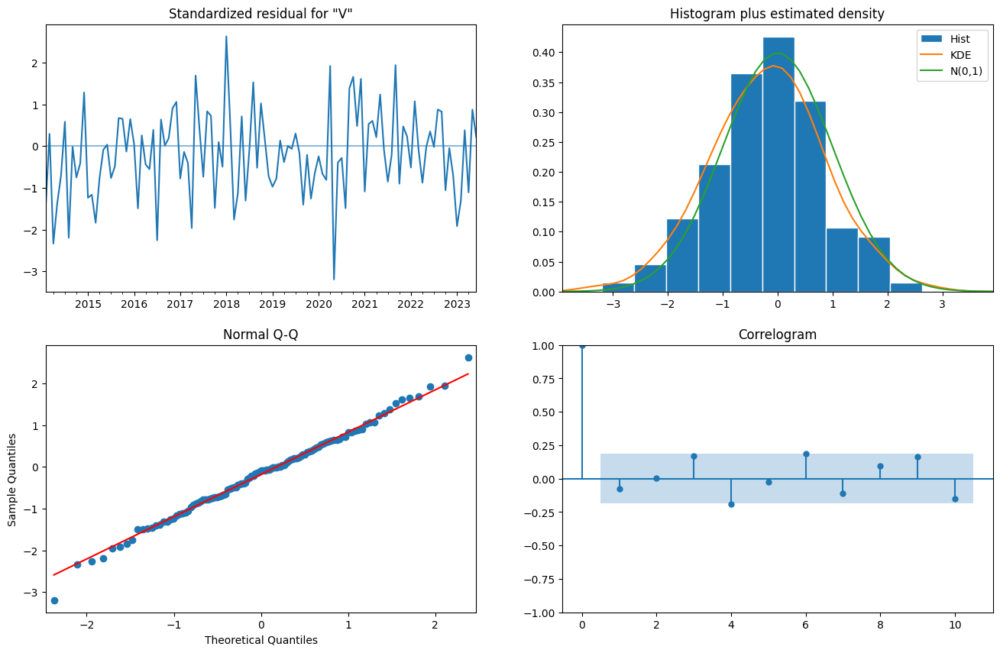

In [ ]:
results_jp84.plot_diagnostics(figsize=(16, 10))
plt.show()

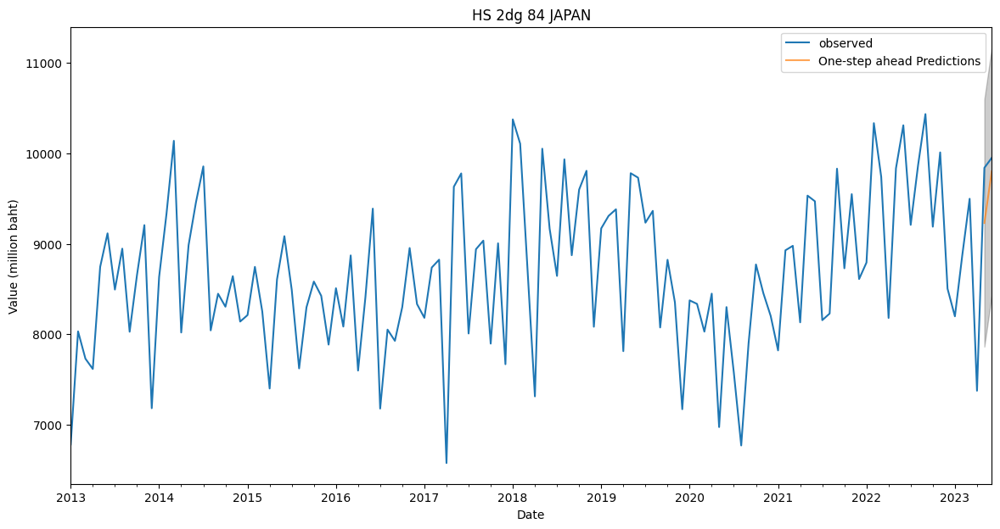

In [ ]:
pred_jp84 = results_jp84.get_prediction(start=pd.to_datetime('2023-05-01'), dynamic=False)
pred_ci_jp84 = pred_jp84.conf_int()
ax = jp84_newcolumn['Value (million baht)']['2013':].plot(label='observed')
pred_jp84.predicted_mean.plot(ax=ax, label='One-step ahead Predictions', alpha=.7, figsize=(14, 7))
ax.fill_between(pred_ci_jp84.index,
                pred_ci_jp84.iloc[:, 0],
                pred_ci_jp84.iloc[:, 1], color='k', alpha=.2)
ax.set_xlabel('Date')
ax.set_ylabel('Value (million baht)')
ax.set_title('HS 2dg 84 JAPAN')
plt.legend()
plt.show()

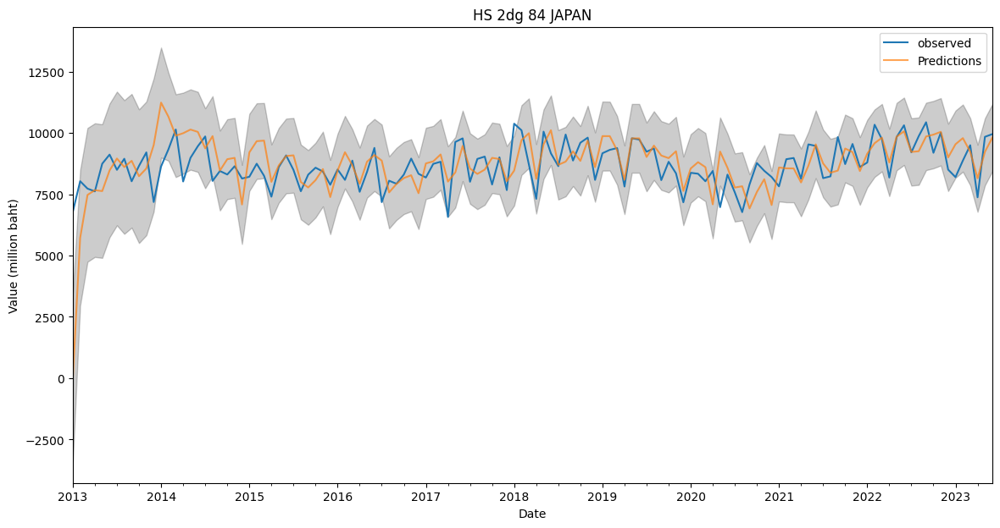

In [ ]:
pred_jp84_total = results_jp84.get_prediction(start=pd.to_datetime('2013-01-01'), dynamic=False)
pred_ci_jp84 = pred_jp84_total.conf_int()
ax = jp84_newcolumn['Value (million baht)']['2013':].plot(label='observed')
pred_jp84_total.predicted_mean.plot(ax=ax, label='Predictions', alpha=.7, figsize=(14, 7))
ax.fill_between(pred_ci_jp84.index,
                pred_ci_jp84.iloc[:, 0],
                pred_ci_jp84.iloc[:, 1], color='k', alpha=.2)
ax.set_xlabel('Date')
ax.set_ylabel('Value (million baht)')
ax.set_title('HS 2dg 84 JAPAN')
plt.legend()
plt.show()

In [ ]:
forecasted_jp84 = pred_jp84.predicted_mean
mse_jp84 = ((forecasted_jp84 - jp84_newcolumn_test['Value (million baht)']) ** 2).mean()
# forecasted_g3 = forecasted_us**(1/2)
mape_jp84 = (np.abs(jp84_newcolumn_test['Value (million baht)'] - forecasted_jp84) / np.abs(jp84_newcolumn_test['Value (million baht)'])).mean() * 100
print('The Mean Squared Error of forecasts is {}'.format(round(mse_jp84, 2)))
print('The Root Mean Squared Error of forecasts is {}'.format(round(np.sqrt(mse_jp84), 2)))
print('Mean Absolute Percentage Error (MAPE): {:.2f}%'.format(mape_jp84))

The Mean Squared Error of forecasts is 22301.47
The Root Mean Squared Error of forecasts is 149.34
Mean Absolute Percentage Error (MAPE): 1.50%


### Forecast

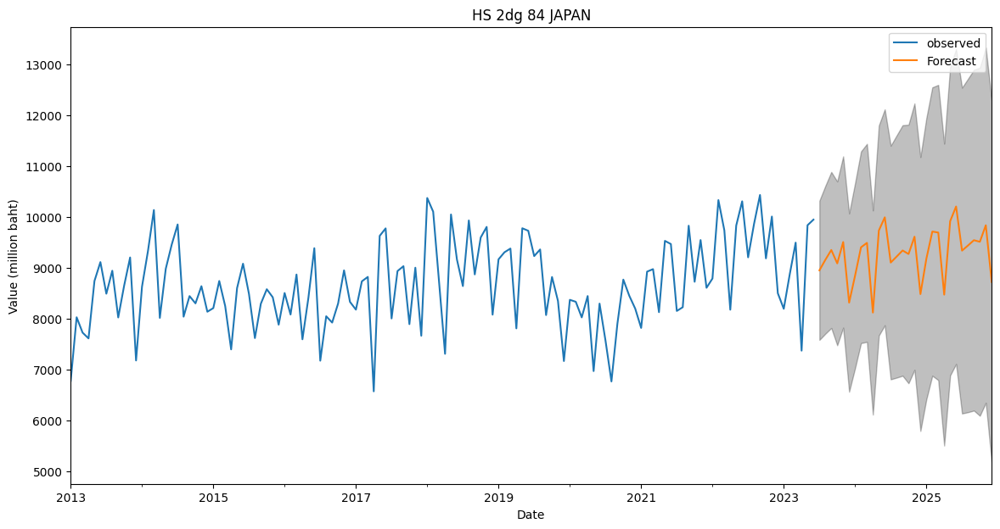

In [ ]:
pred_uc_jp84 = results_jp84.get_forecast(steps=30)
pred_ci_jp84 = pred_uc_jp84.conf_int()
ax = jp84_newcolumn['Value (million baht)'].plot(label='observed', figsize=(14, 7))
pred_uc_jp84.predicted_mean.plot(ax=ax, label='Forecast')
ax.fill_between(pred_ci_jp84.index,
                pred_ci_jp84.iloc[:, 0],
                pred_ci_jp84.iloc[:, 1], color='k', alpha=.25)
ax.set_xlabel('Date')
ax.set_ylabel('Value (million baht)')
ax.set_title('HS 2dg 84 JAPAN')
plt.legend()
plt.show()

# Japan16

array([[<Axes: title={'center': 'Unnamed: 0'}>,
        <Axes: title={'center': 'HS 2dg'}>],
       [<Axes: title={'center': 'Year'}>,
        <Axes: title={'center': 'Month'}>],
       [<Axes: title={'center': 'Value (million baht)'}>, <Axes: >]],
      dtype=object)

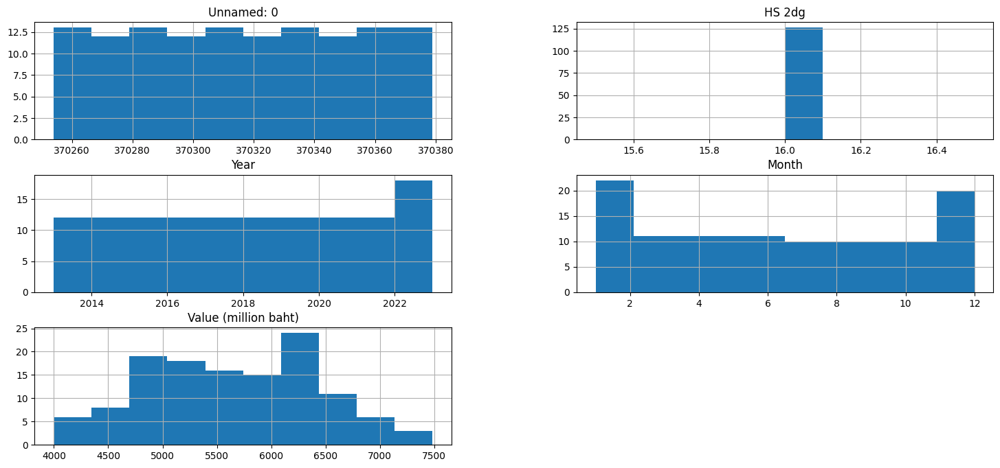

In [ ]:
jp16 = pd.read_csv('/content/resultjapan16.csv')
jp16.hist()

<Axes: >

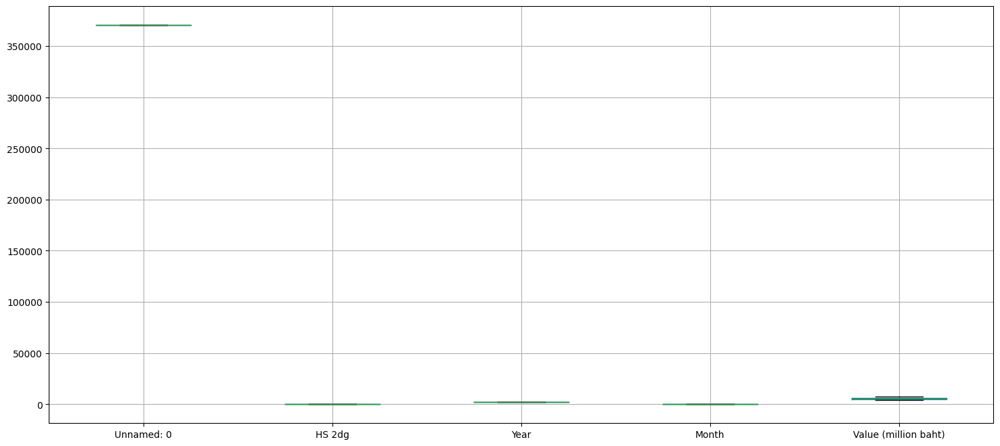

In [ ]:
jp16.boxplot()

In [ ]:
jp16.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 126 entries, 0 to 125
Data columns (total 6 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Unnamed: 0            126 non-null    int64  
 1   Country               126 non-null    object 
 2   HS 2dg                126 non-null    int64  
 3   Year                  126 non-null    int64  
 4   Month                 126 non-null    int64  
 5   Value (million baht)  126 non-null    float64
dtypes: float64(1), int64(4), object(1)
memory usage: 6.0+ KB


In [ ]:
def find_outlier(data):
  Q1 = np.percentile(data, 25)
  Q3 = np.percentile(data, 75)
  IQR = Q3 - Q1
  lower = Q1 - 1.5 * IQR
  upper = Q3 + 1.5 * IQR
  outlier = data[(data < lower) | (data > upper) ]
  return outlier

outlier_jp16 = find_outlier(jp16['Value (million baht)'])
print("Outlier in Value:")
print(outlier_jp16)
# print("Lower:",lower, "Upper: ",upper)
# จำนวน rows ที่มี outlier
outlier_count_jp16 = len(outlier_jp16)

# จำนวน rows ทั้งหมด
total_rows_jp16 = len(jp16)

# คำนวณเปอร์เซ็นต์ของ rows ที่มี outlier
percentage_outlier_jp16 = (outlier_count_jp16 / total_rows_jp16) * 100

print(f"เปอร์เซ็นต์ของ rows ที่มี outlier: {percentage_outlier_jp16:.2f}%")

Outlier in Value:
Series([], Name: Value (million baht), dtype: float64)
เปอร์เซ็นต์ของ rows ที่มี outlier: 0.00%


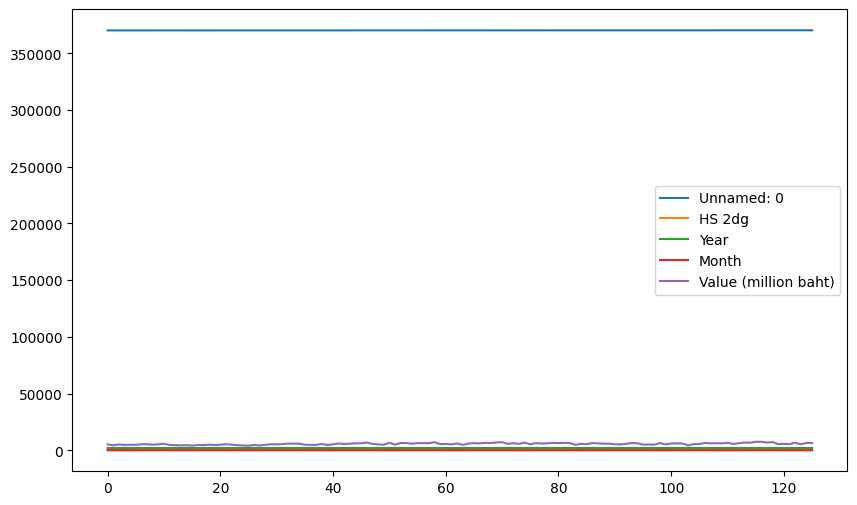

In [ ]:
jp16.plot(figsize=(10, 6))
plt.show()

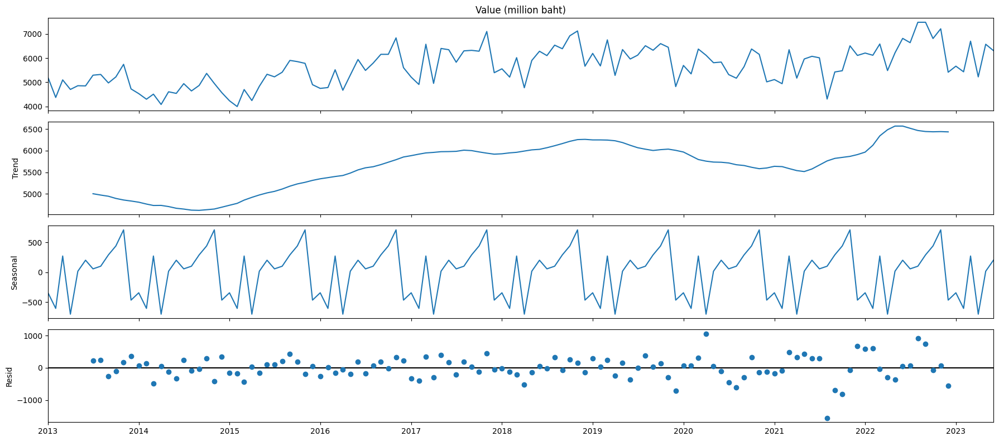

In [ ]:
# แปลงคอลัมน์ 'Month' เป็นข้อความ
jp16['Month'] = jp16['Month'].astype(str)

# แปลงคอลัมน์ 'Year' เป็นข้อความ
jp16['Year'] = jp16['Year'].astype(str)

# แปลงคอลัมน์ 'Month Year' เป็นรูปแบบ '01-2020'
jp16['Month Year'] = jp16['Month'].str.zfill(2) + '-' + jp16['Year']

# แปลงคอลัมน์ 'Month Year' เป็น DatetimeIndex และระบุความถี่เป็นรายเดือน ('M')
jp16_datetime= jp16.set_index(pd.to_datetime(jp16['Month Year'], format='%m-%Y', errors='coerce'))

rcParams['figure.figsize'] = (18, 8)  # กำหนดขนาดกราฟใหญ่ขึ้น
decomposition = sm.tsa.seasonal_decompose(jp16_datetime['Value (million baht)'], model='additive', period=12)
fig = decomposition.plot()
plt.show()

## Check stationary test

In [ ]:
#Integrated (d)
from statsmodels.tsa.stattools import adfuller
def adf_test(timeseries):
    print ('Results of Dickey-Fuller Test:')
    dftest = adfuller(timeseries, autolag='AIC')
    dfoutput = pd.Series(dftest[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
    for key,value in dftest[4].items():
        dfoutput['Critical Value (%s)'%key] = value
    print (dfoutput)
# Call the function and run the test

adf_test(jp16['Value (million baht)'])

Results of Dickey-Fuller Test:
Test Statistic                  -1.314326
p-value                          0.622593
#Lags Used                      12.000000
Number of Observations Used    113.000000
Critical Value (1%)             -3.489590
Critical Value (5%)             -2.887477
Critical Value (10%)            -2.580604
dtype: float64


In [ ]:
jp16_new = jp16_datetime.copy()
jp16_new

,Unnamed: 0,Country,HS 2dg,Year,Month,Value (million baht),Month Year
Month Year,,,,,,,
2013-01-01,370254,JAPAN,16,2013,1,5202.101584,01-2013
2013-02-01,370255,JAPAN,16,2013,2,4373.535589,02-2013
2013-03-01,370256,JAPAN,16,2013,3,5100.006514,03-2013
2013-04-01,370257,JAPAN,16,2013,4,4705.819489,04-2013
2013-05-01,370258,JAPAN,16,2013,5,4859.417153,05-2013
...,...,...,...,...,...,...,...
2023-02-01,370375,JAPAN,16,2023,2,5435.033345,02-2023
2023-03-01,370376,JAPAN,16,2023,3,6702.941174,03-2023
2023-04-01,370377,JAPAN,16,2023,4,5225.322551,04-2023


## Differencing

p-Values:0.0005777999290431605


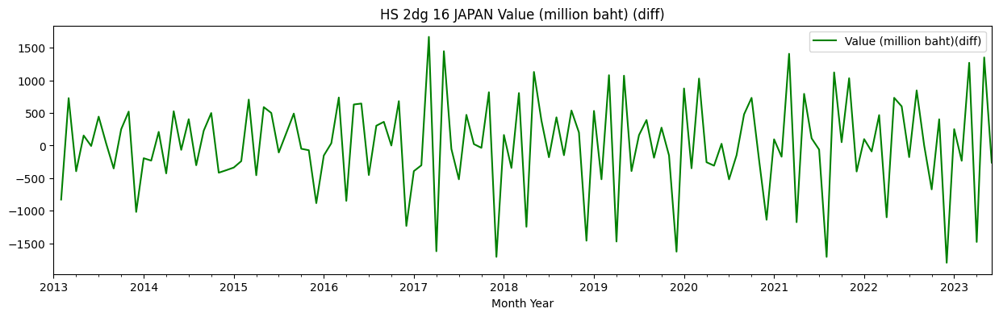

In [ ]:
#First difference
jp16_new['Value (million baht)_diff'] = jp16_new['Value (million baht)'].diff()
jp16_new['Value (million baht)_diff'].plot(color = 'green', figsize = (15,4))
plt.legend(['Value (million baht)(diff)'])
plt.title('HS 2dg 16 JAPAN Value (million baht) (diff)')

jp16_new_adf = adfuller(jp16_new['Value (million baht)_diff'].dropna(), autolag = 'AIC')
print('p-Values:' + str(jp16_new_adf[1]))

## Model 1 & LOOCV

In [ ]:
column = ['Value (million baht)_diff','Value (million baht)']
jp16_newcolumn = jp16_new[column]
jp16_newcolumn

,Value (million baht)_diff,Value (million baht)
Month Year,,
2013-01-01,NaN,5202.101584
2013-02-01,-828.565995,4373.535589
2013-03-01,726.470925,5100.006514
2013-04-01,-394.187025,4705.819489
2013-05-01,153.597664,4859.417153
...,...,...
2023-02-01,-233.821816,5435.033345
2023-03-01,1267.907829,6702.941174
2023-04-01,-1477.618623,5225.322551


In [ ]:
# แบ่งข้อมูลออกเป็น 125 rows สำหรับ training และ 1 rows สำหรับ testing
jp16_newcolumn_train = jp16_newcolumn.iloc[:125]
jp16_newcolumn_test = jp16_newcolumn.iloc[125:]

# กำหนดช่วงของลำดับ
p_range = range(0, 2)
d_range = range(0, 2)
q_range = range(0, 2)

# กำหนดช่วงของลำดับฤดูกาล
P_range = range(0, 2)
D_range = range(0, 2)
Q_range = range(0, 2)

# สร้างพจนานุกรมสำหรับเก็บค่าพารามิเตอร์
param_grid = dict(
    p=p_range,
    d=d_range,
    q=q_range,
    P=P_range,
    D=D_range,
    Q=Q_range,
)

# เลือกโมเดลที่ดีที่สุดโดยใช้ AIC
best_model_jp16 = None
best_aic_jp16 = float("inf")

for p in param_grid['p']:
    for d in param_grid['d']:
        for q in param_grid['q']:
            for P in param_grid['P']:
                for D in param_grid['D']:
                    for Q in param_grid['Q']:
                        order = (p, d, q)
                        seasonal_order = (P, D, Q, 12)

                        # สร้างโมเดล SARIMA
                        sarima_model_jp16_newcolumn = SARIMAX(jp16_newcolumn_train['Value (million baht)_diff'], order=order, seasonal_order=seasonal_order, enforce_stationarity=False)

                        # ฝึกโมเดล
                        sarima_fit_jp16_newcolumn = sarima_model_jp16_newcolumn.fit()

                        # คำนวณ AIC
                        aic = sarima_fit_jp16_newcolumn.aic

                        # บันทึกโมเดลที่มี AIC ต่ำสุด
                        if aic < best_aic_jp16:
                            best_model_jp16 = sarima_fit_jp16_newcolumn
                            best_aic_jp16 = aic
                            best_param_jp16 = (p, d, q, P, D, Q)

# แสดงค่าพารามิเตอร์ที่ดีที่สุด
print("Best Parameters:", best_param_jp16)
print("Best AIC:", best_aic_jp16)

Best Parameters: (1, 1, 1, 0, 1, 1)
Best AIC: 1500.0850057567138


In [ ]:
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error

# ทำนายค่าสำหรับชุดข้อมูลทดสอบ
y_pred_jp16 = best_model_jp16.predict(start=jp16_newcolumn_test.index[0], end=jp16_newcolumn_test.index[-1])

# คำนวณ MAE และ RMSE และ MSE
mae_jp16 = mean_absolute_error(jp16_newcolumn_test['Value (million baht)_diff'], y_pred_jp16)
rmse_jp16 = mean_squared_error(jp16_newcolumn_test['Value (million baht)_diff'], y_pred_jp16) ** 0.5
mse_jp16 = rmse_jp16 ** 2

# แสดงค่า MAE และ RMSE
print("MAE:", mae_jp16)
print("RMSE:", rmse_jp16)
print("MSE:", mse_jp16)

MAE: 182.07923975874928
RMSE: 182.07923975874928
MSE: 33152.849551124105


In [ ]:
p = d = q = range(0, 2)
pdq = list(itertools.product(p, d, q))
seasonal_pdq = [(x[0], x[1], x[2], 12) for x in list(itertools.product(p, d, q))]
print('Examples of parameter combinations for Seasonal ARIMA...')
print('SARIMAX: {} x {}'.format(pdq[1], seasonal_pdq[1]))
print('SARIMAX: {} x {}'.format(pdq[1], seasonal_pdq[2]))
print('SARIMAX: {} x {}'.format(pdq[2], seasonal_pdq[3]))
print('SARIMAX: {} x {}'.format(pdq[2], seasonal_pdq[4]))

Examples of parameter combinations for Seasonal ARIMA...
SARIMAX: (0, 0, 1) x (0, 0, 1, 12)
SARIMAX: (0, 0, 1) x (0, 1, 0, 12)
SARIMAX: (0, 1, 0) x (0, 1, 1, 12)
SARIMAX: (0, 1, 0) x (1, 0, 0, 12)


In [ ]:
for param in pdq:
    for param_seasonal in seasonal_pdq:
        try:
            mod = sm.tsa.statespace.SARIMAX(jp16_newcolumn_train['Value (million baht)_diff'],
                                            order=param,
                                            seasonal_order=param_seasonal,
                                            enforce_stationarity=False,
                                            enforce_invertibility=False)
            results = mod.fit()
            print('ARIMA{}x{}12 - AIC:{}'.format(param, param_seasonal, results.aic))
        except Exception as e:
            print(e)
            continue

ARIMA(0, 0, 0)x(0, 0, 0, 12)12 - AIC:1986.1072053660084
ARIMA(0, 0, 0)x(0, 0, 1, 12)12 - AIC:1768.628135393013
ARIMA(0, 0, 0)x(0, 1, 0, 12)12 - AIC:1749.4411979520432
ARIMA(0, 0, 0)x(0, 1, 1, 12)12 - AIC:1536.493132245413
ARIMA(0, 0, 0)x(1, 0, 0, 12)12 - AIC:1752.8294181546803
ARIMA(0, 0, 0)x(1, 0, 1, 12)12 - AIC:1717.9579590796411
ARIMA(0, 0, 0)x(1, 1, 0, 12)12 - AIC:1567.0964323542387
ARIMA(0, 0, 0)x(1, 1, 1, 12)12 - AIC:1536.0270921637086
ARIMA(0, 0, 1)x(0, 0, 0, 12)12 - AIC:1931.136076676918
ARIMA(0, 0, 1)x(0, 0, 1, 12)12 - AIC:1725.0190002147438
ARIMA(0, 0, 1)x(0, 1, 0, 12)12 - AIC:1719.423497509919
ARIMA(0, 0, 1)x(0, 1, 1, 12)12 - AIC:1504.7192175782334
ARIMA(0, 0, 1)x(1, 0, 0, 12)12 - AIC:1734.4386331016785
ARIMA(0, 0, 1)x(1, 0, 1, 12)12 - AIC:1684.853913344577
ARIMA(0, 0, 1)x(1, 1, 0, 12)12 - AIC:1556.8768483112992
ARIMA(0, 0, 1)x(1, 1, 1, 12)12 - AIC:1506.0774869250415
ARIMA(0, 1, 0)x(0, 0, 0, 12)12 - AIC:2104.5227649788067
ARIMA(0, 1, 0)x(0, 0, 1, 12)12 - AIC:1873.02805541902

In [ ]:
mod_jp16 = sm.tsa.statespace.SARIMAX(jp16_newcolumn['Value (million baht)'],
                                order=(0, 1, 1),
                                seasonal_order=(0, 1, 1, 12),
                                enforce_invertibility=False)
results_jp16 = mod_jp16.fit()
print(results_jp16.summary().tables[1])

                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.5311      0.080     -6.651      0.000      -0.688      -0.375
ma.S.L12      -1.0000      0.091    -10.956      0.000      -1.179      -0.821
sigma2      1.637e+05   5.58e-07   2.94e+11      0.000    1.64e+05    1.64e+05


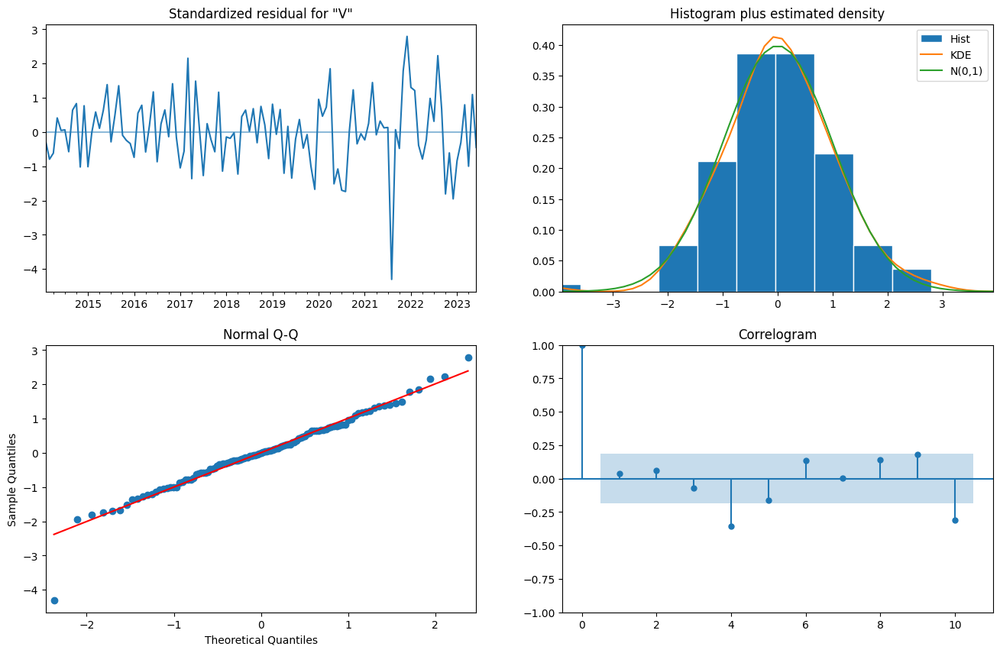

In [ ]:
results_jp16.plot_diagnostics(figsize=(16, 10))
plt.show()

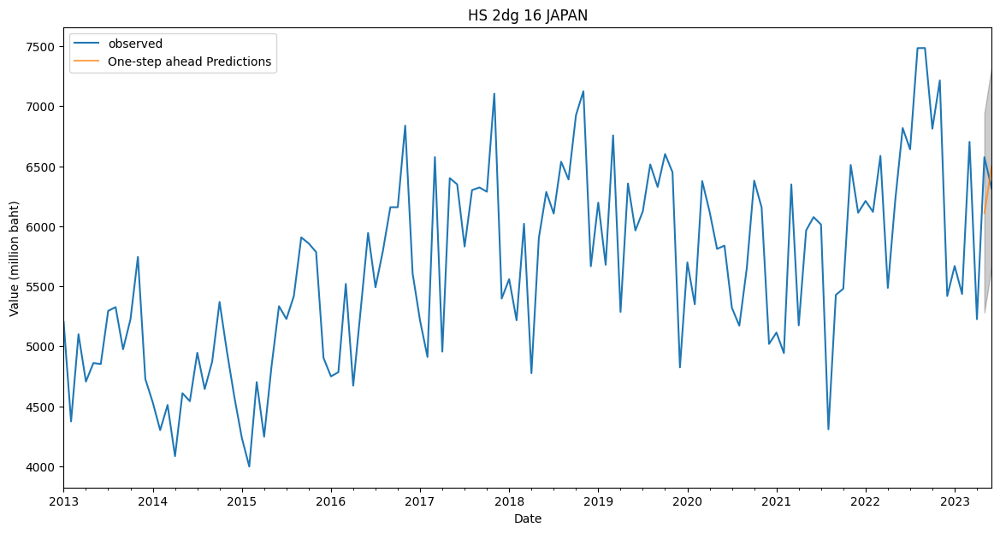

In [ ]:
pred_jp16 = results_jp16.get_prediction(start=pd.to_datetime('2023-05-01'), dynamic=False)
pred_ci_jp16 = pred_jp16.conf_int()
ax = jp16_newcolumn['Value (million baht)']['2013':].plot(label='observed')
pred_jp16.predicted_mean.plot(ax=ax, label='One-step ahead Predictions', alpha=.7, figsize=(14, 7))
ax.fill_between(pred_ci_jp16.index,
                pred_ci_jp16.iloc[:, 0],
                pred_ci_jp16.iloc[:, 1], color='k', alpha=.2)
ax.set_xlabel('Date')
ax.set_ylabel('Value (million baht)')
ax.set_title('HS 2dg 16 JAPAN')
plt.legend()
plt.show()

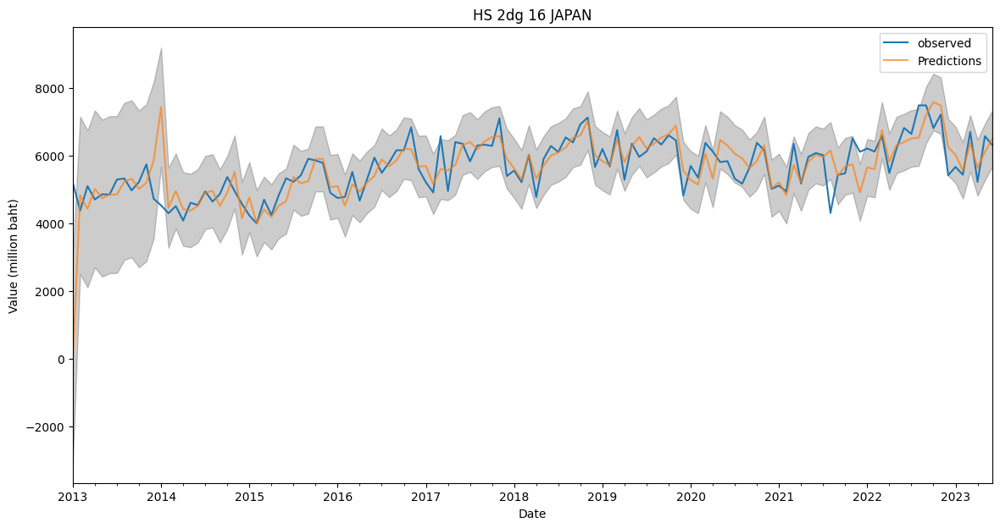

In [ ]:
pred_jp16_total = results_jp16.get_prediction(start=pd.to_datetime('2013-01-01'), dynamic=False)
pred_ci_jp16 = pred_jp16_total.conf_int()
ax = jp16_newcolumn['Value (million baht)']['2013':].plot(label='observed')
pred_jp16_total.predicted_mean.plot(ax=ax, label='Predictions', alpha=.7, figsize=(14, 7))
ax.fill_between(pred_ci_jp16.index,
                pred_ci_jp16.iloc[:, 0],
                pred_ci_jp16.iloc[:, 1], color='k', alpha=.2)
ax.set_xlabel('Date')
ax.set_ylabel('Value (million baht)')
ax.set_title('HS 2dg 16 JAPAN')
plt.legend()
plt.show()

In [ ]:
forecasted_jp16 = pred_jp16.predicted_mean
mse_jp16 = ((forecasted_jp16 - jp16_newcolumn_test['Value (million baht)']) ** 2).mean()
# forecasted_g3 = forecasted_us**(1/2)
mape_jp16 = (np.abs(jp16_newcolumn_test['Value (million baht)'] - forecasted_jp16) / np.abs(jp16_newcolumn_test['Value (million baht)'])).mean() * 100
print('The Mean Squared Error of forecasts is {}'.format(round(mse_jp16, 2)))
print('The Root Mean Squared Error of forecasts is {}'.format(round(np.sqrt(mse_jp16), 2)))
print('Mean Absolute Percentage Error (MAPE): {:.2f}%'.format(mape_jp16))

The Mean Squared Error of forecasts is 36018.8
The Root Mean Squared Error of forecasts is 189.79
Mean Absolute Percentage Error (MAPE): 3.01%


### Forecast

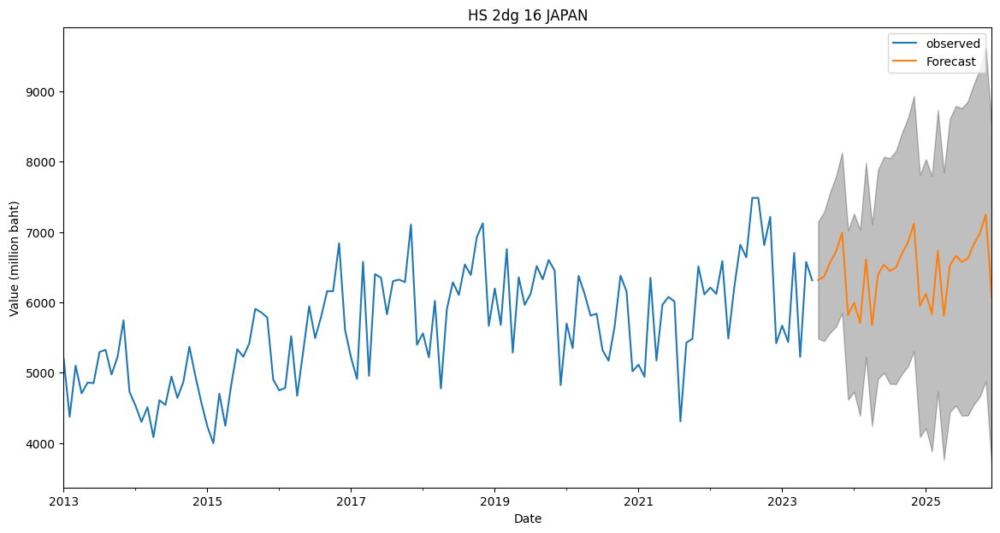

In [ ]:
pred_uc_jp16 = results_jp16.get_forecast(steps=30)
pred_ci_jp16 = pred_uc_jp16.conf_int()
ax = jp16_newcolumn['Value (million baht)'].plot(label='observed', figsize=(14, 7))
pred_uc_jp16.predicted_mean.plot(ax=ax, label='Forecast')
ax.fill_between(pred_ci_jp16.index,
                pred_ci_jp16.iloc[:, 0],
                pred_ci_jp16.iloc[:, 1], color='k', alpha=.25)
ax.set_xlabel('Date')
ax.set_ylabel('Value (million baht)')
ax.set_title('HS 2dg 16 JAPAN')
plt.legend()
plt.show()